# Setup for Figure 3 & S4A-C, E (right), G, I (Split Maze)

Note exact results for K-Means based analysis will change slightly each time. 

In [1]:
''' magic 4u'''
%load_ext autoreload
%autoreload 2

In [2]:
'''Get Stuff You Need'''
import numpy as np
import math as math
from tqdm import tnrange
from tqdm.notebook import tqdm as tdqm
import matplotlib.pyplot as plt
import matplotlib as mpl
mpl.rcParams.update(mpl.rcParamsDefault)
from matplotlib import gridspec
from scipy.interpolate import interp1d
from scipy.ndimage import gaussian_filter1d
from scipy import stats
import scipy.io
import scipy.ndimage.filters as filt
import pandas as pd
import seaborn as sns

from pipeline import get_data as get
from pipeline import process_spikes as ps

from statsmodels.tsa.stattools import acf
from scipy.signal import find_peaks
from itertools import combinations

from matplotlib import rc 
mpl.rcParams['font.sans-serif'] = 'Arial'
mpl.rcParams['font.family'] = 'sans-serif'
mpl.rcParams['svg.fonttype'] = 'none'

In [3]:
''' Load Animal Metadata '''
#adjust path

animalmeta = pd.read_csv('C:/Users/Python/Desktop/LocalData/animalmeta.csv')
animalmeta.head()

,Animal_ID,Task,Cohort,Probe_Control,Sex,Sac_Date,Frozen_Hemisphere,DOB,Age_WholeMonth,Age_ExtraDays,...,Aged_Days,Age_Group,Behavior_Sessions,Neural_Sessions,Total_Cells,visualacuity,perchangespeedgain,perchangekurt,perchangeskew,perchangeIQR
0,A3,RF,A,0,F,1/27/2021,R,4/23/2019,21,4,...,645,3,6,6,1540.0,NaN,17.367862,NaN,NaN,NaN
1,A4,RF,A,0,F,1/27/2021,R,4/23/2019,21,4,...,645,3,6,6,1574.0,NaN,22.050636,NaN,NaN,NaN
2,A5,RF,A,0,F,4/6/2021,L,4/23/2019,23,14,...,714,3,6,6,1002.0,NaN,21.328531,NaN,NaN,NaN
3,A6,RF,A,0,F,4/6/2021,R,4/23/2019,23,14,...,714,3,6,6,985.0,NaN,15.687094,NaN,NaN,NaN
4,A7,RF,A,0,F,4/19/2021,L,5/29/2019,22,21,...,691,3,6,6,1691.0,NaN,52.102357,NaN,NaN,NaN


In [4]:
'''Find names of specific animals groups'''
all_aged_mice = np.array(animalmeta.loc[(animalmeta.Age_Group == 3),'Animal_ID'])
all_MA_mice = np.array(animalmeta.loc[(animalmeta.Age_Group == 2),'Animal_ID'])
all_young_mice = np.array(animalmeta.loc[(animalmeta.Age_Group == 1),'Animal_ID'])

cohorta_mice = np.array(animalmeta.loc[(animalmeta.Cohort == 'A'),'Animal_ID'])
cohortb_mice = np.array(animalmeta.loc[(animalmeta.Cohort == 'B'),'Animal_ID'])
cohortc_mice = np.array(animalmeta.loc[(animalmeta.Cohort == 'C'),'Animal_ID'])
cohortd_mice = np.array(animalmeta.loc[(animalmeta.Cohort == 'D'),'Animal_ID'])

RF_aged_mice = np.array(animalmeta.loc[(animalmeta.Age_Group == 3) & (animalmeta.Task == 'RF'),'Animal_ID'])
RF_young_mice = np.array(animalmeta.loc[(animalmeta.Age_Group == 1) & (animalmeta.Task == 'RF'),'Animal_ID'])
SM_aged_mice = np.array(animalmeta.loc[(animalmeta.Age_Group == 3) & (animalmeta.Task == 'SM'),'Animal_ID'])
SM_MA_mice = np.array(animalmeta.loc[(animalmeta.Age_Group == 2) & (animalmeta.Task == 'SM'),'Animal_ID'])
SM_young_mice = np.array(animalmeta.loc[(animalmeta.Age_Group == 1) & (animalmeta.Task == 'SM'),'Animal_ID'])

all_female_mice = np.array(animalmeta.loc[(animalmeta.Sex == 'F'),'Animal_ID'])
all_male_mice = np.array(animalmeta.loc[(animalmeta.Sex == 'M'), 'Animal_ID'])
RF_female_mice = np.array(animalmeta.loc[(animalmeta.Sex == 'F') & (animalmeta.Task == 'RF'),'Animal_ID'])
RF_male_mice = np.array(animalmeta.loc[(animalmeta.Sex == 'M') & (animalmeta.Task == 'RF'),'Animal_ID'])
SM_female_mice = np.array(animalmeta.loc[(animalmeta.Sex == 'F') & (animalmeta.Task == 'SM'),'Animal_ID'])
SM_male_mice = np.array(animalmeta.loc[(animalmeta.Sex == 'M') & (animalmeta.Task == 'SM'),'Animal_ID'])

In [5]:
''' Complete List of Mice & Sessions for Neural Data '''
all_mice = np.array(animalmeta.Animal_ID)

all_sessions = ([['0122_record1','0123_record2','0124_record3','0125_record4','0126_record5','0127_record6'], 
             ['0122_record1','0123_record2','0124_record3','0125_record4','0126_record5','0127_record6'],
             ['0401_record1','0401_record2b','0403_record3','0404_record4','0405_record5','0406_record6'],
             ['0401_record1','0402_record2','0403_record3','0404_record4','0405_record5','0406_record6'],
             ['0414_record1','0415_record2','0416_record3','0417_record4','0418_record5','0419_record6'],
             ['1024_record1','1025_record2','1026_record3','1027_record4','1028_record5_2'], #Y2_6 excluded
             ['1016_record1','1019_record3','1020_record4','1021_record5','1022_record6'], #Y3_2 not collected
             ['1114_record1','1115_record2','1116_record3','1117_record4','1118_record5','1119_record6'], # end cohort A
             ['051822_record1','051922_record2', '052022_record3','052122_record4','052222_record5','052322_record6'], 
             ['050522_record1','050622_record2','050722_record3','050822_record4','050922_record5','051022_record6'],
             ['050522_record1','050622_record2','050722_record3','050822_record4','051022_record6'], #Y11_5 not collected
             ['062222_record3','062322_record4','062522_record5'], #Y16_1 & 2 not collected, neural _6 excluded
             ['062822_record1','062922_record2','063022_record3','070122_record4','070222_record5','070322_record6'],
             ['062022_record1','062122_record2','062222_record3','062322_record4','062522_record5','062622_record6'],
             ['062822_record1','062922_record2','063022_record3','070122_record4','070222_record5','070322_record6'], 
             ['051922_record2','052022_record3'], # Y9 051822_record excluded for syncing issue, end cohort B
             ['083022_record1','083122_record2','090122_record3'], 
             ['083022_record1','083122_record2','090122_record3','090222_record4','090322_record5','090422_record6'],
             ['083022_record1','083122_record2','090122_record3','090222_record4'], #behavior of A16_4, both of 5 excluded, 6 not collected 
             ['082322_record1','082422_record2','082522_record3','082622_record4','082722_record5','082822_record6'],
             ['082322_record1real','082422_record2','082522_record3','082622_record4','082722_record5','082822_record6'],
             ['102322_record1','102422_record2','102522_record3','102622_record4','102722_record5','102822_record6'],
             ['102322_record1','102422_record2','102522_record3','102622_record4','102722_record5','102822_record6'],
             ['102322_record1','102422_record2','102522_record3','102622_record4','102722_record5','102822_record6'],
             ['103122_record2','110122_record3','110222_record4','110322_record5rep','110422_record6','110522_record7'], #behavior of MA4M6, 7 excluded
             ['110622_record1','110722_record2','110822_record3','110922_record4','111022_record5','111122_record6'],
             ['103022_record1','103122_record2','110122_record3','110222_record4','110322_record5','110422_record6'],
             ['103022_record1','103122_record2','110122_record3','110222_record4'], #behavior of MA7_4, both 5 excluded, 6 not collected
             ['111322_record1','111422_record2','111522_record3','111622_record4','111722_record5','111822_record6'],
             ['111322_record1','111422_record2','111522_record3','111622_record4','111722_record5','111822_record6'],
             ['111322_record1','111422_record2','111522_record3','111622_record4','111722_record5','111822_record6'], 
             ['092522_record1','092622_record2','092722_record3','092822_record4','092922_record5','093022_record6'],
             ['091822_record1','091922_record2','092022_record3','092122_record4','092222_record5','092322_record6'],
             ['092522_record1','092622_record2','092722_record3','092822_record4','092922_record5','093022_record6'],
             ['092522_record1','092622_record2','092722_record3','092822_record4','092922_record5','093022_record6'],
             ['091822_record1','091922_record2','092022_record3','092122_record4','092222_record5','092322_record6'], #end cohortc
             ['012723_record2','012823_record3','012923_record4','013023_record5','013123_record6','020123_record7'],
             ['012623_record1','012723_record2','012823_record3','012923_record4','013023_record5','013123_record6'],
             ['012923_record2','013023_record3','013123_record4','020123_record5','020223_record6','020323_record7'],
             ['020923_record1','021023_record2','021123_record3','021223_record4','021323_record5','021423_record6'],
             ['022623_record1','022723_record2','022823_record3','030123_record4','030223_record5','030323_record6'],
             ['021623_record1','021723_record2','021823_record3','021923_record4','022023_record5','022123_record6'],
             ['021623_record1','021723_record2','021823_record3','021923_record4','022023_record5','022123_record6'],
             ['021623_record1','021723_record2','021823_record3','021923_record4','022023_record5rep','022123_record6'],
             ['022623_record1','022723_record2','022823_record3','030123_record4','030223_record5','030323_record6'] #end cohort d 
            ]) #list of sessions

In [6]:
'''Define which mice & sessions to load based on metadata'''
# Define mice, sessions for particular cohorts
mice , mice_ind, _  = np.intersect1d(all_mice, np.union1d(cohortc_mice, cohortd_mice), return_indices = True) # SM mice

sessions = []
for i in mice_ind:
    sessions.append(all_sessions[i])

# Make a dict to hold data
data = {}

for session, m in zip(sessions, mice):
    data[m] = {}
    
    for s in session:
        data[m][s] = {}

# Edit these paths

In [7]:
#Inputs
load_folder = 'C:/Users/Python/Desktop/LocalData/filtered/' # adjust path to match output of Import & Filter
shuffload_folder1 = 'C:/Users/Python/Desktop/Dryad/shuffle_scores/sparsity/' # adjust to match location of this Dryad repo folder
shuffload_folder2 = 'C:/Users/Python/Desktop/Dryad/shuffle_scores/coherence/' # adjust to match location of this Dryad repo folder
fig1s1_folder = 'C:/Users/Python/Desktop/LocalData/Figure1S1/' # adjust to match Figure 1/S1 output folder
figs2_folder = 'C:/Users/Python/Desktop/LocalData/FigureS2/' # adjust to match Extended Data Fig. 2 output folder
int_save_folder = 'C:/Users/Python/Desktop/LocalData/FigureS6/' # adjust to match Shuffle Procedure output plotsave_folder

#Output (create folder to hold the output of this notebook; then match the name of this repository below)
save_folder = 'C:/Users/Python/Desktop/LocalData/Figure3S4/' 

In [8]:
''' Load saved indices corresponding to quarters of the task sorted by context, excluding skipped trials ''' 

for m, session in zip(mice,sessions):
    for s in session:
        d = data[m][s]
        
        #define file names
        Aidx_file = 'Aidx_' + m + '_' + s +'.npy'
        Bidx_file = 'Bidx_' + m + '_' + s +'.npy'
        A_idx_file = 'A_idx_' + m + '_' + s +'.npy'
        B_idx_file = 'B_idx_' + m + '_' + s +'.npy'
        A_ngidx_file = 'A_idx_' + m + '_' + s +'.npy'
        B_ngidx_file = 'B_idx_' + m + '_' + s +'.npy'
        
        #load saved indices for session section
        d['Aidx'] = np.load(figs2_folder + Aidx_file)
        d['Bidx'] = np.load(figs2_folder + Bidx_file)
        d['A_idx'] = np.load(figs2_folder + A_idx_file)
        d['B_idx'] = np.load(figs2_folder + B_idx_file)
                
        d['A_ngidx'] = np.load(figs2_folder + A_ngidx_file)
        d['B_ngidx'] = np.load(figs2_folder + B_ngidx_file)
        

In [9]:
''' Generate behavioral data for blocks & alternation'''

#get lick & reward data
rewarda_centers = []
rewardb_centers = []

for m, session in zip(mice, sessions):
    for s in session:
        d = data[m][s]
 
        #load data
        rawdata_file = 'RAW_' + m + '_' + s + '.npy'
        spikes_file = 'SPIKES_' + m + '_' + s +'.npy'
        behavior_file = 'BEHAVIOR_' + m + '_' + s + '.npy'
        
        raw = np.load(load_folder + rawdata_file, allow_pickle=True)
        Y = np.load(load_folder + spikes_file, allow_pickle=False) #pre-filtered for speeds >2cm/s, position-corrected spikes, 20 ms timebins
        behaviorfil = np.load(load_folder + behavior_file, allow_pickle=False)
        
        d['reward_data'] = {}
        
        # get behavioral params
        posx = raw.item().get('posx')
        post = raw.item().get('post')
        dt = np.unique(np.round(np.diff(post),4))
        lickt = raw.item().get('lickt')
        trials_dark = np.sum(raw.item().get('trialinfo')['dark'])
        reward = raw.item().get('reward')
        reward['trials'] = np.arange(0,len(reward['trials']),1) # fixes occassional Unity error numbering of rewards 
        
        if len(dt) > 1: # discard duplicate frame entries if they occurred
            dt = dt[dt != 0]
        speed = raw.item().get('speed')
        
        # get reward params & remove reward data pertaining to dark trials & skipped trials
        try:
            _ = raw.item().get('correctedtrial').shape
            skippedtrials = get.find_skipped(trial, max_trial_num = 220)
            nonskipped = np.setdiff1d(reward['trials'],skippedtrials)   
            k_idx = np.intersect1d(np.where(reward['trials'] > trials_dark), nonskipped)
            keep_idx = np.intersect1d(np.where(reward['trials'] <= np.max(alltrial)), k_idx)
            
        except:
            skippedtrials = []
            trial = raw.item().get('trial')
            keep_idx = (np.where(reward['trials'] > trials_dark))
        
        reward_centers = np.array(reward['centers'][keep_idx])
        rewardt = reward['times'][keep_idx]
        reward_trials = reward['trials'][keep_idx]
        misses = reward['missed'][keep_idx].astype(bool)
        auto_reward = np.array(reward['auto'][keep_idx])
        #print('Mouse ' + m + ' with n_misses: ' + str(np.sum(misses)))   

        # get lick and reward indices
        lick_ct = get.spiketrain(post, dt, lickt, index=False)
        d['reward_data']['lick_ct'] = lick_ct
        #print('got lick indices for mouse ' + m + ' session ' + s)
        
        reward_idx = get.rewardtrain(post, dt, rewardt, index=True) #gets reward ct for each time binned position range as index
        d['reward_data']['reward_idx'] = reward_idx
        #print('got reward indices for mouse ' + m + ' session ' + s)
    
    # saves list of reward locations per mouse
    if reward['centers'][0] == 270:
        rewarda_centers = np.append(rewarda_centers,270)
        rewardb_centers = np.append(rewardb_centers,370)
    else:
        rewarda_centers = np.append(rewarda_centers,370)
        rewardb_centers = np.append(rewardb_centers,270)            
        
#Find & Save Number of Missed Rewards per Session & Animal
#session arrays
req_rates = []
reqa_rates = []
reqb_rates = []
reqblock_rates = []
reqalt_rates = []
reqalta_rates = []
reqaltb_rates = []
req_trials = []
reqblock_trials = []
reqalt_trials = []

#animals arrays
mreq_rates = []
mreqa_rates = []
mreqb_rates = []
mreqblock_rates = []
mreqalt_rates = []
mreqalta_rates = []
mreqaltb_rates = []

for m, session in zip(mice, sessions):
    rt = []
    ca = []
    cb = []
    blocks = []
    alt = []
    alta = []
    altb = []
    
    req = []
    reqa = []
    reqb = []
    reqblocks = []
    reqalt = []
    reqalta = []
    reqaltb = []
    
    for s in session:
        # get behavior data
        d = data[m][s]
        
        #load data
        rawdata_file = 'RAW_' + m + '_' + s + '.npy'
        spikes_file = 'SPIKES_' + m + '_' + s +'.npy'
        behavior_file = 'BEHAVIOR_' + m + '_' + s + '.npy'
        
        raw = np.load(load_folder + rawdata_file, allow_pickle=True)
        Y = np.load(load_folder + spikes_file, allow_pickle=False) #pre-filtered for speeds >2cm/s, position-corrected spikes, 20 ms timebins
        behaviorfil = np.load(load_folder + behavior_file, allow_pickle=False)
        
        posx = raw.item().get('posx')
        post = raw.item().get('post')
        dt = np.unique(np.round(np.diff(post),4))
        if len(dt) > 1: # discard duplicate frame entries if they occurred
            dt = dt[dt != 0]
        speed = raw.item().get('speed')
        
        # get reward params & remove reward data pertaining to dark trials & skipped trials
        lickt = raw.item().get('lickt')
        trials_dark = np.sum(raw.item().get('trialinfo')['dark'])
        reward = raw.item().get('reward')
        reward['trials'] = np.arange(0,len(reward['trials']),1)
        
        try:
            _ = raw.item().get('correctedtrial').shape
            skippedtrials = get.find_skipped(trial, max_trial_num = 220)
            nonskipped = np.setdiff1d(reward['trials'],skippedtrials)   
            k_idx = np.intersect1d(np.where(reward['trials'] > trials_dark), nonskipped)
            keep_idx = np.intersect1d(np.where(reward['trials'] <= np.max(alltrial)), k_idx)
            
        except:
            skippedtrials = []
            trial = raw.item().get('trial')
            keep_idx = (np.where(reward['trials'] > trials_dark))
        
        reward_centers = np.array(reward['centers'][keep_idx])
        rewarda = reward_centers[0]
        rewardb = reward_centers[60]
        rewardt = reward['times'][keep_idx]
        reward_trials = reward['trials'][keep_idx]
        misses = reward['missed'][keep_idx].astype(bool)
        requests = ~misses
        
        # find rate of requests for a given session
        req_rates.append(np.sum(requests)/len(reward_trials)) #total
        
        rewarda_idx = np.where(reward_trials < 81)[0]
        reqa_rates.append(np.sum(requests[rewarda_idx])/len(rewarda_idx)) #context a
        
        rewardb_idx = np.intersect1d((np.where(reward_trials >= 81)), (np.where(reward_trials <= 140)))
        reqb_rates.append(np.sum(requests[rewardb_idx])/len(rewardb_idx)) #context b
        
        block_idx = np.where(reward_trials < 140)[0]
        reqblock_rates.append(np.sum(requests[block_idx])/len(block_idx)) #block
        
        alt_idx = np.where(reward_trials >= 140)[0]
        reqalt_rates.append(np.sum(requests[alt_idx])/len(alt_idx)) #alt
        
        alta_idx = np.where((reward_trials >= 140) & (reward_centers == rewarda))[0] 
        reqalta_rates.append(np.mean(requests[alta_idx]))
        
        altb_idx = np.where((reward_trials >= 140) & (reward_centers == rewardb))[0]
        reqaltb_rates.append(np.mean(requests[altb_idx]))
        
        rt = np.append(rt,len(reward_trials))
        ca = np.append(ca,len(rewarda_idx))
        cb = np.append(cb,len(rewardb_idx))
        blocks = np.append(blocks,len(block_idx))
        alt = np.append(alt,len(alt_idx))
        alta = np.append(alta, len(alta_idx))
        altb = np.append(altb, len(altb_idx))
        
        req_trials = np.append(req_trials, len(reward_trials))
        reqblock_trials = np.append(reqblock_trials, len(block_idx))
        reqalt_trials = np.append(reqalt_trials, len(alt_idx))
        
        d['altreqbytrial'] = requests[alt_idx]
        
        req = np.append(req,np.sum(requests))
        reqa = np.append(reqa,np.sum(requests[rewarda_idx]))
        reqb = np.append(reqb,np.sum(requests[rewardb_idx]))
        reqblocks = np.append(reqblocks,np.sum(requests[block_idx]))
        reqalt = np.append(reqalt,np.sum(requests[alt_idx]))
        reqalta = np.append(reqalta,requests[alta_idx])
        reqaltb = np.append(reqaltb,requests[altb_idx])
     
    # get mouse request rate collapsing days
    mreqrate = np.sum(req)/ np.sum(rt)
    mreq_rates = np.append(mreq_rates,mreqrate)
    
    mreqarate = np.sum(reqa) / np.sum(ca)
    mreqa_rates = np.append(mreqa_rates, mreqarate)
    
    mreqbrate = np.sum(reqb) / np.sum(cb)
    mreqb_rates = np.append(mreqb_rates, mreqbrate)
    
    mreqblockrate = np.sum(reqblocks) / np.sum(blocks)
    mreqblock_rates = np.append(mreqblock_rates, mreqblockrate)
    
    mreqaltrate = np.sum(reqalt) / np.sum(alt)
    mreqalt_rates = np.append(mreqalt_rates, mreqaltrate)
    
    mreqalta_rates = np.append(mreqalta_rates, np.mean(reqalta))
    mreqaltb_rates = np.append(mreqaltb_rates, np.mean(reqaltb))
    
# save as arrays to be safe
req_rates = np.asarray(req_rates)
reqa_rates = np.asarray(reqa_rates)
reqb_rates = np.asarray(reqb_rates)
reqblock_rates = np.asarray(reqblock_rates)
reqalt_rates = np.asarray(reqalt_rates)
reqalta_rates = np.asarray(reqalta_rates)
reqaltb_rates = np.asarray(reqaltb_rates)

mreq_rates = np.asarray(mreq_rates)
mreqa_rates = np.asarray(mreqa_rates)
mreqb_rates = np.asarray(mreqb_rates)
mreqblock_rates = np.asarray(mreqblock_rates)
mreqalt_rates = np.asarray(mreqalt_rates)
mreqalta_rates = np.asarray(reqalta_rates)
mreqaltb_rates = np.asarray(reqaltb_rates)

In [10]:
''' Load spatial cell (Figure 2/S3) and intn (Shuffle Procedure) booleans generated by previous notebooks. '''

for m, session in zip(mice, sessions):
    for s in tdqm(session):
        d = data[m][s]
        
        #get file names
        spatialcell99_file = 'spatialcell99_' + m + '_' + s + '.npy'
        intn_file = 'intn_' + m + '_' + s + '.npy'

        #load stuff
        d['spatialcell99'] = np.load(figs2_folder + spatialcell99_file, allow_pickle = True)
        d['intn'] = np.load(int_save_folder + intn_file, allow_pickle = True)

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

In [11]:
''' Load saved grid & ngs cell booleans generated by Figure 2 / S3 notebook '''

pergrid = []
perngs = []

spergrid = []
sperngs = []
mpergrid = []

for m, session in zip(mice,sessions):
    
    m_pergrid = []
    m_cells = []
    
    for s in tdqm(session):
        d = data[m][s]
        
        #load in data
        rawdata_file = 'RAW_' + m + '_' + s + '.npy'
        raw = np.load(load_folder + rawdata_file, allow_pickle=True)
        cell_IDs = raw.item().get('cellsfil')
        
        #load all grid cell boolean
        gridcell_file = 'gridcell__' + m + '_' + s + '.npy'
        gridcell = np.load(figs2_folder + gridcell_file)
        
        ngscell_file = 'bordercell__' + m + '_' + s + '.npy'
        ngscell = np.load(figs2_folder + ngscell_file)
        
        gridcell = gridcell.astype(bool)
        ngscell = ngscell.astype(bool)
        d['gridcell'] = gridcell
        d['ngscell'] = ngscell
        
        print(m + ', ' + s + ' n grid, ngs cells: '+ str(np.sum(gridcell)) + ' , ' + str(np.sum(ngscell)))
        perngs = np.append(perngs, 100*np.sum(ngscell)/len(cell_IDs))
        pergrid = np.append(pergrid, 100*np.sum(gridcell)/len(cell_IDs))
        
        sperngs = np.append(sperngs, 100*np.sum(ngscell)/len(cell_IDs))
        spergrid = np.append(spergrid, 100*np.sum(gridcell)/len(cell_IDs))
        m_pergrid = np.append(m_pergrid, np.sum(gridcell))
        m_cells = np.append(m_cells, len(cell_IDs))
        
    
    mpergrid = np.append(mpergrid, np.sum(m_pergrid)/np.sum(m_cells)*100)

  0%|          | 0/3 [00:00<?, ?it/s]

A14, 083022_record1 n grid, ngs cells: 8 , 50
A14, 083122_record2 n grid, ngs cells: 35 , 2
A14, 090122_record3 n grid, ngs cells: 17 , 13


  0%|          | 0/6 [00:00<?, ?it/s]

A15, 083022_record1 n grid, ngs cells: 4 , 6
A15, 083122_record2 n grid, ngs cells: 86 , 33
A15, 090122_record3 n grid, ngs cells: 89 , 37
A15, 090222_record4 n grid, ngs cells: 128 , 65
A15, 090322_record5 n grid, ngs cells: 37 , 30
A15, 090422_record6 n grid, ngs cells: 24 , 19


  0%|          | 0/4 [00:00<?, ?it/s]

A16, 083022_record1 n grid, ngs cells: 19 , 23
A16, 083122_record2 n grid, ngs cells: 60 , 36
A16, 090122_record3 n grid, ngs cells: 0 , 1
A16, 090222_record4 n grid, ngs cells: 12 , 42


  0%|          | 0/6 [00:00<?, ?it/s]

A17, 082322_record1 n grid, ngs cells: 1 , 2
A17, 082422_record2 n grid, ngs cells: 2 , 6
A17, 082522_record3 n grid, ngs cells: 40 , 35
A17, 082622_record4 n grid, ngs cells: 42 , 17
A17, 082722_record5 n grid, ngs cells: 32 , 21
A17, 082822_record6 n grid, ngs cells: 54 , 25


  0%|          | 0/6 [00:00<?, ?it/s]

A18, 082322_record1real n grid, ngs cells: 13 , 10
A18, 082422_record2 n grid, ngs cells: 66 , 169
A18, 082522_record3 n grid, ngs cells: 68 , 117
A18, 082622_record4 n grid, ngs cells: 44 , 64
A18, 082722_record5 n grid, ngs cells: 47 , 10
A18, 082822_record6 n grid, ngs cells: 0 , 5


  0%|          | 0/6 [00:00<?, ?it/s]

A19, 012723_record2 n grid, ngs cells: 17 , 1
A19, 012823_record3 n grid, ngs cells: 22 , 75
A19, 012923_record4 n grid, ngs cells: 34 , 64
A19, 013023_record5 n grid, ngs cells: 54 , 38
A19, 013123_record6 n grid, ngs cells: 35 , 18
A19, 020123_record7 n grid, ngs cells: 54 , 31


  0%|          | 0/6 [00:00<?, ?it/s]

A20, 012623_record1 n grid, ngs cells: 3 , 18
A20, 012723_record2 n grid, ngs cells: 24 , 50
A20, 012823_record3 n grid, ngs cells: 69 , 56
A20, 012923_record4 n grid, ngs cells: 21 , 42
A20, 013023_record5 n grid, ngs cells: 22 , 55
A20, 013123_record6 n grid, ngs cells: 9 , 32


  0%|          | 0/6 [00:00<?, ?it/s]

A22, 012923_record2 n grid, ngs cells: 58 , 39
A22, 013023_record3 n grid, ngs cells: 79 , 122
A22, 013123_record4 n grid, ngs cells: 55 , 46
A22, 020123_record5 n grid, ngs cells: 10 , 12
A22, 020223_record6 n grid, ngs cells: 31 , 38
A22, 020323_record7 n grid, ngs cells: 12 , 5


  0%|          | 0/6 [00:00<?, ?it/s]

A23, 020923_record1 n grid, ngs cells: 4 , 10
A23, 021023_record2 n grid, ngs cells: 27 , 63
A23, 021123_record3 n grid, ngs cells: 29 , 66
A23, 021223_record4 n grid, ngs cells: 9 , 3
A23, 021323_record5 n grid, ngs cells: 27 , 38
A23, 021423_record6 n grid, ngs cells: 50 , 54


  0%|          | 0/6 [00:00<?, ?it/s]

A24, 022623_record1 n grid, ngs cells: 41 , 34
A24, 022723_record2 n grid, ngs cells: 108 , 65
A24, 022823_record3 n grid, ngs cells: 61 , 63
A24, 030123_record4 n grid, ngs cells: 66 , 37
A24, 030223_record5 n grid, ngs cells: 53 , 26
A24, 030323_record6 n grid, ngs cells: 20 , 19


  0%|          | 0/6 [00:00<?, ?it/s]

MA10F, 111322_record1 n grid, ngs cells: 69 , 91
MA10F, 111422_record2 n grid, ngs cells: 52 , 48
MA10F, 111522_record3 n grid, ngs cells: 38 , 24
MA10F, 111622_record4 n grid, ngs cells: 19 , 24
MA10F, 111722_record5 n grid, ngs cells: 17 , 28
MA10F, 111822_record6 n grid, ngs cells: 39 , 61


  0%|          | 0/6 [00:00<?, ?it/s]

MA1F, 102322_record1 n grid, ngs cells: 33 , 25
MA1F, 102422_record2 n grid, ngs cells: 53 , 28
MA1F, 102522_record3 n grid, ngs cells: 48 , 21
MA1F, 102622_record4 n grid, ngs cells: 9 , 8
MA1F, 102722_record5 n grid, ngs cells: 71 , 52
MA1F, 102822_record6 n grid, ngs cells: 72 , 28


  0%|          | 0/6 [00:00<?, ?it/s]

MA2F, 102322_record1 n grid, ngs cells: 47 , 76
MA2F, 102422_record2 n grid, ngs cells: 38 , 103
MA2F, 102522_record3 n grid, ngs cells: 50 , 110
MA2F, 102622_record4 n grid, ngs cells: 39 , 65
MA2F, 102722_record5 n grid, ngs cells: 38 , 43
MA2F, 102822_record6 n grid, ngs cells: 40 , 49


  0%|          | 0/6 [00:00<?, ?it/s]

MA3M, 102322_record1 n grid, ngs cells: 6 , 22
MA3M, 102422_record2 n grid, ngs cells: 28 , 53
MA3M, 102522_record3 n grid, ngs cells: 36 , 47
MA3M, 102622_record4 n grid, ngs cells: 13 , 55
MA3M, 102722_record5 n grid, ngs cells: 12 , 30
MA3M, 102822_record6 n grid, ngs cells: 31 , 39


  0%|          | 0/6 [00:00<?, ?it/s]

MA4M, 103122_record2 n grid, ngs cells: 24 , 68
MA4M, 110122_record3 n grid, ngs cells: 29 , 27
MA4M, 110222_record4 n grid, ngs cells: 8 , 13
MA4M, 110322_record5rep n grid, ngs cells: 26 , 18
MA4M, 110422_record6 n grid, ngs cells: 36 , 35
MA4M, 110522_record7 n grid, ngs cells: 12 , 9


  0%|          | 0/6 [00:00<?, ?it/s]

MA5M, 110622_record1 n grid, ngs cells: 58 , 30
MA5M, 110722_record2 n grid, ngs cells: 62 , 55
MA5M, 110822_record3 n grid, ngs cells: 79 , 30
MA5M, 110922_record4 n grid, ngs cells: 7 , 11
MA5M, 111022_record5 n grid, ngs cells: 23 , 25
MA5M, 111122_record6 n grid, ngs cells: 22 , 23


  0%|          | 0/6 [00:00<?, ?it/s]

MA6M, 103022_record1 n grid, ngs cells: 22 , 75
MA6M, 103122_record2 n grid, ngs cells: 17 , 39
MA6M, 110122_record3 n grid, ngs cells: 64 , 66
MA6M, 110222_record4 n grid, ngs cells: 7 , 13
MA6M, 110322_record5 n grid, ngs cells: 10 , 6
MA6M, 110422_record6 n grid, ngs cells: 39 , 31


  0%|          | 0/4 [00:00<?, ?it/s]

MA7M, 103022_record1 n grid, ngs cells: 31 , 36
MA7M, 103122_record2 n grid, ngs cells: 32 , 56
MA7M, 110122_record3 n grid, ngs cells: 19 , 28
MA7M, 110222_record4 n grid, ngs cells: 7 , 7


  0%|          | 0/6 [00:00<?, ?it/s]

MA8F, 111322_record1 n grid, ngs cells: 19 , 8
MA8F, 111422_record2 n grid, ngs cells: 62 , 67
MA8F, 111522_record3 n grid, ngs cells: 80 , 26
MA8F, 111622_record4 n grid, ngs cells: 25 , 37
MA8F, 111722_record5 n grid, ngs cells: 10 , 29
MA8F, 111822_record6 n grid, ngs cells: 12 , 20


  0%|          | 0/6 [00:00<?, ?it/s]

MA9F, 111322_record1 n grid, ngs cells: 56 , 29
MA9F, 111422_record2 n grid, ngs cells: 73 , 169
MA9F, 111522_record3 n grid, ngs cells: 119 , 80
MA9F, 111622_record4 n grid, ngs cells: 0 , 1
MA9F, 111722_record5 n grid, ngs cells: 24 , 34
MA9F, 111822_record6 n grid, ngs cells: 23 , 16


  0%|          | 0/6 [00:00<?, ?it/s]

Y20, 092522_record1 n grid, ngs cells: 7 , 7
Y20, 092622_record2 n grid, ngs cells: 32 , 39
Y20, 092722_record3 n grid, ngs cells: 13 , 10
Y20, 092822_record4 n grid, ngs cells: 51 , 33
Y20, 092922_record5 n grid, ngs cells: 19 , 14
Y20, 093022_record6 n grid, ngs cells: 85 , 64


  0%|          | 0/6 [00:00<?, ?it/s]

Y21, 091822_record1 n grid, ngs cells: 103 , 76
Y21, 091922_record2 n grid, ngs cells: 80 , 93
Y21, 092022_record3 n grid, ngs cells: 49 , 23
Y21, 092122_record4 n grid, ngs cells: 60 , 62
Y21, 092222_record5 n grid, ngs cells: 42 , 50
Y21, 092322_record6 n grid, ngs cells: 8 , 21


  0%|          | 0/6 [00:00<?, ?it/s]

Y22, 092522_record1 n grid, ngs cells: 85 , 57
Y22, 092622_record2 n grid, ngs cells: 146 , 66
Y22, 092722_record3 n grid, ngs cells: 60 , 84
Y22, 092822_record4 n grid, ngs cells: 24 , 21
Y22, 092922_record5 n grid, ngs cells: 20 , 25
Y22, 093022_record6 n grid, ngs cells: 60 , 36


  0%|          | 0/6 [00:00<?, ?it/s]

Y23, 092522_record1 n grid, ngs cells: 38 , 27
Y23, 092622_record2 n grid, ngs cells: 33 , 23
Y23, 092722_record3 n grid, ngs cells: 30 , 40
Y23, 092822_record4 n grid, ngs cells: 26 , 32
Y23, 092922_record5 n grid, ngs cells: 41 , 49
Y23, 093022_record6 n grid, ngs cells: 60 , 84


  0%|          | 0/6 [00:00<?, ?it/s]

Y24, 091822_record1 n grid, ngs cells: 91 , 64
Y24, 091922_record2 n grid, ngs cells: 28 , 69
Y24, 092022_record3 n grid, ngs cells: 97 , 49
Y24, 092122_record4 n grid, ngs cells: 94 , 64
Y24, 092222_record5 n grid, ngs cells: 66 , 44
Y24, 092322_record6 n grid, ngs cells: 70 , 43


  0%|          | 0/6 [00:00<?, ?it/s]

Y25, 021623_record1 n grid, ngs cells: 0 , 1
Y25, 021723_record2 n grid, ngs cells: 85 , 37
Y25, 021823_record3 n grid, ngs cells: 29 , 64
Y25, 021923_record4 n grid, ngs cells: 38 , 49
Y25, 022023_record5 n grid, ngs cells: 49 , 46
Y25, 022123_record6 n grid, ngs cells: 18 , 17


  0%|          | 0/6 [00:00<?, ?it/s]

Y26, 021623_record1 n grid, ngs cells: 34 , 47
Y26, 021723_record2 n grid, ngs cells: 51 , 22
Y26, 021823_record3 n grid, ngs cells: 23 , 32
Y26, 021923_record4 n grid, ngs cells: 2 , 2
Y26, 022023_record5 n grid, ngs cells: 17 , 19
Y26, 022123_record6 n grid, ngs cells: 4 , 3


  0%|          | 0/6 [00:00<?, ?it/s]

Y27, 021623_record1 n grid, ngs cells: 53 , 44
Y27, 021723_record2 n grid, ngs cells: 39 , 17
Y27, 021823_record3 n grid, ngs cells: 31 , 18
Y27, 021923_record4 n grid, ngs cells: 19 , 20
Y27, 022023_record5rep n grid, ngs cells: 48 , 26
Y27, 022123_record6 n grid, ngs cells: 65 , 30


  0%|          | 0/6 [00:00<?, ?it/s]

Y28, 022623_record1 n grid, ngs cells: 4 , 32
Y28, 022723_record2 n grid, ngs cells: 41 , 58
Y28, 022823_record3 n grid, ngs cells: 48 , 45
Y28, 030123_record4 n grid, ngs cells: 20 , 33
Y28, 030223_record5 n grid, ngs cells: 40 , 75
Y28, 030323_record6 n grid, ngs cells: 65 , 48


In [12]:
'''Get Indices of Stored Session, Animal Data Mice by Age Group'''

age_ind = []
ma_ind = []
y_ind = []
age_sind = []
ma_sind = []
y_sind = []

s_count = 0
for m, s in zip(mice, sessions):
    start = s_count
    end = len(s) + s_count

    if m in all_aged_mice:
        age_ind = np.append(age_ind, (np.where(mice == m)[0]))
        age_sind = np.append(age_sind, np.arange(start, end, 1))
    elif m in all_MA_mice:
        ma_ind = np.append(ma_ind, (np.where(mice == m)[0]))
        ma_sind = np.append(ma_sind, np.arange(start, end, 1))
    else:
        y_ind = np.append(y_ind, (np.where(mice == m)[0]))
        y_sind = np.append(y_sind, np.arange(start, end, 1))
                            
    s_count += len(s)
    
age_ind = age_ind.astype(int)
ma_ind = ma_ind.astype(int)
y_ind = y_ind.astype(int)
age_sind = age_sind.astype(int)
ma_sind = ma_sind.astype(int)
y_sind = y_sind.astype(int)

print(mice[y_ind], mice[ma_ind], mice[age_ind])
print(len(mice[y_ind]), len(mice[ma_ind]), len(mice[age_ind]))
print(len(y_sind), len(ma_sind), len(age_sind))
Nold = len(mice[age_ind])
Nma = len(mice[ma_ind])
Nyoung = len(mice[y_ind])

['Y20' 'Y21' 'Y22' 'Y23' 'Y24' 'Y25' 'Y26' 'Y27' 'Y28'] ['MA10F' 'MA1F' 'MA2F' 'MA3M' 'MA4M' 'MA5M' 'MA6M' 'MA7M' 'MA8F' 'MA9F'] ['A14' 'A15' 'A16' 'A17' 'A18' 'A19' 'A20' 'A22' 'A23' 'A24']
9 10 10
54 58 55


In [13]:
''' Define ColorMaps for Session & Animal Boxplots '''
import matplotlib.pylab as pl
import matplotlib.lines as mlines

col_animal_old = pl.cm.Oranges([np.linspace(0.2,0.9,10)])
col_animal_MA = pl.cm.Greens([np.linspace(0.2,0.9,10)])
col_animal_young = pl.cm.Blues([np.linspace(0.2,0.9,9)])
col_animal = [col_animal_young, col_animal_MA, col_animal_old]

col_session_young = []
col_session_MA = []
col_session_old = []

for m, session in zip(mice, sessions):
    for s in range(0,len(session)):
        
        if m in SM_aged_mice:
            idx = np.where(mice == m)[0][0] 
            col_session_old.append(col_animal[2][0][idx])           
        elif m in SM_MA_mice:
            idx = np.where(mice == m)[0][0] - Nold
            col_session_MA.append(col_animal[1][0][idx])
        else:
            idx = np.where(mice == m)[0][0] - (Nold + Nma)
            col_session_young.append(col_animal[0][0][idx])

col_session = [col_session_young, col_session_MA, col_session_old]
label_mice = ['Y20', 'Y21', 'Y22', 'Y23', 'Y24', 'Y25', 'Y26', 'Y27', 'Y28', "",
              'MA10F', 'MA1F', 'MA2F', 'MA3M', 'MA4M', 'MA5M', 'MA6M', 'MA7M', 'MA8F', 'MA9F',
              'A14', 'A15', 'A16', 'A17', 'A18', 'A19', 'A20', 'A22', 'A23', 'A24']

# Compute OR Load computed Grid FR Tensor (choose either cell below) 

In [15]:
''' Compute & Save Sorted Normalized FR Tensor for Grid Network in Back of Track, excluding Gain Change Period '''

from scipy.spatial.distance import pdist
from scipy.spatial.distance import squareform

dt = 0.02

for m, session in zip(mice, sessions):
    for s in tdqm(session):
        d = data[m][s]
        
        #get some data & cell IDs
        rawdata_file = 'RAW_' + m + '_' + s + '.npy'
        spikes_file = 'SPIKES_' + m + '_' + s +'.npy'
        behavior_file = 'BEHAVIOR_' + m + '_' + s + '.npy'
        
        raw = np.load(load_folder + rawdata_file, allow_pickle=True)
        Y = np.load(load_folder + spikes_file, allow_pickle=False) #pre-filtered for speeds >2cm/s, position-corrected spikes, 20 ms timebins
        behaviorfil = np.load(load_folder + behavior_file, allow_pickle=False)
        
        cell_IDs = raw.item().get('cellsfil')
        spatialcell99 = d['spatialcell99']
        spatialcells = cell_IDs[spatialcell99]
        gridcell = d['gridcell'].astype(bool)
        gridcells = cell_IDs[gridcell]     
        
        posx = behaviorfil[:,0]
        trial = behaviorfil[:,2]
        rawtrialfil = raw.item().get('trialfil')
        
        #Find any skipped trials
        try:
            _ = raw.item().get('correctedtrial').shape
            skippedtrials = get.find_skipped(trial, max_trial_num = 220)
            
        except:
            skippedtrials = []
        
        if np.max(np.unique(trial)) < 160: #handles truncated, shorter sessions 
            alltrial = np.arange(0, np.max(np.unique(trial)) + 2, 1)
        else:
            alltrial = np.arange(0,220,1)

        # Load in left vs. right info
        trials = np.unique(trial)
        trialinfo = raw.item().get('trialinfo')
        left = trialinfo['left']
        
        # Sort trials by context, find sorted skipped trials, num dark skipped trials
        leftsort, allcopy = get.contextsortedtrials(alltrial, left, alt_idx = 140)
        
        newskippedtrials = []
        for z in skippedtrials:
            newskippedtrials = np.append(newskippedtrials, np.where(allcopy == z)[0][0])

        ndarkskipped = 0
        for z in newskippedtrials:
            if z < 20: 
                ndarkskipped += 1
                
        #adjust trialfil so that sorted trials are skipped instead
        skippedrawtrialfil = get.sortedtrialbyframe(rawtrialfil, trial, newskippedtrials)
        numtrial = np.unique(skippedrawtrialfil)

        #sort spike train & position on VR frames by context during alternation
        posxcopy = []
        allcopy= np.append(allcopy, 220)
        for t in allcopy:
            obs_idx = np.where(trial == t)[0]
            posxcopy = np.append(posxcopy, posx[obs_idx])
            if t == 0:
                Z = Y[obs_idx,:]
            else: 
                Z = np.append(Z, Y[obs_idx,:], axis = 0)

        #binary context vector, excluding skipped trials, dark, & gain periods, 1 = Map A
        context = []
        for i, t in enumerate(np.unique(skippedrawtrialfil)):
            if t < 220:
                context = np.append(context, leftsort[t.astype(int)])
            
        #remove dark & trial 220 dataframes     
        start_idx = (np.where(skippedrawtrialfil >= 20)[0][0]).astype(int)
        if np.max(skippedrawtrialfil) > 200:
            end_idx = (np.where(skippedrawtrialfil >= 200)[0][0])
        else:
            end_idx = len(skippedrawtrialfil) + 1

        #divide observations into front and back halves
        frontidx = np.where(posxcopy < 200)[0].astype(int)
        backidx = np.where(posxcopy >= 200)[0].astype(int)
        VRidx = np.arange(start_idx, end_idx, 1)
        VRfrontidx = np.intersect1d(VRidx, frontidx)
        VRbackidx = np.intersect1d(VRidx, backidx)
        
        d['VRbackidx'] = VRbackidx
        VRbackidx_file = 'VRbackidx_' + m + '_' + s + '.npy'
        np.save(save_folder + VRbackidx_file, VRbackidx)
        
        d['skippedrawtrialfil'] = skippedrawtrialfil
        skippedrawtrialfil_file = 'skippedrawtrialfil_' + m + '_' + s + '.npy'
        np.save(save_folder + skippedrawtrialfil_file, skippedrawtrialfil)
        
        #get smoothed by trial FR matrix excluding dark period sorted by context using front half of track
        normFR, _, _ = ps.tuning_curve_bytrial(posxcopy[VRbackidx], skippedrawtrialfil[VRbackidx], Z[VRbackidx,:], dt, sigma = 5, b=2, smooth=True, normalize=True, occupancy=True)
        
        #get & plot similarity matrix for all grid spatial cells
        gridcell = d['gridcell'].astype(bool)
        gridcells = cell_IDs[gridcell]
        
        sdx = []
        for i, c in enumerate(gridcells):
            sd = (np.where(cell_IDs == c)[0][0]).astype(int)
            sdx.append(sd)
            
        normspatialgridFR = normFR[:,:,sdx] 
        
        if len(gridcells) >= 10:
            #save grid network FR tensor 
            d['FRtensorbacksorted'] = normspatialgridFR
            FRtensor_file = 'SM_FRtensorbacksorted_' + m + '_' + s + '.npy'
            np.save(save_folder + FRtensor_file, d['FRtensorbacksorted'])
            
            #save grid network trial by trial sim matrix 
            normspatialgridFR_unwrapped = np.reshape(normspatialgridFR, (normspatialgridFR.shape[0], -1))
            sim_vec = np.abs(pdist(normspatialgridFR_unwrapped, 'correlation')-1)
            sim = squareform(sim_vec)  
            d['gridsimilaritybacksorted'] = sim
        else:
            print('too few grid cells in session: ' + str(m) + ', ' + str(s))

  0%|          | 0/3 [00:00<?, ?it/s]

too few grid cells in session: A14, 083022_record1


  0%|          | 0/6 [00:00<?, ?it/s]

too few grid cells in session: A15, 083022_record1


  0%|          | 0/4 [00:00<?, ?it/s]

too few grid cells in session: A16, 090122_record3


  0%|          | 0/6 [00:00<?, ?it/s]

too few grid cells in session: A17, 082322_record1
too few grid cells in session: A17, 082422_record2


  0%|          | 0/6 [00:00<?, ?it/s]

too few grid cells in session: A18, 082822_record6


  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

too few grid cells in session: A20, 012623_record1
too few grid cells in session: A20, 013123_record6


  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

too few grid cells in session: A23, 020923_record1
too few grid cells in session: A23, 021223_record4


  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

too few grid cells in session: MA1F, 102622_record4


  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

too few grid cells in session: MA3M, 102322_record1


  0%|          | 0/6 [00:00<?, ?it/s]

too few grid cells in session: MA4M, 110222_record4


  0%|          | 0/6 [00:00<?, ?it/s]

too few grid cells in session: MA5M, 110922_record4


C:\Users\Python\Desktop\GitHub\Herber2024\pipeline\process_spikes.py:358: RuntimeWarning: invalid value encountered in divide
  firing_rate[:, :, c] = (firing_rate[:, :, c] - np.min(firing_rate[:, :, c]))/np.max(firing_rate[:, :, c] - np.min(firing_rate[:, :, c]))


  0%|          | 0/6 [00:00<?, ?it/s]

too few grid cells in session: MA6M, 110222_record4


  0%|          | 0/4 [00:00<?, ?it/s]

too few grid cells in session: MA7M, 110222_record4


  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

too few grid cells in session: MA9F, 111622_record4


  0%|          | 0/6 [00:00<?, ?it/s]

too few grid cells in session: Y20, 092522_record1


  0%|          | 0/6 [00:00<?, ?it/s]

too few grid cells in session: Y21, 092322_record6


  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

too few grid cells in session: Y25, 021623_record1


  0%|          | 0/6 [00:00<?, ?it/s]

too few grid cells in session: Y26, 021923_record4
too few grid cells in session: Y26, 022123_record6


  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

too few grid cells in session: Y28, 022623_record1


In [14]:
''' Load Sorted Normalized FR Tensor for Grid Network in Back of Track, excluding Gain Change Period '''

from scipy.spatial.distance import pdist
from scipy.spatial.distance import squareform

dt = 0.02

for m, session in zip(mice, sessions):
    for s in tdqm(session):
        d = data[m][s]
         
        VRbackidx_file = 'VRbackidx_' + m + '_' + s + '.npy'
        VRbackidx = np.load(save_folder + VRbackidx_file)
        d['VRbackidx'] = VRbackidx
        
        skippedrawtrialfil_file = 'skippedrawtrialfil_' + m + '_' + s + '.npy'
        skippedrawtrialfil = np.load(save_folder + skippedrawtrialfil_file)
        d['skippedrawtrialfil'] = skippedrawtrialfil
        
        #get some data & cell IDs
        rawdata_file = 'RAW_' + m + '_' + s + '.npy'
        raw = np.load(load_folder + rawdata_file, allow_pickle=True)
        
        cell_IDs = raw.item().get('cellsfil')
        gridcell = d['gridcell'].astype(bool)
        gridcells = cell_IDs[gridcell]     
        
        if len(gridcells) >= 10:
            #load grid network FR tensor 
            FRtensor_file = 'SM_FRtensorbacksorted_' + m + '_' + s + '.npy'
            normspatialgridFR = np.load(save_folder + FRtensor_file)
            d['FRtensorbacksorted'] = normspatialgridFR 
            
            #get grid network trial by trial sim matrix 
            normspatialgridFR_unwrapped = np.reshape(normspatialgridFR, (normspatialgridFR.shape[0], -1))
            sim_vec = np.abs(pdist(normspatialgridFR_unwrapped, 'correlation')-1)
            sim = squareform(sim_vec)  
            d['gridsimilaritybacksorted'] = sim
        else:
            print('too few grid cells in session: ' + str(m) + ', ' + str(s))

  0%|          | 0/3 [00:00<?, ?it/s]

too few grid cells in session: A14, 083022_record1


  0%|          | 0/6 [00:00<?, ?it/s]

too few grid cells in session: A15, 083022_record1


  0%|          | 0/4 [00:00<?, ?it/s]

too few grid cells in session: A16, 090122_record3


  0%|          | 0/6 [00:00<?, ?it/s]

too few grid cells in session: A17, 082322_record1
too few grid cells in session: A17, 082422_record2


  0%|          | 0/6 [00:00<?, ?it/s]

too few grid cells in session: A18, 082822_record6


  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

too few grid cells in session: A20, 012623_record1
too few grid cells in session: A20, 013123_record6


  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

too few grid cells in session: A23, 020923_record1
too few grid cells in session: A23, 021223_record4


  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

too few grid cells in session: MA1F, 102622_record4


  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

too few grid cells in session: MA3M, 102322_record1


  0%|          | 0/6 [00:00<?, ?it/s]

too few grid cells in session: MA4M, 110222_record4


  0%|          | 0/6 [00:00<?, ?it/s]

too few grid cells in session: MA5M, 110922_record4


  0%|          | 0/6 [00:00<?, ?it/s]

too few grid cells in session: MA6M, 110222_record4


  0%|          | 0/4 [00:00<?, ?it/s]

too few grid cells in session: MA7M, 110222_record4


  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

too few grid cells in session: MA9F, 111622_record4


  0%|          | 0/6 [00:00<?, ?it/s]

too few grid cells in session: Y20, 092522_record1


  0%|          | 0/6 [00:00<?, ?it/s]

too few grid cells in session: Y21, 092322_record6


  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

too few grid cells in session: Y25, 021623_record1


  0%|          | 0/6 [00:00<?, ?it/s]

too few grid cells in session: Y26, 021923_record4
too few grid cells in session: Y26, 022123_record6


  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

too few grid cells in session: Y28, 022623_record1


# Empirically establish maximum possible k value or load the optimal k from previous runs.

After selecting the max k, optimize K-Means k parameter for each session (k = 1 - 4) or load results of k optimization code if run previously. Run the cell below no matter what.

In [15]:
''' Load in KMeans '''

from lvl.factor_models import KMeans as lvl_kmeans
from lvl.factor_models import NMF as lvl_soft_kmeans
from lvl.resamplers import RotationResampler
from lvl.crossval import speckled_cv_scores 
from scipy.spatial.distance import cdist 
from scipy.special import logsumexp
from sklearn.metrics import silhouette_samples, silhouette_score

Run these next two cells if selecting k values or skip ahead.

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

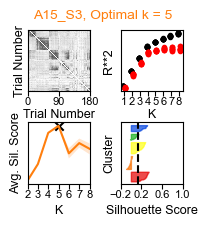

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

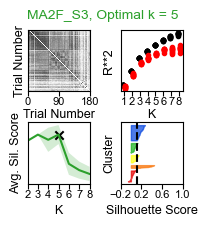

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

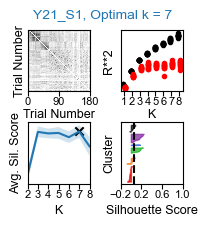

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

In [17]:
''' Decide max possible k value by checking for overfitting if optimal k > 4 & plot Extended Data Fig. 4B examples

Run time: ~5 - 15 minutes per session (x 14 if checking all k > 4 sessions vs. x 3 if just examples)

'''
possible_k = np.arange(2, 9, 1)
extended_k = np.arange(1, 9, 1)
n_reps = 10 
alpha = 0.05
colors = ['xkcd:red','xkcd:orange','xkcd:yellow','xkcd:green','xkcd:blue','xkcd:purple','xkcd:black','xkcd:grey']

# if you want to assess overfitting for all sessions and plot any sessions fit by k > 4 as in Extended Data Fig. 4B:
#example_mice = mice
#example_sessions = sessions
#ex_sesh_only = False

# if you want to assess overfitting for & plot only the example sessions in Extended Data Fig. 4B:
example_mice = ['Y21', 'MA2F', 'A15']
example_sessions = ['091822_record1','102522_record3','090122_record3']
ex_sesh_only = True

for m, session in zip(mice, sessions):
    for s in tdqm(session):
        d = data[m][s]
                
        rawdata_file = 'RAW_' + m + '_' + s + '.npy'
        raw = np.load(load_folder + rawdata_file, allow_pickle=True)
        cell_IDs = raw.item().get('cellsfil')
        gridcell = d['gridcell'].astype(bool)
        gridcells = cell_IDs[gridcell]     
        
        if (m in example_mice) and (s in example_sessions) and (len(gridcells) >= 10):
            Y = d['FRtensorbacksorted'].copy()
            Y = Y.transpose(0, 2, 1)
            Y_unwrapped = np.reshape(Y, (Y.shape[0], -1))
            
            #Run k-means ten times quickly and choose the k that most frequently most often maximizes the average silhouette score 
            silhouette_avgs = np.zeros((n_reps, len(possible_k)))
            for p in range(n_reps):
                sil_avgs = []
                for n in possible_k:     
                    # fit model and get params
                    model_kmeans = lvl_kmeans(n_components = n, n_restarts = 10)
                    model_kmeans.fit(Y_unwrapped)
                    W, _ = model_kmeans.factors
                    labels = []
                    for t in range(W.shape[0]):
                        mapid = np.where(W[t,:] == 1)[0]
                        labels = np.append(labels, mapid)
                    sil_avgs = np.append(sil_avgs, silhouette_score(Y_unwrapped, labels))
                silhouette_avgs[p,:] = sil_avgs
                
            SilN = possible_k[np.argmax(np.mean(silhouette_avgs, axis = 0))]
            
            if m in SM_aged_mice:
                col = 'C1'
            elif m in SM_MA_mice:
                col = 'C2'
            else:
                col = 'C0'
            
            if (SilN > 4) or (ex_sesh_only == True):
                
                model_kmeans = lvl_kmeans(n_components = SilN, n_restarts = 100)
                model_kmeans.fit(Y_unwrapped)
                W, H = model_kmeans.factors
                Y_hat = model_kmeans.predict()
                score = model_kmeans.score(Y_unwrapped)

                labels = []
                for t in range(W.shape[0]):
                    mapid = np.where(W[t,:] == 1)[0]
                    labels = np.append(labels, mapid)
                silhouette_avg = silhouette_score(Y_unwrapped, labels)
                samp_sil = silhouette_samples(Y_unwrapped, labels)
            
                #compare test R^2 vs. shuffle for k = 1-8
                # Run cross-validated k-means with speckled holdout pattern.
                km_train_scores = np.ones((len(extended_k), n_reps))
                km_test_scores = np.ones((len(extended_k), n_reps))

                for i, rank in enumerate(tdqm(extended_k)):
                    model = lvl_kmeans(n_components=rank, n_restarts = 100, maxiter = 1000)
                    km_train_scores[i], km_test_scores[i] = \
                        speckled_cv_scores(model, Y_unwrapped, n_repeats=n_reps)
                    
                #plot overfit check
                fig, ax = plt.subplots(2,2, figsize = (2,2))
                plt.subplots_adjust(hspace = 0.5, wspace = 0.5)
                fig.suptitle(str(m) + '_S' + str(s[-1]) + ', Optimal k = ' + str(SilN), fontsize = 10, color = col)

                #plot sparsely labeled sim matrix 
                sim = d['gridsimilaritybacksorted']
                im = ax[0,0].imshow(sim, clim=[0, 1.0], aspect='auto', cmap='Greys', interpolation='none')
                ax[0,0].tick_params(which='major', labelsize=8, pad=0.5)
                ax[0,0].set_ylabel('Trial Number', fontsize=9, labelpad=1)
                ax[0,0].set_xlabel('Trial Number', fontsize=9, labelpad=1)
                ax[0,0].set_yticks([])
                ax[0,0].set_xticks([0, 90, 180])
                ax[0,0].tick_params(labelsize = 8)

                #plot train R^2 vs. test^2
                rax = np.tile(extended_k, (n_reps, 1)).T.ravel()
                ax[0,1].plot(rax-.1, km_train_scores.ravel(), '.', color = 'k', label = 'Train')
                ax[0,1].plot(rax+.1, km_test_scores.ravel(), '.', color = 'r', label = 'Test')
                ax[0,1].set_xlabel('K', fontsize=9, labelpad = 1)
                ax[0,1].set_ylabel('R**2', fontsize=9)
                ax[0,1].tick_params(labelsize = 8, pad=0.5)
                ax[0,1].set_yticks([])
                ax[0,1].set_xticks(extended_k)
                #ax[0,1].legend()

                #plot silhouete score averages for all k
                ax[1,0].plot(possible_k, np.mean(silhouette_avgs, axis = 0), color = col)
                ax[1,0].fill_between(possible_k, np.mean(silhouette_avgs, axis = 0) - stats.sem(silhouette_avgs, axis = 0),
                                   np.mean(silhouette_avgs, axis = 0) + stats.sem(silhouette_avgs, axis = 0), facecolor = col, alpha = 0.2)
                ax[1,0].scatter(SilN, np.max(np.mean(silhouette_avgs, axis = 0)), color = 'k', marker = 'x')
                ax[1,0].set_xlim([2,8])
                ax[1,0].set_xticks(possible_k)
                ax[1,0].set_ylabel('Avg. Sil. Score', fontsize=9)
                ax[1,0].set_yticks([])
                ax[1,0].tick_params(labelsize = 8, pad=0.5)
                ax[1,0].set_xlabel('K', fontsize=9)

                #plot silhouette score of clusters for selected k
                ax[1,1].set_xlim([-0.2, 1.0])
                ax[1,1].set_ylim([0, len(Y_unwrapped) + (SilN + 1) * 10])
                y_lower = 10
                for i in range(SilN):
                    ith_cluster_silhouette_values = samp_sil[labels == i]
                    ith_cluster_silhouette_values.sort()
                    size_cluster_i = ith_cluster_silhouette_values.shape[0]
                    y_upper = y_lower + size_cluster_i
                    color = colors[i]
                    ax[1,1].fill_betweenx(np.arange(y_lower, y_upper),0,
                        ith_cluster_silhouette_values,facecolor=color,edgecolor=color,alpha=0.7)
                    #ax[1,1].text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))
                    y_lower = y_upper + 10  # 10 for the 0 samples
                ax[1,1].set_xlabel("Silhouette Score", fontsize = 9)
                ax[1,1].set_ylabel("Cluster", fontsize = 9)
                ax[1,1].axvline(x=silhouette_avg, color = "k", linestyle="--")
                ax[1,1].set_yticks([]) 
                ax[1,1].set_xticks([-0.2, 0.2, 0.6, 1.0])
                ax[1,1].tick_params(labelsize = 8, pad=0.5)

                plt.savefig(save_folder + m + '_' + s + '_S4B.png', dpi=400, bbox_inches='tight')
                plt.savefig(save_folder + m + '_' + s + '_S4B.svg', dpi=400, bbox_inches='tight')
                plt.show()
                

~10% of eligible Split Maze sessions (n = 13 / 134) had an optimal k > 4 in this sweep. We compared the train and test cross-validation performance (R2) of the k-means model at all possible k to assess if overfitting occurred at higher k. Indeed, we observed that an optimal k > 4 increased test R2 minimally compared to the next best smaller k, while increasing train R2 significantly (Extended Data Fig. 4B). In each session where k > 4, we also observed at least one low quality cluster with no silhouette scores exceeding the average across clusters. This indicated to us that k > 4 was rarely, if ever, appropriate to capture SM network-wide spatial firing patterns, so we selected it max_k = 4 going forward.

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

[0.06938916 0.00168586 0.00138305]
does not outperform shuffle, probable one map session
stat = 7.0, p= 0.9863


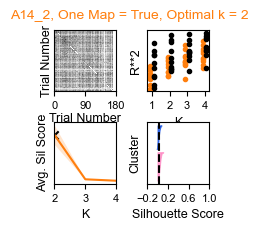

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

[0.00140026 0.00153939 0.00817925]
does not outperform shuffle, probable one map session
stat = 29.0, p= 0.4609


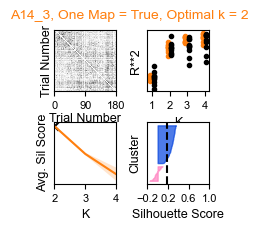

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

[9.25185854e-18 7.69440261e-05 8.36817872e-05]
outperforms shuffle at optimal k = 2
stat = 55.0, p= 0.001


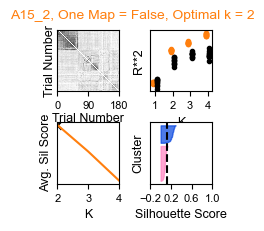

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

[3.24683952e-04 3.45472881e-05 5.49305892e-05]
outperforms shuffle at optimal k = 4
stat = 55.0, p= 0.001


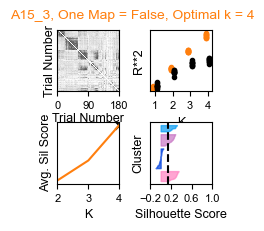

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

[4.62592927e-18 4.62592927e-18 5.90086279e-05]
outperforms shuffle at optimal k = 4
stat = 55.0, p= 0.001


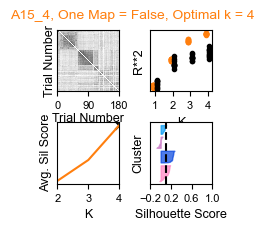

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

[9.25185854e-18 0.00000000e+00 2.79164419e-04]
outperforms shuffle at optimal k = 2
stat = 55.0, p= 0.001


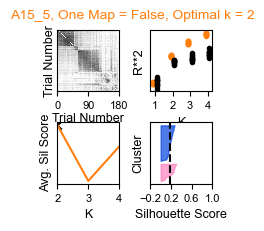

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

[9.25185854e-18 8.81231701e-04 6.79393518e-04]
outperforms shuffle at optimal k = 4
stat = 55.0, p= 0.001


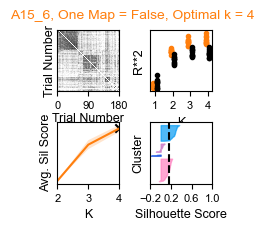

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

[4.62592927e-18 1.51283916e-05 9.24417520e-05]
outperforms shuffle at optimal k = 4
stat = 55.0, p= 0.001


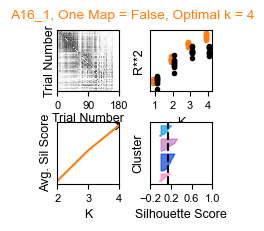

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

[0.         0.00024575 0.00118327]
outperforms shuffle at optimal k = 3
stat = 55.0, p= 0.001


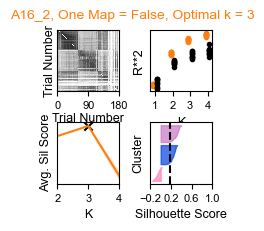

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

[9.93093913e-05 1.59353848e-04 3.41044762e-04]
does not outperform shuffle, probable one map session
stat = 36.0, p= 0.2158


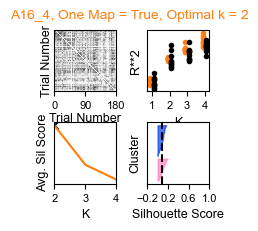

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

[0.00000000e+00 9.25185854e-18 3.73789734e-04]
outperforms shuffle at optimal k = 3
stat = 55.0, p= 0.001


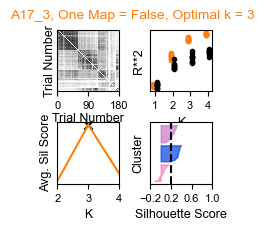

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

[0.00000000e+00 9.25185854e-18 7.73179360e-05]
outperforms shuffle at optimal k = 2
stat = 54.0, p= 0.002


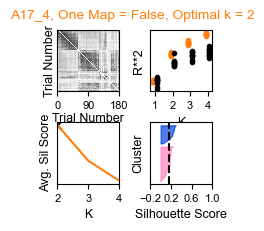

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

[4.62592927e-18 2.62134931e-04 2.01348647e-03]
outperforms shuffle at optimal k = 3
stat = 55.0, p= 0.001


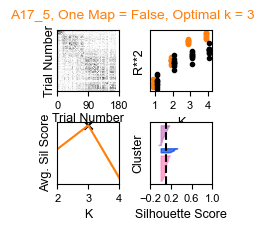

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

[0.00011655 0.00012341 0.00106518]
outperforms shuffle at optimal k = 4
stat = 52.0, p= 0.0049


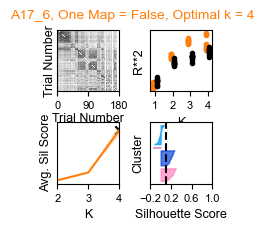

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

[2.60448694e-05 3.70519672e-04 1.43747684e-03]
outperforms shuffle at optimal k = 2
stat = 55.0, p= 0.001


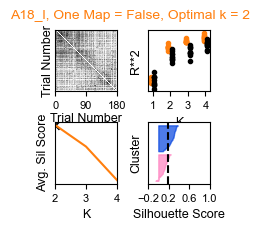

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

[4.62592927e-18 5.15799990e-05 5.18241634e-04]
outperforms shuffle at optimal k = 4
stat = 55.0, p= 0.001


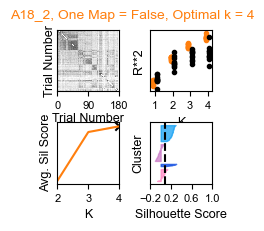

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

[0.00000000e+00 1.17483032e-04 8.86784462e-05]
outperforms shuffle at optimal k = 4
stat = 55.0, p= 0.001


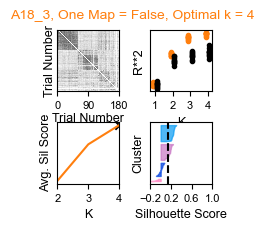

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

[0.00000000e+00 9.25185854e-18 8.17697293e-04]
outperforms shuffle at optimal k = 4
stat = 54.0, p= 0.002


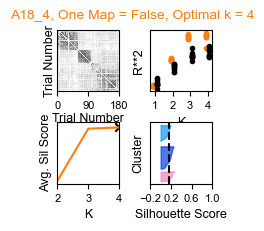

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

[4.62592927e-18 1.02054386e-06 6.24266763e-04]
outperforms shuffle at optimal k = 4
stat = 55.0, p= 0.001


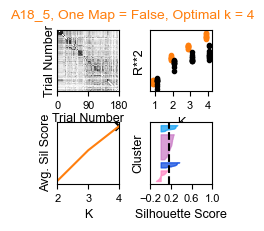

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

[5.17129859e-04 1.71521992e-05 5.27309192e-04]
outperforms shuffle at optimal k = 3
stat = 55.0, p= 0.001


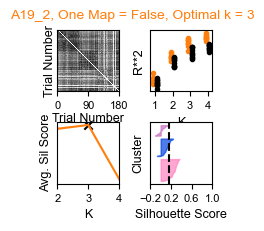

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

[0.0000000e+00 4.4627488e-05 2.2967661e-04]
outperforms shuffle at optimal k = 2
stat = 55.0, p= 0.001


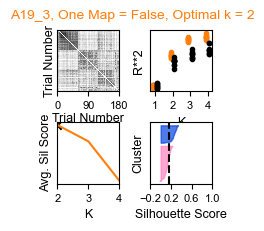

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

[0.00017712 0.00010337 0.00171119]
outperforms shuffle at optimal k = 3
stat = 55.0, p= 0.001


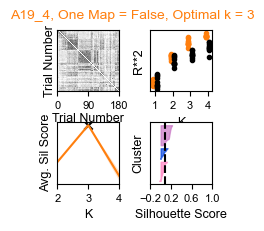

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

[9.25185854e-18 9.25185854e-18 6.35665650e-05]
outperforms shuffle at optimal k = 2
stat = 55.0, p= 0.001


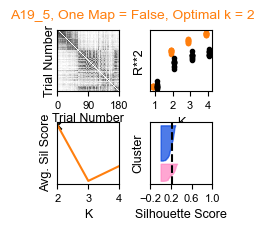

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

[0.00000000e+00 0.00000000e+00 9.25185854e-18]
outperforms shuffle at optimal k = 3
stat = 55.0, p= 0.001


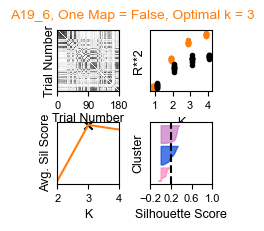

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

[0.00000000e+00 9.99326359e-06 6.96338584e-05]
outperforms shuffle at optimal k = 2
stat = 55.0, p= 0.001


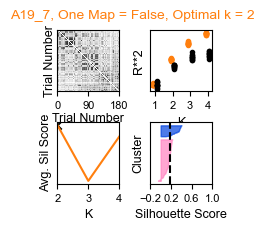

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

[0.00000000e+00 9.25185854e-18 4.50746703e-03]
outperforms shuffle at optimal k = 3
stat = 55.0, p= 0.001


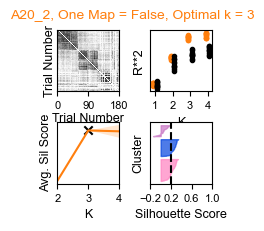

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

[4.62592927e-18 9.25185854e-18 0.00000000e+00]
outperforms shuffle at optimal k = 4
stat = 55.0, p= 0.001


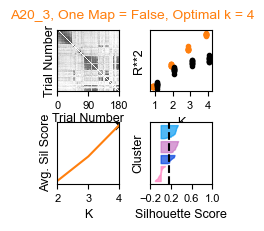

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

[3.25806738e-05 4.62592927e-18 1.48947269e-03]
outperforms shuffle at optimal k = 4
stat = 54.0, p= 0.002


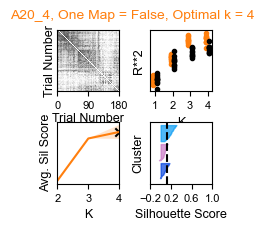

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

[0.00000000e+00 9.25185854e-18 4.26675999e-04]
outperforms shuffle at optimal k = 3
stat = 55.0, p= 0.001


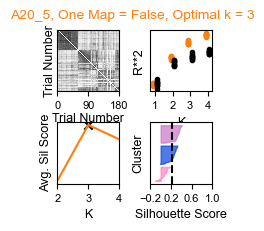

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

[9.25185854e-18 9.25185854e-18 4.70196317e-05]
outperforms shuffle at optimal k = 3
stat = 55.0, p= 0.001


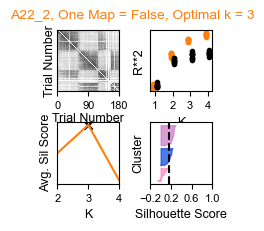

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

[9.25185854e-18 9.25185854e-18 1.94701201e-05]
outperforms shuffle at optimal k = 4
stat = 55.0, p= 0.001


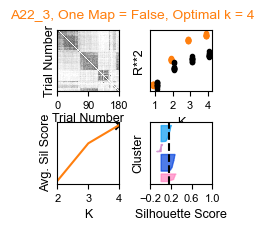

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

[0.         0.         0.00082958]
outperforms shuffle at optimal k = 3
stat = 55.0, p= 0.001


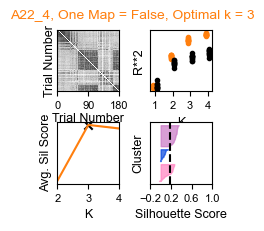

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

[1.85037171e-17 1.85037171e-17 1.85037171e-17]
outperforms shuffle at optimal k = 2
stat = 51.0, p= 0.0068


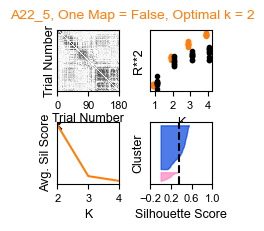

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

[9.25185854e-18 3.56350031e-05 0.00000000e+00]
outperforms shuffle at optimal k = 4
stat = 55.0, p= 0.001


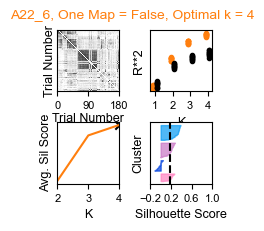

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

[9.25185854e-18 0.00000000e+00 5.40007164e-04]
outperforms shuffle at optimal k = 2
stat = 47.0, p= 0.0244


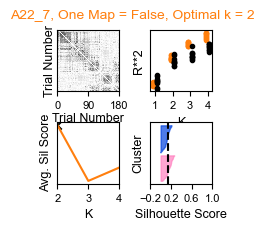

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

[4.62592927e-18 6.40901285e-04 8.97886031e-04]
does not outperform shuffle, probable one map session
stat = 2.0, p= 0.998


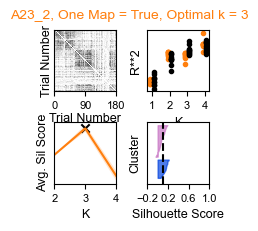

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

[2.05377338e-05 1.16022666e-04 9.25185854e-18]
outperforms shuffle at optimal k = 4
stat = 55.0, p= 0.001


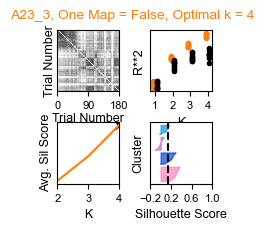

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

[2.50484047e-05 5.07448401e-04 2.92173842e-04]
outperforms shuffle at optimal k = 4
stat = 55.0, p= 0.001


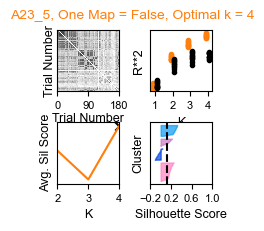

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

[9.25185854e-18 0.00000000e+00 3.84389252e-06]
outperforms shuffle at optimal k = 3
stat = 55.0, p= 0.001


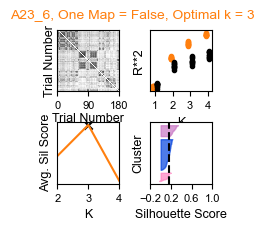

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

[7.27909763e-05 1.49400715e-04 3.44214076e-04]
outperforms shuffle at optimal k = 2
stat = 55.0, p= 0.001


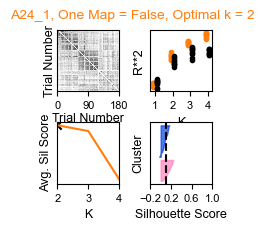

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

[0.00000000e+00 9.25185854e-18 2.25326766e-04]
outperforms shuffle at optimal k = 3
stat = 55.0, p= 0.001


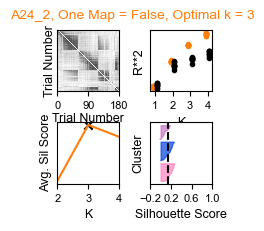

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

[9.25185854e-18 0.00000000e+00 1.26705157e-04]
outperforms shuffle at optimal k = 4
stat = 55.0, p= 0.001


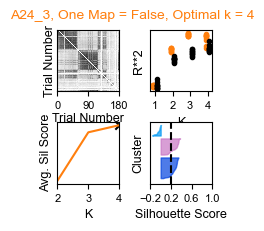

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

[0.00000000e+00 0.00000000e+00 9.25185854e-18]
outperforms shuffle at optimal k = 3
stat = 55.0, p= 0.001


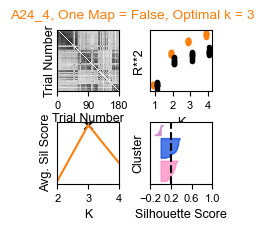

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

[0.00000000e+00 9.25185854e-18 4.47820829e-04]
outperforms shuffle at optimal k = 4
stat = 55.0, p= 0.001


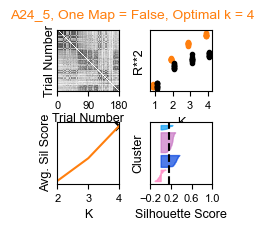

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

[9.25185854e-18 0.00000000e+00 1.42273986e-04]
outperforms shuffle at optimal k = 3
stat = 55.0, p= 0.001


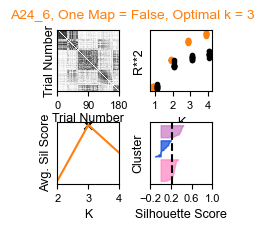

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

[9.25185854e-18 4.62592927e-18 4.04336614e-04]
outperforms shuffle at optimal k = 2
stat = 55.0, p= 0.001


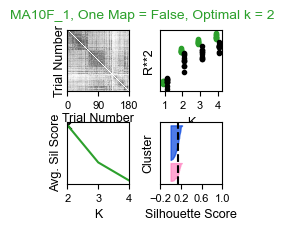

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

[9.25185854e-18 0.00000000e+00 8.24421873e-04]
outperforms shuffle at optimal k = 4
stat = 55.0, p= 0.001


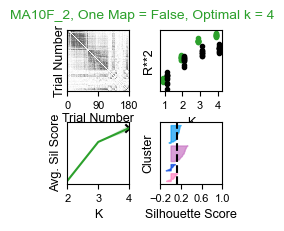

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

[7.38360928e-04 2.72887658e-05 7.51609705e-04]
does not outperform shuffle, probable one map session
stat = 39.0, p= 0.1377


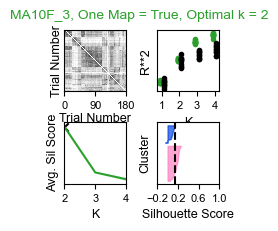

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

[1.81012620e-05 1.97749569e-04 1.56310758e-03]
does not outperform shuffle, probable one map session
stat = 43.0, p= 0.0654


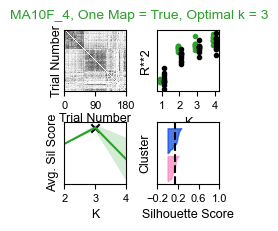

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

[9.25185854e-18 1.76122412e-04 6.64739087e-04]
outperforms shuffle at optimal k = 2
stat = 55.0, p= 0.001


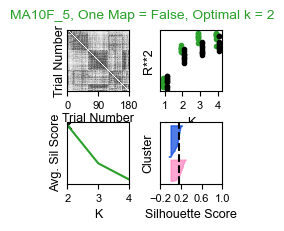

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

[9.25185854e-18 9.25185854e-18 7.66801207e-04]
outperforms shuffle at optimal k = 2
stat = 54.0, p= 0.002


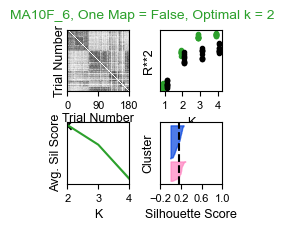

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

[5.16528509e-05 5.93529865e-04 4.55829924e-04]
outperforms shuffle at optimal k = 3
stat = 55.0, p= 0.001


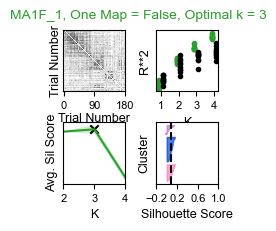

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

[4.62592927e-18 2.69939776e-04 5.71404890e-04]
outperforms shuffle at optimal k = 2
stat = 55.0, p= 0.001


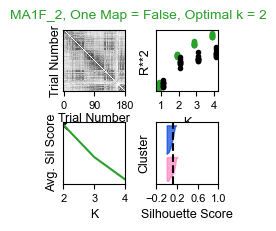

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

[9.25185854e-18 9.25185854e-18 6.62664998e-04]
outperforms shuffle at optimal k = 2
stat = 55.0, p= 0.001


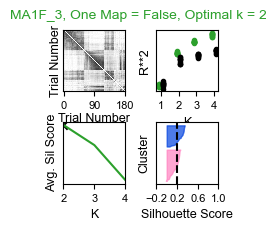

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

[1.85037171e-17 0.00000000e+00 9.82497049e-04]
outperforms shuffle at optimal k = 2
stat = 55.0, p= 0.001


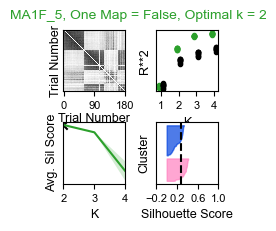

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

[9.25185854e-18 0.00000000e+00 9.25185854e-18]
outperforms shuffle at optimal k = 3
stat = 55.0, p= 0.001


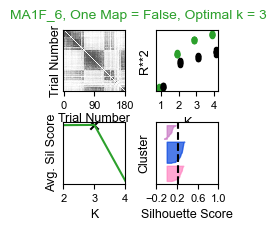

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

[1.76493037e-07 1.58317381e-06 6.90925687e-06]
outperforms shuffle at optimal k = 2
stat = 52.0, p= 0.0049


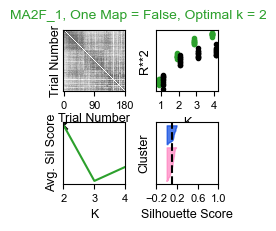

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

[9.25185854e-18 1.94252600e-04 5.46924528e-04]
outperforms shuffle at optimal k = 2
stat = 52.0, p= 0.0049


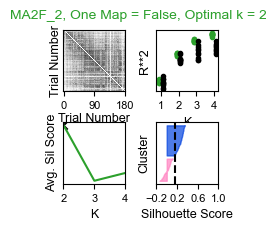

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

[4.62592927e-18 4.62592927e-18 5.64824896e-04]
outperforms shuffle at optimal k = 4
stat = 55.0, p= 0.001


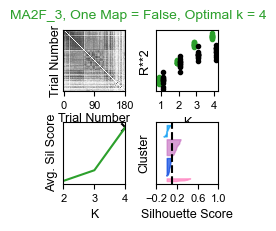

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

[9.25185854e-18 4.20960654e-04 3.73536969e-04]
outperforms shuffle at optimal k = 2
stat = 55.0, p= 0.001


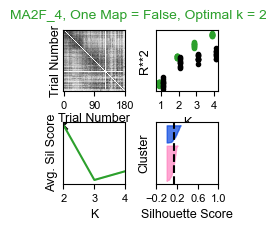

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

[4.62592927e-18 4.62592927e-18 2.04959275e-04]
outperforms shuffle at optimal k = 3
stat = 55.0, p= 0.001


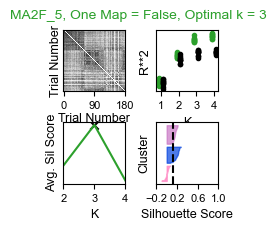

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

[9.25185854e-18 9.25185854e-18 9.25185854e-18]
outperforms shuffle at optimal k = 4
stat = 55.0, p= 0.001


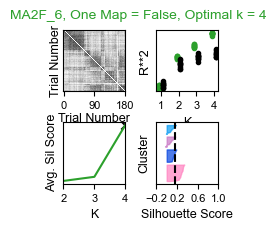

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

[9.25185854e-18 6.01480533e-04 2.50059231e-03]
outperforms shuffle at optimal k = 2
stat = 54.0, p= 0.002


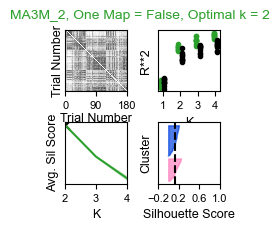

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

[1.36555534e-05 2.36396287e-05 9.25185854e-18]
outperforms shuffle at optimal k = 4
stat = 55.0, p= 0.001


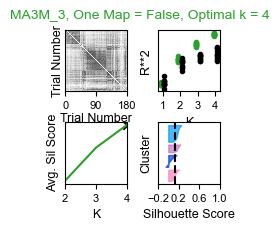

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

[9.25185854e-18 9.25185854e-18 6.31550164e-04]
outperforms shuffle at optimal k = 2
stat = 55.0, p= 0.001


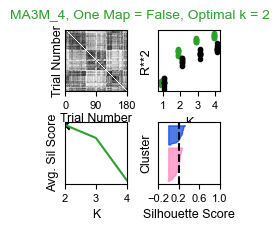

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

[1.85037171e-17 7.33565371e-04 8.04819483e-03]
outperforms shuffle at optimal k = 4
stat = 55.0, p= 0.001


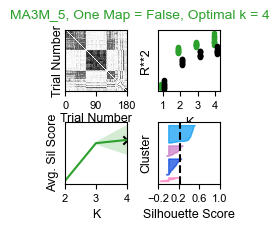

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

[0.0000000e+00 1.1885375e-04 1.5045419e-05]
outperforms shuffle at optimal k = 2
stat = 55.0, p= 0.001


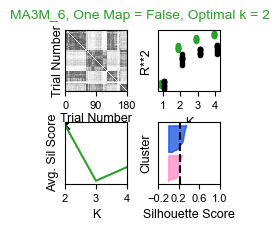

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

[0.         0.00016871 0.00054789]
outperforms shuffle at optimal k = 2
stat = 46.0, p= 0.0322


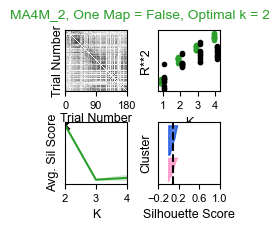

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

[9.25185854e-18 9.25185854e-18 1.26913236e-04]
does not outperform shuffle, probable one map session
stat = 42.0, p= 0.0801


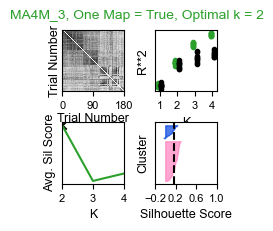

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

[2.0401449e-05 0.0000000e+00 0.0000000e+00]
outperforms shuffle at optimal k = 3
stat = 55.0, p= 0.001


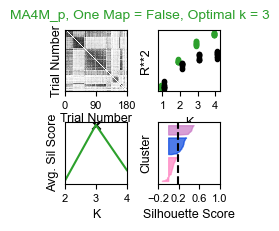

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

[0.00000000e+00 9.25185854e-18 7.90651272e-05]
outperforms shuffle at optimal k = 2
stat = 55.0, p= 0.001


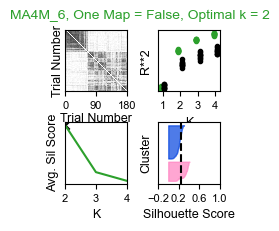

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

[0.         0.00027821 0.00809503]
outperforms shuffle at optimal k = 2
stat = 55.0, p= 0.001


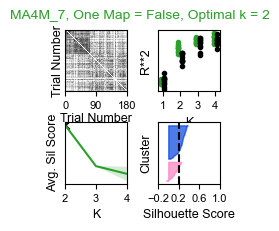

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

[4.62592927e-18 4.62592927e-18 9.59498715e-05]
outperforms shuffle at optimal k = 2
stat = 53.0, p= 0.0029


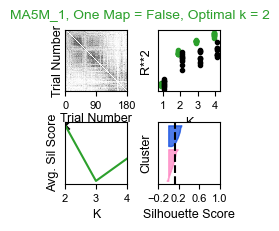

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

[4.62592927e-18 9.03845335e-05 3.39621168e-04]
does not outperform shuffle, probable one map session
stat = 25.0, p= 0.6152


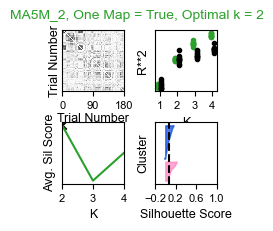

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

[0.         0.00027245 0.00011819]
outperforms shuffle at optimal k = 4
stat = 55.0, p= 0.001


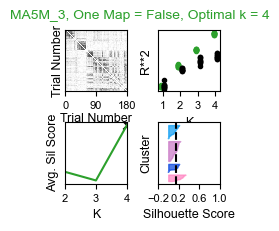

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

[0.00000000e+00 2.98828128e-05 2.38879532e-05]
outperforms shuffle at optimal k = 4
stat = 55.0, p= 0.001


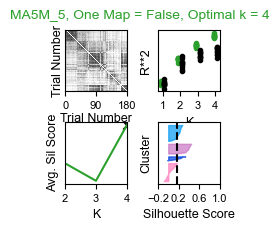

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

[0.00000000e+00 9.25185854e-18 9.25185854e-18]
outperforms shuffle at optimal k = 4
stat = 55.0, p= 0.001


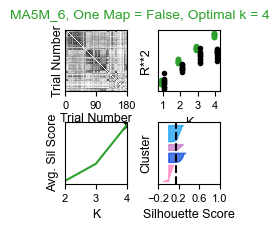

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

[9.25185854e-18 9.25185854e-18 1.55461508e-04]
outperforms shuffle at optimal k = 2
stat = 55.0, p= 0.001


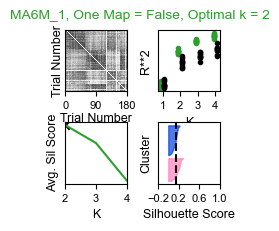

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

[0.         0.0001366  0.00194864]
outperforms shuffle at optimal k = 3
stat = 55.0, p= 0.001


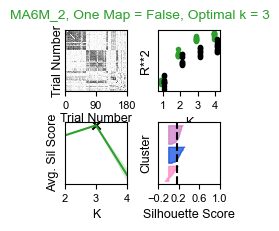

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

[3.29616570e-04 1.82055349e-04 7.05407145e-05]
outperforms shuffle at optimal k = 4
stat = 55.0, p= 0.001


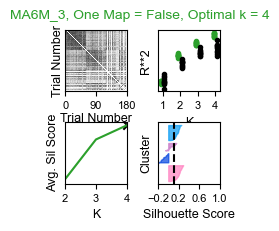

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

[9.25185854e-18 1.48223594e-04 6.56453783e-03]
does not outperform shuffle, probable one map session
stat = 0.0, p= 1.0


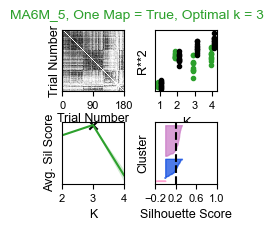

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

[0.00000000e+00 9.25185854e-18 3.15958721e-04]
outperforms shuffle at optimal k = 2
stat = 55.0, p= 0.001


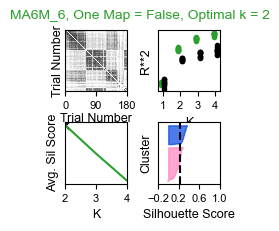

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

[4.62592927e-18 1.40450715e-04 9.91074302e-04]
outperforms shuffle at optimal k = 3
stat = 55.0, p= 0.001


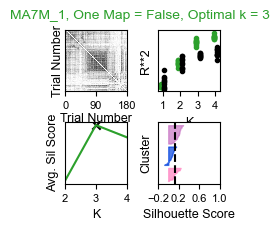

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

[9.25185854e-18 6.56620394e-04 1.35263612e-03]
outperforms shuffle at optimal k = 3
stat = 55.0, p= 0.001


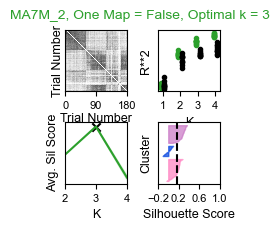

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

[0.00000000e+00 0.00000000e+00 9.25185854e-18]
outperforms shuffle at optimal k = 3
stat = 55.0, p= 0.001


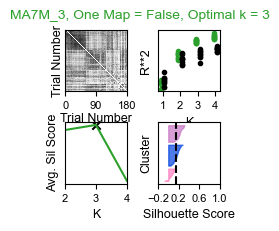

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

[2.87559755e-04 5.81181027e-05 1.39391488e-04]
outperforms shuffle at optimal k = 4
stat = 55.0, p= 0.001


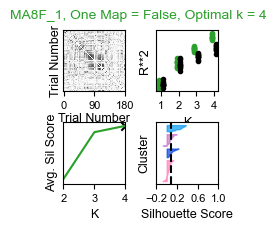

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

[0.00020547 0.00042745 0.00061111]
does not outperform shuffle, probable one map session
stat = 7.0, p= 0.9863


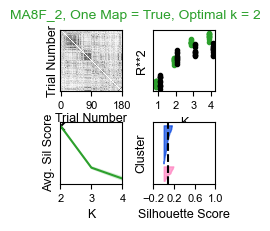

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

[4.62592927e-18 0.00000000e+00 1.63917954e-04]
outperforms shuffle at optimal k = 3
stat = 55.0, p= 0.001


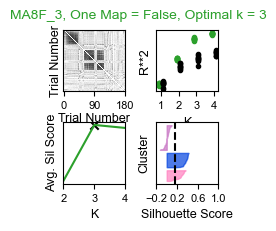

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

[0.00000000e+00 9.25185854e-18 1.80667592e-04]
outperforms shuffle at optimal k = 3
stat = 55.0, p= 0.001


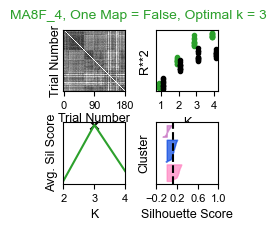

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

[9.25185854e-18 0.00000000e+00 1.06286973e-04]
outperforms shuffle at optimal k = 2
stat = 53.0, p= 0.0029


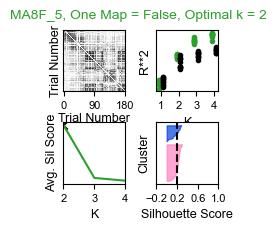

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

[0.00000000e+00 1.07181638e-04 9.25185854e-18]
outperforms shuffle at optimal k = 4
stat = 55.0, p= 0.001


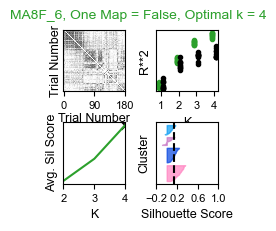

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

[1.57691740e-05 1.03920548e-03 7.36417818e-04]
does not outperform shuffle, probable one map session
stat = 38.0, p= 0.1611


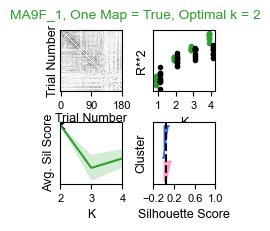

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

[2.31296463e-18 0.00000000e+00 7.04710952e-04]
outperforms shuffle at optimal k = 4
stat = 55.0, p= 0.001


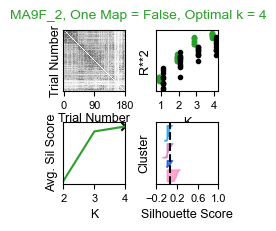

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

[4.62592927e-18 3.96689901e-05 4.37750472e-04]
outperforms shuffle at optimal k = 4
stat = 55.0, p= 0.001


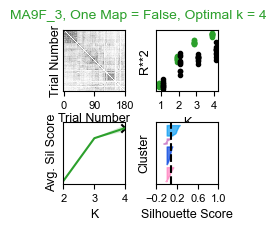

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

[0.00000000e+00 0.00000000e+00 3.82222274e-05]
outperforms shuffle at optimal k = 4
stat = 55.0, p= 0.001


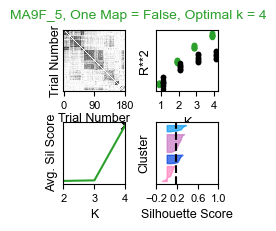

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

[0.00000000e+00 9.25185854e-18 1.49283952e-05]
outperforms shuffle at optimal k = 3
stat = 55.0, p= 0.001


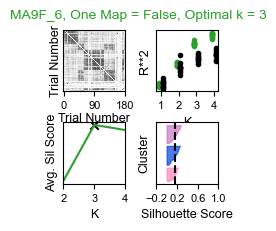

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

[9.25185854e-18 0.00000000e+00 2.21121265e-04]
outperforms shuffle at optimal k = 4
stat = 55.0, p= 0.001


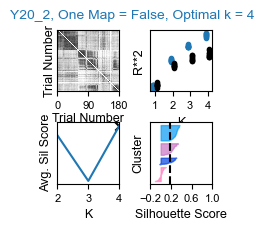

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

[0.00000000e+00 9.25185854e-18 1.85037171e-17]
outperforms shuffle at optimal k = 3
stat = 55.0, p= 0.001


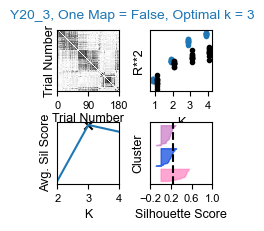

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

[0.00000000e+00 1.85037171e-17 1.85037171e-17]
outperforms shuffle at optimal k = 3
stat = 55.0, p= 0.001


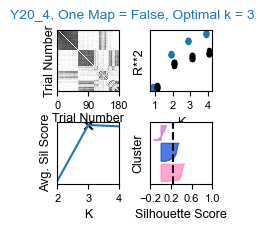

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

[0.00000000e+00 9.25185854e-18 2.49544947e-04]
outperforms shuffle at optimal k = 2
stat = 55.0, p= 0.001


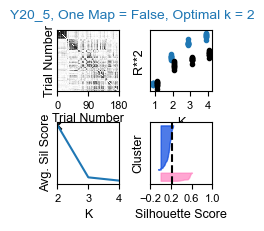

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

[0.00000000e+00 9.25185854e-18 4.30359435e-04]
outperforms shuffle at optimal k = 4
stat = 55.0, p= 0.001


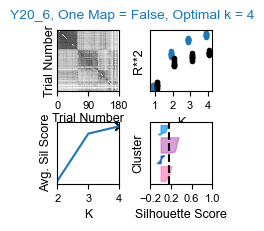

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

[0.00176264 0.00049845 0.001824  ]
outperforms shuffle at optimal k = 4
stat = 55.0, p= 0.001


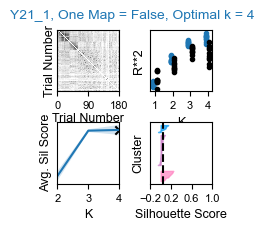

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

[4.62592927e-18 7.60497419e-06 1.13004630e-03]
does not outperform shuffle, probable one map session
stat = 44.0, p= 0.0527


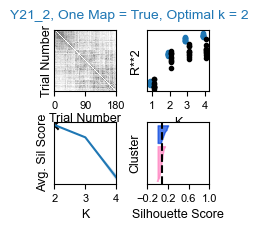

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

[4.62592927e-18 1.50098549e-03 4.19949932e-04]
outperforms shuffle at optimal k = 4
stat = 55.0, p= 0.001


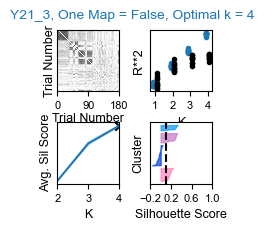

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

[4.62592927e-18 0.00000000e+00 5.28493083e-05]
outperforms shuffle at optimal k = 4
stat = 55.0, p= 0.001


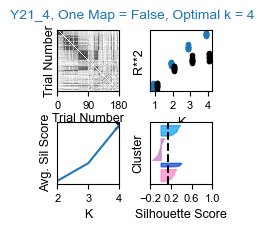

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

[9.25185854e-18 0.00000000e+00 9.25185854e-18]
outperforms shuffle at optimal k = 3
stat = 55.0, p= 0.001


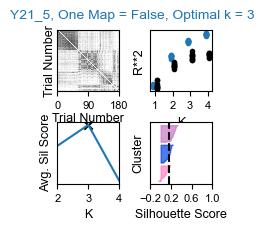

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

[9.25185854e-18 9.25185854e-18 1.93003827e-04]
outperforms shuffle at optimal k = 3
stat = 55.0, p= 0.001


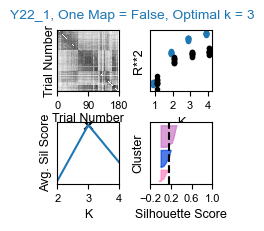

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

[0.00000000e+00 9.25185854e-18 0.00000000e+00]
outperforms shuffle at optimal k = 2
stat = 55.0, p= 0.001


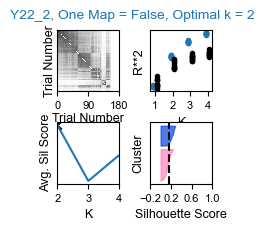

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

[9.25185854e-18 9.25185854e-18 3.27245982e-04]
outperforms shuffle at optimal k = 4
stat = 55.0, p= 0.001


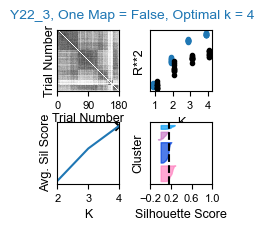

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

[0.         0.00028614 0.00587896]
outperforms shuffle at optimal k = 3
stat = 55.0, p= 0.001


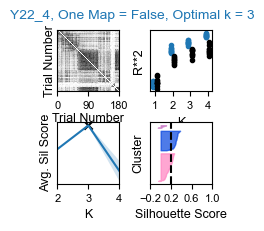

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

[1.85037171e-17 9.25185854e-18 1.12161319e-04]
outperforms shuffle at optimal k = 2
stat = 55.0, p= 0.001


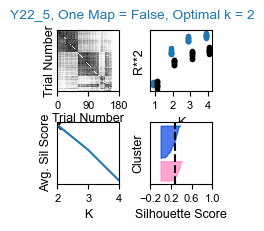

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

[0.00000000e+00 9.25185854e-18 9.25185854e-18]
outperforms shuffle at optimal k = 4
stat = 55.0, p= 0.001


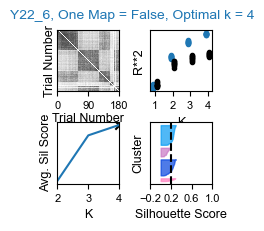

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

[1.85037171e-17 0.00000000e+00 1.16208697e-05]
outperforms shuffle at optimal k = 2
stat = 55.0, p= 0.001


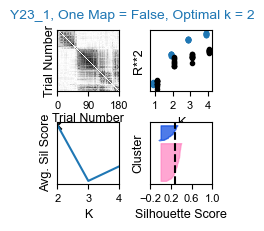

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

[9.25185854e-18 1.85037171e-17 0.00000000e+00]
outperforms shuffle at optimal k = 3
stat = 55.0, p= 0.001


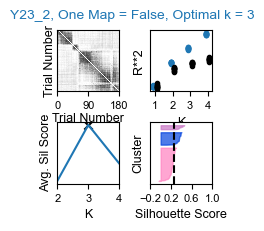

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

[1.85037171e-17 1.85037171e-17 4.39773109e-05]
outperforms shuffle at optimal k = 2
stat = 55.0, p= 0.001


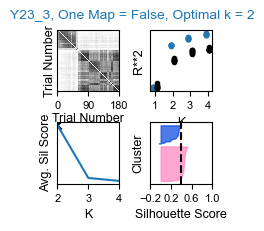

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

[0.00000000e+00 1.85037171e-17 9.25185854e-18]
outperforms shuffle at optimal k = 2
stat = 55.0, p= 0.001


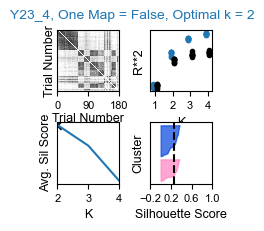

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

[0.00000000e+00 9.25185854e-18 1.06077641e-04]
outperforms shuffle at optimal k = 2
stat = 55.0, p= 0.001


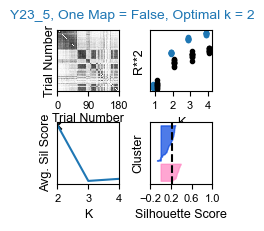

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

[9.25185854e-18 9.54646286e-06 5.25599777e-04]
outperforms shuffle at optimal k = 3
stat = 55.0, p= 0.001


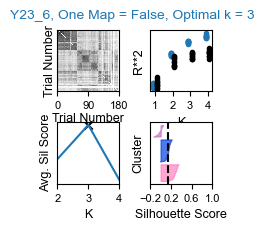

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

[4.62592927e-18 2.06716767e-05 7.69069733e-04]
outperforms shuffle at optimal k = 3
stat = 55.0, p= 0.001


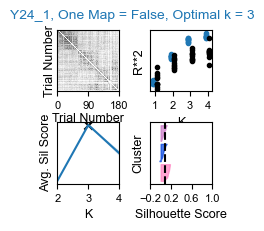

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

[9.25185854e-18 1.49316475e-03 1.18499488e-03]
outperforms shuffle at optimal k = 2
stat = 53.0, p= 0.0029


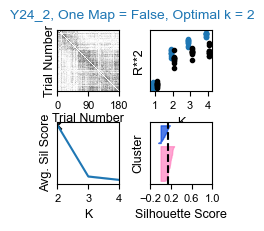

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

[0.00017803 0.00108148 0.00110097]
does not outperform shuffle, probable one map session
stat = 27.0, p= 0.5391


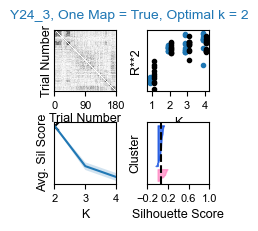

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

[4.62592927e-18 3.82146383e-04 1.25198459e-03]
outperforms shuffle at optimal k = 2
stat = 55.0, p= 0.001


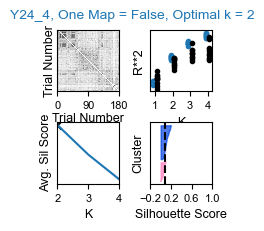

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

[0.00000000e+00 9.25185854e-18 0.00000000e+00]
outperforms shuffle at optimal k = 2
stat = 55.0, p= 0.001


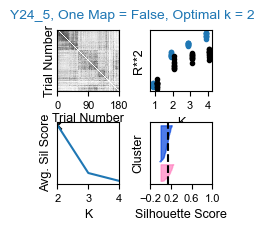

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

[0.00012212 0.         0.0002238 ]
outperforms shuffle at optimal k = 2
stat = 55.0, p= 0.001


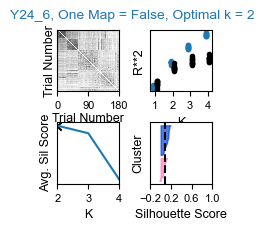

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

[9.25185854e-18 0.00000000e+00 3.40815126e-04]
outperforms shuffle at optimal k = 2
stat = 55.0, p= 0.001


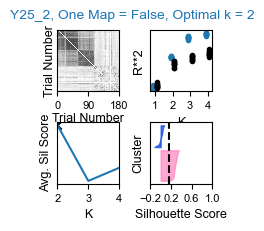

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

[4.62592927e-18 3.56864241e-05 1.32151861e-03]
outperforms shuffle at optimal k = 2
stat = 55.0, p= 0.001


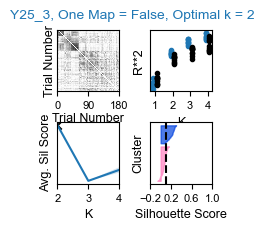

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

[0.         0.00020332 0.00043981]
outperforms shuffle at optimal k = 2
stat = 55.0, p= 0.001


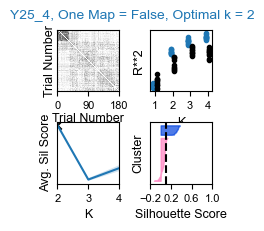

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

[4.62592927e-18 1.03695404e-03 8.04812366e-04]
outperforms shuffle at optimal k = 4
stat = 55.0, p= 0.001


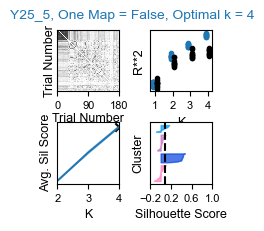

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

[9.25185854e-18 4.62592927e-18 1.70298169e-04]
outperforms shuffle at optimal k = 2
stat = 55.0, p= 0.001


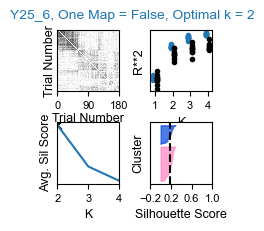

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

[4.62592927e-18 0.00000000e+00 8.22819911e-05]
outperforms shuffle at optimal k = 4
stat = 48.0, p= 0.0186


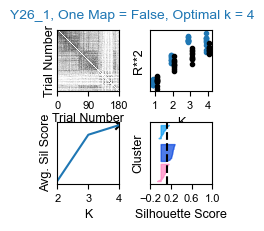

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

[4.62592927e-18 0.00000000e+00 2.75812551e-06]
outperforms shuffle at optimal k = 3
stat = 55.0, p= 0.001


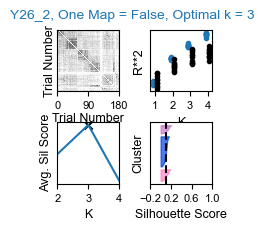

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

[0.0001319  0.00048844 0.00045167]
outperforms shuffle at optimal k = 2
stat = 45.0, p= 0.042


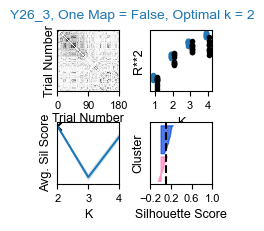

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

[9.25185854e-18 3.47918809e-04 8.03492560e-04]
does not outperform shuffle, probable one map session
stat = 42.0, p= 0.0801


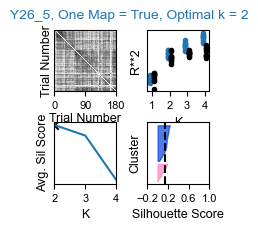

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

[9.25185854e-18 0.00000000e+00 0.00000000e+00]
outperforms shuffle at optimal k = 4
stat = 55.0, p= 0.001


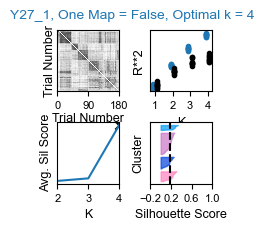

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

[9.25185854e-18 1.85037171e-17 9.25185854e-18]
outperforms shuffle at optimal k = 3
stat = 55.0, p= 0.001


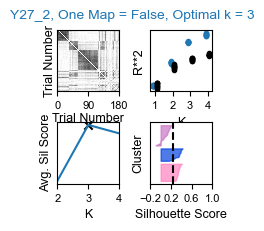

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

[7.30243915e-05 1.85037171e-17 1.85037171e-17]
outperforms shuffle at optimal k = 4
stat = 55.0, p= 0.001


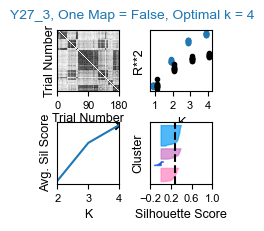

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

[0.00000000e+00 9.25185854e-18 0.00000000e+00]
outperforms shuffle at optimal k = 2
stat = 55.0, p= 0.001


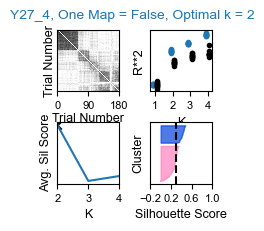

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

[9.25185854e-18 9.25185854e-18 1.33053724e-04]
outperforms shuffle at optimal k = 4
stat = 55.0, p= 0.001


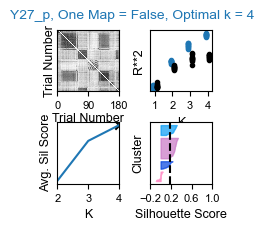

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

[1.85037171e-17 0.00000000e+00 0.00000000e+00]
outperforms shuffle at optimal k = 4
stat = 55.0, p= 0.001


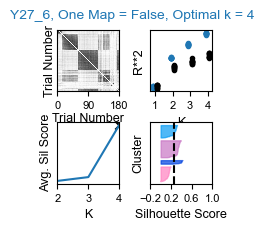

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

[2.81209269e-05 3.30135713e-04 7.44275784e-04]
outperforms shuffle at optimal k = 2
stat = 54.0, p= 0.002


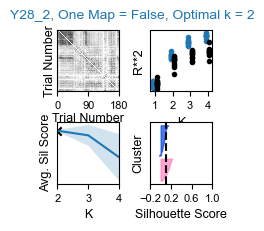

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

[9.25185854e-18 0.00000000e+00 3.27560387e-04]
outperforms shuffle at optimal k = 3
stat = 55.0, p= 0.001


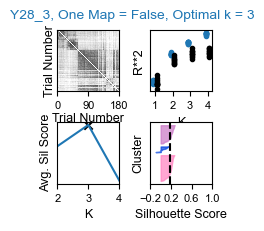

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

[9.25185854e-18 6.88882087e-05 1.51435120e-04]
outperforms shuffle at optimal k = 4
stat = 55.0, p= 0.001


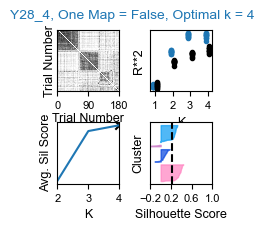

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

[9.25185854e-18 9.25185854e-18 1.58110927e-04]
outperforms shuffle at optimal k = 3
stat = 55.0, p= 0.001


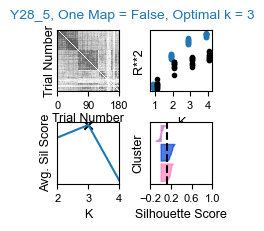

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

[0.00000000e+00 9.25185854e-18 9.25185854e-18]
outperforms shuffle at optimal k = 2
stat = 55.0, p= 0.001


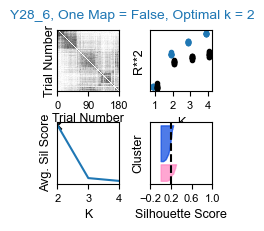

In [23]:
''' K Hyperparameter Selection (k = 1-4) and plot Extended Data Fig. 4A & S4C along the way; OR skip to the next cell to load previously 
generated results of k selection.

Y_unwrapped: matrix of shape m, n; m = n_trials & n = (nposbins * ncells)
W: first factor matrix. Has shape (m, rank) or n_trials, n_clusters (i.e. [0, 1] if map 1 and [1, 0] if map 0)
H: second factor matrix. Has shape (rank, n) or n_clusters, n_obs

Run time is about 5 - 15 minutes per session.

'''
possible_k = np.arange(2, 5, 1)
extended_k = np.arange(1,5,1)
colors = ['xkcd:pink','xkcd:blue','xkcd:orchid','xkcd:azure']
n_reps = 10 
alpha = 0.05

# if you want to visualize the quality of k selection for all sessions vs. just the examples in Extended Data Fig. 4A & C:
#example_mice = mice
#example_sessions = sessions

# if you want to visualize the quality of k selection for only the example sessions in Extended Data Fig. 4A & C
example_mice = ['Y23', 'Y20', 'Y22', 'A16']
example_sessions = ['092722_record3','090222_record4']

for m, session in zip(mice, sessions):
    for s in tdqm(session):
        d = data[m][s]
                
        rawdata_file = 'RAW_' + m + '_' + s + '.npy'
        raw = np.load(load_folder + rawdata_file, allow_pickle=True)
        cell_IDs = raw.item().get('cellsfil')
        gridcell = d['gridcell'].astype(bool)
        gridcells = cell_IDs[gridcell]     
        
        if len(gridcells) >= 10: 
            
            Y = d['FRtensorbacksorted'].copy()
            Y = Y.transpose(0, 2, 1)
            Y_unwrapped = np.reshape(Y, (Y.shape[0], -1))
            
            #Run k-means ten times and choose the k that most frequently most often maximizes the average silhouette score 
            silhouette_avgs = np.zeros((n_reps, len(possible_k)))
            for p in range(n_reps):
                sil_avgs = []
                for n in possible_k:     
                    # fit model and get params
                    model_kmeans = lvl_kmeans(n_components = n, n_restarts = 100)
                    model_kmeans.fit(Y_unwrapped)
                    W, _ = model_kmeans.factors
                    labels = []
                    for t in range(W.shape[0]):
                        mapid = np.where(W[t,:] == 1)[0]
                        labels = np.append(labels, mapid)
                    sil_avgs = np.append(sil_avgs, silhouette_score(Y_unwrapped, labels))
                silhouette_avgs[p,:] = sil_avgs
            
            #compare test R^2 vs. shuffle for k = 1-4
            # Run cross-validated k-means with speckled holdout pattern.
            km_train_scores = np.ones((4, n_reps))
            km_test_scores = np.ones((4, n_reps))

            for i, rank in enumerate(tdqm(extended_k)):
                model = lvl_kmeans(n_components=rank, n_restarts=100, maxiter=1000)
                km_train_scores[i], km_test_scores[i] = \
                    speckled_cv_scores(model, Y_unwrapped, n_repeats=n_reps)

            # Run cross-validated k-means on shuffled/resampled dataset.
            shuff_km_train_scores = np.ones((4, n_reps))
            shuff_km_test_scores = np.ones((4, n_reps))

            for i, rank in enumerate(tdqm(extended_k)):
                model = lvl_kmeans(n_components=rank, n_restarts=100, maxiter=1000)
                shuff_km_train_scores[i], shuff_km_test_scores[i] = \
                    speckled_cv_scores(model, Y_unwrapped, n_repeats=n_reps, resampler=RotationResampler())
            
            #Select optimal k, run KMeans with that k & store results, & plot to confirm quality of results
            if m in SM_aged_mice:
                col = 'C1'
            elif m in SM_MA_mice:
                col = 'C2'
            else:
                col = 'C0'
                
            SilN = possible_k[np.argmax(np.mean(silhouette_avgs, axis = 0))]
            print(stats.sem(silhouette_avgs, axis = 0))
            model_kmeans = lvl_kmeans(n_components = SilN, n_restarts = 100)
            model_kmeans.fit(Y_unwrapped)
            W, H = model_kmeans.factors
            Y_hat = model_kmeans.predict()
            score = model_kmeans.score(Y_unwrapped)
            d['kmeans'] = {}
            d['kmeans']['SilN'] = SilN
            d['kmeans']['W'] = W
            d['kmeans']['H'] = H
            d['kmeans']['Y_hat'] = Y_hat 
            d['kmeans']['Y_hat'] = Y_hat 
            d['kmeans']['score'] = score
            
            #save selected SilN (optimal k value)
            SilN_file = 'SilN_' + m + '_' + s + '.npy'
            np.save(save_folder + SilN_file, SilN)
            
            #check & save whether if sig difference in the distribution of test R^2 real vs. shuffle data at optimal k:
            chosenkidx = np.where(extended_k == SilN)[0]
            res = stats.wilcoxon(km_test_scores[chosenkidx,:][0], shuff_km_test_scores[chosenkidx,:][0], alternative = 'greater')
            onemap = []
            if res.pvalue <= alpha:
                print('outperforms shuffle at optimal k = ' + str(SilN))
                print('stat = ' + str(np.round(res.statistic,2)) + ', p= ' + str(np.round(res.pvalue, 4)))
                onemap = np.append(onemap, [False, res.statistic, res.pvalue])
            else:
                print('does not outperform shuffle, probable one map session')
                print('stat = ' + str(np.round(res.statistic,2)) + ', p= ' + str(np.round(res.pvalue, 4)))
                onemap = np.append(onemap, [True, res.statistic, res.pvalue])

            #save boolean of whether the session was fit well by k > 1 (onemap = False)
            d['kmeans']['onemap'] = onemap
            onemapfile = 'onemap' + m + '_' + s + '.npy'
            np.save(save_folder + onemapfile, onemap)
            
            #get map labels & silhouette scores for samples & on average
            labels = []
            for t in range(W.shape[0]):
                mapid = np.where(W[t,:] == 1)[0]
                labels = np.append(labels, mapid)
            silhouette_avg = silhouette_score(Y_unwrapped, labels)
            samp_sil = silhouette_samples(Y_unwrapped, labels)

            ##SHOW GOODNESS OF CHOSEN as in Extended Data Figs. 4A & C
            #Plot silhouette averages + SEM over ten reps. 

            fig, ax = plt.subplots(2, 2, figsize = (2,2), sharey = False)
            plt.subplots_adjust(hspace = 0.5, wspace = 0.5)
            fig.suptitle(str(m) + '_S' + str(s[-1]) + ', One Map = ' + str(onemap[0].astype(bool)) + ', Optimal k = ' + str(SilN), color = col, fontsize = 10)

            #plot sparsely labeled sim matrix 
            sim = d['gridsimilaritybacksorted']
            im = ax[0,0].imshow(sim, clim=[0, 1.0], aspect='auto', cmap='Greys', interpolation='none')
            ax[0,0].tick_params(which='major', labelsize=8)
            ax[0,0].set_ylabel('Trial Number', fontsize=9, labelpad=1)
            ax[0,0].set_xlabel('Trial Number', fontsize=9, labelpad=1)
            ax[0,0].set_yticks([])
            ax[0,0].set_xticks([0, 90, 180])
            ax[0,0].tick_params(labelsize = 8)

            #plot test R^2 vs. shuffle
            rax = np.tile(extended_k, (n_reps, 1)).T.ravel()
            ax[0,1].plot(rax-.1, km_test_scores.ravel(), '.', color = col, label = 'Data');
            ax[0,1].plot(rax+.1, shuff_km_test_scores.ravel(), '.k', label = 'Shuffle');
            ax[0,1].set_xticks(extended_k, labels = None)
            ax[0,1].set_ylabel("R**2", fontsize = 9)
            ax[0,1].set_xlabel('K', fontsize=9)
            ax[0,1].set_yticks([])
            #ax[0,1].legend(fontsize = 8)
            ax[0,1].tick_params(labelsize = 8)

            #plot of k selection criteria over n reps
            ax[1,0].plot(possible_k, np.mean(silhouette_avgs, axis = 0), color = col)
            ax[1,0].fill_between(possible_k, np.mean(silhouette_avgs, axis = 0) - stats.sem(silhouette_avgs, axis = 0),
                               np.mean(silhouette_avgs, axis = 0) + stats.sem(silhouette_avgs, axis = 0), facecolor = col, alpha = 0.2)
            ax[1,0].scatter(SilN, np.max(np.mean(silhouette_avgs, axis = 0)), color = 'k', marker = 'x')
            ax[1,0].set_xlim([2,4])
            ax[1,0].set_xticks(possible_k, labels = None)
            ax[1,0].set_yticks([])
            ax[1,0].set_ylabel('Avg. Sil Score', fontsize=9)
            ax[1,0].set_xlabel('K', fontsize=9)
            ax[1,0].tick_params(labelsize = 8)

            #plot of k selection criteria over n reps
            ax[1,1].set_xlim([-0.2, 1.0])
            ax[1,1].set_ylim([0, len(Y_unwrapped) + (SilN + 1) * 10])
            y_lower = 10
            for i in range(SilN):
                ith_cluster_silhouette_values = samp_sil[labels == i]
                ith_cluster_silhouette_values.sort()
                size_cluster_i = ith_cluster_silhouette_values.shape[0]
                y_upper = y_lower + size_cluster_i
                color = colors[i]
                ax[1,1].fill_betweenx(np.arange(y_lower, y_upper),0,
                    ith_cluster_silhouette_values,facecolor=color,edgecolor=color,alpha=0.7)
                #ax[1,1].text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))
                y_lower = y_upper + 10  # 10 for the 0 samples
            ax[1,1].set_xlabel("Silhouette Score", fontsize = 9)
            ax[1,1].set_ylabel("Cluster", fontsize = 9)
            ax[1,1].axvline(x=silhouette_avg, color = "k", linestyle="--")
            ax[1,1].set_yticks([]) 
            ax[1,1].set_xticks([-0.2, 0.2, 0.6, 1.0])
            ax[1,1].tick_params(labelsize = 8)

            if (m in example_mice) and (s in example_sessions):
                #plt.tight_layout()
                plt.savefig(save_folder + m + '_' + s + '_S4AorC.png', dpi=400, bbox_inches='tight')
                plt.savefig(save_folder + m + '_' + s + '_S4AorC.svg', dpi=400, bbox_inches='tight')
            else:
                plt.savefig(save_folder + m + '_' + s + '_chosenk.png', dpi=400, bbox_inches='tight')
                plt.savefig(save_folder + m + '_' + s + '_chosenk.svg', dpi=400, bbox_inches='tight')
            
            plt.show()

If you skipped the two cells above, continue here.

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

does not outperform shuffle, probable one map session
stat = 24.0, p= 0.6523


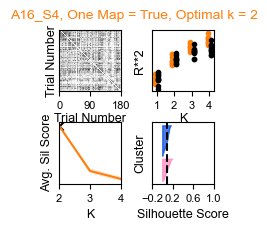

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

outperforms shuffle at optimal k = 3
stat = 55.0, p= 0.001


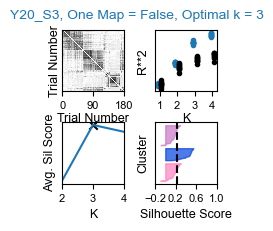

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

outperforms shuffle at optimal k = 4
stat = 55.0, p= 0.001


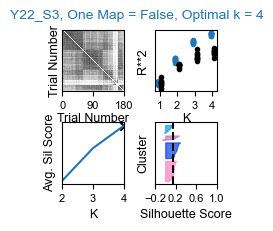

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

outperforms shuffle at optimal k = 2
stat = 55.0, p= 0.001


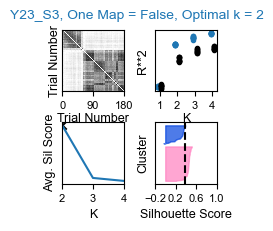

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

In [18]:
'''Plot Extended Data Fig. 4A & S4C:

Y_unwrapped: matrix of shape m, n; m = n_trials & n = (nposbins * ncells)
W: first factor matrix. Has shape (m, rank) or n_trials, n_clusters (i.e. [0, 1] if map 1 and [1, 0] if map 0)
H: second factor matrix. Has shape (rank, n) or n_clusters, n_obs

Run time is about 5 - 15 minutes per session.

'''
possible_k = np.arange(2, 5, 1)
extended_k = np.arange(1,5,1)
colors = ['xkcd:pink','xkcd:blue','xkcd:orchid','xkcd:azure']
n_reps = 10 
alpha = 0.05

# if you want to visualize the quality of k selection for all sessions vs. just the examples in Extended Data Fig. 4A & C:
#example_mice = mice
#example_sessions = sessions

# if you want to visualize the quality of k selection for only the example sessions in Extended Data Fig. 4A & C
example_mice = ['Y23', 'Y20', 'Y22', 'A16']
example_sessions = ['092722_record3','090222_record4']

for m, session in zip(mice, sessions):
    for s in tdqm(session):
        d = data[m][s]
                
        rawdata_file = 'RAW_' + m + '_' + s + '.npy'
        raw = np.load(load_folder + rawdata_file, allow_pickle=True)
        cell_IDs = raw.item().get('cellsfil')
        gridcell = d['gridcell'].astype(bool)
        gridcells = cell_IDs[gridcell]     
        
        if (len(gridcells) >= 10) and (m in example_mice) and (s in example_sessions):
            
            Y = d['FRtensorbacksorted'].copy()
            Y = Y.transpose(0, 2, 1)
            Y_unwrapped = np.reshape(Y, (Y.shape[0], -1))
            
            #Run k-means ten times and choose the k that most frequently most often maximizes the average silhouette score 
            silhouette_avgs = np.zeros((n_reps, len(possible_k)))
            for p in range(n_reps):
                sil_avgs = []
                for n in possible_k:     
                    # fit model and get params
                    model_kmeans = lvl_kmeans(n_components = n, n_restarts = 100)
                    model_kmeans.fit(Y_unwrapped)
                    W, _ = model_kmeans.factors
                    labels = []
                    for t in range(W.shape[0]):
                        mapid = np.where(W[t,:] == 1)[0]
                        labels = np.append(labels, mapid)
                    sil_avgs = np.append(sil_avgs, silhouette_score(Y_unwrapped, labels))
                silhouette_avgs[p,:] = sil_avgs
            
            #compare test R^2 vs. shuffle for k = 1-4
            # Run cross-validated k-means with speckled holdout pattern.
            km_train_scores = np.ones((4, n_reps))
            km_test_scores = np.ones((4, n_reps))

            for i, rank in enumerate(tdqm(extended_k)):
                model = lvl_kmeans(n_components=rank, n_restarts=100, maxiter=1000)
                km_train_scores[i], km_test_scores[i] = \
                    speckled_cv_scores(model, Y_unwrapped, n_repeats=n_reps)

            # Run cross-validated k-means on shuffled/resampled dataset.
            shuff_km_train_scores = np.ones((4, n_reps))
            shuff_km_test_scores = np.ones((4, n_reps))

            for i, rank in enumerate(tdqm(extended_k)):
                model = lvl_kmeans(n_components=rank, n_restarts=100, maxiter=1000)
                shuff_km_train_scores[i], shuff_km_test_scores[i] = \
                    speckled_cv_scores(model, Y_unwrapped, n_repeats=n_reps, resampler=RotationResampler())
            
            #Select optimal k, run KMeans with that k & store results, & plot to confirm quality of results
            if m in SM_aged_mice:
                col = 'C1'
            elif m in SM_MA_mice:
                col = 'C2'
            else:
                col = 'C0'
            
            SilN = possible_k[np.argmax(np.mean(silhouette_avgs, axis = 0))]
            model_kmeans = lvl_kmeans(n_components = SilN, n_restarts = 100)
            model_kmeans.fit(Y_unwrapped)
            W, H = model_kmeans.factors
            Y_hat = model_kmeans.predict()
            score = model_kmeans.score(Y_unwrapped)
            d['kmeans'] = {}
            d['kmeans']['SilN'] = SilN
            d['kmeans']['W'] = W
            d['kmeans']['H'] = H
            d['kmeans']['Y_hat'] = Y_hat 
            d['kmeans']['Y_hat'] = Y_hat 
            d['kmeans']['score'] = score
            
            #check & save whether if sig difference in the distribution of test R^2 real vs. shuffle data at optimal k:
            chosenkidx = np.where(extended_k == SilN)[0]
            res = stats.wilcoxon(km_test_scores[chosenkidx,:][0], shuff_km_test_scores[chosenkidx,:][0], alternative = 'greater')
            onemap = []
            if res.pvalue <= alpha:
                print('outperforms shuffle at optimal k = ' + str(SilN))
                print('stat = ' + str(np.round(res.statistic,2)) + ', p= ' + str(np.round(res.pvalue, 4)))
                onemap = np.append(onemap, [False, res.statistic, res.pvalue])
            else:
                print('does not outperform shuffle, probable one map session')
                print('stat = ' + str(np.round(res.statistic,2)) + ', p= ' + str(np.round(res.pvalue, 4)))
                onemap = np.append(onemap, [True, res.statistic, res.pvalue])

            #save boolean of whether the session was fit well by k > 1 (onemap = False)
            d['kmeans']['onemap'] = onemap
            #onemapfile = 'onemap' + m + '_' + s + '.npy'
            #np.save(save_folder + onemapfile, onemap)
            
            #get map labels & silhouette scores for samples & on average
            labels = []
            for t in range(W.shape[0]):
                mapid = np.where(W[t,:] == 1)[0]
                labels = np.append(labels, mapid)
            silhouette_avg = silhouette_score(Y_unwrapped, labels)
            samp_sil = silhouette_samples(Y_unwrapped, labels)

            ##SHOW GOODNESS OF CHOSEN as in Extended Data Figs. 4A & C
            #Plot silhouette averages + SEM over ten reps. 
            
            fig, ax = plt.subplots(2, 2, figsize = (2,2), sharey = False)
            plt.subplots_adjust(hspace = 0.5, wspace = 0.5)
            fig.suptitle(str(m) + '_S' + str(s[-1]) + ', One Map = ' + str(onemap[0].astype(bool)) + ', Optimal k = ' + str(SilN), color = col, fontsize = 10)

            #plot sparsely labeled sim matrix 
            sim = d['gridsimilaritybacksorted']
            im = ax[0,0].imshow(sim, clim=[0, 1.0], aspect='auto', cmap='Greys', interpolation='none')
            ax[0,0].tick_params(which='major', labelsize=8)
            ax[0,0].set_ylabel('Trial Number', fontsize=9, labelpad=1)
            ax[0,0].set_xlabel('Trial Number', fontsize=9, labelpad=1)
            ax[0,0].set_yticks([])
            ax[0,0].set_xticks([0, 90, 180])
            ax[0,0].tick_params(labelsize = 8)

            #plot test R^2 vs. shuffle
            rax = np.tile(extended_k, (n_reps, 1)).T.ravel()
            ax[0,1].plot(rax-.1, km_test_scores.ravel(), '.', color = col, label = 'Data');
            ax[0,1].plot(rax+.1, shuff_km_test_scores.ravel(), '.k', label = 'Shuffle');
            ax[0,1].set_xticks(extended_k, labels = None)
            ax[0,1].set_ylabel("R**2", fontsize = 9)
            ax[0,1].set_xlabel('K', fontsize=9, labelpad = 1)
            ax[0,1].set_yticks([])
            #ax[0,1].legend(fontsize = 8)
            ax[0,1].tick_params(labelsize = 8)

            #plot of k selection criteria over n reps
            ax[1,0].plot(possible_k, np.mean(silhouette_avgs, axis = 0), color = col)
            ax[1,0].fill_between(possible_k, np.mean(silhouette_avgs, axis = 0) - stats.sem(silhouette_avgs, axis = 0),
                               np.mean(silhouette_avgs, axis = 0) + stats.sem(silhouette_avgs, axis = 0), facecolor = col, alpha = 0.2)
            ax[1,0].scatter(SilN, np.max(np.mean(silhouette_avgs, axis = 0)), color = 'k', marker = 'x')
            ax[1,0].set_xlim([2,4])
            ax[1,0].set_xticks(possible_k, labels = None)
            ax[1,0].set_yticks([])
            ax[1,0].set_ylabel('Avg. Sil Score', fontsize=9)
            ax[1,0].set_xlabel('K', fontsize=9)
            ax[1,0].tick_params(labelsize = 8)

            #plot of k selection criteria over n reps
            ax[1,1].set_xlim([-0.2, 1.0])
            ax[1,1].set_ylim([0, len(Y_unwrapped) + (SilN + 1) * 10])
            y_lower = 10
            for i in range(SilN):
                ith_cluster_silhouette_values = samp_sil[labels == i]
                ith_cluster_silhouette_values.sort()
                size_cluster_i = ith_cluster_silhouette_values.shape[0]
                y_upper = y_lower + size_cluster_i
                color = colors[i]
                ax[1,1].fill_betweenx(np.arange(y_lower, y_upper),0,
                    ith_cluster_silhouette_values,facecolor=color,edgecolor=color,alpha=0.7)
                #ax[1,1].text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))
                y_lower = y_upper + 10  # 10 for the 0 samples
            ax[1,1].set_xlabel("Silhouette Score", fontsize = 9)
            ax[1,1].set_ylabel("Cluster", fontsize = 9)
            ax[1,1].axvline(x=silhouette_avg, color = "k", linestyle="--")
            ax[1,1].set_yticks([]) 
            ax[1,1].set_xticks([-0.2, 0.2, 0.6, 1.0])
            ax[1,1].tick_params(labelsize = 8)

            #plt.tight_layout()
            plt.savefig(save_folder + m + '_' + s + '_S4AorC.png', dpi=400, bbox_inches='tight')
            plt.savefig(save_folder + m + '_' + s + '_S4AorC.svg', dpi=400, bbox_inches='tight')
            plt.show()

In [17]:
''' After k optimization, load in results & perform K-means '''

from scipy.spatial.distance import pdist
from scipy.spatial.distance import squareform

sscore = []

for m, session in zip(mice, sessions):
    for s in tdqm(session):
        d = data[m][s]
                
        rawdata_file = 'RAW_' + m + '_' + s + '.npy'
        raw = np.load(load_folder + rawdata_file, allow_pickle=True)
        cell_IDs = raw.item().get('cellsfil')
        gridcell = d['gridcell'].astype(bool)
        gridcells = cell_IDs[gridcell]     
        
        if len(gridcells) >= 10: 
            
            #Load stuff I have saved previously
            SilN_file = 'SilN_' + m + '_' + s + '.npy'
            SilN = np.load(save_folder + SilN_file)
            
            #fit K-means
            Y = d['FRtensorbacksorted'].copy()
            Y = Y.transpose(0, 2, 1)
            Y_unwrapped = np.reshape(Y, (Y.shape[0], -1))
            
            model_kmeans = lvl_kmeans(n_components = SilN, n_restarts = 100)
            model_kmeans.fit(Y_unwrapped)
            W, H = model_kmeans.factors
            Y_hat = model_kmeans.predict()
            score = model_kmeans.score(Y_unwrapped)
            d['kmeans'] = {}
            d['kmeans']['SilN'] = SilN
            d['kmeans']['W'] = W
            d['kmeans']['H'] = H
            d['kmeans']['Y_hat'] = Y_hat 
            d['kmeans']['Y_hat'] = Y_hat 
            d['kmeans']['score'] = score
            
            #load boolean to determine if I should keep k-means map in dataset (better than shuffle at chosen k)
            onemapfile = 'onemap' + m + '_' + s + '.npy'
            onemap = np.load(save_folder + onemapfile)
            d['kmeans']['onemap'] = onemap
            
            if onemap[0].astype(bool) == True:
                sscore = np.append(sscore, np.nan)
            else:
                sscore = np.append(sscore, score)
        else:
            sscore = np.append(sscore, np.nan)

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

In [43]:
'''Suggest which mice to exclude from Split Maze Sequencing Sample based on Missing Sessions with Min. Grid Cell Density

Note: To keep the pool of sequenced mice sex-balanced within each age group & batch, we selected 3 mice from each 
sex within each age group. Therefore, MA6 & MA5 were included because MA3 was the only male MA mouse with 6 sessions 
with behavioral data and grid networks and MA6/MA5 were the next two best MA male mice.   

'''
for m, session in zip(mice, sessions):
   
    msex = np.array(animalmeta.loc[(animalmeta.Animal_ID == m),'Sex'])
    age = np.array(animalmeta.loc[(animalmeta.Animal_ID == m),'Age_Group'])
        
    ngrid10 = 0
    totalgrid = 0
    
    for s in session:
        
        d = data[m][s]
        
        #get some data & cell IDs
        rawdata_file = 'RAW_' + m + '_' + s + '.npy'
        raw = np.load(load_folder + rawdata_file, allow_pickle=True)
        cell_IDs = raw.item().get('cellsfil')
        gridcell = d['gridcell'].astype(bool)
        gridcells = cell_IDs[gridcell]
        
        totalgrid += len(gridcells)
        
        if len(gridcells) >= 10: 
            
            onemapfile = 'onemap' + m + '_' + s + '.npy'
            onemap = np.load(save_folder + onemapfile)
            d['kmeans']['onemap'] = onemap
            
            if onemap[0].astype(bool) == False:
                ngrid10 += 1       
            
    if ngrid10 < 5:
        print('also exclude ' + str(m) + ' for ' + str(6 - ngrid10) + ' missing session(s) with grid networks')

also exclude A14 for 6 missing session(s) with grid networks
also exclude A16 for 4 missing session(s) with grid networks
also exclude A17 for 2 missing session(s) with grid networks
also exclude A20 for 2 missing session(s) with grid networks
also exclude A23 for 3 missing session(s) with grid networks
also exclude MA4M for 3 missing session(s) with grid networks
also exclude MA5M for 2 missing session(s) with grid networks
also exclude MA6M for 2 missing session(s) with grid networks
also exclude MA7M for 3 missing session(s) with grid networks
also exclude Y26 for 2 missing session(s) with grid networks


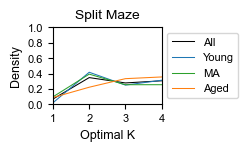


Optimal K KS:
A vs. Y CDF: Stat 0.12638888888888888, p=0.7872920372535105, sign=-1, loc=2.0
MA vs. Y CDF: Stat 0.07720588235294118, p=0.9938706983175754, sign=1, loc=1.0
A vs. MA CDF: Stat 0.17908496732026144, p=0.3716425042933553, sign=-1, loc=2.0


In [46]:
''' Plot Extended Data Fig. 4E (Right): Histogram of Optimal K for Split Maze Sessions'''
allks = []
optimalks = []
yk = []
mak = []
ak =[]
for m, session in zip(mice, sessions):
    for s in session:
        d = data[m][s]
        
        #get some data & cell IDs
        rawdata_file = 'RAW_' + m + '_' + s + '.npy'
        spikes_file = 'SPIKES_' + m + '_' + s +'.npy'
        behavior_file = 'BEHAVIOR_' + m + '_' + s + '.npy'
        
        raw = np.load(load_folder + rawdata_file, allow_pickle=True)
        Y = np.load(load_folder + spikes_file, allow_pickle=False) #pre-filtered for speeds >2cm/s, position-corrected spikes, 20 ms timebins
        behaviorfil = np.load(load_folder + behavior_file, allow_pickle=False)
        
        cell_IDs = raw.item().get('cellsfil')
        gridcell = d['gridcell'].astype(bool)
        gridcells = cell_IDs[gridcell]   
        
        if len(gridcells) >= 10:
            SilN = d['kmeans']['SilN']
            onemap = d['kmeans']['onemap'] # vector [one map boolean, WSR Stat, WSR P-Value]
            
            if onemap[0].astype(bool) == True:
                optimalks = np.append(optimalks, 1)
                allks = np.append(allks, 1)
                
                if m in SM_aged_mice:
                    ak = np.append(ak, 1)
                elif m in SM_MA_mice:
                    mak = np.append(mak, 1)
                else:
                    yk = np.append(yk, 1)
                 
                #Print Source Data for Extended Data Fig. 4e (right)
                #print(str(m) + ',' + str(s[-1]) + ',' + str(1))
                
            else:
                optimalks = np.append(optimalks, SilN)
                allks = np.append(allks, SilN)
                
                if m in SM_aged_mice:
                    ak = np.append(ak, SilN)
                elif m in SM_MA_mice:
                    mak = np.append(mak, SilN)
                else:
                    yk = np.append(yk, SilN)
                    
                #Print Source Data for Extended Data Fig. 4e (right)    
                #print(str(m) + ',' + str(s[-1]) + ',' + str(SilN))
        else:
            allks = np.append(allks, np.nan)

#Plot half of Extended Data Fig. 4E
kbins = np.arange(1,5,1)
fig, ax = plt.subplots(figsize = (1.4,1))

allk, bin_edges = np.histogram(optimalks, bins = [1,2,3,4,5])
pdf = allk / sum(allk)
ax.plot(kbins, pdf, '-', linewidth = 0.75, alpha = 1, color = 'k', label = 'All')

y, bin_edges = np.histogram(yk, bins = [1,2,3,4,5])
pdf = y / sum(y)
ax.plot(kbins, pdf, '-', linewidth = 0.75, alpha = 1, color = 'C0', label = 'Young')

ma, bin_edges = np.histogram(mak, bins = [1,2,3,4,5])
pdf = ma / sum(ma)
ax.plot(kbins, pdf, '-', linewidth = 0.75, alpha = 1, color = 'C2', label = 'MA')

a, bin_edges = np.histogram(ak, bins = [1,2,3,4,5])
pdf = a / sum(a)
ax.plot(kbins, pdf, '-', linewidth = 0.75, alpha = 1, color = 'C1', label = 'Aged')
ax.tick_params(labelsize = 8)

plt.title('Split Maze', fontsize = 10)
plt.ylabel('Density', fontsize = 9)
plt.xlabel('Optimal K', fontsize = 9)
plt.xlim([1,4])
plt.xticks([1,2,3,4])
plt.yticks([0,0.2,0.4,0.6,0.8,1.0])
plt.ylim([0,1])

ax.legend(bbox_to_anchor = (1,1), fontsize = 8)
plt.savefig(save_folder + 'S4Eright.png', dpi=400, bbox_inches='tight')
plt.savefig(save_folder + 'S4Eright.svg', dpi=400, bbox_inches='tight')
plt.show()

#run KS on optimal k distributions
print('\nOptimal K KS:')
res = stats.ks_2samp(ak,yk, alternative = 'two-sided')
stat = res.statistic; p_value = res.pvalue; loc = res.statistic_location; sign = res.statistic_sign
print('A vs. Y CDF: Stat ' + str(stat) + ', p=' + str(p_value) + ', sign=' + str(sign) + ', loc=' + str(loc))

res = stats.ks_2samp(mak,yk, alternative = 'two-sided')
stat = res.statistic; p_value = res.pvalue; loc = res.statistic_location; sign = res.statistic_sign
print('MA vs. Y CDF: Stat ' + str(stat) + ', p=' + str(p_value) + ', sign=' + str(sign) + ', loc=' + str(loc))

res = stats.ks_2samp(ak,mak, alternative = 'two-sided')
stat = res.statistic; p_value = res.pvalue; loc = res.statistic_location; sign = res.statistic_sign
print('A vs. MA CDF: Stat ' + str(stat) + ', p=' + str(p_value) + ', sign=' + str(sign) + ', loc=' + str(loc))

# Compare remapping frequency across age groups

In [18]:
''' Get remapping frequency by task phase across age groups'''

#get remap indices not requiring minimum map size
for m, session in zip(mice, sessions):
    for s in session:
        d = data[m][s]
        
        rawdata_file = 'RAW_' + m + '_' + s + '.npy'
        raw = np.load(load_folder + rawdata_file, allow_pickle=True)
        cell_IDs = raw.item().get('cellsfil')
        gridcell = d['gridcell'].astype(bool)
        gridcells = cell_IDs[gridcell]
        
        if len(gridcells) >= 10: 
            
            W = d['kmeans']['W']
            trials = np.arange(0, W.shape[0]-1)
            
            # define remaps
            remap_idx = np.asarray([])
            for w in range(W.shape[1]):
                remaps = np.where(np.abs(np.diff(W[:, w])))[0]
                remap_idx = np.append(remap_idx, remaps)
            remap_idx = np.unique(remap_idx)
            stable_idx = np.setdiff1d(trials,remap_idx)
            
            # save remap vs. stable indices
            d['remap_idx'] = [stable_idx.astype(int), remap_idx.astype(int)]

# get remapping frequency            
sblockremaps = []
saltremaps = []
gridmultimapsesh = []

alt_idx = 140

for m, session in zip(mice, sessions):
    for s in session:
        d = data[m][s]
        rawdata_file = 'RAW_' + m + '_' + s + '.npy'
        raw = np.load(load_folder + rawdata_file, allow_pickle=True)
        cell_IDs = raw.item().get('cellsfil')
        gridcell = d['gridcell'].astype(bool)
        gridcells = cell_IDs[gridcell]
        
        if len(gridcells) >= 10: 
            onemap = d['kmeans']['onemap']
            
            if onemap[0].astype(bool) == True:
                gridmultimapsesh = np.append(gridmultimapsesh, False)
                #print('skipping remapping assessment for one-map sesh ' + str(m) + ', ' + str(s))
                
                sblockremaps = np.append(sblockremaps, np.nan)
                saltremaps = np.append(saltremaps, np.nan)
                
            else:
                W = d['kmeans']['W']
                trials = np.arange(0, W.shape[0]-1)
                remap_idx = d['remap_idx'][1]
                gridmultimapsesh = np.append(gridmultimapsesh, True)

                # Load in left vs. right info
                trialinfo = raw.item().get('trialinfo')
                left = trialinfo['left']

                skippedrawtrialfil = d['skippedrawtrialfil'].astype(int)
                VRbackidx = d['VRbackidx'].astype(int)

                #binary context vector, excluding skipped trials, dark, & gain periods, 1 = Map A
                leftsort = left.copy()
                lefttail = left[alt_idx:]
                leftsort[alt_idx:] = lefttail[np.argsort(-1*lefttail, kind = 'stable')]

                context = []
                for i, t in enumerate(np.unique(skippedrawtrialfil[VRbackidx])):
                    context = np.append(context, leftsort[t.astype(int)])
                altcontextidx = np.where(np.diff(context) == 1.)[0][0] + 1 #index where alternation begins in context vectors

                #get n_switches & remap_idx for block only
                blockremap_idx = remap_idx[remap_idx < altcontextidx]
                sblockremaps = np.append(sblockremaps, blockremap_idx.shape[0]/len(trials[:altcontextidx]))
                   
                altremap_idx = remap_idx[remap_idx >= altcontextidx]
                saltremaps = np.append(saltremaps, altremap_idx.shape[0]/len(trials[altcontextidx:]))
                
                #Print Figure 3b Source Data
                #print(str(m) + ',' + str(blockremap_idx.shape[0]/len(trials[:altcontextidx])) + ',' + str(altremap_idx.shape[0]/len(trials[altcontextidx:])))
        else:
            gridmultimapsesh = np.append(gridmultimapsesh, False)
            sblockremaps = np.append(sblockremaps, np.nan)
            saltremaps = np.append(saltremaps, np.nan)

In [19]:
''' Find where nan and ignore for plotting '''
nan_idx10grid = np.where((gridmultimapsesh.astype(bool) == 0))[0]

# Adjust y_sind, ma_sind, age_sind for subsequent plots
y_sind10grid = np.setdiff1d(y_sind, nan_idx10grid)
ma_sind10grid = np.setdiff1d(ma_sind, nan_idx10grid)
age_sind10grid = np.setdiff1d(age_sind, nan_idx10grid)

# Adjust colormaps for grid plots
yidx = []
maidx = []
aidx = []
for i in nan_idx10grid:
    yidx = np.append(yidx, np.where(y_sind == i)[0].astype(int))
    maidx = np.append(maidx, np.where(ma_sind == i)[0].astype(int))
    aidx = np.append(aidx, np.where(age_sind == i)[0].astype(int)) 

col_session_young10grid = np.delete(col_session_young, list(yidx.astype(int)), axis = 0)
col_session_ma10grid = np.delete(col_session_MA, list(maidx.astype(int)), axis = 0)
col_session_old10grid = np.delete(col_session_old, list(aidx.astype(int)), axis = 0)
col_session10grid = [col_session_young10grid, col_session_ma10grid, col_session_old10grid] 

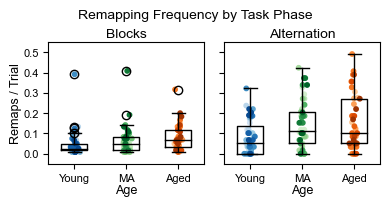

In [20]:
''' Plot Figure 3B, comparing remapping frequency across groups in the Split Maze'''

fig, ax = plt.subplots(1,2, figsize = (4,2.25), sharey = True)
fig.suptitle('Remapping Frequency by Task Phase', fontsize = 10, y = 0.9)

sblockremaps_tog = [sblockremaps[y_sind10grid], sblockremaps[ma_sind10grid],sblockremaps[age_sind10grid]]
labels = ['Young','MA','Aged']
w = 0.5
ax[0].boxplot(sblockremaps_tog, widths = w, labels = labels, medianprops = dict(color = 'black'))
ax[0].set_xlabel('Age', fontsize=9, labelpad=1)
ax[0].set_xticklabels(labels = labels, fontsize = 9)
ax[0].tick_params(labelsize = 8)
ax[0].set_ylabel('Remaps / Trial', fontsize=9, labelpad=1)
ax[0].set_yticks([0,0.1,0.2,0.3,0.4,0.5])
ax[0].set_ylim([-0.05,0.55])
ax[0].set_title('Blocks', fontsize = 10, pad = 3)

for i in range(len(sblockremaps_tog)):
    y = sblockremaps_tog[i]
    x = np.random.normal(i + 1, 0.04, len(y))
    ax[0].scatter(x, y, color = col_session10grid[i][:len(y)], edgecolors = col_session10grid[i][:len(y)], alpha = 1, s = 10)
    
saltremaps_tog = [saltremaps[y_sind10grid], saltremaps[ma_sind10grid],saltremaps[age_sind10grid]]
labels = ['Young','MA','Aged']
w = 0.5
ax[1].boxplot(saltremaps_tog, widths = w, labels = labels, medianprops = dict(color = 'black'))
ax[1].set_xlabel('Age', fontsize=9, labelpad=1)
#ax[1].set_ylabel('Remaps / Trial', fontsize=9, labelpad=1)
ax[1].set_xticklabels(labels = labels, fontsize = 8)
ax[1].tick_params(labelsize = 8)
ax[1].set_yticks([0,0.1,0.2,0.3,0.4,0.5])
ax[1].set_title('Alternation', fontsize = 10, pad = 3)

for i in range(len(saltremaps_tog)):
    y = saltremaps_tog[i]
    x = np.random.normal(i + 1, 0.04, len(y))
    ax[1].scatter(x, y, color = col_session10grid[i][:len(y)], edgecolors = col_session10grid[i][:len(y)], alpha = 1, s = 10)
    
#ax[1].legend(handles = handles, labels = label_mice, ncol = 2, bbox_to_anchor=(1.2, 1))
plt.tight_layout()
plt.savefig(save_folder + '3B.png', dpi=400, bbox_inches='tight')
plt.savefig(save_folder + '3B.svg', dpi=400, bbox_inches='tight')
plt.show()

In [20]:
''' Perform Kruskal Wallis Test on Remapping Frequency in each Task Phase w/ Multiple Comparisons Correcition'''

print('n young, MA, aged sessions: ')
print(len(y_sind10grid), len(ma_sind10grid), len(age_sind10grid))

import statsmodels.api as sm
import scikit_posthocs as ph

H, p = stats.kruskal(sblockremaps[y_sind10grid],sblockremaps[ma_sind10grid],sblockremaps[age_sind10grid])
print('block remapping freq KW test H, p = ')
print(H, p)

print('\nmean ± SEM young block remap freq:')
print(str(np.mean(sblockremaps[y_sind10grid])) + ' ± '+ str(stats.sem(sblockremaps[y_sind10grid]))) 

print('mean ± SEM MA block remap freq:')
print(str(np.mean(sblockremaps[ma_sind10grid])) + ' ± '+ str(stats.sem(sblockremaps[ma_sind10grid]))) 

print('mean ± SEM age block remap freq:')
print(str(np.mean(sblockremaps[age_sind10grid])) + ' ± '+ str(stats.sem(sblockremaps[age_sind10grid]))) 

#make into dataframe
sex = list(animalmeta.Sex[mice_ind])
sexes = []
seshmice = []
seshcount = []
seshage = []
seshcohort = []
for m, session in zip(mice, sessions):
    msex = np.array(animalmeta.loc[(animalmeta.Animal_ID == m),'Sex'])
    age = np.array(animalmeta.loc[(animalmeta.Animal_ID == m),'Age_Group'])
    cohort = np.array(animalmeta.loc[(animalmeta.Animal_ID == m),'Cohort'])
    totalsesh = len(session)
    
    for i, s in enumerate(session):
        sexes = np.append(sexes, msex)
        seshmice = np.append(seshmice, m)
        seshcount = np.append(seshcount, (i + 1))
        seshage = np.append(seshage, age)
        seshcohort = np.append(seshcohort, cohort)

# Collect all relevant data into pandas dataframe
allidx = np.concatenate((y_sind10grid,ma_sind10grid,age_sind10grid))
Animal_ID = list(seshmice[allidx])
Session = list(seshcount[allidx])
Cohort = list(seshcohort[allidx])
Sex = list(sexes[allidx])
Age_Group = list(seshage[allidx])
BlockFreq = list(sblockremaps[allidx])
AltFreq = list(saltremaps[allidx])

tuples = list(zip(Animal_ID, Session, Sex, Age_Group, Cohort, BlockFreq, AltFreq))
tuples

df = pd.DataFrame(tuples, columns = ['AnimalID', 'Session', 'Sex', 'AgeGroup','Cohort','BlockFreq','AltFreq'])
df = df.dropna(axis = 0)

#Run Post Hoc Tests on Block Remapping Frequency
ph.posthoc_conover(df, val_col = 'BlockFreq', group_col = 'AgeGroup', p_adjust = 'holm')

n young, MA, aged sessions: 
47 46 41
block remapping freq KW test H, p = 
14.873649908094352 0.000589152818357619

mean ± SEM young block remap freq:
0.044760605133741034 ± 0.008487108660971781
mean ± SEM MA block remap freq:
0.06503623188405798 ± 0.01027539326437745
mean ± SEM age block remap freq:
0.07874539554856792 ± 0.009435321553373717


,1.0,2.0,3.0
1.0,1.000000,0.043263,0.000274
2.0,0.043263,1.000000,0.078666
3.0,0.000274,0.078666,1.000000


In [21]:
#Run Post Hoc Tests on Alt Remapping Frequency
H, p = stats.kruskal(saltremaps[y_sind10grid],saltremaps[ma_sind10grid],saltremaps[age_sind10grid])
print('alt remapping freq KW test H, p = ')
print(H, p)

print('\nmean ± SEM young alt remap freq:')
print(str(np.mean(saltremaps[y_sind10grid])) + ' ± '+ str(stats.sem(saltremaps[y_sind10grid]))) 

print('mean ± SEM MA alt remap freq:')
print(str(np.mean(saltremaps[ma_sind10grid])) + ' ± '+ str(stats.sem(saltremaps[ma_sind10grid]))) 

print('mean ± SEM age alt remap freq:')
print(str(np.mean(saltremaps[age_sind10grid])) + ' ± '+ str(stats.sem(saltremaps[age_sind10grid]))) 

ph.posthoc_conover(df, val_col = 'AltFreq', group_col = 'AgeGroup', p_adjust = 'holm')

alt remapping freq KW test H, p = 
8.519204765287897 0.014127918799222533

mean ± SEM young alt remap freq:
0.08412821491908265 ± 0.013807749611183518
mean ± SEM MA alt remap freq:
0.14739843185327176 ± 0.01819996782802457
mean ± SEM age alt remap freq:
0.15071361350894716 ± 0.02223110750499439


,1.0,2.0,3.0
1.0,1.00000,0.019490,0.042260
2.0,0.01949,1.000000,0.727719
3.0,0.04226,0.727719,1.000000


C:\Users\Python\anaconda3\envs\agingmec\lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\Python\anaconda3\envs\agingmec\lib\site-packages\statsmodels\regression\mixed_linear_model.py:2201: ConvergenceWarning: Retrying MixedLM optimization with lbfgs
  warnings.warn(
C:\Users\Python\anaconda3\envs\agingmec\lib\site-packages\statsmodels\regression\mixed_linear_model.py:2238: ConvergenceWarning: The MLE may be on the boundary of the parameter space.
  warnings.warn(msg, ConvergenceWarning)
C:\Users\Python\anaconda3\envs\agingmec\lib\site-packages\statsmodels\regression\mixed_linear_model.py:2262: ConvergenceWarning: The Hessian matrix at the estimated parameter values is not positive definite.
  warnings.warn(msg, ConvergenceWarning)


               Mixed Linear Model Regression Results
Model:                  MixedLM     Dependent Variable:     AltFreq
No. Observations:       134         Method:                 REML   
No. Groups:             28          Scale:                  0.0133 
Min. group size:        2           Log-Likelihood:         77.6375
Max. group size:        6           Converged:              Yes    
Mean group size:        4.8                                        
-------------------------------------------------------------------
                         Coef.  Std.Err.   z    P>|z| [0.025 0.975]
-------------------------------------------------------------------
Intercept                 0.063    0.041  1.512 0.131 -0.019  0.144
C(AgeGroup)[T.2.0]        0.134    0.058  2.307 0.021  0.020  0.247
C(AgeGroup)[T.3.0]        0.122    0.060  2.041 0.041  0.005  0.239
C(Sex)[T.M]              -0.001    0.034 -0.042 0.966 -0.069  0.066
C(Cohort)[T.D]            0.027    0.043  0.638 0.524 -0.056  0

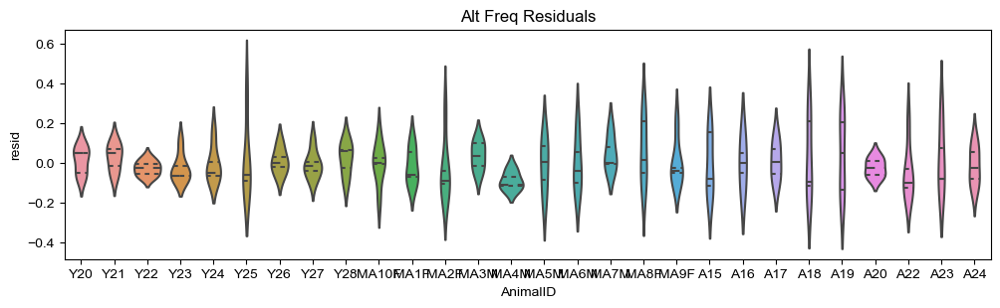

Raw Data Mean across All Sessions by Animal:
AnimalID
A15      0.123086
A16      0.163149
A17      0.134962
A18      0.172881
A19      0.207286
A20      0.139831
A22      0.115819
A23      0.169979
A24      0.149718
MA10F    0.143104
MA1F     0.132203
MA2F     0.110267
MA3M     0.173583
MA4M     0.033898
MA5M     0.132379
MA6M     0.146338
MA7M     0.215663
MA8F     0.203390
MA9F     0.149153
Y20      0.081765
Y21      0.095383
Y22      0.040503
Y23      0.041061
Y24      0.061017
Y25      0.101695
Y26      0.101695
Y27      0.084746
Y28      0.115780

Fitted Data Mean across All Sessions by Animal:
AnimalID
A15      0.131267
A16      0.164695
A17      0.124581
A18      0.144638
A19      0.163670
A20      0.163669
A22      0.163669
A23      0.148070
A24      0.163669
MA10F    0.146337
MA1F     0.147764
MA2F     0.146336
MA3M     0.137753
MA4M     0.123480
MA5M     0.141320
MA6M     0.152024
MA7M     0.166296
MA8F     0.142056
MA9F     0.147764
Y20      0.068010
Y21      0.066679
Y22   

In [28]:
''' Fit LMM to Alternation Remapping Frequency; Report Fitted Results for Figure 8'''
import statsmodels.api as sm
import statsmodels.formula.api as smf

# Alt Freq Dependent
mfreq = smf.mixedlm('AltFreq ~ 1 + C(AgeGroup) + C(Sex) + C(Cohort) + Session:C(AgeGroup)', groups = 'AnimalID', re_formula = '1',
                     data=df).fit(reml= True)
print(mfreq.summary())
print(mfreq.wald_test_terms(scalar = False))
#print(mfreq.aic)
#print(mfreq.bic)

df['resid'] = mfreq.resid
fig, ax = plt.subplots(figsize = (12,3))
sns.violinplot(data = df, x = 'AnimalID', y = 'resid', inner = 'quartile', ax = ax)
plt.title('Alt Freq Residuals')
plt.show()

df['mfreqfitted'] = mfreq.fittedvalues
animalgrouped = df.groupby(['AnimalID'])

print('Raw Data Mean across All Sessions by Animal:')
print(animalgrouped['AltFreq'].mean().to_string(index=True))

print('\nFitted Data Mean across All Sessions by Animal:')
print(animalgrouped['mfreqfitted'].mean().to_string(index=True))

# No sig. session x age effects... Therefore, reporting mean across sessions
#print('\nFitted Data Mean across All Sessions by Animal:')
#last3mean = df.loc[df['Session'] >= 4].groupby(['AnimalID'])['fitted'].mean().to_numpy()
#first3mean = df.loc[df['Session'] <= 3].groupby(['AnimalID'])['fitted'].mean().to_numpy()
#print('Sim Ratio First Three: ')
#print(df.loc[df['Session'] <= 3].groupby(['AnimalID'])['mfreqfitted'].mean().to_string(index = False))
#print('Sim Ratio Last Three: ')
#print(df.loc[df['Session'] >= 4].groupby(['AnimalID'])['mfreqfitted'].mean().to_string(index = True))

#print('\nRaw Data Mean across All Sessions by Animal:')
#last3mean = df.loc[df['Session'] >= 4].groupby(['AnimalID'])['fitted'].mean().to_numpy()
#first3mean = df.loc[df['Session'] <= 3].groupby(['AnimalID'])['fitted'].mean().to_numpy()
#print('First Three: ')
#print(df.loc[df['Session'] <= 3].groupby(['AnimalID'])['AltFreq'].mean().to_string(index = False))
#print('Last Three: ')
#print(df.loc[df['Session'] >= 4].groupby(['AnimalID'])['AltFreq'].mean().to_string(index = True))

Association btwn Young, MA, Aged, & All Performance & Variable of Interest:
R [Young, MA, Aged, All]: 
-0.010581068240958391 -0.10279508173054572 -0.10620883778170512 -0.11864759588372675
P [Young, MA, Aged, All]: 
0.9437250757550179 0.49662643243838034 0.5086698293198801 0.1721254624775097


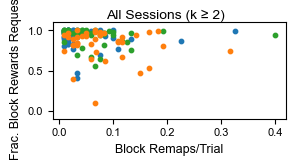

Association btwn Young, MA, Aged, & All Performance & Variable of Interest:
R [Young, MA, Aged, All]: 
-0.24077039302160405 -0.018263516734662755 -0.1423907051979896 -0.15868511521348885
P [Young, MA, Aged, All]: 
0.10304366444084241 0.9041106772649421 0.37449419918952653 0.06705199608268682


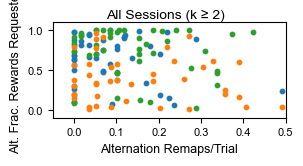

Association btwn Young, MA, Aged, & All Performance & Variable of Interest:
R [Young, MA, Aged, All]: 
-0.16478688768261737 0.07815997827847877 -0.050382947646888894 -0.10071298097807363
P [Young, MA, Aged, All]: 
0.268341831985673 0.605638656370283 0.7544096336829448 0.24692062512053548


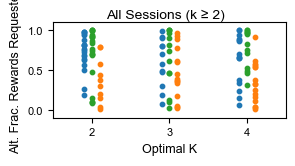

In [52]:
''' Plot relationship between alternation behavior and remapping frequency or optimal k (Extended Data Fig. 4I [left & right]) '''

### Block Remaps/Trial vs. REQ RATES (Not In Paper)
#Linear regression
res = stats.linregress(sblockremaps[y_sind10grid],reqblock_rates[y_sind10grid])
yslope1 = res.slope; yint1 = res.intercept; yr1 = res.rvalue; yp1 = res.pvalue

res = stats.linregress(sblockremaps[ma_sind10grid],reqblock_rates[ma_sind10grid])
maslope1 = res.slope; maint1 = res.intercept; mar1 = res.rvalue ; map1 = res.pvalue

res = stats.linregress(sblockremaps[age_sind10grid],reqblock_rates[age_sind10grid])
aslope1 = res.slope; aint1 = res.intercept; ar1 = res.rvalue ; ap1 = res.pvalue

allidx = np.concatenate((y_sind10grid,ma_sind10grid,age_sind10grid))
res = stats.linregress(sblockremaps[allidx],reqblock_rates[allidx])
allslope1 = res.slope; allint1 = res.intercept; allr1 = res.rvalue; allp1 = res.pvalue

print('Association btwn Young, MA, Aged, & All Performance & Variable of Interest:')
print('R [Young, MA, Aged, All]: ')
print(yr1, mar1, ar1, allr1)
print('P [Young, MA, Aged, All]: ')
print(yp1, map1, ap1, allp1)
        
fig, ax = plt.subplots(figsize = (3.00,1.25))
fig.suptitle('All Sessions (k ≥ 2)', fontsize = 10)
ax.scatter(sblockremaps[y_sind10grid],reqblock_rates[y_sind10grid], color = 'C0', s = 10)
ax.scatter(sblockremaps[ma_sind10grid],reqblock_rates[ma_sind10grid], color = 'C2', s = 10)
ax.scatter(sblockremaps[age_sind10grid],reqblock_rates[age_sind10grid], color = 'C1', s = 10)
ax.set_xlabel('Block Remaps/Trial', fontsize = 9)
ax.set_ylabel('Frac. Block Rewards Requested', fontsize = 9)
ax.set_ylim([-0.1,1.1])
#ax.set_xlim([-0.05,0.5])
ax.tick_params(labelsize = 8)
X_plot = np.linspace(ax.get_xlim()[0],ax.get_xlim()[1],100)
#ax.plot(X_plot, aslope1*X_plot + aint1, '--', linewidth = 0.75, color = 'C1', label = 'Aged')
#ax.plot(X_plot, allslope1*X_plot + allint1, '-', linewidth = 0.75, color = 'k', label = 'All Ages')
plt.show()

### ALT Remaps/Trial vs. REQ RATES
#Linear regression
res = stats.linregress(saltremaps[y_sind10grid],reqalt_rates[y_sind10grid])
yslope1 = res.slope; yint1 = res.intercept; yr1 = res.rvalue; yp1 = res.pvalue

res = stats.linregress(saltremaps[ma_sind10grid],reqalt_rates[ma_sind10grid])
maslope1 = res.slope; maint1 = res.intercept; mar1 = res.rvalue ; map1 = res.pvalue

res = stats.linregress(saltremaps[age_sind10grid],reqalt_rates[age_sind10grid])
aslope1 = res.slope; aint1 = res.intercept; ar1 = res.rvalue ; ap1 = res.pvalue

allidx = np.concatenate((y_sind10grid,ma_sind10grid,age_sind10grid))
res = stats.linregress(saltremaps[allidx],reqalt_rates[allidx])
allslope1 = res.slope; allint1 = res.intercept; allr1 = res.rvalue; allp1 = res.pvalue

print('Association btwn Young, MA, Aged, & All Performance & Variable of Interest:')
print('R [Young, MA, Aged, All]: ')
print(yr1, mar1, ar1, allr1)
print('P [Young, MA, Aged, All]: ')
print(yp1, map1, ap1, allp1)
        
fig, ax = plt.subplots(figsize = (3.00,1.25))
fig.suptitle('All Sessions (k ≥ 2)', fontsize = 10)
ax.scatter(saltremaps[y_sind10grid],reqalt_rates[y_sind10grid], color = 'C0', s = 10)
ax.scatter(saltremaps[ma_sind10grid],reqalt_rates[ma_sind10grid], color = 'C2', s = 10)
ax.scatter(saltremaps[age_sind10grid],reqalt_rates[age_sind10grid], color = 'C1', s = 10)
ax.set_xlabel('Alternation Remaps/Trial', fontsize = 9)
ax.set_ylabel('Alt. Frac. Rewards Requested', fontsize = 9)
ax.set_ylim([-0.1,1.1])
ax.set_xlim([-0.05,0.5])
ax.tick_params(labelsize = 8)
X_plot = np.linspace(ax.get_xlim()[0],ax.get_xlim()[1],100)
#ax.plot(X_plot, aslope1*X_plot + aint1, '--', linewidth = 0.75, color = 'C1', label = 'Aged')
#ax.plot(X_plot, allslope1*X_plot + allint1, '-', linewidth = 0.75, color = 'k', label = 'All Ages')
plt.savefig(save_folder + 'S4Ileft.png', dpi = 400, bbox_inches = 'tight')
plt.savefig(save_folder + 'S4Ileft.svg', dpi = 400, bbox_inches = 'tight')
plt.show()

### Optimal K vs. REQ RATES
#Linear regression
res = stats.linregress(allks[y_sind10grid],reqalt_rates[y_sind10grid])
yslope1 = res.slope; yint1 = res.intercept; yr1 = res.rvalue; yp1 = res.pvalue

res = stats.linregress(allks[ma_sind10grid],reqalt_rates[ma_sind10grid])
maslope1 = res.slope; maint1 = res.intercept; mar1 = res.rvalue ; map1 = res.pvalue

res = stats.linregress(allks[age_sind10grid],reqalt_rates[age_sind10grid])
aslope1 = res.slope; aint1 = res.intercept; ar1 = res.rvalue ; ap1 = res.pvalue

allidx = np.concatenate((y_sind10grid,ma_sind10grid,age_sind10grid))
res = stats.linregress(allks[allidx],reqalt_rates[allidx])
allslope1 = res.slope; allint1 = res.intercept; allr1 = res.rvalue; allp1 = res.pvalue

print('Association btwn Young, MA, Aged, & All Performance & Variable of Interest:')
print('R [Young, MA, Aged, All]: ')
print(yr1, mar1, ar1, allr1)
print('P [Young, MA, Aged, All]: ')
print(yp1, map1, ap1, allp1)

fig, ax = plt.subplots(figsize = (3.00,1.25))
fig.suptitle('All Sessions (k ≥ 2)', fontsize = 10)
ax.scatter(allks[y_sind10grid] - 0.1,reqalt_rates[y_sind10grid], color = 'C0', s = 10)
ax.scatter(allks[ma_sind10grid],reqalt_rates[ma_sind10grid], color = 'C2', s = 10)
ax.scatter(allks[age_sind10grid] + 0.1,reqalt_rates[age_sind10grid], color = 'C1', s = 10)
ax.set_xlabel('Optimal K', fontsize = 9)
ax.set_ylabel('Alt. Frac. Rewards Requested', fontsize = 9)
ax.set_ylim([-0.1,1.1])
ax.set_xlim([1.5, 4.5])
ax.set_xticks([2,3,4])
ax.tick_params(labelsize = 8)
X_plot = np.linspace(ax.get_xlim()[0],ax.get_xlim()[1],100)
#ax.plot(X_plot, aslope1*X_plot + aint1, '--', linewidth = 0.75, color = 'C1', label = 'Aged')
#ax.plot(X_plot, allslope1*X_plot + allint1, '-', linewidth = 0.75, color = 'k', label = 'All Ages')
plt.savefig(save_folder + 'S4Iright.png', dpi = 400, bbox_inches = 'tight')
plt.savefig(save_folder + 'S4Iright.svg', dpi = 400, bbox_inches = 'tight')
plt.show()

#Print Young Session Source Data of Extended Data Fig. 4i
#print(list(saltremaps[y_sind10grid]))
#print(list(allks[y_sind10grid]))
#print(list(reqalt_rates[y_sind10grid]))

#Print MA Session Source Data of Extended Data Fig. 4i
#print(list(saltremaps[ma_sind10grid]))
#print(list(allks[ma_sind10grid]))
#print(list(reqalt_rates[ma_sind10grid]))

#Print Aged Session Source Data of Extended Data Fig. 4i
#print(list(saltremaps[age_sind10grid]))
#print(list(allks[age_sind10grid]))
#print(list(reqalt_rates[age_sind10grid]))

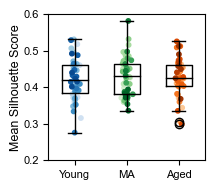

n young, MA, aged sessions: 
47 46 41
avg. optimal sil score KW test H, p = 
0.5018861380020212 0.7780666664106693

mean ± SEM young avg. optimal sil score:
0.42099695728842884 ± 0.008276088493172816
mean ± SEM MA avg. optimal sil score:
0.4299249049925144 ± 0.00783910598996579
mean ± SEM age avg. optimal sil score:
0.42501336087036407 ± 0.008337536530349321


,1.0,2.0,3.0
1.0,1.0,1.0,1.0
2.0,1.0,1.0,1.0
3.0,1.0,1.0,1.0


In [28]:
''' Compare Avg. Silhouette Score at Optimal K (for k ≥ 2) across Age Groups (Reviewer Figure 8)''' 

fig, ax = plt.subplots(1,1, figsize = (2.25,2), sharey = True)

sscore_tog = [sscore[y_sind10grid], sscore[ma_sind10grid],sscore[age_sind10grid]]
labels = ['Young','MA','Aged']
w = 0.5
ax.boxplot(sscore_tog, widths = w, labels = labels, medianprops = dict(color = 'black'))
#ax.set_xlabel('Age', fontsize=9, labelpad=1)
ax.set_xticklabels(labels = labels, fontsize = 9)
ax.tick_params(labelsize = 8)
ax.set_ylabel('Mean Silhouette Score', fontsize=9, labelpad=1)
ax.set_yticks([0.2,0.3,0.4,0.5,0.6])
ax.set_ylim([0.2,0.6])
#ax.set_title('Blocks', fontsize = 10, pad = 3)

for i in range(len(sscore_tog)):
    y = sscore_tog[i]
    x = np.random.normal(i + 1, 0.04, len(y))
    ax.scatter(x, y, color = col_session10grid[i], edgecolors = col_session10grid[i], alpha = 1, s = 10)

plt.tight_layout()
plt.savefig(save_folder + 'ReviewerFig8.png', dpi=400, bbox_inches='tight')
plt.savefig(save_folder + 'ReviewerFig8.svg', dpi=400, bbox_inches='tight')
plt.show()

print('n young, MA, aged sessions: ')
print(len(y_sind10grid), len(ma_sind10grid), len(age_sind10grid))

H, p = stats.kruskal(sscore[y_sind10grid],sscore[ma_sind10grid],sscore[age_sind10grid])
print('avg. optimal sil score KW test H, p = ')
print(H, p)

print('\nmean ± SEM young avg. optimal sil score:')
print(str(np.mean(sscore[y_sind10grid])) + ' ± '+ str(stats.sem(sscore[y_sind10grid]))) 

print('mean ± SEM MA avg. optimal sil score:')
print(str(np.mean(sscore[ma_sind10grid])) + ' ± '+ str(stats.sem(sscore[ma_sind10grid]))) 

print('mean ± SEM age avg. optimal sil score:')
print(str(np.mean(sscore[age_sind10grid])) + ' ± '+ str(stats.sem(sscore[age_sind10grid]))) 

#make into dataframe
sex = list(animalmeta.Sex[mice_ind])
sexes = []
seshmice = []
seshcount = []
seshage = []
seshcohort = []
for m, session in zip(mice, sessions):
    msex = np.array(animalmeta.loc[(animalmeta.Animal_ID == m),'Sex'])
    age = np.array(animalmeta.loc[(animalmeta.Animal_ID == m),'Age_Group'])
    cohort = np.array(animalmeta.loc[(animalmeta.Animal_ID == m),'Cohort'])
    totalsesh = len(session)
    
    for i, s in enumerate(session):
        sexes = np.append(sexes, msex)
        seshmice = np.append(seshmice, m)
        seshcount = np.append(seshcount, (i + 1))
        seshage = np.append(seshage, age)
        seshcohort = np.append(seshcohort, cohort)

# Collect all relevant data into pandas dataframe
allidx = np.concatenate((y_sind10grid,ma_sind10grid,age_sind10grid))
Animal_ID = list(seshmice[allidx])
Session = list(seshcount[allidx])
Cohort = list(seshcohort[allidx])
Sex = list(sexes[allidx])
Age_Group = list(seshage[allidx])
SilScore = list(sscore[allidx])

tuples = list(zip(Animal_ID, Session, Sex, Age_Group, Cohort, SilScore))
tuples

df = pd.DataFrame(tuples, columns = ['AnimalID', 'Session', 'Sex', 'AgeGroup','Cohort','SilScore'])
df = df.dropna(axis = 0)

#Run Post Hoc Tests on Block Remapping Frequency
ph.posthoc_conover(df, val_col = 'SilScore', group_col = 'AgeGroup', p_adjust = 'holm')

# Re-label K-Means maps non-arbitrarily, assign map identities, & examine alignment of map identity & VR context.

In [21]:
''' Re-label spatial maps based on occupancy of Context A & B

 - If k = 2, map 0 is the map with the greatest relative number of trials in Block A (map 1 is the other)
 - If k = 3, map 0 & map 1 are the maps with greatest relative number of trials in Blocks A & B (map 2 is the other map)
 - If k = 4, map 0 & map 1 are the maps with greatest relative number of trials in Blocks A & B; between the remaining maps,
 whichever occupies more of blocks + A' is map 2. 
 
'''

for m, session in zip(mice, sessions):
    for s in tdqm(session):
        d = data[m][s]
        
        #get some data & cell IDs
        rawdata_file = 'RAW_' + m + '_' + s + '.npy'
        spikes_file = 'SPIKES_' + m + '_' + s +'.npy'
        behavior_file = 'BEHAVIOR_' + m + '_' + s + '.npy'
        
        raw = np.load(load_folder + rawdata_file, allow_pickle=True)
        Y = np.load(load_folder + spikes_file, allow_pickle=False) #pre-filtered for speeds >2cm/s, position-corrected spikes, 20 ms timebins
        behaviorfil = np.load(load_folder + behavior_file, allow_pickle=False)
        
        cell_IDs = raw.item().get('cellsfil')
        gridcell = d['gridcell'].astype(bool)
        gridcells = cell_IDs[gridcell]     
        
        if len(gridcells) >= 10: 
            W = d['kmeans']['W']
            skippedrawtrialfil = d['skippedrawtrialfil'].astype(int)
            VRbackidx = d['VRbackidx'].astype(int)
            trials = skippedrawtrialfil[VRbackidx]

            #assign map 0 to be the one dominating A, map 1 is the other map
            if (d['kmeans']['SilN'] == 2) and (d['kmeans']['onemap'][0] == False):
                # get map indices
                map_idx = W[:, 0].astype(bool)
                map0_idx = np.zeros_like(trials)
                map1_idx = np.zeros_like(trials)
                for i, t in enumerate(np.unique(trials)):
                    if map_idx[i]:
                        map0_idx[trials == t] = 1
                    else:
                        map1_idx[trials == t] = 1
                map0_idx = map0_idx.astype(bool)
                map1_idx = map1_idx.astype(bool)

                # get assign map 0 to be the one with the greate number of trials in Context A
                trials_0inA = np.sum(np.unique(trials[map0_idx]) < 80)
                trials_1inA = np.sum(np.unique(trials[map1_idx]) < 80) 

                if trials_0inA < trials_1inA: # swap labels
                    d['map0_idx'] = 1
                else:
                    d['map0_idx'] = 0
            
            #ditto, assign map 1 to be the one dominating B, map 2 is the other map
            elif (d['kmeans']['SilN'] == 3) and (d['kmeans']['onemap'][0] == False):
                map0_idx = np.zeros_like(trials)
                map1_idx = np.zeros_like(trials)
                map2_idx = np.zeros_like(trials)
                for i, t in enumerate(np.unique(trials)):
                    map_idx = np.where(W[i,:] == 1)[0][0]
                    if map_idx == 0:
                        map0_idx[trials == t] = 1
                    elif map_idx == 1:
                        map1_idx[trials == t] = 1
                    else:
                        map2_idx[trials == t] = 1
                map0_idx = map0_idx.astype(bool)
                map1_idx = map1_idx.astype(bool)
                map2_idx = map2_idx.astype(bool)
                
                # get assign map 0 to be the one with the greate number of trials in Context A
                map0trials = np.unique(trials[map0_idx])
                map1trials = np.unique(trials[map1_idx])
                map2trials = np.unique(trials[map2_idx])
                                       
                trials_0inA = np.sum(map0trials < 80)
                trials_1inA = np.sum(map1trials < 80) 
                trials_2inA = np.sum(map2trials < 80) 
                
                d['map0_idx'] = np.argmax([trials_0inA, trials_1inA, trials_2inA])
                
                # get assign map 1 to be the one with the greate number of trials in Context B
                trials_0inB = len(map0trials[(map0trials >= 80) & (map0trials < 140)])
                trials_1inB = len(map1trials[(map1trials >= 80) & (map1trials < 140)])
                trials_2inB = len(map2trials[(map2trials >= 80) & (map2trials < 140)])

                d['map1_idx'] = np.argmax([trials_0inB, trials_1inB, trials_2inB])
                d['map2_idx'] = np.setdiff1d([0,1,2], [d['map0_idx'], d['map1_idx']])[0]
 
            #ditto but map 2 is the map occupying most of A' map 3 is the other map        
            elif (d['kmeans']['SilN'] == 4) and (d['kmeans']['onemap'][0] == False):
                map0_idx = np.zeros_like(trials)
                map1_idx = np.zeros_like(trials)
                map2_idx = np.zeros_like(trials)
                map3_idx = np.zeros_like(trials)
                for i, t in enumerate(np.unique(trials)):
                    map_idx = np.where(W[i,:] == 1)[0][0]
                    if map_idx == 0:
                        map0_idx[trials == t] = 1
                    elif map_idx == 1:
                        map1_idx[trials == t] = 1
                    elif map_idx == 2:
                        map2_idx[trials == t] = 1
                    else:
                        map3_idx[trials == t] = 1
                map0_idx = map0_idx.astype(bool)
                map1_idx = map1_idx.astype(bool)
                map2_idx = map2_idx.astype(bool)
                map3_idx = map3_idx.astype(bool)
                
                # get assign map 0 to be the one with the greate number of trials in Context A
                map0trials = np.unique(trials[map0_idx])
                map1trials = np.unique(trials[map1_idx])
                map2trials = np.unique(trials[map2_idx])
                map3trials = np.unique(trials[map3_idx])
                
                maptrials = [map0trials, map1trials, map2trials, map3trials]
                                       
                trials_0inA = np.sum(map0trials < 80)
                trials_1inA = np.sum(map1trials < 80) 
                trials_2inA = np.sum(map2trials < 80)
                trials_3inA = np.sum(map3trials < 80)
                
                d['map0_idx'] = np.argmax([trials_0inA, trials_1inA, trials_2inA, trials_3inA])
                
                # get assign map 1 to be the one with the greate number of trials in Context B
                trials_0inB = len(map0trials[(map0trials >= 80) & (map0trials < 140)])
                trials_1inB = len(map1trials[(map1trials >= 80) & (map1trials < 140)])
                trials_2inB = len(map2trials[(map2trials >= 80) & (map2trials < 140)])
                trials_3inB = len(map3trials[(map3trials >= 80) & (map3trials < 140)])
                   
                d['map1_idx'] = np.argmax([trials_0inB, trials_1inB, trials_2inB, trials_3inB])    
                
                #decide which map has more trials before half way point in alternation, that is map 2
                possibleidxs = np.setdiff1d([0,1,2,3], [d['map0_idx'], d['map1_idx']])
                lengths = []
                for n in possibleidxs:
                    althalf = np.max(np.unique(trials)//4) + 140
                    lengths = np.append(lengths, len(maptrials[n][maptrials[n] < althalf]))
                                        
                if lengths[0] > lengths[1]:           
                    d['map2_idx'] = possibleidxs[0]
                    d['map3_idx'] = possibleidxs[1]
                else:
                    d['map2_idx'] = possibleidxs[1]
                    d['map3_idx'] = possibleidxs[0]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

mouse A17
session 6, k = 4


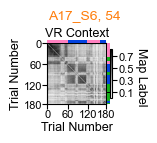

mouse A19
session 7, k = 2


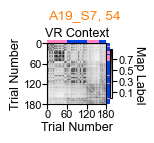

mouse A24
session 6, k = 3


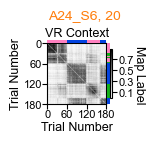

mouse MA1F
session 6, k = 3


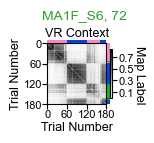

mouse MA3M
session 6, k = 2


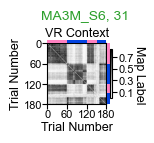

mouse MA8F
session 6, k = 4


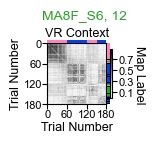

mouse Y23
session 6, k = 3


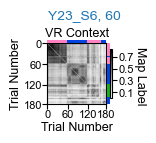

mouse Y24
session 6, k = 2


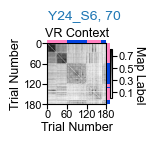

mouse Y27
session 6, k = 4


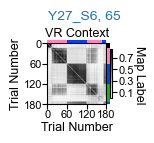

In [22]:
''' Check out how well map labels capture structure in the grid similarity network matrices (Plot Panels of Extended Data Fig. 4G)

Notes:
1. In the figure panel, we retained the left y-axis label and tick labels and the right y-axis label only on the first panel. 
2. In the figure panel, we retained the colorbar only on the last matrix.
3. In the first panel, the right y-axis label was moved closer to the matrix in Illustrator after removing the colorbar. 
4. Plotting is done this way to ensure that all matrices are equally sized.
5. For clarity in the manuscript, A19_2 and _7 were relabeled A19_1 and _6 because session 2 was the first real recording 
session from this mouse. 
6. Middle aged animals were named with their sex (F/M) in the recording files and metadata. For clarity, this flag was removed 
from MA animal names in the manuscript. 

'''

all_colors = ['xkcd:pink','xkcd:blue','xkcd:orchid','xkcd:azure']
CLU_W = 3
alt_idx = 140

# if you want to assess map labeling for all sessions and plot all grid network firing similarity as in Extended Data Fig. 4G:
#example_mice = mice
#example_sessions = sessions
#ex_sesh_only = False

# if you want to assess map labeling for & plot only the example sessions in Extended Data Fig. 4G:
example_mice = ['Y24', 'MA3M', 'A19', 'Y23','MA1F', 'A24','Y27','MA8F','A17']
example_sessions = ['092322_record6','102822_record6','020123_record7','093022_record6','102822_record6','030323_record6','022123_record6','111822_record6','082822_record6']
ex_sesh_only = True

for m, session in zip(mice, sessions):
    
    for s in session:
        d = data[m][s]

        #get some data & cell IDs
        rawdata_file = 'RAW_' + m + '_' + s + '.npy'
        spikes_file = 'SPIKES_' + m + '_' + s +'.npy'
        behavior_file = 'BEHAVIOR_' + m + '_' + s + '.npy'
        
        raw = np.load(load_folder + rawdata_file, allow_pickle=True)
        Y = np.load(load_folder + spikes_file, allow_pickle=False) #pre-filtered for speeds >2cm/s, position-corrected spikes, 20 ms timebins
        behaviorfil = np.load(load_folder + behavior_file, allow_pickle=False)
        
        cell_IDs = raw.item().get('cellsfil')
        gridcell = d['gridcell'].astype(bool)
        gridcells = cell_IDs[gridcell]     
        
        posx = behaviorfil[:,0]
        trial = behaviorfil[:,2]
        rawtrialfil = raw.item().get('trialfil')   
        
        if m in SM_aged_mice:
            col = 'C1'
        elif m in SM_MA_mice:
            col = 'C2'
        else:
            col = 'C0'

        if len(gridcells) >= 10:
            W = d['kmeans']['W']
            skippedrawtrialfil = d['skippedrawtrialfil'].astype(int)
            VRbackidx = d['VRbackidx'].astype(int)

            # Load in left vs. right info
            trialinfo = raw.item().get('trialinfo')
            left = trialinfo['left']

            #binary context vector, excluding skipped trials, dark, & gain periods, 1 = Map A
            leftsort = left.copy()
            lefttail = left[alt_idx:]
            leftsort[alt_idx:] = lefttail[np.argsort(-1*lefttail, kind = 'stable')]

            context = []
            for i, t in enumerate(np.unique(skippedrawtrialfil[VRbackidx])):
                context = np.append(context, leftsort[t.astype(int)])
            altcontextidx = np.where(np.diff(context) == 1.)[0][0] + 1 #index where alternation begins in context vectors
    
            if (d['kmeans']['onemap'][0] == False) and (m in example_mice) and (s in example_sessions) and (ex_sesh_only == True):
                SilN = d['kmeans']['SilN']

                print('mouse ' + m + '\nsession ' + s[-1] + ', k = ' + str(SilN))
                fig = plt.figure(figsize = (1.0,0.83))
                fig.suptitle(m + '_S' + s[-1] + ', ' + str(len(gridcells)), y = 1.25, fontsize=10, color = col)
                gs = gridspec.GridSpec(21, 21, figure=fig)

                # plot Euclidean similarity score
                ax1 = fig.add_subplot(gs[1:, :-1])
                sim = d['gridsimilaritybacksorted']
                im = ax1.imshow(sim, aspect='auto', cmap='Greys')
                ax1.tick_params(labelleft=True)
                ax1.tick_params(labelbottom=True)
                ax1.set_xticks(ticks = [0,60,120,sim.shape[0]])
                ax1.set_yticks(ticks = [0,60,120,sim.shape[0]])
                ax1.set_xticklabels(labels = [0,60,120,180])
                ax1.set_yticklabels(labels = [0,60,120,180])
                ax1.set_ylabel('Trial Number', labelpad = 1, fontsize = 9)
                ax1.set_xlabel('Trial Number', labelpad = 1, fontsize = 9)
                ax1.set_title('VR Context', fontsize = 9, pad = 5)
                ax1.tick_params('both',which='both', labelsize=8, pad=0.5)
                ax1.text(260,170,'Map Label', rotation = 270, fontsize = 9)

                # add k-means map labels
                ax2 = fig.add_subplot(gs[1:, 16]) #clu label
                                # k-means cluster labels
                W = d['kmeans']['W'].copy()
                
                #add colorbar
                cbar = fig.colorbar(im, shrink=0.8, ticks=np.arange(0.1, 0.8, 0.2), ax = ax1)
                cbar.ax.tick_params(labelsize=8, pad=1)
                
                if SilN == 2:
                    map_0 = W[:, d['map0_idx']].astype(bool)

                    for i, t in enumerate(map_0):
                        if t == True:
                            ax2.vlines(1, i, i + 1, colors='xkcd:pink', lw= CLU_W, linestyles= 'solid', alpha = 1)
                        else:
                            ax2.vlines(1, i, i + 1, colors='xkcd:blue', lw= CLU_W, linestyles='solid', alpha = 1)
                elif SilN == 3:
                    map_0 = W[:, d['map0_idx']].astype(bool)
                    map_1 = W[:, d['map1_idx']].astype(bool)
                    map_2 = W[:, d['map2_idx']].astype(bool)

                    for i, t in enumerate(map_0):
                        if t == True:
                            ax2.vlines(1, i, i + 1, colors='xkcd:pink', lw= CLU_W, linestyles= 'solid', alpha = 1)
                            
                    for i, t in enumerate(map_1):
                        if t == True:
                            ax2.vlines(1, i, i + 1, colors='xkcd:blue', lw= CLU_W, linestyles= 'solid', alpha = 1)
                            
                    for i, t in enumerate(map_2):
                        if t == True:
                            ax2.vlines(1, i, i + 1, colors='xkcd:green', lw= CLU_W, linestyles= 'solid', alpha = 1)
                            
                else:
                    map_0 = W[:, d['map0_idx']].astype(bool)
                    map_1 = W[:, d['map1_idx']].astype(bool)
                    map_2 = W[:, d['map2_idx']].astype(bool)
                    map_3 = W[:, d['map3_idx']].astype(bool)

                    for i, t in enumerate(map_0):
                        if t == True:
                            ax2.vlines(1, i, i + 1, colors='xkcd:pink', lw= CLU_W, linestyles= 'solid', alpha = 1)
                            
                    for i, t in enumerate(map_1):
                        if t == True:
                            ax2.vlines(1, i, i + 1, colors='xkcd:blue', lw= CLU_W, linestyles= 'solid', alpha = 1)
                            
                    for i, t in enumerate(map_2):
                        if t == True:
                            ax2.vlines(1, i, i + 1, colors='xkcd:green', lw= CLU_W, linestyles= 'solid', alpha = 1)
                                       
                    for i, t in enumerate(map_3):
                        if t == True:
                            ax2.vlines(1, i, i + 1, colors='xkcd:black', lw = CLU_W, linestyles= 'solid', alpha = 1)
                            
                
                ax2.set_xlim([0.5, 1.5])
                ax2.set_ylim([W.shape[0], 0])
                plt.axis('off')    
                #ax2.set_ylabel('k cluster label', fontsize = 9)
                
                # add VR context labels
                ax3 = fig.add_subplot(gs[0, 0:16])
                for i, t in enumerate(context.astype(bool)):
                    if t == True:
                        ax3.hlines(1, i, i + 1, colors='xkcd:pink', lw = CLU_W, linestyles= 'solid', alpha = 1)
                    else:
                        ax3.hlines(1, i, i + 1, colors='xkcd:blue', lw = CLU_W, linestyles='solid', alpha = 1)
                
                ax3.set_ylim([0.5, 1.5])
                ax3.set_xlim([0, W.shape[0]])
                plt.axis('off')
                
                fig.savefig(save_folder + m + '_' + s + '_S4G.png', dpi=400, bbox_inches='tight')
                fig.savefig(save_folder + m + '_' + s + '_S4G.svg', dpi=400, bbox_inches='tight')
                plt.show()

In [23]:
''' Assign identities to each now non-arbitrarily labeled spatial map as follows:

Map 0 is the map dominating A trials and is therefore assumed to represent Context A. Therefore, map0context = A by default.
Map 1 is the map dominating B trials and is therefore assumed to represent Context B. Therefore, map1context = B by default.

For k > 2 sessions, to align context, map 2/3 represents either Context A or B based on its relative Block A or B similarity.

This means that for k = 4 sessions there could be up to three maps associated with a particular context. 

'''

for m, session in zip(mice, sessions):
    for s in session:
        d = data[m][s]
        
        rawdata_file = 'RAW_' + m + '_' + s + '.npy'
        raw = np.load(load_folder + rawdata_file, allow_pickle=True)
        cell_IDs = raw.item().get('cellsfil')
        gridcell = d['gridcell'].astype(bool)
        gridcells = cell_IDs[gridcell]
        
        if len(gridcells) >= 10: 
            sim = d['gridsimilaritybacksorted']
            W = d['kmeans']['W']
            skippedrawtrialfil = d['skippedrawtrialfil'].astype(int)
            VRbackidx = d['VRbackidx'].astype(int)
            trials = np.unique(skippedrawtrialfil[VRbackidx])
            Aidx = np.where(trials < 80)[0]
            Bidx = np.where((trials >= 80) & (trials < 140))[0]
        
            if (d['kmeans']['SilN'] == 3) and (d['kmeans']['onemap'][0] == False):
                print('\nfor mouse ' + str(m) + ', session ' + str(s[-1]) + ', k = ' + str(d['kmeans']['SilN']) + '... ')
            
                # get matrices comparing across each possible pair
                map2_idx = d['map2_idx']
                map_2 = W[:, d['map2_idx']].astype(bool)
                 
                sim_across1 = sim[Aidx, :]
                sim_across1 = sim_across1[:, map_2]
                simA = np.mean(sim_across1[np.triu_indices(n=sim_across1.shape[0], k=1, m=sim_across1.shape[1])])
                sim_across2 = sim[Bidx, :]
                sim_across2 = sim_across2[:, map_2]
                simB = np.mean(sim_across2[np.triu_indices(n=sim_across2.shape[0], k=1, m=sim_across2.shape[1])])
                
                if simB > simA:
                    d['map2context'] = 1 #1 = B
                    print('map 2 context = B')
                else: 
                    d['map2context'] = 0 #0 = A
                    print('map 2 context = A')
                    
            elif (d['kmeans']['SilN'] == 4) and (d['kmeans']['onemap'][0] == False):
                print('\nfor mouse ' + str(m) + ', session ' + str(s[-1]) + ' k = ' + str(d['kmeans']['SilN']) + '...')
                 
                # get matrices comparing across each possible pair
                map2_idx = d['map2_idx']
                map3_idx = d['map3_idx']
                map_2 = W[:, d['map2_idx']].astype(bool)
                map_3 = W[:, d['map3_idx']].astype(bool)
                 
                sim_across1 = sim[Aidx, :]
                sim_across1 = sim_across1[:, map_2]
                sim2A = np.mean(sim_across1[np.triu_indices(n=sim_across1.shape[0], k=1, m=sim_across1.shape[1])])
                sim_across2 = sim[Bidx, :]
                sim_across2 = sim_across2[:, map_2]
                sim2B = np.mean(sim_across2[np.triu_indices(n=sim_across2.shape[0], k=1, m=sim_across2.shape[1])])
                
                sim_across3 = sim[Aidx, :]
                sim_across3 = sim_across3[:, map_3]
                sim3A = np.mean(sim_across3[np.triu_indices(n=sim_across3.shape[0], k=1, m=sim_across3.shape[1])])
                sim_across4 = sim[Bidx, :]
                sim_across4 = sim_across4[:, map_3]
                sim3B = np.mean(sim_across4[np.triu_indices(n=sim_across4.shape[0], k=1, m=sim_across4.shape[1])])
               
                if sim2B > sim2A:
                    d['map2context'] = 1 #1 = B
                    print('map 2 context = B')
                else: 
                    d['map2context'] = 0 #0 = A
                    print('map 2 context = A')
                
                if sim3B > sim3A:
                    d['map3context'] = 1 #1 = B
                    print('map 3 context = B')
                else: 
                    d['map3context'] = 0 #0 = A
                    print('map 3 context = A')


for mouse A15, session 3 k = 4...
map 2 context = B
map 3 context = A

for mouse A15, session 4 k = 4...
map 2 context = B
map 3 context = B

for mouse A15, session 6, k = 3... 
map 2 context = B

for mouse A16, session 1 k = 4...
map 2 context = B
map 3 context = B

for mouse A16, session 2, k = 3... 
map 2 context = A

for mouse A17, session 3, k = 3... 
map 2 context = A

for mouse A17, session 5, k = 3... 
map 2 context = A

for mouse A17, session 6 k = 4...
map 2 context = B
map 3 context = A

for mouse A18, session 2 k = 4...
map 2 context = B
map 3 context = B

for mouse A18, session 3 k = 4...
map 2 context = B
map 3 context = B

for mouse A18, session 4 k = 4...
map 2 context = B
map 3 context = A

for mouse A18, session 5 k = 4...
map 2 context = B
map 3 context = A


C:\Users\Python\anaconda3\envs\agingmec\lib\site-packages\numpy\core\fromnumeric.py:3464: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
C:\Users\Python\anaconda3\envs\agingmec\lib\site-packages\numpy\core\_methods.py:192: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)



for mouse A19, session 2, k = 3... 
map 2 context = B

for mouse A19, session 4, k = 3... 
map 2 context = A

for mouse A19, session 6, k = 3... 
map 2 context = B

for mouse A20, session 2, k = 3... 
map 2 context = A

for mouse A20, session 3 k = 4...
map 2 context = B
map 3 context = A

for mouse A20, session 4 k = 4...
map 2 context = B
map 3 context = A

for mouse A20, session 5, k = 3... 
map 2 context = A

for mouse A22, session 2, k = 3... 
map 2 context = B

for mouse A22, session 3 k = 4...
map 2 context = B
map 3 context = A

for mouse A22, session 4, k = 3... 
map 2 context = A

for mouse A22, session 6 k = 4...
map 2 context = B
map 3 context = B

for mouse A23, session 3 k = 4...
map 2 context = B
map 3 context = B

for mouse A23, session 5 k = 4...
map 2 context = A
map 3 context = B

for mouse A23, session 6, k = 3... 
map 2 context = B

for mouse A24, session 2, k = 3... 
map 2 context = B

for mouse A24, session 3 k = 4...
map 2 context = A
map 3 context = A

for mou

mouse A19
session 2, k = 3


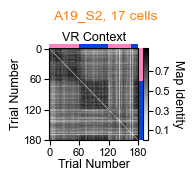

mouse A19
session 7, k = 2


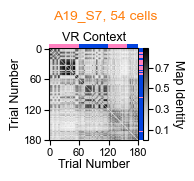

mouse MA1F
session 1, k = 3


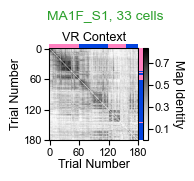

mouse MA1F
session 6, k = 3


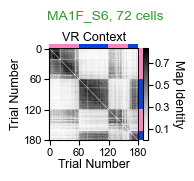

mouse Y27
session 1, k = 4


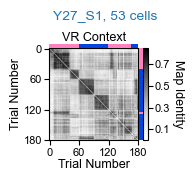

mouse Y27
session 6, k = 4


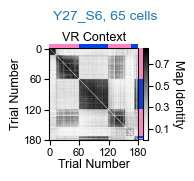

In [24]:
''' Plot examples of map identity vs. context aligned to grid network similarity matrices (Figure 3A panels) 

Notes:
1. In the figure panel, we retained the left y-axis label and tick labels and the right y-axis label only on the first panel. 
2. In the figure panel, we retained the colorbar only on the last matrix.
3. In the first panel, the right y-axis label was moved closer to the matrix in Illustrator after removing the colorbar. 
4. Plotting is done this way to ensure that all matrices are equally sized.
5. For clarity in the manuscript, A19_2 and _7 were relabeled A19_1 and _6 because session 2 was the first real recording 
session from this mouse. 
6. Arrows were added in Illustrator to indicate the location of expected map identity transitions given VR context changes 
on the right y-axis.
7. Middle aged animals were named with their sex (F/M) in the recording files and metadata. For clarity, this flag was removed 
from MA animal names in the manuscript. 

'''

all_colors = ['xkcd:pink','xkcd:blue','xkcd:orchid','xkcd:azure']
CLU_W = 3
alt_idx = 140

# if you want to assess map labeling for all sessions and plot all grid network firing similarity as in Extended Data Fig. 4G:
#example_mice = mice
#example_sessions = sessions
#ex_sesh_only = False

# if you want to assess map labeling for & plot only the example sessions in Extended Data Fig. 4G:
example_mice = ['Y27','MA1F','A19']
example_sessions = ['021623_record1','022123_record6','102322_record1','102822_record6','012723_record2','020123_record7']
ex_sesh_only = True

for m, session in zip(mice, sessions):
    
    for s in session:
        d = data[m][s]

        #get some data & cell IDs
        rawdata_file = 'RAW_' + m + '_' + s + '.npy'
        spikes_file = 'SPIKES_' + m + '_' + s +'.npy'
        behavior_file = 'BEHAVIOR_' + m + '_' + s + '.npy'
        
        raw = np.load(load_folder + rawdata_file, allow_pickle=True)
        Y = np.load(load_folder + spikes_file, allow_pickle=False) #pre-filtered for speeds >2cm/s, position-corrected spikes, 20 ms timebins
        behaviorfil = np.load(load_folder + behavior_file, allow_pickle=False)
        
        cell_IDs = raw.item().get('cellsfil')
        gridcell = d['gridcell'].astype(bool)
        gridcells = cell_IDs[gridcell]     
        
        posx = behaviorfil[:,0]
        trial = behaviorfil[:,2]
        rawtrialfil = raw.item().get('trialfil')   

        if (m in example_mice) and (s in example_sessions) and (ex_sesh_only == True):
            W = d['kmeans']['W']
            skippedrawtrialfil = d['skippedrawtrialfil'].astype(int)
            VRbackidx = d['VRbackidx'].astype(int)

            # Load in left vs. right info
            trialinfo = raw.item().get('trialinfo')
            left = trialinfo['left']

            #binary context vector, excluding skipped trials, dark, & gain periods, 1 = Map A
            leftsort = left.copy()
            lefttail = left[alt_idx:]
            leftsort[alt_idx:] = lefttail[np.argsort(-1*lefttail, kind = 'stable')]

            context = []
            for i, t in enumerate(np.unique(skippedrawtrialfil[VRbackidx])):
                context = np.append(context, leftsort[t.astype(int)])
            altcontextidx = np.where(np.diff(context) == 1.)[0][0] + 1 #index where alternation begins in context vectors
            
            if m in SM_aged_mice:
                col = 'C1'
            elif m in SM_MA_mice:
                col = 'C2'
            else:
                col = 'C0'
    
            SilN = d['kmeans']['SilN']

            print('mouse ' + m + '\nsession ' + s[-1] + ', k = ' + str(SilN))
            fig = plt.figure(figsize = (1.5,1.25))
            fig.suptitle(m + '_S' + s[-1] + ', ' + str(len(gridcells)) + ' cells', y = 1.15, fontsize=10, color = col)
            gs = gridspec.GridSpec(21, 21, figure=fig)

            # plot Euclidean similarity score
            ax1 = fig.add_subplot(gs[1:, :-1])
            sim = d['gridsimilaritybacksorted']
            im = ax1.imshow(sim, aspect='auto', cmap='Greys')
            ax1.tick_params(labelleft=True)
            ax1.tick_params(labelbottom=True)
            ax1.set_xticks(ticks = [0,60,120,180])
            ax1.set_yticks(ticks = [0,60,120,180])
            ax1.set_xticks(ticks = [0,60,120,sim.shape[0]])
            ax1.set_yticks(ticks = [0,60,120,sim.shape[0]])
            ax1.set_xticklabels(labels = [0,60,120,180])
            ax1.set_yticklabels(labels = [0,60,120,180])
            ax1.set_ylabel('Trial Number', labelpad = 1, fontsize = 9)
            ax1.set_xlabel('Trial Number', labelpad = 1, fontsize = 9)
            ax1.set_title('VR Context', fontsize = 9, pad = 5)
            ax1.tick_params('both',which='both', labelsize=8, pad=0.5)
            ax1.text(250,150,'Map Identity', rotation = 270, fontsize = 9)
            ax1.tick_params('both', which='both', labelsize=8, pad=2)

            #colorbar
            cbar = fig.colorbar(im, shrink=1.0, ticks=np.arange(0.1, 0.8, 0.2))
            cbar.ax.tick_params(labelsize=8, pad=1)

            # k-means map identities
            ax2 = fig.add_subplot(gs[1:, 16])
            W = d['kmeans']['W'].copy()

            if SilN == 2:
                map_0 = W[:, d['map0_idx']].astype(bool)

                for i, t in enumerate(map_0):
                    if t == True:
                        ax2.vlines(1, i, i + 1, colors='xkcd:pink', lw= CLU_W, linestyles= 'solid', alpha = 1)
                    else:
                        ax2.vlines(1, i, i + 1, colors='xkcd:blue', lw= CLU_W, linestyles='solid', alpha = 1)
            elif SilN == 3:
                map_0 = W[:, d['map0_idx']].astype(bool)
                map_1 = W[:, d['map1_idx']].astype(bool)
                map_2 = W[:, d['map2_idx']].astype(bool)

                if d['map2context'] == 0:
                    map_A = map_0 + map_2
                else:
                    map_A = map_0

                for i, t in enumerate(map_A):
                    if t == True:
                        ax2.vlines(1, i, i + 1, colors='xkcd:pink', lw= CLU_W, linestyles= 'solid', alpha = 1)
                    else:
                        ax2.vlines(1, i, i + 1, colors='xkcd:blue', lw= CLU_W, linestyles= 'solid', alpha = 1)        

            else:
                map_0 = W[:, d['map0_idx']].astype(bool)
                map_1 = W[:, d['map1_idx']].astype(bool)
                map_2 = W[:, d['map2_idx']].astype(bool)
                map_3 = W[:, d['map3_idx']].astype(bool)

                if d['map2context'] == 0 and d['map3context'] == 0:
                    map_A = map_0 + map_2 + map_3
                elif d['map2context'] == 1 and d['map3context'] == 0:
                    map_A = map_0 + map_3
                elif d['map2context'] == 0 and d['map3context'] == 1:
                    map_A = map_0 + map_2
                else:
                    map_A = map_0

                for i, t in enumerate(map_A):
                    if t == True:
                        ax2.vlines(1, i, i + 1, colors='xkcd:pink', lw= CLU_W, linestyles= 'solid', alpha = 1)
                    else:
                        ax2.vlines(1, i, i + 1, colors='xkcd:blue', lw= CLU_W, linestyles= 'solid', alpha = 1)  

            ax2.set_xlim([0.5, 1.5])
            ax2.set_ylim([W.shape[0], 0])
            plt.axis('off')    

            # VR context labels
            ax3 = fig.add_subplot(gs[0, 0:16])
            for i, t in enumerate(context.astype(bool)):
                if t == True:
                    ax3.hlines(1, i, i + 1, colors='xkcd:pink', lw = CLU_W, linestyles= 'solid', alpha = 1)
                else:
                    ax3.hlines(1, i, i + 1, colors='xkcd:blue', lw = CLU_W, linestyles='solid', alpha = 1)

            ax3.set_ylim([0.5, 1.5])
            ax3.set_xlim([0, W.shape[0]])
            plt.axis('off')

            fig.savefig(save_folder + m + '_' + s + '_3A.png', dpi=400, bbox_inches='tight')
            fig.savefig(save_folder + m + '_' + s + '_3A.svg', dpi=400, bbox_inches='tight')
            plt.show()

In [25]:
''' Calculate fraction of trials during blocks with context-map alignment '''

sblockfrac = []
mblockfrac = []
alt_idx = 140

for m, session in zip(mice, sessions):
    
    m_contextblock = []
    m_mapAblock = []
    
    for s in session:
        d = data[m][s]

        #get some data & cell IDs
        rawdata_file = 'RAW_' + m + '_' + s + '.npy'
        spikes_file = 'SPIKES_' + m + '_' + s +'.npy'
        behavior_file = 'BEHAVIOR_' + m + '_' + s + '.npy'
        
        raw = np.load(load_folder + rawdata_file, allow_pickle=True)
        Y = np.load(load_folder + spikes_file, allow_pickle=False) #pre-filtered for speeds >2cm/s, position-corrected spikes, 20 ms timebins
        behaviorfil = np.load(load_folder + behavior_file, allow_pickle=False)
        
        cell_IDs = raw.item().get('cellsfil')
        gridcell = d['gridcell'].astype(bool)
        gridcells = cell_IDs[gridcell]     
        
        posx = behaviorfil[:,0]
        trial = behaviorfil[:,2]
        rawtrialfil = raw.item().get('trialfil')   

        if len(gridcells) >= 10:
            W = d['kmeans']['W']
            skippedrawtrialfil = d['skippedrawtrialfil'].astype(int)
            VRbackidx = d['VRbackidx'].astype(int)

            # Load in left vs. right info
            trialinfo = raw.item().get('trialinfo')
            left = trialinfo['left']

            #binary context vector, excluding skipped trials, dark, & gain periods, 1 = Map A
            leftsort = left.copy()
            lefttail = left[alt_idx:]
            leftsort[alt_idx:] = lefttail[np.argsort(-1*lefttail, kind = 'stable')]

            context = []
            for i, t in enumerate(np.unique(skippedrawtrialfil[VRbackidx])):
                context = np.append(context, leftsort[t.astype(int)])
            altcontextidx = np.where(np.diff(context) == 1.)[0][0] #index where alternation begins in context vectors
            
            if (d['kmeans']['SilN'] == 2) and (d['kmeans']['onemap'][0] == False):
                map_A = W[:, d['map0_idx']].astype(bool)
                
                #save out to be able to compute at animal level
                m_mapAblock = np.append(m_mapAblock, map_A[:altcontextidx])
                m_contextblock = np.append(m_contextblock, context[:altcontextidx])

                #compute fraction trials in map = context
                sblockfrac = np.append(sblockfrac, np.sum(map_A[:altcontextidx] == context[:altcontextidx])/len(context[:altcontextidx]))
           
            elif (d['kmeans']['SilN'] == 3) and (d['kmeans']['onemap'][0] == False):
                if d['map2context'] == 0: #if map 2 is closer to representing context A, combine map 0 and 2 trials into context A trials
                    map_A = W[:, d['map0_idx']] + W[:, d['map2_idx']]
                    map_A = map_A.astype(bool)
                else:
                    map_A = W[:, d['map0_idx']].astype(bool)
                
                #save out to be able to compute at animal level
                m_mapAblock = np.append(m_mapAblock, map_A[:altcontextidx])
                m_contextblock = np.append(m_contextblock, context[:altcontextidx])

                #compute fraction trials in map = context
                sblockfrac = np.append(sblockfrac, np.sum(map_A[:altcontextidx] == context[:altcontextidx])/len(context[:altcontextidx]))
            
            elif (d['kmeans']['SilN'] == 4) and (d['kmeans']['onemap'][0] == False):
                if (d['map2context'] == 0) and (d['map3context'] == 0): #if map 2 & 3 are closer to representing context A, combine them into context A trials
                    map_A = W[:, d['map0_idx']] + W[:, d['map2_idx']] + W[:, d['map3_idx']]
                    map_A = map_A.astype(bool)
                elif (d['map2context'] == 0) and (d['map3context'] == 1):
                    map_A = W[:, d['map0_idx']] +  W[:, d['map2_idx']]
                    map_A = map_A.astype(bool)    
                elif (d['map2context'] == 1) and (d['map3context'] == 0):
                    map_A = W[:, d['map0_idx']] +  W[:, d['map3_idx']]
                    map_A = map_A.astype(bool)
                else: #only map 0 represents A
                    map_A = W[:, d['map0_idx']].astype(bool)
                    
                #save out to be able to compute at animal level
                m_mapAblock = np.append(m_mapAblock, map_A[:altcontextidx])
                m_contextblock = np.append(m_contextblock, context[:altcontextidx])

                #compute fraction trials in map = context
                sblockfrac = np.append(sblockfrac, np.sum(map_A[:altcontextidx] == context[:altcontextidx])/len(context[:altcontextidx]))     
            
            else:
                sblockfrac = np.append(sblockfrac, np.nan)
        
        else:
            sblockfrac = np.append(sblockfrac, np.nan)

    #compute fraction trials in map = context
    if len(m_contextblock) > 0:
        mblockfrac = np.append(mblockfrac, np.sum(m_mapAblock == m_contextblock)/len(m_contextblock))
    else:
        mblockfrac = np.append(mblockfrac, np.nan)

In [64]:
''' Calculate fraction of trials during alternation with context-map alignment '''

saltfrac = []
maltfrac = []
alt_idx = 140

for m, session in zip(mice, sessions):
    
    m_contextalt = []
    m_mapAalt = []
    
    for s in session:
        d = data[m][s]

        #get some data & cell IDs
        rawdata_file = 'RAW_' + m + '_' + s + '.npy'
        spikes_file = 'SPIKES_' + m + '_' + s +'.npy'
        behavior_file = 'BEHAVIOR_' + m + '_' + s + '.npy'
        
        raw = np.load(load_folder + rawdata_file, allow_pickle=True)
        Y = np.load(load_folder + spikes_file, allow_pickle=False) #pre-filtered for speeds >2cm/s, position-corrected spikes, 20 ms timebins
        behaviorfil = np.load(load_folder + behavior_file, allow_pickle=False)
        
        cell_IDs = raw.item().get('cellsfil')
        gridcell = d['gridcell'].astype(bool)
        gridcells = cell_IDs[gridcell]     
        
        posx = behaviorfil[:,0]
        trial = behaviorfil[:,2]
        rawtrialfil = raw.item().get('trialfil')   

        if len(gridcells) >= 10:
            W = d['kmeans']['W']
            skippedrawtrialfil = d['skippedrawtrialfil'].astype(int)
            VRbackidx = d['VRbackidx'].astype(int)

            # Load in left vs. right info
            trialinfo = raw.item().get('trialinfo')
            left = trialinfo['left']

            #binary context vector, excluding skipped trials, dark, & gain periods, 1 = Map A
            leftsort = left.copy()
            lefttail = left[alt_idx:]
            leftsort[alt_idx:] = lefttail[np.argsort(-1*lefttail, kind = 'stable')]

            context = []
            for i, t in enumerate(np.unique(skippedrawtrialfil[VRbackidx])):
                context = np.append(context, leftsort[t.astype(int)])
            altcontextidx = np.where(np.diff(context) == 1.)[0][0] #index where alternation begins in context vectors
            
            if (d['kmeans']['SilN'] == 2) and (d['kmeans']['onemap'][0] == False):
                map_A = W[:, d['map0_idx']].astype(bool)
                
                #save out to be able to compute at animal level
                m_mapAalt = np.append(m_mapAalt, map_A[altcontextidx:])
                m_contextalt = np.append(m_contextalt, context[altcontextidx:])

                #compute fraction trials in map = context
                saltfrac = np.append(saltfrac, np.sum(map_A[altcontextidx:] == context[altcontextidx:])/len(context[altcontextidx:]))
              
            elif (d['kmeans']['SilN'] == 3) and (d['kmeans']['onemap'][0] == False):
                if d['map2context'] == 0: #if map 2 is closer to representing context A, combine map 0 and 2 trials into context A trials
                    map_A = W[:, d['map0_idx']] + W[:, d['map2_idx']]
                    map_A = map_A.astype(bool)
                else:
                    map_A = W[:, d['map0_idx']].astype(bool)
                
                #save out to be able to compute at animal level
                m_mapAalt = np.append(m_mapAalt, map_A[altcontextidx:])
                m_contextalt = np.append(m_contextalt, context[altcontextidx:])

                #compute fraction trials in map = context
                saltfrac = np.append(saltfrac, np.sum(map_A[altcontextidx:] == context[altcontextidx:])/len(context[altcontextidx:]))

            elif (d['kmeans']['SilN'] == 4) and (d['kmeans']['onemap'][0] == False):
                if (d['map2context'] == 0) and (d['map3context'] == 0): #if map 2 & 3 are closer to representing context A, combine them into context A trials
                    map_A = W[:, d['map0_idx']] + W[:, d['map2_idx']] + W[:, d['map3_idx']]
                    map_A = map_A.astype(bool)
                elif (d['map2context'] == 0) and (d['map3context'] == 1):
                    map_A = W[:, d['map0_idx']] +  W[:, d['map2_idx']]
                    map_A = map_A.astype(bool)    
                elif (d['map2context'] == 1) and (d['map3context'] == 0):
                    map_A = W[:, d['map0_idx']] +  W[:, d['map3_idx']]
                    map_A = map_A.astype(bool)
                else: #only map 0 represents A
                    map_A = W[:, d['map0_idx']].astype(bool)
                    
                #save out to be able to compute at animal level
                m_mapAalt = np.append(m_mapAalt, map_A[altcontextidx:])
                m_contextalt = np.append(m_contextalt, context[altcontextidx:])

                #compute fraction trials in map = context
                saltfrac = np.append(saltfrac, np.sum(map_A[altcontextidx:] == context[altcontextidx:])/len(context[altcontextidx:]))     

            else:
                saltfrac = np.append(saltfrac, np.nan)
        
        else:
            saltfrac = np.append(saltfrac, np.nan)
           
    #compute fraction trials in map = context
    if len(m_contextalt) > 0:
        maltfrac = np.append(maltfrac, np.sum(m_mapAalt == m_contextalt)/len(m_contextalt))
    else:
        maltfrac = np.append(maltfrac, np.nan)

In [27]:
''' Find where nan and ignore for plotting '''
nan_idx = np.where(np.isnan(saltfrac) == True)[0]

# Adjust y_sind, ma_sind, age_sind for subsequent plots
y_sind10grid = np.setdiff1d(y_sind, nan_idx)
ma_sind10grid = np.setdiff1d(ma_sind, nan_idx)
age_sind10grid = np.setdiff1d(age_sind, nan_idx)

# Adjust colormaps for grid plots
yidx = []
maidx = []
aidx = []
for i in nan_idx:
    yidx = np.append(yidx, np.where(y_sind == i)[0].astype(int))
    maidx = np.append(maidx, np.where(ma_sind == i)[0].astype(int))
    aidx = np.append(aidx, np.where(age_sind == i)[0].astype(int)) 

col_session_young10grid = np.delete(col_session_young, list(yidx.astype(int)), axis = 0)
col_session_ma10grid = np.delete(col_session_MA, list(maidx.astype(int)), axis = 0)
col_session_old10grid = np.delete(col_session_old, list(aidx.astype(int)), axis = 0)
col_session10grid = [col_session_young10grid, col_session_ma10grid, col_session_old10grid] 

Association btwn Young, MA, Aged, & All Alt Performance & Variable of Interest:
R [Young, MA, Aged, All]: 
0.4313806015336176 0.4115698366519688 0.1390288665193829 0.31106969628506087
P [Young, MA, Aged, All]: 
0.002466748503530305 0.004487189331266997 0.38599138241308906 0.0002538448370794533
Association btwn Young, MA, Aged, & All Task Performance & Variable of Interest:
R [Young, MA, Aged, All]: 
0.6049291694969954 0.5402157188751122 0.5793745792801946 0.5423126064857821
P [Young, MA, Aged, All]: 
1.0653846178032268e-10 2.731198884708e-08 1.1786298495760363e-08 6.817660912084803e-22
n young task halves: 94
n MA task halves: 92
n aged task halves: 82


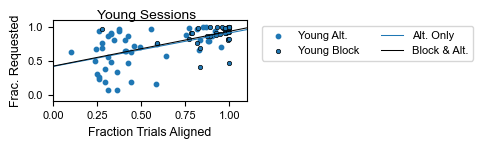

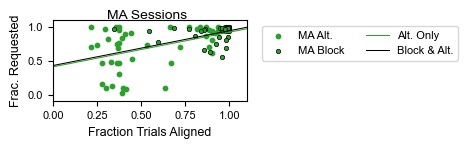

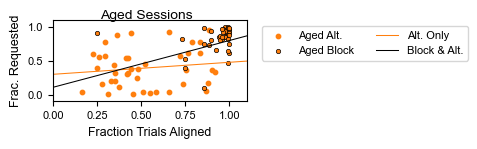

In [63]:
''' Plot Figure 3E '''
#Linear regression just for alternation
res = stats.linregress(saltfrac[y_sind10grid],reqalt_rates[y_sind10grid])
yslope1 = res.slope; yint1 = res.intercept; yr1 = res.rvalue; yp1 = res.pvalue

res = stats.linregress(saltfrac[ma_sind10grid],reqalt_rates[ma_sind10grid])
maslope1 = res.slope; maint1 = res.intercept; mar1 = res.rvalue ; map1 = res.pvalue

res = stats.linregress(saltfrac[age_sind10grid],reqalt_rates[age_sind10grid])
aslope1 = res.slope; aint1 = res.intercept; ar1 = res.rvalue ; ap1 = res.pvalue

allidx = np.concatenate((y_sind10grid,ma_sind10grid,age_sind10grid))
res = stats.linregress(saltfrac[allidx],reqalt_rates[allidx])
allslope1 = res.slope; allint1 = res.intercept; allr1 = res.rvalue; allp1 = res.pvalue

print('Association btwn Young, MA, Aged, & All Alt Performance & Variable of Interest:')
print('R [Young, MA, Aged, All]: ')
print(yr1, mar1, ar1, allr1)
print('P [Young, MA, Aged, All]: ')
print(yp1, map1, ap1, allp1)

#Linear regression for block and alternation together
res = stats.linregress(np.hstack((sblockfrac[y_sind10grid],saltfrac[y_sind10grid])),np.hstack((reqblock_rates[y_sind10grid],reqalt_rates[y_sind10grid])))
yslope2 = res.slope; yint2 = res.intercept; yr2 = res.rvalue; yp2 = res.pvalue

res = stats.linregress(np.hstack((sblockfrac[ma_sind10grid],saltfrac[ma_sind10grid])),np.hstack((reqblock_rates[ma_sind10grid],reqalt_rates[ma_sind10grid])))
maslope2 = res.slope; maint2 = res.intercept; mar2 = res.rvalue ; map2 = res.pvalue

res = stats.linregress(np.hstack((sblockfrac[age_sind10grid],saltfrac[age_sind10grid])),np.hstack((reqblock_rates[age_sind10grid],reqalt_rates[age_sind10grid])))
aslope2 = res.slope; aint2 = res.intercept; ar2 = res.rvalue ; ap2 = res.pvalue

allidx = np.concatenate((y_sind10grid,ma_sind10grid,age_sind10grid))
res = stats.linregress(np.hstack((sblockfrac[allidx],saltfrac[allidx])),np.hstack((reqblock_rates[allidx],reqalt_rates[allidx])))
allslope2 = res.slope; allint2 = res.intercept; allr2 = res.rvalue; allp2 = res.pvalue

print('Association btwn Young, MA, Aged, & All Task Performance & Variable of Interest:')
print('R [Young, MA, Aged, All]: ')
print(yr2, mar2, ar2, allr2)
print('P [Young, MA, Aged, All]: ')
print(yp2, map2, ap2, allp2)

print('n young task halves: ' + str(len(np.hstack((sblockfrac[y_sind10grid],saltfrac[y_sind10grid])))))
print('n MA task halves: ' + str(len(np.hstack((sblockfrac[ma_sind10grid],saltfrac[ma_sind10grid])))))
print('n aged task halves: ' + str(len(np.hstack((sblockfrac[age_sind10grid],saltfrac[age_sind10grid])))))
        
#Plot Figure 3E
fig, ax = plt.subplots(figsize = (2.5,1.05))
fig.suptitle('Young Sessions', fontsize = 10)
ax.scatter(saltfrac[y_sind10grid],reqalt_rates[y_sind10grid], color = 'C0', s = 10, label = 'Young Alt.')
ax.scatter(sblockfrac[y_sind10grid],reqblock_rates[y_sind10grid], color = 'C0', s = 10, edgecolor = 'k', lw = 0.5, label = 'Young Block')
ax.set_xlabel('Fraction Trials Aligned', fontsize = 9)
ax.set_ylabel('Frac. Requested', fontsize = 9)
ax.set_ylim([-0.1,1.1])
ax.set_xlim([0,1.1])
ax.tick_params(labelsize = 8)
X_plot = np.linspace(ax.get_xlim()[0],ax.get_xlim()[1],100)
ax.plot(X_plot, yslope1*X_plot + yint1, '-', color = 'C0', linewidth = 0.75, label = 'Alt. Only')
ax.plot(X_plot, yslope2*X_plot + yint2, '-', linewidth = 0.75, color = 'k', label = 'Block & Alt.')
ax.legend(fontsize = 8,bbox_to_anchor = (1.05,1.0), ncol = 2)
plt.savefig(save_folder + '3Eleft.png', dpi = 400, bbox_inches = 'tight')
plt.savefig(save_folder + '3Eleft.svg', dpi = 400, bbox_inches = 'tight')
plt.show()

fig, ax = plt.subplots(figsize = (2.5,1.05))
fig.suptitle('MA Sessions', fontsize = 10)
ax.scatter(saltfrac[ma_sind10grid],reqalt_rates[ma_sind10grid], color = 'C2', s = 10, label = 'MA Alt.')
ax.scatter(sblockfrac[ma_sind10grid],reqblock_rates[ma_sind10grid], color = 'C2', s = 10, edgecolor = 'k', lw = 0.5, label = 'MA Block')
ax.set_xlabel('Fraction Trials Aligned', fontsize = 9)
ax.set_ylabel('Frac. Requested', fontsize = 9)
ax.set_ylim([-0.1,1.1])
ax.set_xlim([0,1.1])
ax.tick_params(labelsize = 8)
X_plot = np.linspace(ax.get_xlim()[0],ax.get_xlim()[1],100)
ax.plot(X_plot, maslope1*X_plot + maint1, '-', color = 'C2', linewidth = 0.75, label = 'Alt. Only')
ax.plot(X_plot, maslope2*X_plot + maint2, '-', linewidth = 0.75, color = 'k', label = 'Block & Alt.')
ax.legend(fontsize = 8,bbox_to_anchor = (1.05,1.0), ncol = 2)
plt.savefig(save_folder + '3Emiddle.png', dpi = 400, bbox_inches = 'tight')
plt.savefig(save_folder + '3Emiddle.svg', dpi = 400, bbox_inches = 'tight')
plt.show()

fig, ax = plt.subplots(figsize = (2.5,1.05))
fig.suptitle('Aged Sessions', fontsize = 10)
ax.scatter(saltfrac[age_sind10grid],reqalt_rates[age_sind10grid], color = 'C1', s = 10, label = 'Aged Alt.')
ax.scatter(sblockfrac[age_sind10grid],reqblock_rates[age_sind10grid], color = 'C1', s = 10, edgecolor = 'k', lw = 0.5, label = 'Aged Block')
ax.set_xlabel('Fraction Trials Aligned', fontsize = 9)
ax.set_ylabel('Frac. Requested', fontsize = 9)
ax.set_ylim([-0.1,1.1])
ax.set_xlim([0,1.1])
ax.tick_params(labelsize = 8)
X_plot = np.linspace(ax.get_xlim()[0],ax.get_xlim()[1],100)
ax.plot(X_plot, aslope1*X_plot + aint1, '-', linewidth = 0.75, color = 'C1', label = 'Alt. Only')
ax.plot(X_plot, aslope2*X_plot + aint2, '-', linewidth = 0.75, color = 'k', label = 'Block & Alt.')
ax.legend(fontsize = 8,bbox_to_anchor = (1.05,1.0), ncol = 2)
plt.savefig(save_folder + '3Eright.png', dpi = 400, bbox_inches = 'tight')
plt.savefig(save_folder + '3Eright.svg', dpi = 400, bbox_inches = 'tight')
plt.show()

#Print Figure 3e Source Data
#print(list(sblockfrac[y_sind10grid]))
#print(list(reqblock_rates[y_sind10grid]))
#print(list(saltfrac[y_sind10grid]))
#print(list(reqalt_rates[y_sind10grid]))

#print(list(sblockfrac[ma_sind10grid]))
#print(list(reqblock_rates[ma_sind10grid]))
#print(list(saltfrac[ma_sind10grid]))
#print(list(reqalt_rates[ma_sind10grid]))

#print(list(sblockfrac[age_sind10grid]))
#print(list(reqblock_rates[age_sind10grid]))
#print(list(saltfrac[age_sind10grid]))
#print(list(reqalt_rates[age_sind10grid]))

In [79]:
''' Assemble LMM for Fraction Alt. Trials Aligned'''

#make into dataframe
sex = list(animalmeta.Sex[mice_ind])
sexes = []
seshmice = []
seshcount = []
seshage = []
seshcohort = []
for m, session in zip(mice, sessions):
    msex = np.array(animalmeta.loc[(animalmeta.Animal_ID == m),'Sex'])
    age =  np.array(animalmeta.loc[(animalmeta.Animal_ID == m),'Age_Group'])
    cohort = np.array(animalmeta.loc[(animalmeta.Animal_ID == m),'Cohort'])
    totalsesh = len(session)
    
    for i, s in enumerate(session):
        sexes = np.append(sexes, msex)
        seshmice = np.append(seshmice, m)
        seshcount = np.append(seshcount, (i + 1))
        seshage = np.append(seshage, age)
        seshcohort = np.append(seshcohort, cohort)

# Collect all relevant data into pandas dataframe
allidx = np.concatenate((y_sind10grid,ma_sind10grid,age_sind10grid))
Animal_ID = list(seshmice[allidx])
Session = list(seshcount[allidx])
Cohort = list(seshcohort[allidx])
Sex = list(sexes[allidx])
Age_Group = list(seshage[allidx])
BlockFrac = list(sblockfrac[allidx])
AltFrac = list(saltfrac[allidx])

tuples = list(zip(Animal_ID, Session, Sex, Age_Group, Cohort, BlockFrac, AltFrac))
tuples

df = pd.DataFrame(tuples, columns = ['AnimalID', 'Session', 'Sex', 'AgeGroup','Cohort','BlockFrac','AltFrac'])
df = df.dropna(axis = 0)

               Mixed Linear Model Regression Results
Model:                  MixedLM     Dependent Variable:     AltFrac
No. Observations:       134         Method:                 REML   
No. Groups:             28          Scale:                  0.0445 
Min. group size:        2           Log-Likelihood:         -7.7292
Max. group size:        6           Converged:              Yes    
Mean group size:        4.8                                        
-------------------------------------------------------------------
                         Coef.  Std.Err.   z    P>|z| [0.025 0.975]
-------------------------------------------------------------------
Intercept                 0.303    0.088  3.432 0.001  0.130  0.476
C(AgeGroup)[T.2.0]        0.059    0.127  0.467 0.640 -0.189  0.307
C(AgeGroup)[T.3.0]        0.292    0.124  2.361 0.018  0.050  0.534
C(Sex)[T.M]               0.077    0.094  0.816 0.414 -0.108  0.261
C(Cohort)[T.D]           -0.070    0.117 -0.596 0.551 -0.300  0

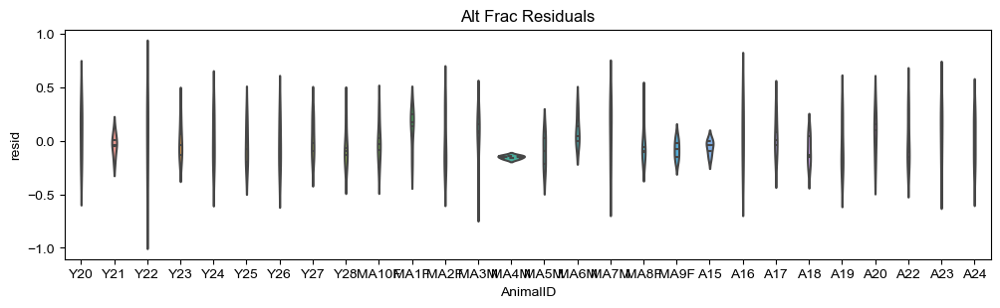

Raw Data Mean across All Sessions by Animal:
AnimalID
A15      0.386123
A16      0.667725
A17      0.593522
A18      0.343527
A19      0.428324
A20      0.700820
A22      0.558333
A23      0.679872
A24      0.571038
MA10F    0.475397
MA1F     0.809836
MA2F     0.496220
MA3M     0.681421
MA4M     0.390255
MA5M     0.410109
MA6M     0.774237
MA7M     0.712204
MA8F     0.491803
MA9F     0.327869
Y20      0.694809
Y21      0.371858
Y22      0.561441
Y23      0.474594
Y24      0.514754
Y25      0.432787
Y26      0.385246
Y27      0.551913
Y28      0.385519

Fitted Data Mean across All Sessions by Animal:
AnimalID
A15      0.444717
A16      0.603140
A17      0.555933
A18      0.427715
A19      0.470787
A20      0.623508
A22      0.551261
A23      0.591207
A24      0.559126
MA10F    0.491759
MA1F     0.684102
MA2F     0.504648
MA3M     0.654272
MA4M     0.540285
MA5M     0.504319
MA6M     0.677572
MA7M     0.610694
MA8F     0.508767
MA9F     0.406891
Y20      0.615581
Y21      0.408016
Y22   

In [80]:
''' Fit LMM to Alternation Remapping Frequency; Report Fitted Results for Extended Data Fig. 8'''
import statsmodels.api as sm
import statsmodels.formula.api as smf

# Alt Freq Dependent
mfrac = smf.mixedlm('AltFrac ~ 1 + C(AgeGroup) + C(Sex) + C(Cohort) + Session:C(AgeGroup)', groups = 'AnimalID', re_formula = '1',
                     data=df).fit(reml= True)
print(mfrac.summary())
print(mfrac.wald_test_terms(scalar = False))
#print(mfrac.aic)
#print(mfrac.bic)

df['resid'] = mfrac.resid
fig, ax = plt.subplots(figsize = (12,3))
sns.violinplot(data = df, x = 'AnimalID', y = 'resid', inner = 'quartile', ax = ax)
plt.title('Alt Frac Residuals')
plt.show()

df['mfracfitted'] = mfrac.fittedvalues
animalgrouped = df.groupby(['AnimalID'])

print('Raw Data Mean across All Sessions by Animal:')
print(animalgrouped['AltFrac'].mean().to_string(index=True))

print('\nFitted Data Mean across All Sessions by Animal:')
print(animalgrouped['mfracfitted'].mean().to_string(index=True))

# Sig. session x age effects... Therefore, reporting change in mean across sessions
print('\nFitted Data Mean across All Sessions by Animal:')
print('First Three: ')
print(df.loc[df['Session'] <= 3].groupby(['AnimalID'])['mfracfitted'].mean().to_string(index = True))
print('Last Three: ')
print(df.loc[df['Session'] >= 4].groupby(['AnimalID'])['mfracfitted'].mean().to_string(index = True))

same subset young mice? [ True  True  True  True  True  True  True  True  True]
same subset MA mice? [ True  True  True  True  True  True  True  True]
same subset aged mice? [ True  True  True  True  True  True  True  True]

Relationship btwn Change in Alt. Task Performance & Alt. Frac Aligned over Experience:
R, P [All]: 
0.42977454690183436 0.03201827202494832

n young mice: 9
n MA mice: 8
n aged mice: 8
young mice: ['Y20' 'Y21' 'Y22' 'Y23' 'Y24' 'Y25' 'Y26' 'Y27' 'Y28']
MA mice: ['MA10F' 'MA1F' 'MA2F' 'MA3M' 'MA5M' 'MA6M' 'MA8F' 'MA9F']
aged mice: ['A15' 'A17' 'A18' 'A19' 'A20' 'A22' 'A23' 'A24']


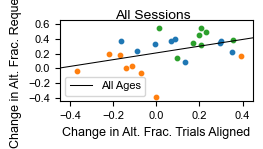

In [85]:
''' Plot Figure 3H'''

#Calculate change in frac trials aligned (mean last 3 - first 3 sessions by mouse)
f3fracaligned = df.loc[df['Session'] <= 3].groupby(['AnimalID'])['AltFrac'].mean().to_numpy()
first3mice = df.loc[df['Session'] <= 3].groupby(['AnimalID'])['AltFrac'].mean().index.values.tolist()

l3fracaligned = df.loc[df['Session'] >= 4].groupby(['AnimalID'])['AltFrac'].mean().to_numpy()
last3mice = df.loc[df['Session'] >= 4].groupby(['AnimalID'])['AltFrac'].mean().index.values.tolist()

bothmice = list(np.intersect1d(first3mice, last3mice))

f3_idx = []
l3_idx = []
for m in bothmice:
    f3_idx = np.append(f3_idx, first3mice.index(m))
    l3_idx = np.append(l3_idx, last3mice.index(m))
    
deltfracaligned = l3fracaligned[l3_idx.astype(int)] - f3fracaligned[f3_idx.astype(int)]

#Load in results from Frac. Rewards Requested LMM:
deltfracreq_file = 'deltfracreq.npy'
altreqmice_file = 'altreqmice.npy'

deltfracreq = np.load(fig1s1_folder + deltfracreq_file)
reqbothmice = np.load(fig1s1_folder + altreqmice_file)
reqbothmice = list(reqbothmice)

newbothmice = np.intersect1d(reqbothmice, bothmice)

yreq_mind = []
mareq_mind = []
areq_mind = []
yfrac_mind = []
mafrac_mind = []
afrac_mind = []
for m in newbothmice:
    if m in SM_aged_mice:
        areq_mind = np.append(areq_mind, reqbothmice.index(m))
        afrac_mind = np.append(afrac_mind, bothmice.index(m))
    elif m in SM_MA_mice:
        mareq_mind = np.append(mareq_mind, reqbothmice.index(m))
        mafrac_mind = np.append(mafrac_mind, bothmice.index(m))
    else:
        yreq_mind = np.append(yreq_mind, reqbothmice.index(m))
        yfrac_mind = np.append(yfrac_mind, bothmice.index(m))
        
yreq_mind = yreq_mind.astype(int)
mareq_mind = mareq_mind.astype(int)
areq_mind = areq_mind.astype(int)
yfrac_mind = yfrac_mind.astype(int)
mafrac_mind = mafrac_mind.astype(int)
afrac_mind = afrac_mind.astype(int)

#CONFIRM SAME MICE ARE SELECTED / DATA STREAMS ARE ALIGNEd
print('same subset young mice? ' + str(np.asarray(reqbothmice)[yreq_mind] == np.asarray(bothmice)[yfrac_mind]))
print('same subset MA mice? ' + str(np.asarray(reqbothmice)[mareq_mind] == np.asarray(bothmice)[mafrac_mind]))
print('same subset aged mice? ' + str(np.asarray(reqbothmice)[areq_mind] == np.asarray(bothmice)[afrac_mind]))
    
#Linear regression for block and alternation together
allfracidx = np.concatenate((yfrac_mind,mafrac_mind,afrac_mind))
allreqidx = np.concatenate((yreq_mind,mareq_mind,areq_mind))

res = stats.linregress(deltfracaligned[allfracidx],deltfracreq[allreqidx])
allslope = res.slope; allint = res.intercept; allr = res.rvalue; allp = res.pvalue

print('\nRelationship btwn Change in Alt. Task Performance & Alt. Frac Aligned over Experience:')
print('R, P [All]: ')
print(allr, allp)

print('\nn young mice: ' + str(len(deltfracaligned[yfrac_mind])))
print('n MA mice: ' + str(len(deltfracaligned[mafrac_mind])))
print('n aged mice: ' + str(len(deltfracaligned[afrac_mind])))

print('young mice: ' + str(np.asarray(reqbothmice)[yreq_mind]))
print('MA mice: ' + str(np.asarray(reqbothmice)[mareq_mind]))
print('aged mice: ' + str(np.asarray(reqbothmice)[areq_mind]))

#Plot Figure 3H
fig, ax = plt.subplots(figsize = (2.5,1.05))
fig.suptitle('All Sessions', fontsize = 10)
ax.scatter(deltfracaligned[yfrac_mind],deltfracreq[yreq_mind], color = 'C0', s = 10)
ax.scatter(deltfracaligned[mafrac_mind],deltfracreq[mareq_mind], color = 'C2', s = 10)
ax.scatter(deltfracaligned[afrac_mind],deltfracreq[areq_mind], color = 'C1', s = 10)
ax.set_xlabel('Change in Alt. Frac. Trials Aligned', fontsize = 9)
ax.set_ylabel('Change in Alt. Frac. Requested', fontsize = 9)
ax.set_ylim([-0.45,0.65])
ax.set_yticks([-0.4,-0.2,0,0.2,0.4,0.6])
ax.set_xlim([-0.45,0.45])
ax.tick_params(labelsize = 8)
X_plot = np.linspace(ax.get_xlim()[0],ax.get_xlim()[1],100)
ax.plot(X_plot, allslope*X_plot + allint, '-', color = 'k', linewidth = 0.75, label = 'All Ages')
ax.legend(fontsize = 8)
plt.savefig(save_folder + '3H.png', dpi = 400, bbox_inches = 'tight')
plt.savefig(save_folder + '3H.svg', dpi = 400, bbox_inches = 'tight')
plt.show()

#Print Source Data Figure 3h
#print(list(deltfracaligned[yfrac_mind]))
#print(list(deltfracreq[yreq_mind]))
#print(list(deltfracaligned[mafrac_mind]))
#print(list(deltfracreq[mareq_mind]))
#print(list(deltfracaligned[afrac_mind]))
#print(list(deltfracreq[areq_mind]))

# Use logistic regression models to explore predictors of map-context alignment and reward requests by trial across age groups. 

In [28]:
''' Assemble data frame with reward request, context-map alignment, mouse age/sex/cohort/ID, VR context, & num trials
since a switch data for each alternation trial '''

sex = list(animalmeta.Sex[mice_ind])
total_trials = 0

allreq = []
allaligned = []
allcontext = []
alltswitch = []
allswitch = []

alltrialid = []
allsesh = []
allage = []
allsex = []
allcohort = []
allmice = []
allk = []

alt_idx = 140

for m, session in zip(mice, sessions):
    
    msex = np.array(animalmeta.loc[(animalmeta.Animal_ID == m),'Sex'])
    age =  np.array(animalmeta.loc[(animalmeta.Animal_ID == m),'Age_Group'])
    cohort =  np.array(animalmeta.loc[(animalmeta.Animal_ID == m),'Cohort'])
    totalsesh = len(session)
    sesh_count = 0
    
    for s in tdqm(session):
        d = data[m][s]
        
        #get some data & cell IDs
        rawdata_file = 'RAW_' + m + '_' + s + '.npy'
        spikes_file = 'SPIKES_' + m + '_' + s +'.npy'
        behavior_file = 'BEHAVIOR_' + m + '_' + s + '.npy'
        
        raw = np.load(load_folder + rawdata_file, allow_pickle=True)
        Y = np.load(load_folder + spikes_file, allow_pickle=False) #pre-filtered for speeds >2cm/s, position-corrected spikes, 20 ms timebins
        behaviorfil = np.load(load_folder + behavior_file, allow_pickle=False)
        
        cell_IDs = raw.item().get('cellsfil')
        gridcell = d['gridcell'].astype(bool)
        gridcells = cell_IDs[gridcell]     
        
        posx = behaviorfil[:,0]
        trial = behaviorfil[:,2]
        rawtrialfil = raw.item().get('trialfil')  
        

        if len(gridcells) >= 10:
            W = d['kmeans']['W']
            skippedrawtrialfil = d['skippedrawtrialfil'].astype(int)
            VRbackidx = d['VRbackidx'].astype(int)

            # Load in left vs. right info
            trialinfo = raw.item().get('trialinfo')
            left = trialinfo['left']

            trials = np.unique(skippedrawtrialfil[VRbackidx])
            alttrials = trials[trials >= 139]
            
            #get distance in trials since a context switch for each alternation trial
            distswitch = []
            switch = []
            countsinceswitch = 0 
            
            allswitchtrials = np.where(np.diff(left) != 0)[0] + 1
            altswitchtrials = allswitchtrials[allswitchtrials >= 139]
            for i, t in enumerate(alttrials):
                if t in altswitchtrials:
                    countsinceswitch = 0
                    distswitch = np.append(distswitch, countsinceswitch)
                    switch = np.append(switch, 1)
                else:
                    countsinceswitch += 1
                    distswitch = np.append(distswitch, countsinceswitch)
                    switch = np.append(switch, 0)
                    
            #reward requests as binary vector for alternation trials
            reward = raw.item().get('reward')
            reward['trials'] = np.arange(0,len(reward['trials']),1) # fixes occassional Unity error numbering of rewards 
            
            altreq = []
            for i, t in enumerate(alttrials):
                altreq = np.append(altreq, ~reward['missed'][reward['trials'] == t].astype(bool))
            
            #sort alternation context to retrieve alignment     
            leftsort = left.copy()
            lefttail = left[alt_idx:]
            leftsort[alt_idx:] = lefttail[np.argsort(-1*lefttail, kind = 'stable')]

            context = []
            unsortcontext = []
            for i, t in enumerate(trials):
                context = np.append(context, leftsort[t.astype(int)])
                unsortcontext = np.append(unsortcontext, left[t.astype(int)])
    
            #altcontextidx = np.where(np.diff(context) == 1.)[0][0] #index where alternation begins in context vectors
            altcontextunsort = unsortcontext[trials >= 139]
            
            leftsmall = left[alttrials]
            sortindices = np.argsort(-1*leftsmall, kind = 'stable')

            if (d['kmeans']['SilN'] == 2) and (d['kmeans']['onemap'][0] == False):
                
                map_A = W[:, d['map0_idx']].astype(bool)

                #compute fraction trials in map = context
                sortedaligned = map_A[trials >= 139] == context[trials >= 139]
                aligned = np.empty(sortedaligned.shape)
                aligned[sortindices] = sortedaligned
                
                #append info about trials & reward requests
                allreq = np.append(allreq, altreq)
                alltswitch = np.append(alltswitch, distswitch)
                allswitch = np.append(allswitch, switch)
                allaligned = np.append(allaligned, aligned)
                allcontext = np.append(allcontext, altcontextunsort)
                
                #save out info for each trial 
                for j in range(0,len(altreq)):
                    alltrialid = np.append(alltrialid, total_trials)
                    allsex = np.append(allsex, msex)
                    allmice = np.append(allmice, m)
                    allsesh = np.append(allsesh, sesh_count)
                    allage = np.append(allage, age)
                    allcohort = np.append(allcohort, cohort)
                    allk = np.append(allk, d['kmeans']['SilN'])

                    total_trials += 1
           
            elif (d['kmeans']['SilN'] == 3) and (d['kmeans']['onemap'][0] == False):
                
                if d['map2context'] == 0: #if map 2 is closer to representing context A, combine map 0 and 2 trials into context A trials
                    map_A = W[:, d['map0_idx']] + W[:, d['map2_idx']]
                    map_A = map_A.astype(bool)
                else:
                    map_A = W[:, d['map0_idx']].astype(bool)
                
                sortedaligned = map_A[trials >= 139] == context[trials >= 139]
                aligned = np.empty(sortedaligned.shape)
                aligned[sortindices] = sortedaligned
                
                #append info about trials & reward requests
                allreq = np.append(allreq, altreq)
                alltswitch = np.append(alltswitch, distswitch)
                allswitch = np.append(allswitch, switch)
                allaligned = np.append(allaligned, aligned)
                allcontext = np.append(allcontext, altcontextunsort)
                
                #save out info for each trial 
                for j in range(0,len(altreq)):
                    alltrialid = np.append(alltrialid, total_trials)
                    allsex = np.append(allsex, msex)
                    allmice = np.append(allmice, m)
                    allsesh = np.append(allsesh, sesh_count)
                    allage = np.append(allage, age)
                    allcohort = np.append(allcohort, cohort)
                    allk = np.append(allk, d['kmeans']['SilN'])

                    total_trials += 1

            elif (d['kmeans']['SilN'] == 4) and (d['kmeans']['onemap'][0] == False):
                
                if (d['map2context'] == 0) and (d['map3context'] == 0): #if map 2 & 3 are closer to representing context A, combine them into context A trials
                    map_A = W[:, d['map0_idx']] + W[:, d['map2_idx']] + W[:, d['map3_idx']]
                    map_A = map_A.astype(bool)
                elif (d['map2context'] == 0) and (d['map3context'] == 1):
                    map_A = W[:, d['map0_idx']] +  W[:, d['map2_idx']]
                    map_A = map_A.astype(bool)    
                elif (d['map2context'] == 1) and (d['map3context'] == 0):
                    map_A = W[:, d['map0_idx']] +  W[:, d['map3_idx']]
                    map_A = map_A.astype(bool)
                else: #only map 0 represents A
                    map_A = W[:, d['map0_idx']].astype(bool)

                sortedaligned = map_A[trials >= 139] == context[trials >= 139]
                aligned = np.empty(sortedaligned.shape)
                aligned[sortindices] = sortedaligned
                
                #append info about trials & reward requests
                allreq = np.append(allreq, altreq)
                alltswitch = np.append(alltswitch, distswitch)
                allswitch = np.append(allswitch, switch)
                allaligned = np.append(allaligned, aligned)
                allcontext = np.append(allcontext, altcontextunsort)
                
                #save out info for each trial 
                for j in range(0,len(altreq)):
                    alltrialid = np.append(alltrialid, total_trials)
                    allsex = np.append(allsex, msex)
                    allmice = np.append(allmice, m)
                    allsesh = np.append(allsesh, sesh_count)
                    allage = np.append(allage, age)
                    allcohort = np.append(allcohort, cohort)
                    allk = np.append(allk, d['kmeans']['SilN'])

                    total_trials += 1

        sesh_count += 1

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

Optimization terminated successfully.
         Current function value: 0.631406
         Iterations 5
                           Logit Regression Results                           
Dep. Variable:                Aligned   No. Observations:                 8079
Model:                          Logit   Df Residuals:                     8064
Method:                           MLE   Df Model:                           14
Date:                Tue, 18 Feb 2025   Pseudo R-squ.:                 0.08747
Time:                        14:43:11   Log-Likelihood:                -5101.1
converged:                       True   LL-Null:                       -5590.1
Covariance Type:            nonrobust   LLR p-value:                8.646e-200
                                          coef    std err          z      P>|z|      [0.025      0.975]
-------------------------------------------------------------------------------------------------------
Intercept                               0.2320      0.093 

<Figure size 200x1000 with 0 Axes>

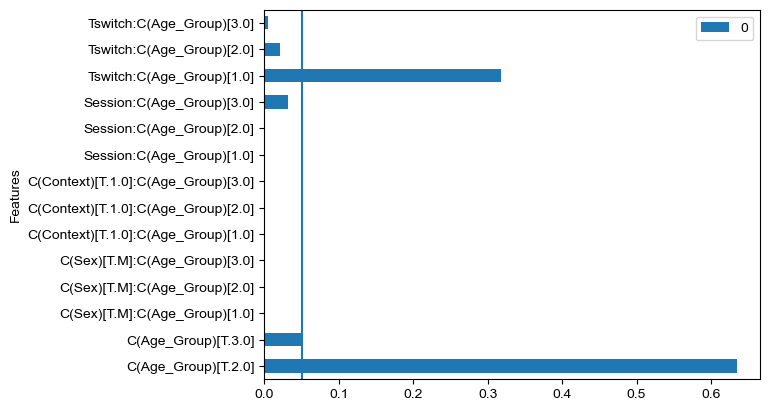

<Figure size 200x1000 with 0 Axes>

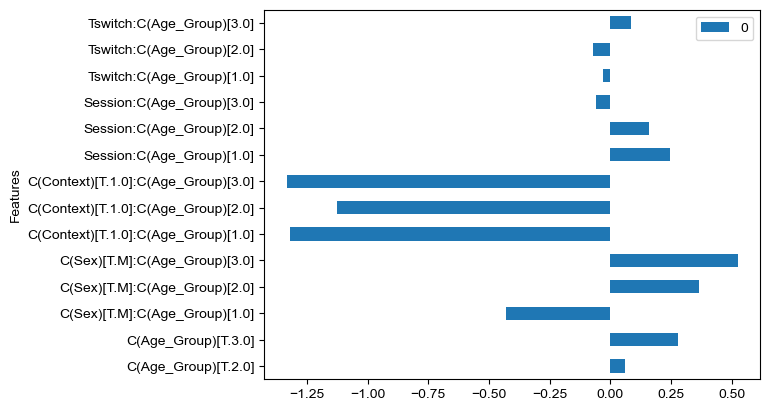

In [29]:
'''Model Probability of a Context:Aligned Trial'''

import statsmodels.api as sm
from patsy import dmatrices

#gather fixed effects into lists & then into dataframe
Animal_ID = list(allmice)
Session = list(allsesh)
Sex = list(allsex)
Age_Group = list(allage)
Trial_ID = list(alltrialid)
Cohort = list(allcohort)
K = list(allk)

Req = list(allreq)
Aligned = list(allaligned)
Context = list(allcontext)
Tswitch = list(alltswitch)
Switch = list(allswitch)

tuples = list(zip(Animal_ID, Session, Sex, Age_Group, Trial_ID, Cohort, K, Req, Aligned, Context, Tswitch, Switch))
tuples

df = pd.DataFrame(tuples, columns = ['Animal_ID', 'Session', 'Sex', 'Age_Group', 'Trial_ID', 'Cohort', 'K','Req', 'Aligned', 'Context', 'Tswitch', 'Switch'])
df = df.dropna(axis = 0)

#Collect Figure 3d Source Data
df.to_csv(r'C:\Users\Python\Desktop\LocalData\Figure3S4\3d.csv', index = False, header = True)

# model probability of a correct response
y,X = dmatrices('Aligned ~ 1 + C(Age_Group) + C(Sex):C(Age_Group) + Session:C(Age_Group) + C(Context):C(Age_Group) + Tswitch:C(Age_Group)', data = df, return_type = 'dataframe')
#y,X = dmatrices('Aligned ~ 1 + C(Age_Group) + C(Sex):C(Age_Group) + C(Remap) + C(Remap):C(Age_Group) + Session:C(Age_Group) + C(Context):C(Age_Group) + Switch:C(Age_Group)', data = df, return_type = 'dataframe')
maligned = sm.Logit(y,X).fit()
print(maligned.summary())

#plot fitted values
pvalues = pd.concat([maligned.pvalues[1:].T.to_frame()], 
                   ignore_index=False)
pvalues.index.name = 'Features'
pvalues.reset_index()

params = pd.concat([maligned.params[1:].T.to_frame()], 
                   ignore_index=False)
params.index.name = 'Features'
params.reset_index()

results = pd.merge(params, pvalues, how = "left", on = "Features",suffixes=("params","pvalues")).fillna(0).reset_index()
results = results.rename(columns={'0params': 'Params', "0pvalues":'Pvalues'})

plt.figure(figsize=(2,10))
pvalues.plot.barh()
plt.axvline(x = 0.05)
plt.show()

plt.figure(figsize=(2,10))
params.plot.barh()
plt.show()

final = results.loc[(results['Pvalues'] < 0.05)].reset_index(drop=True)
final['Odds'] = np.exp(final['Params'])
final['Percent'] = (final['Odds'] - 1)*100
final.sort_values(by=['Odds'], ascending = False).reset_index(drop=True)

#plot fitted values
hue_order = [1.0, 3.0, 2.0]
df['predicted'] = maligned.predict(X)
new_palette =  sns.color_palette(n_colors = 3)
new_palette[1], new_palette[2] = new_palette[2], new_palette[1]

In [30]:
''' Table of All Predictors '''

results

,Features,Params,Pvalues
0,C(Age_Group)[T.2.0],0.062187,6.347220e-01
1,C(Age_Group)[T.3.0],0.277813,5.176859e-02
2,C(Sex)[T.M]:C(Age_Group)[1.0],-0.430574,1.456658e-07
3,C(Sex)[T.M]:C(Age_Group)[2.0],0.365525,7.573469e-06
4,C(Sex)[T.M]:C(Age_Group)[3.0],0.526057,3.296147e-09
5,C(Context)[T.1.0]:C(Age_Group)[1.0],-1.318375,1.098810e-58
6,C(Context)[T.1.0]:C(Age_Group)[2.0],-1.127412,1.389485e-44
7,C(Context)[T.1.0]:C(Age_Group)[3.0],-1.332425,9.588441e-54
8,Session:C(Age_Group)[1.0],0.246080,1.680940e-22
9,Session:C(Age_Group)[2.0],0.159022,3.855713e-12


In [31]:
''' Table of only Significant Predictors with OR'''

final

,Features,Params,Pvalues,Odds,Percent
0,C(Sex)[T.M]:C(Age_Group)[1.0],-0.430574,1.456658e-07,0.650136,-34.986439
1,C(Sex)[T.M]:C(Age_Group)[2.0],0.365525,7.573469e-06,1.441270,44.127007
2,C(Sex)[T.M]:C(Age_Group)[3.0],0.526057,3.296147e-09,1.692247,69.224695
3,C(Context)[T.1.0]:C(Age_Group)[1.0],-1.318375,1.098810e-58,0.267570,-73.243015
4,C(Context)[T.1.0]:C(Age_Group)[2.0],-1.127412,1.389485e-44,0.323870,-67.612956
5,C(Context)[T.1.0]:C(Age_Group)[3.0],-1.332425,9.588441e-54,0.263837,-73.616326
6,Session:C(Age_Group)[1.0],0.246080,1.680940e-22,1.279001,27.900145
7,Session:C(Age_Group)[2.0],0.159022,3.855713e-12,1.172363,17.236331
8,Session:C(Age_Group)[3.0],-0.057638,3.157126e-02,0.943991,-5.600885
9,Tswitch:C(Age_Group)[2.0],-0.072408,2.091940e-02,0.930152,-6.984837



n aged, MA, young mice on day 1
5 8 6

n aged, MA, young mice on day 2
7 7 9

n aged, MA, young mice on day 3
8 9 8

n aged, MA, young mice on day 4
7 5 8

n aged, MA, young mice on day 5
8 8 9

n aged, MA, young mice on day 6
6 9 7


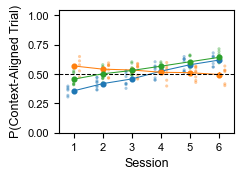

In [32]:
''' Plot Figure 3D (left)'''
#GATHER RESULTS
results = df.groupby(by = ['Animal_ID','Session'], as_index = False)['predicted'].aggregate('mean')
seshanimal = np.asarray(results['Animal_ID'])
seshcount = np.asarray(results['Session'])
seshmean = np.asarray(results['predicted'])

r = 6
salignedprobfitted_seg_aged = [[] * r for i in range(r)]
salignedprobfitted_seg_MA = [[] * r for i in range(r)]
salignedprobfitted_seg_young = [[] * r for i in range(r)]

sessioncount_fitted_aged = [[] * r for i in range(r)]
sessioncount_fitted_MA = [[] * r for i in range(r)]
sessioncount_fitted_young = [[] * r for i in range(r)]

for m, session in zip(mice, sessions): 
    
    if m in seshanimal: 
        animalidx = np.where(seshanimal == m)[0][0]
        session_idx = np.where(seshanimal == m)[0]

        if m in SM_aged_mice:
            for i, c in enumerate(seshcount[session_idx]):
                idx = c.astype(int)
                salignedprobfitted_seg_aged[idx] = np.append(salignedprobfitted_seg_aged[idx], seshmean[session_idx][i])
                sessioncount_fitted_aged[idx] = np.append(sessioncount_fitted_aged[idx], c)
        elif m in SM_MA_mice:
            for i, c in enumerate(seshcount[session_idx]):
                idx = c.astype(int)
                salignedprobfitted_seg_MA[idx] = np.append(salignedprobfitted_seg_MA[idx], seshmean[session_idx][i])
                sessioncount_fitted_MA[idx] = np.append(sessioncount_fitted_MA[idx], c)
        else:
            for i, c in enumerate(seshcount[session_idx]):
                idx = c.astype(int)
                salignedprobfitted_seg_young[idx] = np.append(salignedprobfitted_seg_young[idx], seshmean[session_idx][i])
                sessioncount_fitted_young[idx] = np.append(sessioncount_fitted_young[idx], c)
    else:
        #print(m, session)
        pass   
    
## PLOT
fig, ax = plt.subplots(figsize = (2.25,1.60))
#scatter plot actual raw data:
for i in range(0,len(salignedprobfitted_seg_aged)):
    print('\nn aged, MA, young mice on day ' + str(i + 1))
    print(len(sessioncount_fitted_aged[i]),len(sessioncount_fitted_MA[i]), len(sessioncount_fitted_young[i]))
    ax.scatter(sessioncount_fitted_aged[i] + 0.2, salignedprobfitted_seg_aged[i], s = 5, alpha = 0.4, c = 'C1', edgecolor = 'none')
    ax.scatter(sessioncount_fitted_MA[i], salignedprobfitted_seg_MA[i], s = 5, alpha = 0.4, c = 'C2', edgecolor = 'none')
    ax.scatter(sessioncount_fitted_young[i] - 0.2, salignedprobfitted_seg_young[i], s = 5, alpha = 0.4, c = 'C0', edgecolor = 'none')

g =  sns.pointplot(x = df['Session'], y = maligned.predict(X), hue = df['Age_Group'], hue_order = hue_order, scale = 0.5)
ax.set_ylabel('P(Context-Aligned Trial)', fontsize = 9)
ax.set_xlabel('Session', fontsize = 9)
ax.set_xticks([0,1,2,3,4,5])
ax.set_xticklabels(labels = [1,2,3,4,5,6])
ax.set_xlim([-0.5,5.5])
ax.set_yticks([0,0.25,0.5,0.75,1])
ax.set_ylim([0,1.05])
ax.tick_params(labelsize = 8)
ax.hlines(y = 0.5,xmin = -0.5, xmax = 5.5, linestyle = '--', lw = 0.75, color = 'k')
#plt.legend(bbox_to_anchor = (1.02,1), fontsize = 9)
g.legend_.remove()
for l in g.lines:
    plt.setp(l,linewidth = 0.75)
fig.savefig(save_folder + '3Dleft.png', dpi = 400, bbox_inches='tight')
fig.savefig(save_folder + '3Dleft.svg', dpi = 400, bbox_inches='tight')
plt.show()

In [33]:
'''   Count number of trials per group to justify where to cut the x-axis early 

After TSwitch > 7, <2 MA animals are included in the dataset. As a result, 
we cut off the x-axis below at TSwitch = 7. 

'''

# num trials per trials since switch group
results = df.groupby(by = ['Tswitch'], as_index = False)['predicted'].aggregate('count')
print(results)

# which mice those trials come from 
results = df.groupby(by = ['Tswitch','Animal_ID'], as_index = False)['predicted'].aggregate('count')
print(results.tail(20))

    Tswitch  predicted
0       0.0       3979
1       1.0       2099
2       2.0       1010
3       3.0        513
4       4.0        254
5       5.0        114
6       6.0         62
7       7.0         24
8       8.0         14
9       9.0          5
10     10.0          3
11     11.0          2
     Tswitch Animal_ID  predicted
208      8.0       A15          2
209      8.0       A17          2
210      8.0       A22          2
211      8.0       A24          1
212      8.0     MA10F          1
213      8.0      MA8F          1
214      8.0       Y20          1
215      8.0       Y22          2
216      8.0       Y23          1
217      8.0       Y28          1
218      9.0       A17          1
219      9.0       A22          1
220      9.0       A24          1
221      9.0       Y20          1
222      9.0       Y22          1
223     10.0       A17          1
224     10.0       A22          1
225     10.0       A24          1
226     11.0       A17          1
227     11.0       A2


n aged, MA, young mice on trials from switch 0
9 10 9

n aged, MA, young mice on trials from switch 1
9 10 9

n aged, MA, young mice on trials from switch 2
9 10 9

n aged, MA, young mice on trials from switch 3
9 10 9

n aged, MA, young mice on trials from switch 4
9 10 9

n aged, MA, young mice on trials from switch 5
9 10 9

n aged, MA, young mice on trials from switch 6
9 8 8

n aged, MA, young mice on trials from switch 7
6 3 6


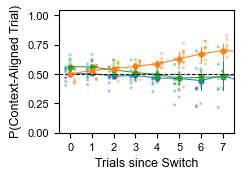

In [34]:
''' Plot Figure 3D (right)'''

## COLLECT RESULTS
results = df.groupby(by = ['Animal_ID','Tswitch'], as_index = False)['predicted'].aggregate('mean')
seshanimal = np.asarray(results['Animal_ID'])
seshcount = np.asarray(results['Tswitch'])
seshmean = np.asarray(results['predicted'])

r = 8
salignedprobfitted_seg_aged = [[] * r for i in range(r)]
salignedprobfitted_seg_MA = [[] * r for i in range(r)]
salignedprobfitted_seg_young = [[] * r for i in range(r)]

sessioncount_fitted_aged = [[] * r for i in range(r)]
sessioncount_fitted_MA = [[] * r for i in range(r)]
sessioncount_fitted_young = [[] * r for i in range(r)]

for m, session in zip(mice, sessions): 
    
    if m in seshanimal: 
        animalidx = np.where(seshanimal == m)[0][0]
        max_tswitch = len(np.where(seshanimal == m)[0])
        if max_tswitch <= 8:
            session_idx = np.arange(animalidx, max_tswitch + animalidx)
        else:
            session_idx = np.arange(animalidx, 8 + animalidx)

        if m in SM_aged_mice:
            for i, c in enumerate(seshcount[session_idx]):
                idx = c.astype(int)
                salignedprobfitted_seg_aged[idx] = np.append(salignedprobfitted_seg_aged[idx], seshmean[session_idx][i])
                sessioncount_fitted_aged[idx] = np.append(sessioncount_fitted_aged[idx], c)
        elif m in SM_MA_mice:
            for i, c in enumerate(seshcount[session_idx]):
                idx = c.astype(int)
                salignedprobfitted_seg_MA[idx] = np.append(salignedprobfitted_seg_MA[idx], seshmean[session_idx][i])
                sessioncount_fitted_MA[idx] = np.append(sessioncount_fitted_MA[idx], c)
        else:
            for i, c in enumerate(seshcount[session_idx]):
                idx = c.astype(int)
                salignedprobfitted_seg_young[idx] = np.append(salignedprobfitted_seg_young[idx], seshmean[session_idx][i])
                sessioncount_fitted_young[idx] = np.append(sessioncount_fitted_young[idx], c)
    else:
        pass

## PLOT
fig, ax = plt.subplots(figsize = (2.25,1.60))
g = sns.pointplot(data = df, x = 'Tswitch', y = 'predicted', ax = ax, hue = 'Age_Group', palette = new_palette, scale = 0.5)
ax.set_ylabel('P(Context-Aligned Trial)', fontsize = 9)
ax.set_xlabel('Trials since Switch', fontsize = 9)
ax.set_xlim([-0.5,7.5])
#ax.set_title('Age x Aligned Trial', fontsize = 10)
ax.set_xticks([0,1,2,3,4,5,6,7])
ax.set_yticks([0,0.25,0.5,0.75,1])
ax.set_ylim([0,1.05])
ax.set_xticklabels([0,1,2,3,4,5,6,7])
ax.tick_params(labelsize = 8)
ax.hlines(y = 0.5,xmin = -0.5, xmax = 7.5, linestyle = '--', lw = 0.75, color = 'k')
#plt.legend(bbox_to_anchor = (1.02,1), fontsize = 9)
g.legend_.remove()
for l in g.lines:
    plt.setp(l,linewidth = 0.75)

#scatter plot actual raw data:
for i in range(0,len(salignedprobfitted_seg_aged)):
    print('\nn aged, MA, young mice on trials from switch ' + str(i))
    print(len(sessioncount_fitted_aged[i]),len(sessioncount_fitted_MA[i]), len(sessioncount_fitted_young[i]))
    ax.scatter(sessioncount_fitted_aged[i] + 0.2, salignedprobfitted_seg_aged[i], s = 5, alpha = 0.4, c = 'C1', edgecolor = 'none')
    ax.scatter(sessioncount_fitted_MA[i], salignedprobfitted_seg_MA[i], s = 5, alpha = 0.4, c = 'C2', edgecolor = 'none')
    ax.scatter(sessioncount_fitted_young[i] - 0.2, salignedprobfitted_seg_young[i], s = 5, alpha = 0.4, c = 'C0', edgecolor = 'none')

fig.savefig(save_folder + '3Dright.png', dpi = 400, bbox_inches='tight')
fig.savefig(save_folder + '3Dright.svg', dpi = 400, bbox_inches='tight')
plt.show()

Optimization terminated successfully.
         Current function value: 0.508416
         Iterations 7
                           Logit Regression Results                           
Dep. Variable:                    Req   No. Observations:                 8079
Model:                          Logit   Df Residuals:                     8058
Method:                           MLE   Df Model:                           20
Date:                Tue, 18 Feb 2025   Pseudo R-squ.:                  0.2100
Time:                        14:43:48   Log-Likelihood:                -4107.5
converged:                       True   LL-Null:                       -5199.3
Covariance Type:            nonrobust   LLR p-value:                     0.000
                                          coef    std err          z      P>|z|      [0.025      0.975]
-------------------------------------------------------------------------------------------------------
Intercept                              -0.1740      0.123 

<Figure size 200x1000 with 0 Axes>

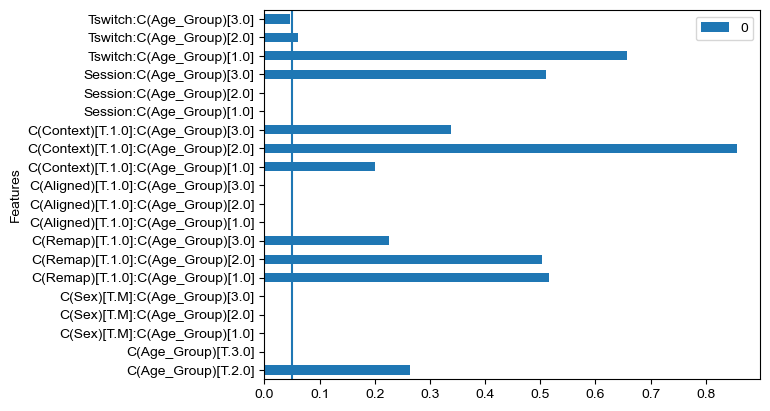

<Figure size 200x1000 with 0 Axes>

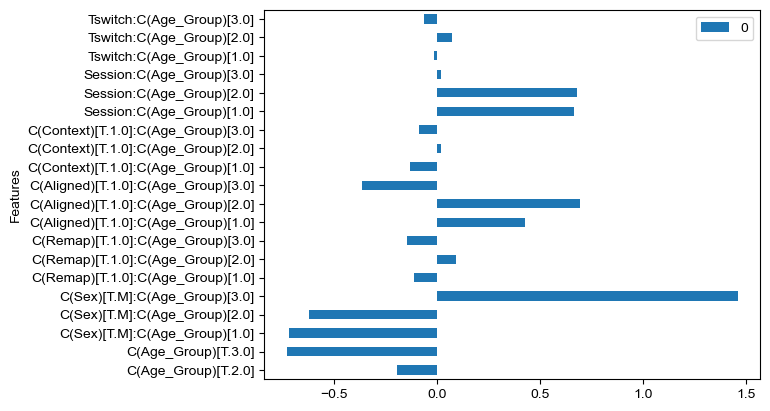

In [35]:
'''Model Probability of a Reward Request on an Alternation Trial'''

alt_idx = 140

# Add remap trial as a categorical variable to the model
allremap = []
for m, session in zip(mice, sessions):
    for s in session:
        d = data[m][s]
        rawdata_file = 'RAW_' + m + '_' + s + '.npy'
        behavior_file = 'BEHAVIOR_' + m + '_' + s + '.npy'
        raw = np.load(load_folder + rawdata_file, allow_pickle=True)
        behaviorfil = np.load(load_folder + behavior_file, allow_pickle=False)
        cell_IDs = raw.item().get('cellsfil')
        gridcell = d['gridcell'].astype(bool)
        gridcells = cell_IDs[gridcell]
        
        if len(gridcells) >= 10: 
            onemap = d['kmeans']['onemap']
            
            if onemap[0].astype(bool) == True:
                continue
            else:
                W = d['kmeans']['W']
                trials = np.arange(0, W.shape[0]-1)
                remap_idx = d['remap_idx'][1] #zero-index to the beginning of VR period 

                # Load in left vs. right info
                trialinfo = raw.item().get('trialinfo')
                left = trialinfo['left']
                skippedrawtrialfil = d['skippedrawtrialfil'].astype(int)
                VRbackidx = d['VRbackidx'].astype(int)

                leftsort = left.copy()
                lefttail = left[alt_idx:]
                trials = np.unique(skippedrawtrialfil[VRbackidx])
                alttrials = trials[trials >= 139]
                
                leftsort[alt_idx:] = lefttail[np.argsort(-1*lefttail, kind = 'stable')]
                
                leftsmall = left[alttrials]
                sortindices = np.argsort(-1*leftsmall, kind = 'stable')

                context = []
                for i, t in enumerate(np.unique(skippedrawtrialfil[VRbackidx])):
                    context = np.append(context, leftsort[t.astype(int)])
                altcontextidx = np.where(np.diff(context) == 1.)[0][0] #index where alternation begins in context vectors

                #get remap_idx for alt only, unsort it
                remap_idx = remap_idx[remap_idx >= altcontextidx]
                trials = np.unique(skippedrawtrialfil[VRbackidx])
                remaptrials = trials[remap_idx]
                
                remaptrial = np.zeros(len(trials[trials >= 139]))
                for i, t in enumerate(trials[trials >= 139]):
                    
                    trial_idx = np.where(skippedrawtrialfil == t)[0]
                    if t in remaptrials:
                        remaptrial[i] = 1
            
                unsortremaptrial = np.empty(remaptrial.shape)
                unsortremaptrial[sortindices] = remaptrial
                allremap = np.append(allremap, unsortremaptrial)

Remap = list(allremap)
tuples = list(zip(Animal_ID, Session, Sex, Age_Group, Trial_ID, Cohort, K, Req, Aligned, Context, Tswitch, Switch, Remap))
tuples

df = pd.DataFrame(tuples, columns = ['Animal_ID', 'Session', 'Sex', 'Age_Group', 'Trial_ID', 'Cohort', 'K','Req', 'Aligned', 'Context', 'Tswitch', 'Switch', 'Remap'])
df = df.dropna(axis = 0)

#Collect Figure 3g Source Data
df.to_csv(r'C:\Users\Python\Desktop\LocalData\Figure3S4\3g.csv', index = False, header = True)

# model probability of a correct response
y,X = dmatrices('Req ~ 1 + C(Age_Group) + C(Sex):C(Age_Group) + Session:C(Age_Group) + C(Remap):C(Age_Group) + C(Aligned):C(Age_Group) + C(Context):C(Age_Group) + Tswitch:C(Age_Group)', data = df, return_type = 'dataframe')
#y,X = dmatrices('Req ~ 1 + C(Age_Group) + C(Sex):C(Age_Group) + Session:C(Age_Group) + C(Aligned):C(Age_Group) + C(Context):C(Age_Group) + C(Switch):C(Age_Group)', data = df, return_type = 'dataframe')
mreq = sm.Logit(y,X).fit()
print(mreq.summary())

#plot fitted values
pvalues = pd.concat([mreq.pvalues[1:].T.to_frame()], 
                   ignore_index=False)
pvalues.index.name = 'Features'
pvalues.reset_index()

params = pd.concat([mreq.params[1:].T.to_frame()], 
                   ignore_index=False)
params.index.name = 'Features'
params.reset_index()

results = pd.merge(params, pvalues, how = "left", on = "Features",suffixes=("params","pvalues")).fillna(0).reset_index()
results = results.rename(columns={'0params': 'Params', "0pvalues":'Pvalues'})

plt.figure(figsize=(2,10))
pvalues.plot.barh()
plt.axvline(x = 0.05)
plt.show()

plt.figure(figsize=(2,10))
params.plot.barh()
plt.show()

final = results.loc[(results['Pvalues'] < 0.05)].reset_index(drop=True)
final['Odds'] = np.exp(final['Params'])
final['Percent'] = (final['Odds'] - 1)*100
final.sort_values(by=['Odds'], ascending = False).reset_index(drop=True)

#plot fitted values
hue_order = [1.0, 3.0, 2.0]
df['predicted'] = mreq.predict(X)
new_palette =  sns.color_palette(n_colors = 3)
new_palette[1], new_palette[2] = new_palette[2], new_palette[1]

In [36]:
''' Table of All Predictors '''

results

,Features,Params,Pvalues
0,C(Age_Group)[T.2.0],-0.196091,2.637910e-01
1,C(Age_Group)[T.3.0],-0.728311,3.830005e-05
2,C(Sex)[T.M]:C(Age_Group)[1.0],-0.719031,1.642671e-13
3,C(Sex)[T.M]:C(Age_Group)[2.0],-0.622188,1.640832e-09
4,C(Sex)[T.M]:C(Age_Group)[3.0],1.461433,7.288682e-55
5,C(Remap)[T.1.0]:C(Age_Group)[1.0],-0.110147,5.155226e-01
6,C(Remap)[T.1.0]:C(Age_Group)[2.0],0.091882,5.023107e-01
7,C(Remap)[T.1.0]:C(Age_Group)[3.0],-0.143916,2.254509e-01
8,C(Aligned)[T.1.0]:C(Age_Group)[1.0],0.425868,5.718995e-05
9,C(Aligned)[T.1.0]:C(Age_Group)[2.0],0.696808,6.718368e-11


In [37]:
''' Table of only Significant Predictors with OR'''

final

,Features,Params,Pvalues,Odds,Percent
0,C(Age_Group)[T.3.0],-0.728311,3.830005e-05,0.482724,-51.727648
1,C(Sex)[T.M]:C(Age_Group)[1.0],-0.719031,1.642671e-13,0.487224,-51.277568
2,C(Sex)[T.M]:C(Age_Group)[2.0],-0.622188,1.640832e-09,0.536769,-46.323140
3,C(Sex)[T.M]:C(Age_Group)[3.0],1.461433,7.288682e-55,4.312136,331.213632
4,C(Aligned)[T.1.0]:C(Age_Group)[1.0],0.425868,5.718995e-05,1.530919,53.091892
5,C(Aligned)[T.1.0]:C(Age_Group)[2.0],0.696808,6.718368e-11,2.007336,100.733559
6,C(Aligned)[T.1.0]:C(Age_Group)[3.0],-0.364165,6.885734e-05,0.694777,-30.522336
7,Session:C(Age_Group)[1.0],0.667753,9.986077e-84,1.949851,94.985083
8,Session:C(Age_Group)[2.0],0.682106,6.825422e-85,1.978040,97.803996
9,Tswitch:C(Age_Group)[3.0],-0.060882,4.615159e-02,0.940934,-5.906568


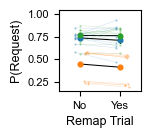

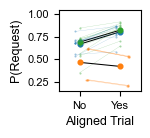

In [38]:
''' Plot Figure 3G Left & Right 

Notes:
1. In Illustrator, we jittered Age Group average markers and lines (in black) for visibility.
2. In Illustrator, we also colored the edge of Age Group average markers black for visibility. 

'''
##Get predicted results by session
results = df.groupby(by = ['Animal_ID','Session'], as_index = False)['predicted'].aggregate('mean')
seshanimal = np.asarray(results['Animal_ID'])
seshcount = np.asarray(results['Session'])
seshmean = np.asarray(results['predicted'])

r = 6
sreqprobfitted_seg_aged = [[] * r for i in range(r)]
sreqprobfitted_seg_MA = [[] * r for i in range(r)]
sreqprobfitted_seg_young = [[] * r for i in range(r)]

sessioncount_fitted_aged = [[] * r for i in range(r)]
sessioncount_fitted_MA = [[] * r for i in range(r)]
sessioncount_fitted_young = [[] * r for i in range(r)]

for m, session in zip(mice, sessions): 
    
    if m in seshanimal: 
        animalidx = np.where(seshanimal == m)[0][0]
        session_idx = np.where(seshanimal == m)[0]

        if m in SM_aged_mice:
            for i, c in enumerate(seshcount[session_idx]):
                idx = c.astype(int)
                sreqprobfitted_seg_aged[idx] = np.append(sreqprobfitted_seg_aged[idx], seshmean[session_idx][i])
                sessioncount_fitted_aged[idx] = np.append(sessioncount_fitted_aged[idx], c)
        elif m in SM_MA_mice:
            for i, c in enumerate(seshcount[session_idx]):
                idx = c.astype(int)
                sreqprobfitted_seg_MA[idx] = np.append(sreqprobfitted_seg_MA[idx], seshmean[session_idx][i])
                sessioncount_fitted_MA[idx] = np.append(sessioncount_fitted_MA[idx], c)
        else:
            for i, c in enumerate(seshcount[session_idx]):
                idx = c.astype(int)
                sreqprobfitted_seg_young[idx] = np.append(sreqprobfitted_seg_young[idx], seshmean[session_idx][i])
                sessioncount_fitted_young[idx] = np.append(sessioncount_fitted_young[idx], c)
    else:
        #print(m, session)
        pass
    
# Get results by aligned boolean
results = df.groupby(by = ['Animal_ID','Remap'], as_index = False)['predicted'].aggregate('mean')
remapanimal = np.asarray(results['Animal_ID'])
remapcount = np.asarray(results['Remap'])
remapmean = np.asarray(results['predicted'])

##PLOT Figure 3G (left)
fig, ax = plt.subplots(figsize = (1.05,1.05))

g = sns.pointplot(data = df, x = 'Remap', y = 'predicted', hue= 'Age_Group', palette = new_palette, scale = 0.5)
g.legend_.remove()
for l in g.lines:
    plt.setp(l,linewidth = 0.75, color = 'k')

for m, session in zip(mice, sessions):   
    if m in remapanimal: 
        animalidx = np.where(remapanimal == m)[0][0]
        aligned_idx = np.arange(animalidx, (animalidx + 2))
        if m in SM_aged_mice:
            ax.plot(remapcount[aligned_idx] + 0.1 + np.random.rand(1)/8, remapmean[aligned_idx], alpha = 0.4, linewidth = 0.2, marker = '.', markersize = 3, markerfacecolor = 'C1', markeredgecolor = 'None', color = 'C1')
        elif m in SM_MA_mice:
            ax.plot(remapcount[aligned_idx], remapmean[aligned_idx], alpha = 0.4, linewidth = 0.2, marker = '.', markersize = 3, markerfacecolor = 'C2', markeredgecolor = 'None', color = 'C2')
        else:
            ax.plot(remapcount[aligned_idx] - 0.1, remapmean[aligned_idx], alpha = 0.4, linewidth = 0.2, marker = '.', markersize = 3, markerfacecolor = 'C0', markeredgecolor = 'None', color = 'C0')
    
ax.set_ylabel('P(Request)', fontsize = 9)
ax.set_xlabel('Remap Trial', fontsize = 9)
ax.set_xticks(ticks = [0,1], labels = ['No','Yes'])
ax.set_yticks([0.25,0.5,0.75,1.0])
ax.tick_params(labelsize = 8)
ax.set_xlim([-0.5,1.5])
ax.set_ylim([0.15,1.05])
    
fig.savefig(save_folder + '3Gleft.png', dpi = 400, bbox_inches='tight')
fig.savefig(save_folder + '3Gleft.svg', dpi = 400, bbox_inches='tight')
plt.show()
    
# Get results by aligned boolean
results = df.groupby(by = ['Animal_ID','Aligned'], as_index = False)['predicted'].aggregate('mean')
alignedanimal = np.asarray(results['Animal_ID'])
alignedcount = np.asarray(results['Aligned'])
alignedmean = np.asarray(results['predicted'])
    
##PLOT Figure 3G (right)
fig, ax = plt.subplots(figsize = (1.05,1.05))

g = sns.pointplot(data = df, x = 'Aligned', y = 'predicted', hue= 'Age_Group', palette = new_palette, scale = 0.5)
g.legend_.remove()
for l in g.lines:
    plt.setp(l, linewidth = 0.75, color = 'k')

for m, session in zip(mice, sessions):   
    if m in alignedanimal: 
        animalidx = np.where(alignedanimal == m)[0][0]
        aligned_idx = np.arange(animalidx, (animalidx + 2))
        if m in SM_aged_mice:
            ax.plot(alignedcount[aligned_idx] + 0.1 + np.random.rand(1)/8, alignedmean[aligned_idx], alpha = 0.4, linewidth = 0.2, marker = '.', markersize = 3, markerfacecolor = 'C1', markeredgecolor = 'None', color = 'C1')
        elif m in SM_MA_mice:
            ax.plot(alignedcount[aligned_idx], alignedmean[aligned_idx], alpha = 0.4, linewidth = 0.2, marker = '.', markersize = 3, markerfacecolor = 'C2', markeredgecolor = 'None', color = 'C2')
        else:
            ax.plot(alignedcount[aligned_idx] - 0.1, alignedmean[aligned_idx], alpha = 0.4, linewidth = 0.2, marker = '.', markersize = 3, markerfacecolor = 'C0', markeredgecolor = 'None', color = 'C0')
    
ax.set_ylabel('P(Request)', fontsize = 9)
ax.set_xlabel('Aligned Trial', fontsize = 9)
ax.set_yticks([0.25,0.5,0.75,1.0])
ax.set_xticks(ticks = [0,1], labels = ['No','Yes'])
ax.tick_params(labelsize = 8)
ax.set_xlim([-0.5,1.5])
ax.set_ylim([0.15,1.05])
    
fig.savefig(save_folder + '3Gright.png', dpi = 400, bbox_inches='tight')
fig.savefig(save_folder + '3Gright.svg', dpi = 400, bbox_inches='tight')
plt.show()


Optimization terminated successfully.
         Current function value: 0.630604
         Iterations 5
                           Logit Regression Results                           
Dep. Variable:                Aligned   No. Observations:                 8079
Model:                          Logit   Df Residuals:                     8061
Method:                           MLE   Df Model:                           17
Date:                Tue, 18 Feb 2025   Pseudo R-squ.:                 0.08863
Time:                        14:49:51   Log-Likelihood:                -5094.6
converged:                       True   LL-Null:                       -5590.1
Covariance Type:            nonrobust   LLR p-value:                8.114e-200
                                          coef    std err          z      P>|z|      [0.025      0.975]
-------------------------------------------------------------------------------------------------------
Intercept                               0.1946      0.094 

<Figure size 200x1000 with 0 Axes>

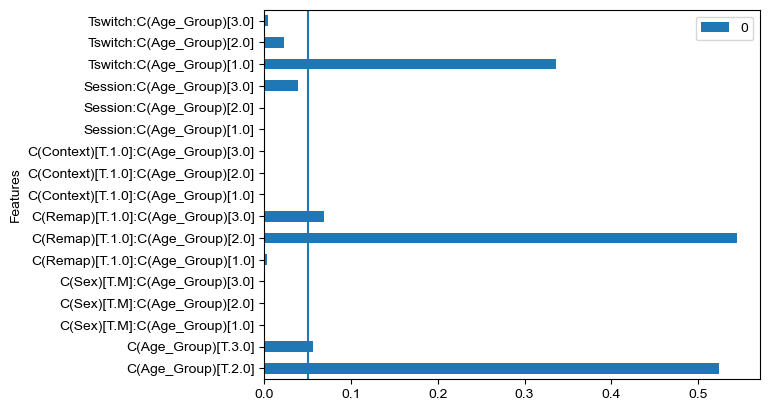

<Figure size 200x1000 with 0 Axes>

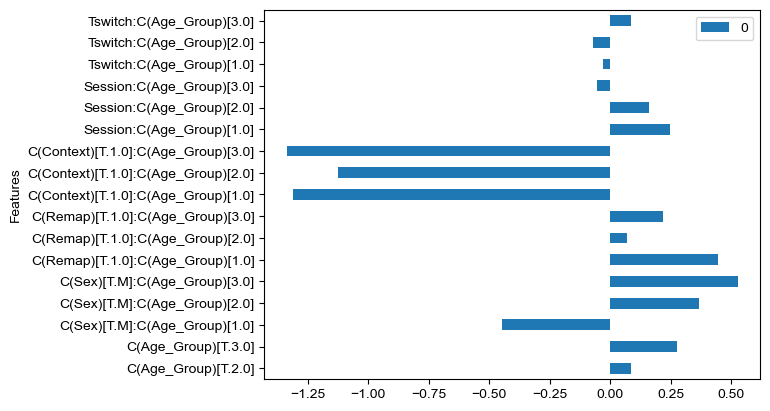

In [43]:
''' Check on Remap Effect on P(Aligned) '''

# model probability of an aligned trial
y,X = dmatrices('Aligned ~ 1 + C(Age_Group) + C(Sex):C(Age_Group) + Session:C(Age_Group) + C(Remap):C(Age_Group) + C(Context):C(Age_Group) + Tswitch:C(Age_Group)', data = df, return_type = 'dataframe')
#y,X = dmatrices('Req ~ 1 + C(Age_Group) + C(Sex):C(Age_Group) + Session:C(Age_Group) + C(Aligned):C(Age_Group) + C(Context):C(Age_Group) + C(Switch):C(Age_Group)', data = df, return_type = 'dataframe')
maligned = sm.Logit(y,X).fit()
print(maligned.summary())

#plot fitted values
pvalues = pd.concat([maligned.pvalues[1:].T.to_frame()], 
                   ignore_index=False)
pvalues.index.name = 'Features'
pvalues.reset_index()

params = pd.concat([maligned.params[1:].T.to_frame()], 
                   ignore_index=False)
params.index.name = 'Features'
params.reset_index()

results = pd.merge(params, pvalues, how = "left", on = "Features",suffixes=("params","pvalues")).fillna(0).reset_index()
results = results.rename(columns={'0params': 'Params', "0pvalues":'Pvalues'})

plt.figure(figsize=(2,10))
pvalues.plot.barh()
plt.axvline(x = 0.05)
plt.show()

plt.figure(figsize=(2,10))
params.plot.barh()
plt.show()

final = results.loc[(results['Pvalues'] < 0.05)].reset_index(drop=True)
final['Odds'] = np.exp(final['Params'])
final['Percent'] = (final['Odds'] - 1)*100
final.sort_values(by=['Odds'], ascending = False).reset_index(drop=True)

#plot fitted values
hue_order = [1.0, 3.0, 2.0]
df['predicted'] = maligned.predict(X)
new_palette =  sns.color_palette(n_colors = 3)
new_palette[1], new_palette[2] = new_palette[2], new_palette[1]


In [44]:
''' Table of All Predictors '''

results

,Features,Params,Pvalues
0,C(Age_Group)[T.2.0],0.085006,5.247631e-01
1,C(Age_Group)[T.3.0],0.276537,5.649166e-02
2,C(Sex)[T.M]:C(Age_Group)[1.0],-0.447680,5.265373e-08
3,C(Sex)[T.M]:C(Age_Group)[2.0],0.366471,7.214419e-06
4,C(Sex)[T.M]:C(Age_Group)[3.0],0.526544,3.289819e-09
5,C(Remap)[T.1.0]:C(Age_Group)[1.0],0.443019,2.515190e-03
6,C(Remap)[T.1.0]:C(Age_Group)[2.0],0.068379,5.448413e-01
7,C(Remap)[T.1.0]:C(Age_Group)[3.0],0.215825,6.867941e-02
8,C(Context)[T.1.0]:C(Age_Group)[1.0],-1.311469,6.445952e-58
9,C(Context)[T.1.0]:C(Age_Group)[2.0],-1.125146,2.507089e-44


In [45]:
''' Table of only Significant Predictors with OR'''

final

,Features,Params,Pvalues,Odds,Percent
0,C(Sex)[T.M]:C(Age_Group)[1.0],-0.447680,5.265373e-08,0.639109,-36.089073
1,C(Sex)[T.M]:C(Age_Group)[2.0],0.366471,7.214419e-06,1.442634,44.263432
2,C(Sex)[T.M]:C(Age_Group)[3.0],0.526544,3.289819e-09,1.693072,69.307174
3,C(Remap)[T.1.0]:C(Age_Group)[1.0],0.443019,2.515190e-03,1.557401,55.740145
4,C(Context)[T.1.0]:C(Age_Group)[1.0],-1.311469,6.445952e-58,0.269424,-73.057612
5,C(Context)[T.1.0]:C(Age_Group)[2.0],-1.125146,2.507089e-44,0.324605,-67.539501
6,C(Context)[T.1.0]:C(Age_Group)[3.0],-1.336048,6.747347e-54,0.262883,-73.711749
7,Session:C(Age_Group)[1.0],0.247071,1.322711e-22,1.280270,28.026984
8,Session:C(Age_Group)[2.0],0.159883,3.266480e-12,1.173374,17.337400
9,Session:C(Age_Group)[3.0],-0.055419,3.923754e-02,0.946088,-5.391152


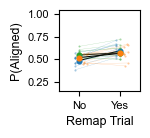

In [46]:
# Get results by aligned boolean
results = df.groupby(by = ['Animal_ID','Remap'], as_index = False)['predicted'].aggregate('mean')
remapanimal = np.asarray(results['Animal_ID'])
remapcount = np.asarray(results['Remap'])
remapmean = np.asarray(results['predicted'])

##PLOT Figure 3G (left)
fig, ax = plt.subplots(figsize = (1.05,1.05))

g = sns.pointplot(data = df, x = 'Remap', y = 'predicted', hue= 'Age_Group', palette = new_palette, scale = 0.5)
g.legend_.remove()
for l in g.lines:
    plt.setp(l,linewidth = 0.75, color = 'k')

for m, session in zip(mice, sessions):   
    if m in remapanimal: 
        animalidx = np.where(remapanimal == m)[0][0]
        aligned_idx = np.arange(animalidx, (animalidx + 2))
        if m in SM_aged_mice:
            ax.plot(remapcount[aligned_idx] + 0.1 + np.random.rand(1)/8, remapmean[aligned_idx], alpha = 0.4, linewidth = 0.2, marker = '.', markersize = 3, markerfacecolor = 'C1', markeredgecolor = 'None', color = 'C1')
        elif m in SM_MA_mice:
            ax.plot(remapcount[aligned_idx], remapmean[aligned_idx], alpha = 0.4, linewidth = 0.2, marker = '.', markersize = 3, markerfacecolor = 'C2', markeredgecolor = 'None', color = 'C2')
        else:
            ax.plot(remapcount[aligned_idx] - 0.1, remapmean[aligned_idx], alpha = 0.4, linewidth = 0.2, marker = '.', markersize = 3, markerfacecolor = 'C0', markeredgecolor = 'None', color = 'C0')
    
ax.set_ylabel('P(Aligned)', fontsize = 9)
ax.set_xlabel('Remap Trial', fontsize = 9)
ax.set_xticks(ticks = [0,1], labels = ['No','Yes'])
ax.set_yticks([0.25,0.5,0.75,1.0])
ax.tick_params(labelsize = 8)
ax.set_xlim([-0.5,1.5])
ax.set_ylim([0.15,1.05])
    
#fig.savefig(save_folder + '3Gleft.png', dpi = 400, bbox_inches='tight')
#fig.savefig(save_folder + '3Gleft.svg', dpi = 400, bbox_inches='tight')
plt.show()

In [47]:
''' Assemble data frame with reward request, context-map alignment, mouse age/sex/cohort/ID, VR context, & num trials
since a switch data for each block trial '''

total_trials = 0

allreq = []
allaligned = []
allcontext = []
alltswitch = []
allswitch = []

alltrialid = []
allsesh = []
allage = []
allsex = []
allcohort = []
allmice = []
allk = []

alt_idx = 140

for m, session in zip(mice, sessions):
    
    msex = np.array(animalmeta.loc[(animalmeta.Animal_ID == m),'Sex'])
    age =  np.array(animalmeta.loc[(animalmeta.Animal_ID == m),'Age_Group'])
    cohort =  np.array(animalmeta.loc[(animalmeta.Animal_ID == m),'Cohort'])
    totalsesh = len(session)
    sesh_count = 0
    
    for s in tdqm(session):
        d = data[m][s]
        
        #get some data & cell IDs
        rawdata_file = 'RAW_' + m + '_' + s + '.npy'
        spikes_file = 'SPIKES_' + m + '_' + s +'.npy'
        behavior_file = 'BEHAVIOR_' + m + '_' + s + '.npy'
        
        raw = np.load(load_folder + rawdata_file, allow_pickle=True)
        Y = np.load(load_folder + spikes_file, allow_pickle=False) #pre-filtered for speeds >2cm/s, position-corrected spikes, 20 ms timebins
        behaviorfil = np.load(load_folder + behavior_file, allow_pickle=False)
        
        cell_IDs = raw.item().get('cellsfil')
        gridcell = d['gridcell'].astype(bool)
        gridcells = cell_IDs[gridcell]     
        
        posx = behaviorfil[:,0]
        trial = behaviorfil[:,2]
        rawtrialfil = raw.item().get('trialfil')  
        
        if len(gridcells) >= 10:
            W = d['kmeans']['W']
            skippedrawtrialfil = d['skippedrawtrialfil'].astype(int)
            VRbackidx = d['VRbackidx'].astype(int)

            # Load in left vs. right info
            trialinfo = raw.item().get('trialinfo')
            left = trialinfo['left']

            trials = np.unique(skippedrawtrialfil[VRbackidx])
            blocktrials = trials[trials < 139]
            
            #get distance in trials since a context switch for each alternation trial
            distswitch = []
            switch = []
            countsinceswitch = 0 
            
            allswitchtrials = np.where(np.diff(left) != 0)[0] + 1
            altswitchtrials = allswitchtrials[allswitchtrials < 139]
            for i, t in enumerate(blocktrials):
                if t in altswitchtrials:
                    countsinceswitch = 0
                    distswitch = np.append(distswitch, countsinceswitch)
                    switch = np.append(switch, 1)
                else:
                    countsinceswitch += 1
                    distswitch = np.append(distswitch, countsinceswitch)
                    switch = np.append(switch, 0)
                    
            #reward requests as binary vector for alternation trials
            reward = raw.item().get('reward')
            reward['trials'] = np.arange(0,len(reward['trials']),1) # fixes occassional Unity error numbering of rewards 
            
            blockreq = []
            for i, t in enumerate(blocktrials):
                blockreq = np.append(blockreq, ~reward['missed'][reward['trials'] == t].astype(bool))
            
            #sort alternation context to retrieve alignment     
            leftsort = left.copy()
            lefttail = left[alt_idx:]
            leftsort[alt_idx:] = lefttail[np.argsort(-1*lefttail, kind = 'stable')]

            context = []
            unsortcontext = []
            for i, t in enumerate(trials):
                context = np.append(context, leftsort[t.astype(int)])
                unsortcontext = np.append(unsortcontext, left[t.astype(int)])
    
            #altcontextidx = np.where(np.diff(context) == 1.)[0][0] #index where alternation begins in context vectors
            blockcontextunsort = unsortcontext[trials < 139]
            
            leftsmall = left[blocktrials]
            sortindices = np.argsort(-1*leftsmall, kind = 'stable')

            if (d['kmeans']['SilN'] == 2) and (d['kmeans']['onemap'][0] == False):
                
                map_A = W[:, d['map0_idx']].astype(bool)

                #compute fraction trials in map = context
                sortedaligned = map_A[trials < 139] == context[trials < 139]
                aligned = np.empty(sortedaligned.shape)
                aligned[sortindices] = sortedaligned
                
                #append info about trials & reward requests
                allreq = np.append(allreq, blockreq)
                alltswitch = np.append(alltswitch, distswitch)
                allswitch = np.append(allswitch, switch)
                allaligned = np.append(allaligned, aligned)
                allcontext = np.append(allcontext, blockcontextunsort)
                
                #save out info for each trial 
                for j in range(0,len(blockreq)):
                    alltrialid = np.append(alltrialid, total_trials)
                    allsex = np.append(allsex, msex)
                    allmice = np.append(allmice, m)
                    allsesh = np.append(allsesh, sesh_count)
                    allage = np.append(allage, age)
                    allcohort = np.append(allcohort, cohort)
                    allk = np.append(allk, d['kmeans']['SilN'])

                    total_trials += 1
           
            elif (d['kmeans']['SilN'] == 3) and (d['kmeans']['onemap'][0] == False):
                
                if d['map2context'] == 0: #if map 2 is closer to representing context A, combine map 0 and 2 trials into context A trials
                    map_A = W[:, d['map0_idx']] + W[:, d['map2_idx']]
                    map_A = map_A.astype(bool)
                else:
                    map_A = W[:, d['map0_idx']].astype(bool)
                
                sortedaligned = map_A[trials < 139] == context[trials < 139]
                aligned = np.empty(sortedaligned.shape)
                aligned[sortindices] = sortedaligned
                
                #append info about trials & reward requests
                allreq = np.append(allreq, blockreq)
                alltswitch = np.append(alltswitch, distswitch)
                allswitch = np.append(allswitch, switch)
                allaligned = np.append(allaligned, aligned)
                allcontext = np.append(allcontext, blockcontextunsort)
                
                #save out info for each trial 
                for j in range(0,len(blockreq)):
                    alltrialid = np.append(alltrialid, total_trials)
                    allsex = np.append(allsex, msex)
                    allmice = np.append(allmice, m)
                    allsesh = np.append(allsesh, sesh_count)
                    allage = np.append(allage, age)
                    allcohort = np.append(allcohort, cohort)
                    allk = np.append(allk, d['kmeans']['SilN'])

                    total_trials += 1

            elif (d['kmeans']['SilN'] == 4) and (d['kmeans']['onemap'][0] == False):
                
                if (d['map2context'] == 0) and (d['map3context'] == 0): #if map 2 & 3 are closer to representing context A, combine them into context A trials
                    map_A = W[:, d['map0_idx']] + W[:, d['map2_idx']] + W[:, d['map3_idx']]
                    map_A = map_A.astype(bool)
                elif (d['map2context'] == 0) and (d['map3context'] == 1):
                    map_A = W[:, d['map0_idx']] +  W[:, d['map2_idx']]
                    map_A = map_A.astype(bool)    
                elif (d['map2context'] == 1) and (d['map3context'] == 0):
                    map_A = W[:, d['map0_idx']] +  W[:, d['map3_idx']]
                    map_A = map_A.astype(bool)
                else: #only map 0 represents A
                    map_A = W[:, d['map0_idx']].astype(bool)

                sortedaligned = map_A[trials < 139] == context[trials < 139]
                aligned = np.empty(sortedaligned.shape)
                aligned[sortindices] = sortedaligned
                
                #append info about trials & reward requests
                allreq = np.append(allreq, blockreq)
                alltswitch = np.append(alltswitch, distswitch)
                allswitch = np.append(allswitch, switch)
                allaligned = np.append(allaligned, aligned)
                allcontext = np.append(allcontext, blockcontextunsort)
                
                #save out info for each trial 
                for j in range(0,len(blockreq)):
                    alltrialid = np.append(alltrialid, total_trials)
                    allsex = np.append(allsex, msex)
                    allmice = np.append(allmice, m)
                    allsesh = np.append(allsesh, sesh_count)
                    allage = np.append(allage, age)
                    allcohort = np.append(allcohort, cohort)
                    allk = np.append(allk, d['kmeans']['SilN'])

                    total_trials += 1

        sesh_count += 1

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

Optimization terminated successfully.
         Current function value: 0.257674
         Iterations 7
                           Logit Regression Results                           
Dep. Variable:                Aligned   No. Observations:                15902
Model:                          Logit   Df Residuals:                    15887
Method:                           MLE   Df Model:                           14
Date:                Tue, 18 Feb 2025   Pseudo R-squ.:                 0.02479
Time:                        15:26:40   Log-Likelihood:                -4097.5
converged:                       True   LL-Null:                       -4201.7
Covariance Type:            nonrobust   LLR p-value:                 1.109e-36
                                          coef    std err          z      P>|z|      [0.025      0.975]
-------------------------------------------------------------------------------------------------------
Intercept                               3.0641      0.158 

<Figure size 200x1000 with 0 Axes>

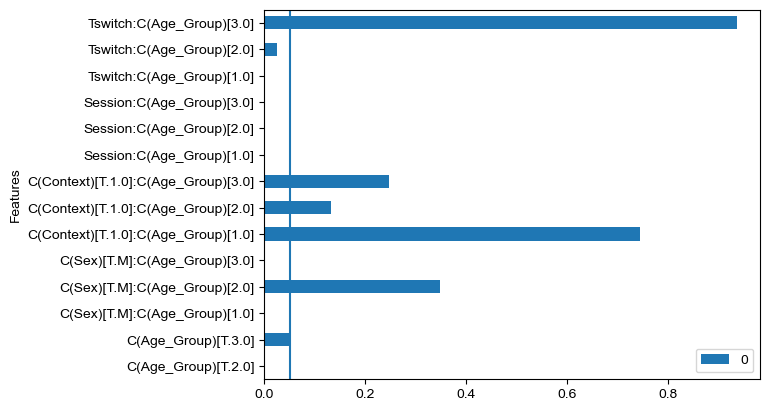

<Figure size 200x1000 with 0 Axes>

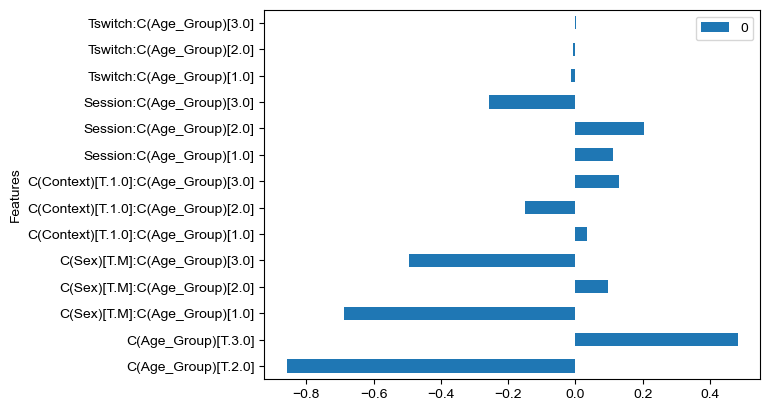

In [48]:
'''Model Probability of a Context:Aligned Block Trial'''

import statsmodels.api as sm
from patsy import dmatrices

#gather fixed effects into lists & then into dataframe
Animal_ID = list(allmice)
Session = list(allsesh)
Sex = list(allsex)
Age_Group = list(allage)
Trial_ID = list(alltrialid)
Cohort = list(allcohort)
K = list(allk)

Req = list(allreq)
Aligned = list(allaligned)
Context = list(allcontext)
Tswitch = list(alltswitch)
Switch = list(allswitch)

tuples = list(zip(Animal_ID, Session, Sex, Age_Group, Trial_ID, Cohort, K, Req, Aligned, Context, Tswitch, Switch))
tuples

df = pd.DataFrame(tuples, columns = ['Animal_ID', 'Session', 'Sex', 'Age_Group', 'Trial_ID', 'Cohort', 'K','Req', 'Aligned', 'Context', 'Tswitch', 'Switch'])
df = df.dropna(axis = 0)

#Collect Figure 3c Source Data
df.to_csv(r'C:\Users\Python\Desktop\LocalData\Figure3S4\3c.csv', index = False, header = True)

# model probability of a correct response
y,X = dmatrices('Aligned ~ 1 + C(Age_Group) + C(Sex):C(Age_Group) + Session:C(Age_Group) + C(Context):C(Age_Group) + Tswitch:C(Age_Group)', data = df, return_type = 'dataframe')
#y,X = dmatrices('Aligned ~ 1 + C(Age_Group) + C(Sex):C(Age_Group) + C(Remap) + C(Remap):C(Age_Group) + Session:C(Age_Group) + C(Context):C(Age_Group) + Switch:C(Age_Group)', data = df, return_type = 'dataframe')
maligned = sm.Logit(y,X).fit()
print(maligned.summary())

#plot fitted values
pvalues = pd.concat([maligned.pvalues[1:].T.to_frame()], 
                   ignore_index=False)
pvalues.index.name = 'Features'
pvalues.reset_index()

params = pd.concat([maligned.params[1:].T.to_frame()], 
                   ignore_index=False)
params.index.name = 'Features'
params.reset_index()

results = pd.merge(params, pvalues, how = "left", on = "Features",suffixes=("params","pvalues")).fillna(0).reset_index()
results = results.rename(columns={'0params': 'Params', "0pvalues":'Pvalues'})

plt.figure(figsize=(2,10))
pvalues.plot.barh()
plt.axvline(x = 0.05)
plt.show()

plt.figure(figsize=(2,10))
params.plot.barh()
plt.show()

final = results.loc[(results['Pvalues'] < 0.05)].reset_index(drop=True)
final['Odds'] = np.exp(final['Params'])
final['Percent'] = (final['Odds'] - 1)*100
final.sort_values(by=['Odds'], ascending = False).reset_index(drop=True)

#plot fitted values
hue_order = [1.0, 3.0, 2.0]
df['predicted'] = maligned.predict(X)
new_palette =  sns.color_palette(n_colors = 3)
new_palette[1], new_palette[2] = new_palette[2], new_palette[1]

In [49]:
''' Table of All Predictors '''

results

,Features,Params,Pvalues
0,C(Age_Group)[T.2.0],-0.857489,3.686871e-05
1,C(Age_Group)[T.3.0],0.482829,4.845718e-02
2,C(Sex)[T.M]:C(Age_Group)[1.0],-0.686963,1.575531e-10
3,C(Sex)[T.M]:C(Age_Group)[2.0],0.095972,3.478286e-01
4,C(Sex)[T.M]:C(Age_Group)[3.0],-0.494134,6.284987e-05
5,C(Context)[T.1.0]:C(Age_Group)[1.0],0.034605,7.449176e-01
6,C(Context)[T.1.0]:C(Age_Group)[2.0],-0.150954,1.317355e-01
7,C(Context)[T.1.0]:C(Age_Group)[3.0],0.129324,2.478984e-01
8,Session:C(Age_Group)[1.0],0.111522,7.077566e-04
9,Session:C(Age_Group)[2.0],0.204804,2.349399e-12


In [50]:
''' Table of only Significant Predictors with OR '''

final

,Features,Params,Pvalues,Odds,Percent
0,C(Age_Group)[T.2.0],-0.857489,3.686871e-05,0.424226,-57.577409
1,C(Age_Group)[T.3.0],0.482829,4.845718e-02,1.620652,62.065218
2,C(Sex)[T.M]:C(Age_Group)[1.0],-0.686963,1.575531e-10,0.503102,-49.689830
3,C(Sex)[T.M]:C(Age_Group)[3.0],-0.494134,6.284987e-05,0.610099,-38.990119
4,Session:C(Age_Group)[1.0],0.111522,7.077566e-04,1.117978,11.797817
5,Session:C(Age_Group)[2.0],0.204804,2.349399e-12,1.227284,22.728416
6,Session:C(Age_Group)[3.0],-0.256742,2.044503e-12,0.773568,-22.643190
7,Tswitch:C(Age_Group)[1.0],-0.013164,2.692873e-05,0.986922,-1.307810
8,Tswitch:C(Age_Group)[2.0],-0.006569,2.406087e-02,0.993452,-0.654766



n aged, MA, young mice on day 1
5 8 6

n aged, MA, young mice on day 2
7 7 9

n aged, MA, young mice on day 3
8 9 8

n aged, MA, young mice on day 4
7 5 8

n aged, MA, young mice on day 5
8 8 9

n aged, MA, young mice on day 6
6 9 7


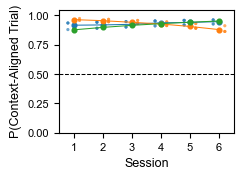

In [51]:
''' Plot Figure 3c (left) for Block Trials'''
#GATHER RESULTS
results = df.groupby(by = ['Animal_ID','Session'], as_index = False)['predicted'].aggregate('mean')
seshanimal = np.asarray(results['Animal_ID'])
seshcount = np.asarray(results['Session'])
seshmean = np.asarray(results['predicted'])

r = 6
salignedprobfitted_seg_aged = [[] * r for i in range(r)]
salignedprobfitted_seg_MA = [[] * r for i in range(r)]
salignedprobfitted_seg_young = [[] * r for i in range(r)]

sessioncount_fitted_aged = [[] * r for i in range(r)]
sessioncount_fitted_MA = [[] * r for i in range(r)]
sessioncount_fitted_young = [[] * r for i in range(r)]

for m, session in zip(mice, sessions): 
    
    if m in seshanimal: 
        animalidx = np.where(seshanimal == m)[0][0]
        session_idx = np.where(seshanimal == m)[0]

        if m in SM_aged_mice:
            for i, c in enumerate(seshcount[session_idx]):
                idx = c.astype(int)
                salignedprobfitted_seg_aged[idx] = np.append(salignedprobfitted_seg_aged[idx], seshmean[session_idx][i])
                sessioncount_fitted_aged[idx] = np.append(sessioncount_fitted_aged[idx], c)
        elif m in SM_MA_mice:
            for i, c in enumerate(seshcount[session_idx]):
                idx = c.astype(int)
                salignedprobfitted_seg_MA[idx] = np.append(salignedprobfitted_seg_MA[idx], seshmean[session_idx][i])
                sessioncount_fitted_MA[idx] = np.append(sessioncount_fitted_MA[idx], c)
        else:
            for i, c in enumerate(seshcount[session_idx]):
                idx = c.astype(int)
                salignedprobfitted_seg_young[idx] = np.append(salignedprobfitted_seg_young[idx], seshmean[session_idx][i])
                sessioncount_fitted_young[idx] = np.append(sessioncount_fitted_young[idx], c)
    else:
        #print(m, session)
        pass   
    
## PLOT Figure 3C Left
fig, ax = plt.subplots(figsize = (2.25,1.60))

#scatter plot actual raw data:
for i in range(0,len(salignedprobfitted_seg_aged)):
    print('\nn aged, MA, young mice on day ' + str(i + 1))
    print(len(sessioncount_fitted_aged[i]),len(sessioncount_fitted_MA[i]), len(sessioncount_fitted_young[i]))
    ax.scatter(sessioncount_fitted_aged[i] + 0.2, salignedprobfitted_seg_aged[i], s = 5, alpha = 0.4, c = 'C1', edgecolor = 'none')
    ax.scatter(sessioncount_fitted_MA[i], salignedprobfitted_seg_MA[i], s = 5, alpha = 0.4, c = 'C2', edgecolor = 'none')
    ax.scatter(sessioncount_fitted_young[i] - 0.2, salignedprobfitted_seg_young[i], s = 5, alpha = 0.4, c = 'C0', edgecolor = 'none')

g =  sns.pointplot(x = df['Session'], y = maligned.predict(X), hue = df['Age_Group'], hue_order = hue_order, scale = 0.5)
ax.set_ylabel('P(Context-Aligned Trial)', fontsize = 9)
ax.set_xlabel('Session', fontsize = 9)
ax.set_xticks([0,1,2,3,4,5])
ax.set_xticklabels(labels = [1,2,3,4,5,6])
ax.set_xlim([-0.5,5.5])
ax.set_yticks([0,0.25,0.5,0.75,1.0])
ax.set_ylim([0,1.05])
ax.tick_params(labelsize = 8)
ax.hlines(y = 0.5,xmin = -0.5, xmax = 5.5, linestyle = '--', lw = 0.75, color = 'k')
#plt.legend(bbox_to_anchor = (1.02,1), fontsize = 9)
g.legend_.remove()
for l in g.lines:
    plt.setp(l,linewidth = 0.75)
fig.savefig(save_folder + '3Cleft.png', dpi = 400, bbox_inches='tight')
fig.savefig(save_folder + '3Cleft.svg', dpi = 400, bbox_inches='tight')
plt.show()


n aged, MA, young mice on trials from switch 0
9 10 9

n aged, MA, young mice on trials from switch 1
9 10 9

n aged, MA, young mice on trials from switch 2
9 10 9

n aged, MA, young mice on trials from switch 3
9 10 9

n aged, MA, young mice on trials from switch 4
9 10 9

n aged, MA, young mice on trials from switch 5
9 10 9

n aged, MA, young mice on trials from switch 6
9 10 9

n aged, MA, young mice on trials from switch 7
9 10 9


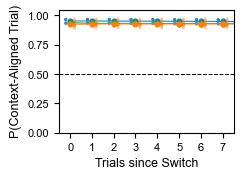

In [52]:
''' Plot Figure 3c (right) for Block Trials'''

## COLLECT RESULTS
results = df.groupby(by = ['Animal_ID','Tswitch'], as_index = False)['predicted'].aggregate('mean')
seshanimal = np.asarray(results['Animal_ID'])
seshcount = np.asarray(results['Tswitch'])
seshmean = np.asarray(results['predicted'])

r = 8
salignedprobfitted_seg_aged = [[] * r for i in range(r)]
salignedprobfitted_seg_MA = [[] * r for i in range(r)]
salignedprobfitted_seg_young = [[] * r for i in range(r)]

sessioncount_fitted_aged = [[] * r for i in range(r)]
sessioncount_fitted_MA = [[] * r for i in range(r)]
sessioncount_fitted_young = [[] * r for i in range(r)]

for m, session in zip(mice, sessions): 
    
    if m in seshanimal: 
        animalidx = np.where(seshanimal == m)[0][0]
        max_tswitch = len(np.where(seshanimal == m)[0])
        if max_tswitch <= 8:
            session_idx = np.arange(animalidx, max_tswitch + animalidx)
        else:
            session_idx = np.arange(animalidx, 8 + animalidx)

        if m in SM_aged_mice:
            for i, c in enumerate(seshcount[session_idx]):
                idx = c.astype(int)
                salignedprobfitted_seg_aged[idx] = np.append(salignedprobfitted_seg_aged[idx], seshmean[session_idx][i])
                sessioncount_fitted_aged[idx] = np.append(sessioncount_fitted_aged[idx], c)
        elif m in SM_MA_mice:
            for i, c in enumerate(seshcount[session_idx]):
                idx = c.astype(int)
                salignedprobfitted_seg_MA[idx] = np.append(salignedprobfitted_seg_MA[idx], seshmean[session_idx][i])
                sessioncount_fitted_MA[idx] = np.append(sessioncount_fitted_MA[idx], c)
        else:
            for i, c in enumerate(seshcount[session_idx]):
                idx = c.astype(int)
                salignedprobfitted_seg_young[idx] = np.append(salignedprobfitted_seg_young[idx], seshmean[session_idx][i])
                sessioncount_fitted_young[idx] = np.append(sessioncount_fitted_young[idx], c)
    else:
        pass

## PLOT Figure 3C Right
fig, ax = plt.subplots(figsize = (2.25,1.60))
g = sns.pointplot(data = df, x = 'Tswitch', y = 'predicted', ax = ax, hue = 'Age_Group', palette = new_palette, scale = 0.5)
ax.set_ylabel('P(Context-Aligned Trial)', fontsize = 9)
ax.set_xlabel('Trials since Switch', fontsize = 9)
ax.set_xlim([-0.5,7.5])
#ax.set_title('Age x Aligned Trial', fontsize = 10)
ax.set_xticks([0,1,2,3,4,5,6,7])
ax.set_yticks([0,0.25,0.5,0.75,1.0])
ax.set_ylim([0,1.05])
ax.set_xticklabels([0,1,2,3,4,5,6,7])
ax.tick_params(labelsize = 8)
ax.hlines(y = 0.5,xmin = -0.5, xmax = 7.5, linestyle = '--', lw = 0.75, color = 'k')
#plt.legend(bbox_to_anchor = (1.02,1), fontsize = 9)
g.legend_.remove()
for l in g.lines:
    plt.setp(l,linewidth = 0.75)

#scatter plot actual raw data:
for i in range(0,len(salignedprobfitted_seg_aged)):
    print('\nn aged, MA, young mice on trials from switch ' + str(i))
    print(len(sessioncount_fitted_aged[i]),len(sessioncount_fitted_MA[i]), len(sessioncount_fitted_young[i]))
    ax.scatter(sessioncount_fitted_aged[i] + 0.2, salignedprobfitted_seg_aged[i], s = 5, alpha = 0.4, c = 'C1', edgecolor = 'none')
    ax.scatter(sessioncount_fitted_MA[i], salignedprobfitted_seg_MA[i], s = 5, alpha = 0.4, c = 'C2', edgecolor = 'none')
    ax.scatter(sessioncount_fitted_young[i] - 0.2, salignedprobfitted_seg_young[i], s = 5, alpha = 0.4, c = 'C0', edgecolor = 'none')

fig.savefig(save_folder + '3Cright.png', dpi = 400, bbox_inches='tight')
fig.savefig(save_folder + '3Cright.svg', dpi = 400, bbox_inches='tight')
plt.show()

Optimization terminated successfully.
         Current function value: 0.287882
         Iterations 8
                           Logit Regression Results                           
Dep. Variable:                    Req   No. Observations:                15902
Model:                          Logit   Df Residuals:                    15881
Method:                           MLE   Df Model:                           20
Date:                Tue, 18 Feb 2025   Pseudo R-squ.:                  0.1438
Time:                        15:27:21   Log-Likelihood:                -4577.9
converged:                       True   LL-Null:                       -5346.9
Covariance Type:            nonrobust   LLR p-value:                     0.000
                                          coef    std err          z      P>|z|      [0.025      0.975]
-------------------------------------------------------------------------------------------------------
Intercept                               0.2797      0.216 

<Figure size 200x1000 with 0 Axes>

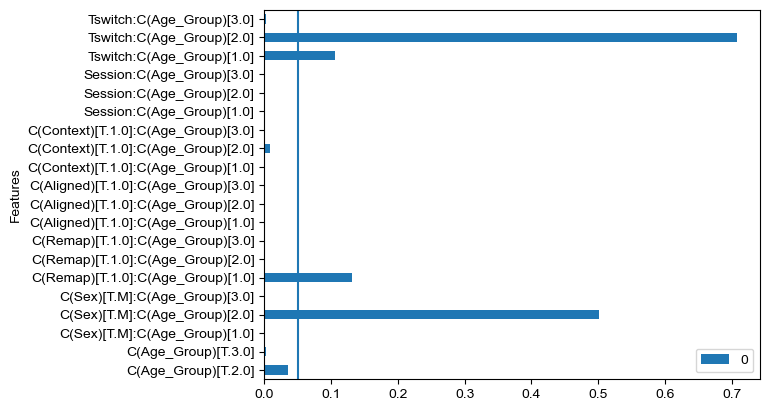

<Figure size 200x1000 with 0 Axes>

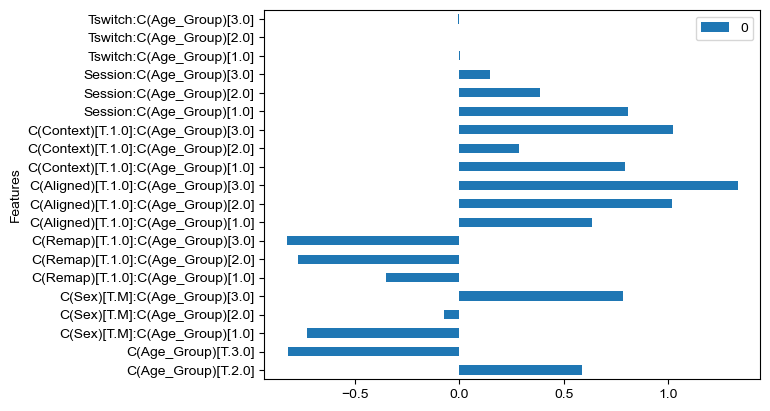

In [53]:
'''Model Probability of a Reward Request on an Block Trial'''

alt_idx = 140

# Add remap trial as a categorical variable to the model
allremap = []
for m, session in zip(mice, sessions):
    for s in session:
        d = data[m][s]
        rawdata_file = 'RAW_' + m + '_' + s + '.npy'
        behavior_file = 'BEHAVIOR_' + m + '_' + s + '.npy'
        raw = np.load(load_folder + rawdata_file, allow_pickle=True)
        behaviorfil = np.load(load_folder + behavior_file, allow_pickle=False)
        cell_IDs = raw.item().get('cellsfil')
        gridcell = d['gridcell'].astype(bool)
        gridcells = cell_IDs[gridcell]
        
        if len(gridcells) >= 10: 
            onemap = d['kmeans']['onemap']
            
            if onemap[0].astype(bool) == True:
                continue
            else:
                W = d['kmeans']['W']
                trials = np.arange(0, W.shape[0]-1)
                remap_idx = d['remap_idx'][1] #zero-index to the beginning of VR period 

                # Load in left vs. right info
                trialinfo = raw.item().get('trialinfo')
                left = trialinfo['left']
                skippedrawtrialfil = d['skippedrawtrialfil'].astype(int)
                VRbackidx = d['VRbackidx'].astype(int)

                leftsort = left.copy()
                lefttail = left[alt_idx:]
                trials = np.unique(skippedrawtrialfil[VRbackidx])
                blocktrials = trials[trials < 139]
                
                leftsort[alt_idx:] = lefttail[np.argsort(-1*lefttail, kind = 'stable')]
                
                leftsmall = left[blocktrials]
                sortindices = np.argsort(-1*leftsmall, kind = 'stable')

                context = []
                for i, t in enumerate(np.unique(skippedrawtrialfil[VRbackidx])):
                    context = np.append(context, leftsort[t.astype(int)])
                altcontextidx = np.where(np.diff(context) == 1.)[0][0] #index where alternation begins in context vectors

                #get remap_idx for alt only, unsort it
                remap_idx = remap_idx[remap_idx < altcontextidx]
                trials = np.unique(skippedrawtrialfil[VRbackidx])
                remaptrials = trials[remap_idx]
                
                remaptrial = np.zeros(len(trials[trials < 139]))
                for i, t in enumerate(trials[trials < 139]):
                    
                    trial_idx = np.where(skippedrawtrialfil == t)[0]
                    if t in remaptrials:
                        remaptrial[i] = 1
            
                unsortremaptrial = np.empty(remaptrial.shape)
                unsortremaptrial[sortindices] = remaptrial
                allremap = np.append(allremap, unsortremaptrial)

Remap = list(allremap)
tuples = list(zip(Animal_ID, Session, Sex, Age_Group, Trial_ID, Cohort, K, Req, Aligned, Context, Tswitch, Switch, Remap))
tuples

df = pd.DataFrame(tuples, columns = ['Animal_ID', 'Session', 'Sex', 'Age_Group', 'Trial_ID', 'Cohort', 'K','Req', 'Aligned', 'Context', 'Tswitch', 'Switch', 'Remap'])
df = df.dropna(axis = 0)

#Collect Figure 3f Source Data
df.to_csv(r'C:\Users\Python\Desktop\LocalData\Figure3S4\3f.csv', index = False, header = True)

# model probability of a correct response
y,X = dmatrices('Req ~ 1 + C(Age_Group) + C(Sex):C(Age_Group) + Session:C(Age_Group) + C(Remap):C(Age_Group) + C(Aligned):C(Age_Group) + C(Context):C(Age_Group) + Tswitch:C(Age_Group)', data = df, return_type = 'dataframe')
#y,X = dmatrices('Req ~ 1 + C(Age_Group) + C(Sex):C(Age_Group) + Session:C(Age_Group) + C(Aligned):C(Age_Group) + C(Context):C(Age_Group) + C(Switch):C(Age_Group)', data = df, return_type = 'dataframe')
mreq = sm.Logit(y,X).fit()
print(mreq.summary())

#plot fitted values
pvalues = pd.concat([mreq.pvalues[1:].T.to_frame()], 
                   ignore_index=False)
pvalues.index.name = 'Features'
pvalues.reset_index()

params = pd.concat([mreq.params[1:].T.to_frame()], 
                   ignore_index=False)
params.index.name = 'Features'
params.reset_index()

results = pd.merge(params, pvalues, how = "left", on = "Features",suffixes=("params","pvalues")).fillna(0).reset_index()
results = results.rename(columns={'0params': 'Params', "0pvalues":'Pvalues'})

plt.figure(figsize=(2,10))
pvalues.plot.barh()
plt.axvline(x = 0.05)
plt.show()

plt.figure(figsize=(2,10))
params.plot.barh()
plt.show()

final = results.loc[(results['Pvalues'] < 0.05)].reset_index(drop=True)
final['Odds'] = np.exp(final['Params'])
final['Percent'] = (final['Odds'] - 1)*100
final.sort_values(by=['Odds'], ascending = False).reset_index(drop=True)

#plot fitted values
hue_order = [1.0, 3.0, 2.0]
df['predicted'] = mreq.predict(X)
new_palette =  sns.color_palette(n_colors = 3)
new_palette[1], new_palette[2] = new_palette[2], new_palette[1]

In [54]:
''' Table of All Predictors '''

results

,Features,Params,Pvalues
0,C(Age_Group)[T.2.0],0.588583,3.558567e-02
1,C(Age_Group)[T.3.0],-0.823477,2.696535e-03
2,C(Sex)[T.M]:C(Age_Group)[1.0],-0.729090,1.050461e-11
3,C(Sex)[T.M]:C(Age_Group)[2.0],-0.073193,5.016653e-01
4,C(Sex)[T.M]:C(Age_Group)[3.0],0.784979,1.059000e-21
5,C(Remap)[T.1.0]:C(Age_Group)[1.0],-0.353491,1.308623e-01
6,C(Remap)[T.1.0]:C(Age_Group)[2.0],-0.771976,6.172667e-06
7,C(Remap)[T.1.0]:C(Age_Group)[3.0],-0.827222,4.687695e-10
8,C(Aligned)[T.1.0]:C(Age_Group)[1.0],0.636903,1.644671e-04
9,C(Aligned)[T.1.0]:C(Age_Group)[2.0],1.021672,1.025587e-12


In [55]:
''' Table of Significant Predictors '''

final

,Features,Params,Pvalues,Odds,Percent
0,C(Age_Group)[T.2.0],0.588583,3.558567e-02,1.801434,80.143440
1,C(Age_Group)[T.3.0],-0.823477,2.696535e-03,0.438903,-56.109707
2,C(Sex)[T.M]:C(Age_Group)[1.0],-0.729090,1.050461e-11,0.482348,-51.765216
3,C(Sex)[T.M]:C(Age_Group)[3.0],0.784979,1.059000e-21,2.192361,119.236061
4,C(Remap)[T.1.0]:C(Age_Group)[2.0],-0.771976,6.172667e-06,0.462099,-53.790082
5,C(Remap)[T.1.0]:C(Age_Group)[3.0],-0.827222,4.687695e-10,0.437262,-56.273778
6,C(Aligned)[T.1.0]:C(Age_Group)[1.0],0.636903,1.644671e-04,1.890616,89.061624
7,C(Aligned)[T.1.0]:C(Age_Group)[2.0],1.021672,1.025587e-12,2.777836,177.783600
8,C(Aligned)[T.1.0]:C(Age_Group)[3.0],1.335626,1.075919e-24,3.802374,280.237413
9,C(Context)[T.1.0]:C(Age_Group)[1.0],0.795323,1.951617e-13,2.215155,121.515533


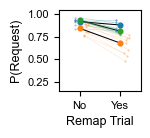

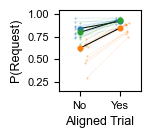

In [56]:
''' Plot Figure 3F 

Notes:
1. In Illustrator, we jittered Age Group average markers and lines (in black) for visibility.
2. In Illustrator, we also colored the edge of Age Group average markers black for visibility. 

'''
##Get predicted results by session
results = df.groupby(by = ['Animal_ID','Session'], as_index = False)['predicted'].aggregate('mean')
seshanimal = np.asarray(results['Animal_ID'])
seshcount = np.asarray(results['Session'])
seshmean = np.asarray(results['predicted'])

r = 6
sreqprobfitted_seg_aged = [[] * r for i in range(r)]
sreqprobfitted_seg_MA = [[] * r for i in range(r)]
sreqprobfitted_seg_young = [[] * r for i in range(r)]

sessioncount_fitted_aged = [[] * r for i in range(r)]
sessioncount_fitted_MA = [[] * r for i in range(r)]
sessioncount_fitted_young = [[] * r for i in range(r)]

for m, session in zip(mice, sessions): 
    
    if m in seshanimal: 
        animalidx = np.where(seshanimal == m)[0][0]
        session_idx = np.where(seshanimal == m)[0]

        if m in SM_aged_mice:
            for i, c in enumerate(seshcount[session_idx]):
                idx = c.astype(int)
                sreqprobfitted_seg_aged[idx] = np.append(sreqprobfitted_seg_aged[idx], seshmean[session_idx][i])
                sessioncount_fitted_aged[idx] = np.append(sessioncount_fitted_aged[idx], c)
        elif m in SM_MA_mice:
            for i, c in enumerate(seshcount[session_idx]):
                idx = c.astype(int)
                sreqprobfitted_seg_MA[idx] = np.append(sreqprobfitted_seg_MA[idx], seshmean[session_idx][i])
                sessioncount_fitted_MA[idx] = np.append(sessioncount_fitted_MA[idx], c)
        else:
            for i, c in enumerate(seshcount[session_idx]):
                idx = c.astype(int)
                sreqprobfitted_seg_young[idx] = np.append(sreqprobfitted_seg_young[idx], seshmean[session_idx][i])
                sessioncount_fitted_young[idx] = np.append(sessioncount_fitted_young[idx], c)
    else:
        #print(m, session)
        pass
    
# Get results by aligned boolean
results = df.groupby(by = ['Animal_ID','Remap'], as_index = False)['predicted'].aggregate('mean')
remapanimal = np.asarray(results['Animal_ID'])
remapcount = np.asarray(results['Remap'])
remapmean = np.asarray(results['predicted'])

##PLOT Figure 3F (left)
fig, ax = plt.subplots(figsize = (1.05,1.05))

g = sns.pointplot(data = df, x = 'Remap', y = 'predicted', hue= 'Age_Group', palette = new_palette, scale = 0.5)
g.legend_.remove()
for l in g.lines:
    plt.setp(l,linewidth = 0.75, color = 'k')

for m, session in zip(mice, sessions):   
    if m in remapanimal: 
        animalidx = np.where(remapanimal == m)[0][0]
        aligned_idx = np.arange(animalidx, (animalidx + 2))
        if m in SM_aged_mice:
            ax.plot(remapcount[aligned_idx] + 0.1 + np.random.rand(1)/8, remapmean[aligned_idx], alpha = 0.4, linewidth = 0.2, marker = '.', markersize = 3, markerfacecolor = 'C1', markeredgecolor = 'None', color = 'C1')
        elif m in SM_MA_mice:
            ax.plot(remapcount[aligned_idx], remapmean[aligned_idx], alpha = 0.4, linewidth = 0.2, marker = '.', markersize = 3, markerfacecolor = 'C2', markeredgecolor = 'None', color = 'C2')
        else:
            ax.plot(remapcount[aligned_idx] - 0.1, remapmean[aligned_idx], alpha = 0.4, linewidth = 0.2, marker = '.', markersize = 3, markerfacecolor = 'C0', markeredgecolor = 'None', color = 'C0')
    
ax.set_ylabel('P(Request)', fontsize = 9)
ax.set_xlabel('Remap Trial', fontsize = 9)
ax.set_xticks(ticks = [0,1], labels = ['No','Yes'])
ax.set_yticks([0.25,0.5,0.75,1.0])
ax.tick_params(labelsize = 8)
ax.set_xlim([-0.5,1.5])
ax.set_ylim([0.15,1.05])
    
fig.savefig(save_folder + '3Fleft.png', dpi = 400, bbox_inches='tight')
fig.savefig(save_folder + '3Fleft.svg', dpi = 400, bbox_inches='tight')
plt.show()
    
# Get results by aligned boolean
results = df.groupby(by = ['Animal_ID','Aligned'], as_index = False)['predicted'].aggregate('mean')
alignedanimal = np.asarray(results['Animal_ID'])
alignedcount = np.asarray(results['Aligned'])
alignedmean = np.asarray(results['predicted'])
    
##PLOT Figure 3F (right)
fig, ax = plt.subplots(figsize = (1.05,1.05))

g = sns.pointplot(data = df, x = 'Aligned', y = 'predicted', hue= 'Age_Group', palette = new_palette, scale = 0.5)
g.legend_.remove()
for l in g.lines:
    plt.setp(l, linewidth = 0.75, color = 'k')

for m, session in zip(mice, sessions):   
    if m in alignedanimal: 
        animalidx = np.where(alignedanimal == m)[0][0]
        aligned_idx = np.arange(animalidx, (animalidx + 2))
        if m in SM_aged_mice:
            ax.plot(alignedcount[aligned_idx] + 0.1 + np.random.rand(1)/8, alignedmean[aligned_idx], alpha = 0.4, linewidth = 0.2, marker = '.', markersize = 3, markerfacecolor = 'C1', markeredgecolor = 'None', color = 'C1')
        elif m in SM_MA_mice:
            ax.plot(alignedcount[aligned_idx], alignedmean[aligned_idx], alpha = 0.4, linewidth = 0.2, marker = '.', markersize = 3, markerfacecolor = 'C2', markeredgecolor = 'None', color = 'C2')
        else:
            ax.plot(alignedcount[aligned_idx] - 0.1, alignedmean[aligned_idx], alpha = 0.4, linewidth = 0.2, marker = '.', markersize = 3, markerfacecolor = 'C0', markeredgecolor = 'None', color = 'C0')
    
ax.set_ylabel('P(Request)', fontsize = 9)
ax.set_xlabel('Aligned Trial', fontsize = 9)
ax.set_yticks([0.25,0.5,0.75,1.0])
ax.set_xticks(ticks = [0,1], labels = ['No','Yes'])
ax.tick_params(labelsize = 8)
ax.set_xlim([-0.5,1.5])
ax.set_ylim([0.15,1.05])
    
fig.savefig(save_folder + '3Fright.png', dpi = 400, bbox_inches='tight')
fig.savefig(save_folder + '3Fright.svg', dpi = 400, bbox_inches='tight')
plt.show()


Optimization terminated successfully.
         Current function value: 0.245128
         Iterations 7
                           Logit Regression Results                           
Dep. Variable:                Aligned   No. Observations:                15902
Model:                          Logit   Df Residuals:                    15884
Method:                           MLE   Df Model:                           17
Date:                Tue, 18 Feb 2025   Pseudo R-squ.:                 0.07227
Time:                        15:27:23   Log-Likelihood:                -3898.0
converged:                       True   LL-Null:                       -4201.7
Covariance Type:            nonrobust   LLR p-value:                4.112e-118
                                          coef    std err          z      P>|z|      [0.025      0.975]
-------------------------------------------------------------------------------------------------------
Intercept                               3.1470      0.158 

<Figure size 200x1000 with 0 Axes>

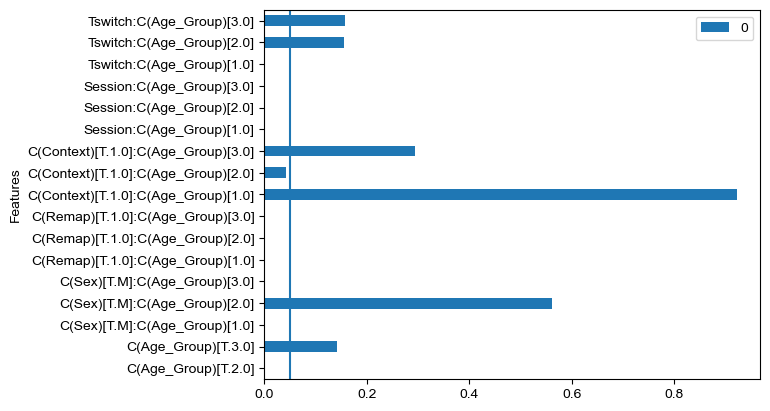

<Figure size 200x1000 with 0 Axes>

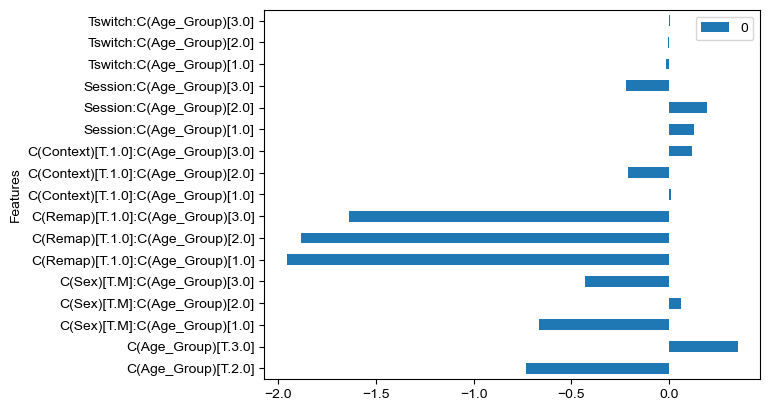

In [57]:
''' Check on Remap Effect on P(Aligned) '''

# model probability of an aligned trial
y,X = dmatrices('Aligned ~ 1 + C(Age_Group) + C(Sex):C(Age_Group) + Session:C(Age_Group) + C(Remap):C(Age_Group) + C(Context):C(Age_Group) + Tswitch:C(Age_Group)', data = df, return_type = 'dataframe')
#y,X = dmatrices('Req ~ 1 + C(Age_Group) + C(Sex):C(Age_Group) + Session:C(Age_Group) + C(Aligned):C(Age_Group) + C(Context):C(Age_Group) + C(Switch):C(Age_Group)', data = df, return_type = 'dataframe')
maligned = sm.Logit(y,X).fit()
print(maligned.summary())

#plot fitted values
pvalues = pd.concat([maligned.pvalues[1:].T.to_frame()], 
                   ignore_index=False)
pvalues.index.name = 'Features'
pvalues.reset_index()

params = pd.concat([maligned.params[1:].T.to_frame()], 
                   ignore_index=False)
params.index.name = 'Features'
params.reset_index()

results = pd.merge(params, pvalues, how = "left", on = "Features",suffixes=("params","pvalues")).fillna(0).reset_index()
results = results.rename(columns={'0params': 'Params', "0pvalues":'Pvalues'})

plt.figure(figsize=(2,10))
pvalues.plot.barh()
plt.axvline(x = 0.05)
plt.show()

plt.figure(figsize=(2,10))
params.plot.barh()
plt.show()

final = results.loc[(results['Pvalues'] < 0.05)].reset_index(drop=True)
final['Odds'] = np.exp(final['Params'])
final['Percent'] = (final['Odds'] - 1)*100
final.sort_values(by=['Odds'], ascending = False).reset_index(drop=True)

#plot fitted values
hue_order = [1.0, 3.0, 2.0]
df['predicted'] = maligned.predict(X)
new_palette =  sns.color_palette(n_colors = 3)
new_palette[1], new_palette[2] = new_palette[2], new_palette[1]


In [58]:
''' Table of All Predictors '''

results

,Features,Params,Pvalues
0,C(Age_Group)[T.2.0],-0.730814,4.480541e-04
1,C(Age_Group)[T.3.0],0.354541,1.418323e-01
2,C(Sex)[T.M]:C(Age_Group)[1.0],-0.665984,1.275507e-09
3,C(Sex)[T.M]:C(Age_Group)[2.0],0.060942,5.608300e-01
4,C(Sex)[T.M]:C(Age_Group)[3.0],-0.430569,6.187100e-04
5,C(Remap)[T.1.0]:C(Age_Group)[1.0],-1.956631,7.656014e-36
6,C(Remap)[T.1.0]:C(Age_Group)[2.0],-1.883513,4.979262e-44
7,C(Remap)[T.1.0]:C(Age_Group)[3.0],-1.638966,2.390920e-31
8,C(Context)[T.1.0]:C(Age_Group)[1.0],0.010716,9.215986e-01
9,C(Context)[T.1.0]:C(Age_Group)[2.0],-0.210379,4.168418e-02


In [59]:
''' Table of Significant Predictors '''

final

,Features,Params,Pvalues,Odds,Percent
0,C(Age_Group)[T.2.0],-0.730814,4.480541e-04,0.481517,-51.848318
1,C(Sex)[T.M]:C(Age_Group)[1.0],-0.665984,1.275507e-09,0.513768,-48.623248
2,C(Sex)[T.M]:C(Age_Group)[3.0],-0.430569,6.187100e-04,0.650139,-34.986075
3,C(Remap)[T.1.0]:C(Age_Group)[1.0],-1.956631,7.656014e-36,0.141334,-85.866627
4,C(Remap)[T.1.0]:C(Age_Group)[2.0],-1.883513,4.979262e-44,0.152055,-84.794498
5,C(Remap)[T.1.0]:C(Age_Group)[3.0],-1.638966,2.390920e-31,0.194181,-80.581930
6,C(Context)[T.1.0]:C(Age_Group)[2.0],-0.210379,4.168418e-02,0.810277,-18.972302
7,Session:C(Age_Group)[1.0],0.128067,1.568440e-04,1.136629,13.662921
8,Session:C(Age_Group)[2.0],0.194715,5.406302e-11,1.214964,21.496446
9,Session:C(Age_Group)[3.0],-0.219952,4.317707e-09,0.802557,-19.744261


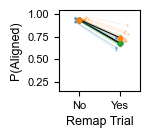

In [60]:
# Get results by aligned boolean
results = df.groupby(by = ['Animal_ID','Remap'], as_index = False)['predicted'].aggregate('mean')
remapanimal = np.asarray(results['Animal_ID'])
remapcount = np.asarray(results['Remap'])
remapmean = np.asarray(results['predicted'])

##PLOT Figure 3G (left)
fig, ax = plt.subplots(figsize = (1.05,1.05))

g = sns.pointplot(data = df, x = 'Remap', y = 'predicted', hue= 'Age_Group', palette = new_palette, scale = 0.5)
g.legend_.remove()
for l in g.lines:
    plt.setp(l,linewidth = 0.75, color = 'k')

for m, session in zip(mice, sessions):   
    if m in remapanimal: 
        animalidx = np.where(remapanimal == m)[0][0]
        aligned_idx = np.arange(animalidx, (animalidx + 2))
        if m in SM_aged_mice:
            ax.plot(remapcount[aligned_idx] + 0.1 + np.random.rand(1)/8, remapmean[aligned_idx], alpha = 0.4, linewidth = 0.2, marker = '.', markersize = 3, markerfacecolor = 'C1', markeredgecolor = 'None', color = 'C1')
        elif m in SM_MA_mice:
            ax.plot(remapcount[aligned_idx], remapmean[aligned_idx], alpha = 0.4, linewidth = 0.2, marker = '.', markersize = 3, markerfacecolor = 'C2', markeredgecolor = 'None', color = 'C2')
        else:
            ax.plot(remapcount[aligned_idx] - 0.1, remapmean[aligned_idx], alpha = 0.4, linewidth = 0.2, marker = '.', markersize = 3, markerfacecolor = 'C0', markeredgecolor = 'None', color = 'C0')
    
ax.set_ylabel('P(Aligned)', fontsize = 9)
ax.set_xlabel('Remap Trial', fontsize = 9)
ax.set_xticks(ticks = [0,1], labels = ['No','Yes'])
ax.set_yticks([0.25,0.5,0.75,1.0])
ax.tick_params(labelsize = 8)
ax.set_xlim([-0.5,1.5])
ax.set_ylim([0.15,1.05])
    
#fig.savefig(save_folder + '3Gleft.png', dpi = 400, bbox_inches='tight')
#fig.savefig(save_folder + '3Gleft.svg', dpi = 400, bbox_inches='tight')
plt.show()

# Setup for Extended Data Fig. 4D, E (left), F, H (Random Foraging)

In [107]:
'''Define which mice & sessions to load based on metadata'''
# Define mice, sessions for particular cohorts
mice , mice_ind, _  = np.intersect1d(all_mice,(np.union1d(cohorta_mice, cohortb_mice)), return_indices = True) # RF mice 

sessions = []
for i in mice_ind:
    sessions.append(all_sessions[i])

# Make a dict to hold data
data = {}

for session, m in zip(sessions, mice):
    data[m] = {}
    
    for s in session:
        data[m][s] = {}

In [108]:
''' Load Shuffle Procedure Scores to Classify RF Spatial Cells '''

for m, session in zip(mice, sessions):
    for s in tdqm(session):
        d = data[m][s]
        
        #get file names
        shufsparsityscore_file = 'shufsparsityscores_' + m + '_' + s + '.npy'
        shufspatialcoherencescore_file = 'shufspatialcoherencescores_' + m + '_' + s + '.npy'

        #load npy files
        d['shuffsparsityscores'] = np.load(shuffload_folder1 + shufsparsityscore_file, allow_pickle=False)
        d['shuffspatialcoherencescores'] = np.load(shuffload_folder2 + shufspatialcoherencescore_file, allow_pickle=False)

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

In [109]:
''' Calculate Spatial Firing Sparsity & Coherence Scores for RF Cells '''

sparsity_scores = []
spatialcoherence_scores = []
dt = 0.02

for m, session in zip(mice, sessions):
    for s in tdqm(session, leave=False):
        d = data[m][s]
        
        #get data
        rawdata_file = 'RAW_' + m + '_' + s + '.npy'
        spikes_file = 'SPIKES_' + m + '_' + s +'.npy'
        behavior_file = 'BEHAVIOR_' + m + '_' + s + '.npy'
        
        raw = np.load(load_folder + rawdata_file, allow_pickle=True)
        Y = np.load(load_folder + spikes_file, allow_pickle=False) #pre-filtered for speeds >2cm/s, position-corrected spikes, 20 ms timebins
        behaviorfil = np.load(load_folder + behavior_file, allow_pickle=False)

        cell_IDs = raw.item().get('cellsfil')
        posx = behaviorfil[:,0]
        trial = behaviorfil[:,2]
        post = behaviorfil[:,3]
        
        #get smoothed FR & sparsity scores
        smoothFR, centers, smoothocc = ps.tuning_curve(posx, Y, dt, b = 2, l=2, smooth=True, SEM=False, occupancy=True)
        total_time = max(post) - min(post)
        
        sparsity_scores = []
        for i, c in enumerate(cell_IDs):
            meanFRsqr = np.square(np.mean(smoothFR[:,i]))
            products = []
            sparsity = []
            for b in range(smoothFR.shape[0]):
                binmeanFRsqr = np.square(smoothFR[b,i])
                prob = smoothocc[b,i]/total_time
                prod = prob * binmeanFRsqr
                products = np.append(products,prod)
            sparsity = np.sum(products) / meanFRsqr
            sparsity_scores = np.append(sparsity_scores,sparsity)    
        d['sparsityscores'] = sparsity_scores 
        
        #get non-smoothed FR & spatial coherence scores 
        FR, centers, occ = ps.tuning_curve(posx, Y, dt, b = 2, l=2, smooth=False, SEM=False, occupancy=True)
        
        spatialcoherence_scores = []
        for i, c in enumerate(cell_IDs):
            neighbors = get.find8adjacentElements(FR[:,i])
            meanFR_neighbors = []
            for b in range(FR.shape[0]):
                meanFR_neigh = np.mean(neighbors[b])
                meanFR_neighbors = np.append(meanFR_neighbors, meanFR_neigh)
            coherence, p = stats.pearsonr(FR[:,i],meanFR_neighbors)
            if math.isnan(coherence):
                spatialcoherence_scores = np.append(spatialcoherence_scores,0)
            else:
                spatialcoherence_scores = np.append(spatialcoherence_scores,coherence)
        d['spatialcoherencescores'] = spatialcoherence_scores

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

In [110]:
''' Classify Spatial Cells from all Sessions: 

Note : shuffled scores are produced by the notebook "Shuffle Procedure." 
Please run that for all sessions before proceeding here.

'''

per99c = []
per99s = []
dt = 0.02

for m, session in zip(mice, sessions):
    for s in tdqm(session):
        d = data[m][s]
        
        #Load scores, intn boolean to filter out interneurons
        rawdata_file = 'RAW_' + m + '_' + s + '.npy'
        intn_file = 'intn_' + m + '_' + s + '.npy'
        
        raw = np.load(load_folder + rawdata_file, allow_pickle=True)
        d['intn'] = np.load(int_save_folder + intn_file, allow_pickle = True)
        cell_IDs = raw.item().get('cellsfil')
        sparsity_scores = d['sparsityscores']
        spatialcoherence_scores = d['spatialcoherencescores']
        shuffsparsityscores = d['shuffsparsityscores']
        shuffspatialcoherencescores = d['shuffspatialcoherencescores'] 
        intn = d['intn'].astype(bool)

        #Classify spatial cells as those >P95, >P99 of both sparsity & coherence distributions
        spatialcell99 = []
        spatialcells99 = []
    
        for i, c in enumerate(cell_IDs):
            dist1 = shuffspatialcoherencescores[:,i]
            P991 = np.percentile(dist1,99)

            dist2 = shuffsparsityscores[:,i]
            P992 = np.percentile(dist2,99)
            
            per99c.append(P991)
            per99s.append(P992)

            if intn[i] == True:
                spatialcell99 = np.append(spatialcell99, False)
            elif (spatialcoherence_scores[i] > P991) & (sparsity_scores[i] > P992):
                spatialcell99 = np.append(spatialcell99, True)
            else:
                spatialcell99 = np.append(spatialcell99, False)

        spatialcell99 = np.asarray(spatialcell99).astype(bool)
        
        d['spatialcells99'] = cell_IDs[spatialcell99]
        d['spatialcell99'] = spatialcell99

print('\nMean ± SEM Coherence P99: ' + str(np.mean(per99c)) + ' ± ' + str(stats.sem(per99c)))  
print('\nMean ± SEM Sparsity P99: ' + str(np.nanmean(per99s)) + ' ± ' + str(stats.sem(per99s,  nan_policy = 'omit'))) 

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]


Mean ± SEM Coherence P99: 0.44397451511927966 ± 0.001023052553156076

Mean ± SEM Sparsity P99: 0.8021158854819103 ± 0.0022493857825195036


In [111]:
'''Get Indices of Stored Session, Animal Data Mice by Age Group'''
age_ind = []
ma_ind = []
y_ind = []
age_sind = []
ma_sind = []
y_sind = []

s_count = 0
for m, s in zip(mice, sessions):
    start = s_count
    end = len(s) + s_count

    if m in all_aged_mice:
        age_ind = np.append(age_ind, (np.where(mice == m)[0]))
        age_sind = np.append(age_sind, np.arange(start, end, 1))
    elif m in all_MA_mice:
        ma_ind = np.append(ma_ind, (np.where(mice == m)[0]))
        ma_sind = np.append(ma_sind, np.arange(start, end, 1))
    else:
        y_ind = np.append(y_ind, (np.where(mice == m)[0]))
        y_sind = np.append(y_sind, np.arange(start, end, 1))
                            
    s_count += len(s)
    
age_ind = age_ind.astype(int)
y_ind = y_ind.astype(int)
age_sind = age_sind.astype(int)
y_sind = y_sind.astype(int)

print(mice[y_ind], mice[age_ind])
print(len(mice[y_ind]), len(mice[age_ind]))
print(len(y_sind), len(age_sind))
Nold = len(mice[age_ind])
Nyoung = len(mice[y_ind])

['Y11' 'Y16' 'Y17' 'Y18' 'Y19' 'Y2' 'Y3' 'Y4' 'Y9'] ['A12' 'A13' 'A3' 'A4' 'A5' 'A6' 'A7']
9 7
44 42


In [112]:
''' Define ColorMaps for Session & Animal Boxplots '''
import matplotlib.pylab as pl
import matplotlib.lines as mlines

col_animal_old = pl.cm.Oranges([np.linspace(0.2,0.9,Nold)])
col_animal_young = pl.cm.Blues([np.linspace(0.2,0.9,Nyoung)])
col_animal = [col_animal_young, col_animal_old]

col_session_young = []
col_session_old = []
for m, session in zip(mice, sessions):
    for s in range(0,len(session)):
        
        if m in RF_aged_mice:
            idx = np.where(mice == m)[0][0]
            col_session_old.append(col_animal[1][0][idx])
        else:
            idx = np.where(mice == m)[0][0] - Nold
            col_session_young.append(col_animal[0][0][idx])

col_session = [col_session_young,col_session_old]

label_mice = ['Y11', 'Y16', 'Y17', 'Y18', 'Y19', 'Y2', 'Y3', 'Y4','Y9','A12', 'A13', 'A3', 'A4', 'A5', 'A6', 'A7']

In [113]:
'''Calculate Spatial Cell Density, Mean FR, Peak FR & Store; Store Spatial Coherence & Spatial Sparsity Scores'''

# set up arrays for plotting by session 
sper99 = []

for m, session in zip(mice,sessions):
    
    for s in tdqm(session):
        d = data[m][s]
        
        #load data
        rawdata_file = 'RAW_' + m + '_' + s + '.npy'
        spikes_file = 'SPIKES_' + m + '_' + s +'.npy'
        behavior_file = 'BEHAVIOR_' + m + '_' + s + '.npy'
        
        raw = np.load(load_folder + rawdata_file, allow_pickle=True)
        cell_IDs = raw.item().get('cellsfil')
        spatialcell99 = d['spatialcell99']
        spatialcell99 = np.asarray(spatialcell99).astype(bool)
        spatialcells99 = cell_IDs[spatialcell99]
        sper99 = np.append(sper99, 100 * len(spatialcells99)/len(cell_IDs))

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

In [114]:
''' Find where I will have NaNs for Scores, Mean & Peak FR, Slope, Y-Int'''
nan_idx99 = np.where((sper99 == 0))[0]
print(nan_idx99)
print(len(col_session[0]),len(col_session[1]))

# Adjust y_sind, ma_sind, age_sind for subsequent plots
y_sind99 = np.setdiff1d(y_sind, nan_idx99)
ma_sind99 = np.setdiff1d(ma_sind, nan_idx99)
age_sind99 = np.setdiff1d(age_sind, nan_idx99)

#adjust colormaps
yidx = []
aidx = []
for i in nan_idx99:
    yidx = np.append(yidx, np.where(y_sind == i)[0].astype(int))
    aidx = np.append(aidx, np.where(age_sind == i)[0].astype(int))
    
col_session_young99 = np.delete(col_session_young, list((yidx).astype(int)), axis = 0)
col_session_old99 = np.delete(col_session_old, list(aidx), axis = 0)
col_session99 = [col_session_young99, col_session_old99] 

print(len(col_session_young99), len(col_session_old99))

# This will fix session stats & box plots are plotted.

[85]
44 42
43 42


# Compute OR Load computed Spatial Cell FR Tensor (choose either cell below) 

In [60]:
''' Compute & Save Spatial Cell Network Similarity Matrices if you haven't run the Figure 5 Notebook yet

OR, proceed to next cell if you have done this previously...

'''

from scipy.spatial.distance import pdist
from scipy.spatial.distance import squareform

dt = 0.02

for m, session in zip(mice,sessions):

    if m in cohortb_mice:
        max_trials = 240
    else:
        max_trials = 200
        
    for s in tdqm(session):
        
        #get data
        d = data[m][s]
        
        #get some data & cell IDs
        rawdata_file = 'RAW_' + m + '_' + s + '.npy'
        spikes_file = 'SPIKES_' + m + '_' + s +'.npy'
        behavior_file = 'BEHAVIOR_' + m + '_' + s + '.npy'
        
        raw = np.load(load_folder + rawdata_file, allow_pickle=True)
        Y = np.load(load_folder + spikes_file, allow_pickle=False) #pre-filtered for speeds >2cm/s, position-corrected spikes, 20 ms timebins
        behaviorfil = np.load(load_folder + behavior_file, allow_pickle=False)
        
        cell_IDs = raw.item().get('cellsfil')
        spatialcell99 = d['spatialcell99']
        spatialcells = cell_IDs[spatialcell99]
    
        posx = behaviorfil[:,0]
        trial = behaviorfil[:,2]
        rawtrialfil = raw.item().get('trialfil')
        
        #Find any skipped trials
        try:
            _ = raw.item().get('correctedtrial').shape
            skippedtrials = get.find_skipped(trial, max_trial_num = max_trials)
            
        except:
            skippedtrials = []
        
        if np.max(np.unique(trial)) < 160: #handles truncated, shorter sessions 
            alltrial = np.arange(0, np.max(np.unique(trial)) + 1, 1)
            #print(m, s)
        else:
            alltrial = np.arange(0,max_trials,1)

        # Load in left vs. right info
        trials = np.unique(trial)
        
        #count number of skipped dark trials
        ndarkskipped = 0
        for z in skippedtrials:
            if z < 20: 
                ndarkskipped += 1
                
        #adjust trialfil so that trials are skipped instead
        skippedrawtrialfil = get.sortedtrialbyframe(rawtrialfil, trial, skippedtrials)
            
        #define random foraging trials only, excluding dark & gain change periods
        if m == 'Y9':
            start_idx = 0 
            end_idx = len(skippedrawtrialfil) + 1
        elif m in cohortb_mice:
            start_idx = (np.where(skippedrawtrialfil >= 20)[0][0]).astype(int)
            end_idx = (np.where(skippedrawtrialfil >= 220)[0][0]).astype(int)
        else:
            start_idx = 0 
            end_idx = len(skippedrawtrialfil) + 1
        
        #set ticks & text dynamically
        ticks = np.array([0, len(np.unique(skippedrawtrialfil[start_idx:end_idx]))//2 , len(np.unique(skippedrawtrialfil[start_idx:end_idx]))])
        
        #get smoothed by trial FR tensor excluding dark & gain period for all spatial cells, save into dictionary
        normFR, _, _ = ps.tuning_curve_bytrial(posx[start_idx:end_idx], skippedrawtrialfil[start_idx:end_idx], Y[start_idx:end_idx,:], dt, sigma = 5, b=5, smooth=True, normalize=True, occupancy=True) 
        sdx = []
        for i, c in enumerate(spatialcells):
            sd = (np.where(cell_IDs == c)[0][0]).astype(int)
            sdx.append(sd)
            
        normspatialFR = normFR[:,:,sdx] 
        
        if len(spatialcells) > 10:
            d['FRtensor'] = normspatialFR
            FRtensor_file = 'RF_FRtensor_' + m + '_' + s + '.npy'
            np.save(save_folder + FRtensor_file, d['FRtensor'])

            normspatialFR_unwrapped = np.reshape(normspatialFR, (normspatialFR.shape[0], -1))
            sim_vec = np.abs(pdist(normspatialFR_unwrapped, 'correlation')-1)
            sim = squareform(sim_vec)
            d['similarity'] = sim

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

In [115]:
''' Load in FRtensor & generate similarity matrices if previously computed '''

from scipy.spatial.distance import pdist
from scipy.spatial.distance import squareform
dt = 0.02

for m, session in zip(mice,sessions):        
    for s in tdqm(session):
        
        #get data
        d = data[m][s]
        
        #get some data & cell IDs
        rawdata_file = 'RAW_' + m + '_' + s + '.npy'
        raw = np.load(load_folder + rawdata_file, allow_pickle=True)
        cell_IDs = raw.item().get('cellsfil')
        spatialcell99 = d['spatialcell99']
        spatialcells = cell_IDs[spatialcell99]
        
        if len(spatialcells) > 10:
            FRtensor_file = 'RF_FRtensor_' + m + '_' + s + '.npy'
            d['FRtensor'] = np.load(save_folder + FRtensor_file)
            Y = d['FRtensor']

            Y_unwrapped = np.reshape(Y, (Y.shape[0], -1))
            sim_vec = np.abs(pdist(Y_unwrapped, 'correlation')-1)
            sim = squareform(sim_vec)
            d['similarity'] = sim

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

# Optimize K-Means k parameter for each session (k = 1 - 4) or load results of k optimization code if run previously. 

In [116]:
''' Load in K-Means Stuff'''
from tqdm import tqdm
from lvl.factor_models import KMeans as lvl_kmeans
from lvl.factor_models import NMF as lvl_soft_kmeans
from lvl.resamplers import RotationResampler
from lvl.crossval import speckled_cv_scores 
from scipy.spatial.distance import cdist 
from scipy.special import logsumexp
from sklearn.metrics import silhouette_samples, silhouette_score

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

[9.25185854e-18 9.25185854e-18 3.05400693e-05]
outperforms shuffle at optimal k = 3
stat = 55.0, p= 0.001


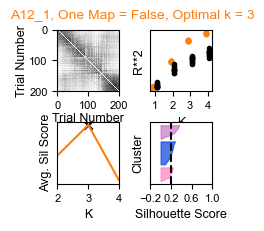

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

[9.25185854e-18 3.59183229e-05 6.17499954e-05]
outperforms shuffle at optimal k = 2
stat = 55.0, p= 0.001


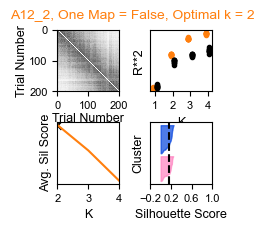

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

[9.25185854e-18 4.06736147e-05 2.64821482e-04]
outperforms shuffle at optimal k = 2
stat = 55.0, p= 0.001


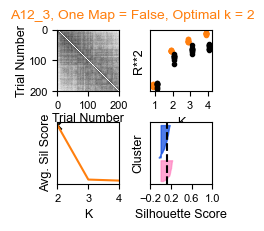

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

[1.85037171e-17 3.35626978e-05 4.99387703e-04]
outperforms shuffle at optimal k = 2
stat = 55.0, p= 0.001


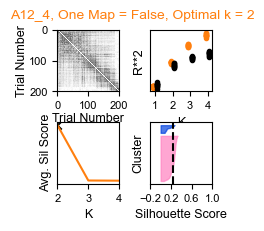

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

[9.25185854e-18 0.00000000e+00 4.62592927e-18]
outperforms shuffle at optimal k = 2
stat = 55.0, p= 0.001


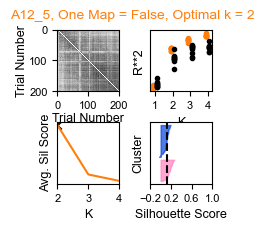

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

[4.62592927e-18 3.63879483e-05 2.99156939e-04]
does not outperform shuffle, probable one map session
stat = 43.0, p= 0.0654


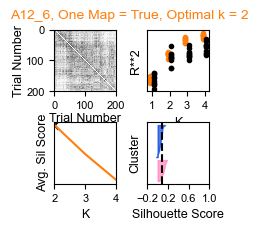

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

[4.62592927e-18 0.00000000e+00 2.17006161e-04]
outperforms shuffle at optimal k = 3
stat = 55.0, p= 0.001


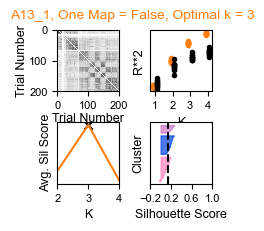

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

[0.00000000e+00 9.25185854e-18 1.82377770e-04]
outperforms shuffle at optimal k = 4
stat = 55.0, p= 0.001


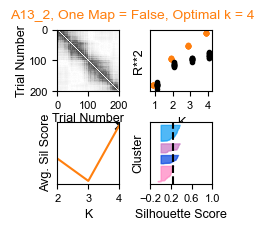

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

[9.25185854e-18 1.96296790e-05 4.67611442e-05]
outperforms shuffle at optimal k = 2
stat = 52.0, p= 0.0049


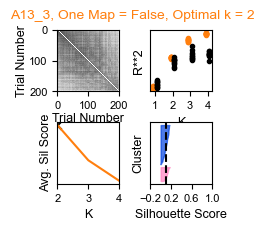

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

[9.25185854e-18 3.70242704e-04 4.83236019e-04]
outperforms shuffle at optimal k = 2
stat = 55.0, p= 0.001


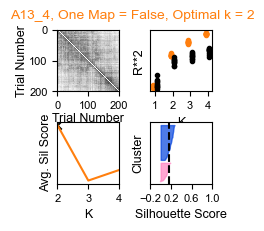

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

[0.00000000e+00 0.00000000e+00 9.25185854e-18]
outperforms shuffle at optimal k = 2
stat = 55.0, p= 0.001


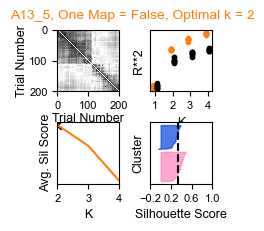

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

[0.00000000e+00 3.54548306e-05 6.60569908e-05]
outperforms shuffle at optimal k = 4
stat = 55.0, p= 0.001


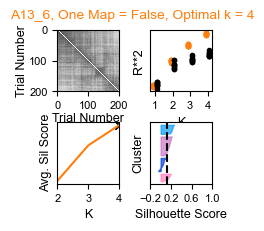

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

[4.62592927e-18 8.43541832e-05 2.08223855e-04]
outperforms shuffle at optimal k = 4
stat = 54.0, p= 0.002


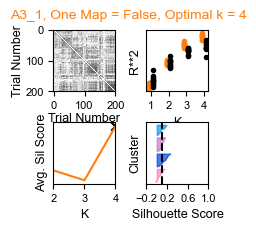

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

[0.00000000e+00 0.00000000e+00 9.25185854e-18]
outperforms shuffle at optimal k = 2
stat = 55.0, p= 0.001


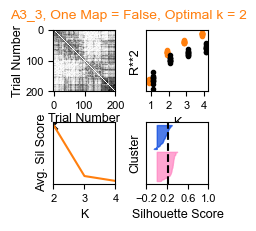

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

[0.         0.00035121 0.00192158]
outperforms shuffle at optimal k = 2
stat = 55.0, p= 0.001


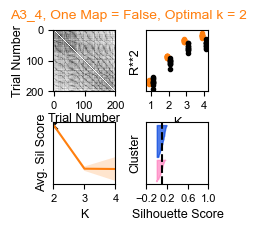

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

[2.00281427e-04 6.02130671e-05 2.03545608e-04]
outperforms shuffle at optimal k = 3
stat = 55.0, p= 0.001


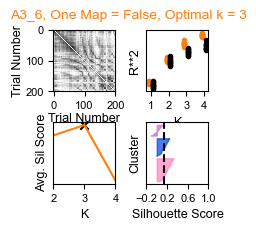

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

[0.00000000e+00 4.62592927e-18 8.62189707e-05]
outperforms shuffle at optimal k = 2
stat = 55.0, p= 0.001


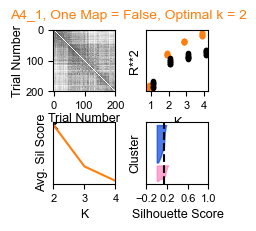

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

[7.07609681e-06 9.25185854e-18 1.40529384e-04]
outperforms shuffle at optimal k = 3
stat = 55.0, p= 0.001


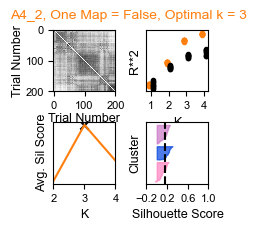

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

[9.25185854e-18 0.00000000e+00 8.05323673e-05]
outperforms shuffle at optimal k = 2
stat = 55.0, p= 0.001


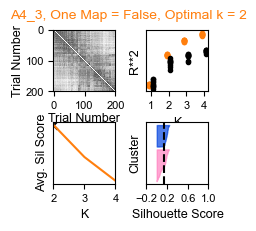

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

[4.62592927e-18 0.00000000e+00 1.08443622e-04]
outperforms shuffle at optimal k = 4
stat = 55.0, p= 0.001


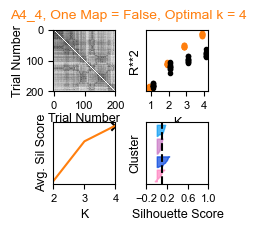

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

[9.25185854e-18 4.62592927e-18 2.99141310e-04]
outperforms shuffle at optimal k = 2
stat = 55.0, p= 0.001


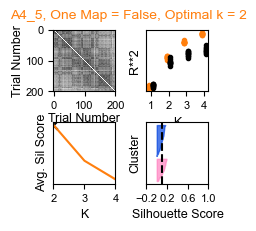

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

[9.25185854e-18 9.25185854e-18 3.57562417e-05]
outperforms shuffle at optimal k = 2
stat = 55.0, p= 0.001


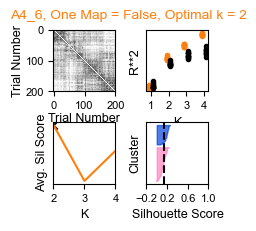

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

[9.25185854e-18 0.00000000e+00 2.38907186e-04]
outperforms shuffle at optimal k = 2
stat = 50.0, p= 0.0098


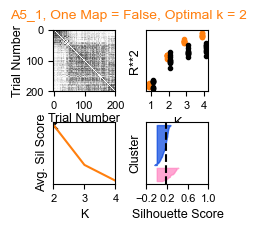

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

[0.00000000e+00 2.21602944e-04 2.37693890e-05]
outperforms shuffle at optimal k = 2
stat = 55.0, p= 0.001


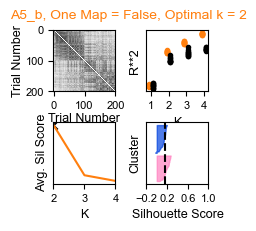

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

[9.25185854e-18 9.25185854e-18 1.54135236e-04]
outperforms shuffle at optimal k = 2
stat = 55.0, p= 0.001


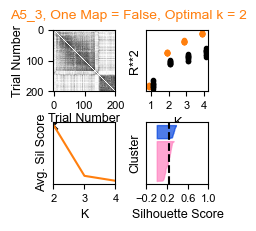

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

[0.00000000e+00 9.25185854e-18 1.93520299e-03]
outperforms shuffle at optimal k = 2
stat = 55.0, p= 0.001


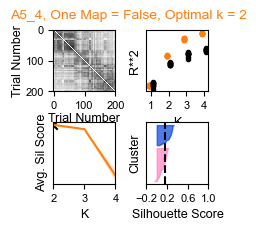

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

[0.         0.         0.00011742]
outperforms shuffle at optimal k = 4
stat = 55.0, p= 0.001


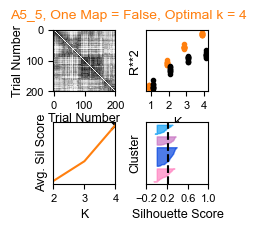

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

[9.25185854e-18 4.42044354e-05 5.69022278e-04]
outperforms shuffle at optimal k = 2
stat = 55.0, p= 0.001


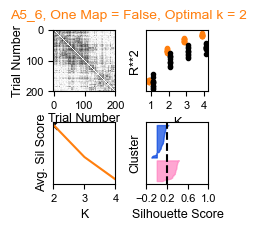

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

[9.25185854e-18 9.25185854e-18 9.25185854e-18]
outperforms shuffle at optimal k = 3
stat = 55.0, p= 0.001


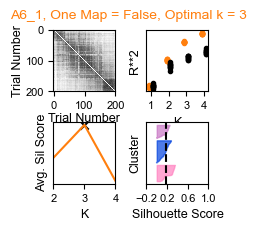

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

[0.00011169 0.00014524 0.0003334 ]
outperforms shuffle at optimal k = 3
stat = 55.0, p= 0.001


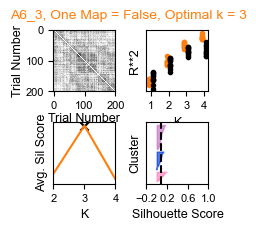

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

[0.00000000e+00 4.62592927e-18 2.47861959e-03]
outperforms shuffle at optimal k = 2
stat = 55.0, p= 0.001


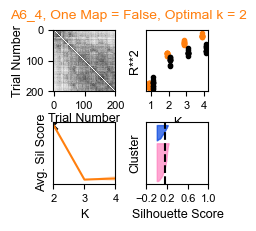

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

[0.00000000e+00 9.25185854e-18 2.47782677e-04]
outperforms shuffle at optimal k = 3
stat = 55.0, p= 0.001


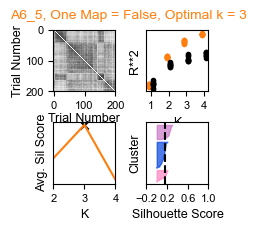

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

[9.25185854e-18 1.31231715e-04 1.50858133e-04]
outperforms shuffle at optimal k = 2
stat = 55.0, p= 0.001


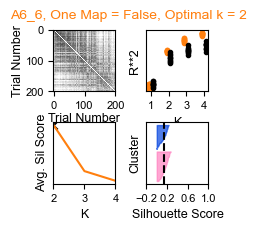

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

[4.62592927e-18 2.70645003e-04 1.38771787e-03]
outperforms shuffle at optimal k = 2
stat = 55.0, p= 0.001


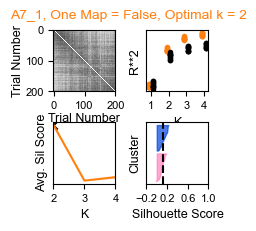

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

[0.         0.00074027 0.0010224 ]
outperforms shuffle at optimal k = 2
stat = 55.0, p= 0.001


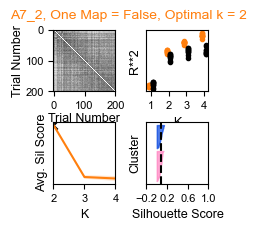

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

[0.00000000e+00 9.25185854e-18 4.62592927e-18]
outperforms shuffle at optimal k = 2
stat = 55.0, p= 0.001


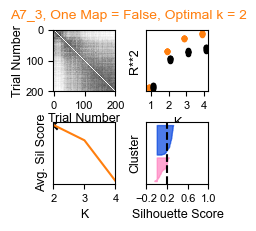

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

[9.25185854e-18 9.25185854e-18 0.00000000e+00]
outperforms shuffle at optimal k = 2
stat = 55.0, p= 0.001


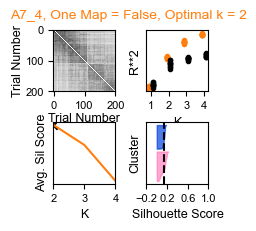

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

[9.25185854e-18 1.67700152e-04 4.85346569e-04]
outperforms shuffle at optimal k = 2
stat = 55.0, p= 0.001


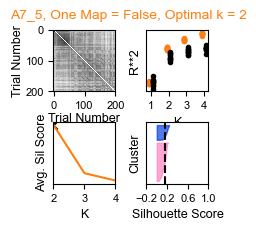

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

[2.02832924e-05 4.40828141e-04 5.54352325e-04]
outperforms shuffle at optimal k = 2
stat = 55.0, p= 0.001


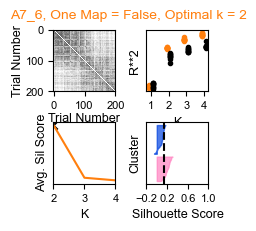

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

[9.25185854e-18 1.55676335e-04 7.36861749e-04]
outperforms shuffle at optimal k = 2
stat = 55.0, p= 0.001


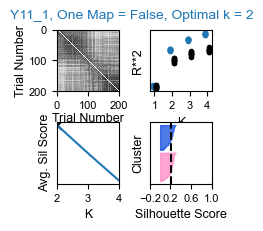

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

[0.00000000e+00 9.25185854e-18 4.16935668e-04]
outperforms shuffle at optimal k = 2
stat = 55.0, p= 0.001


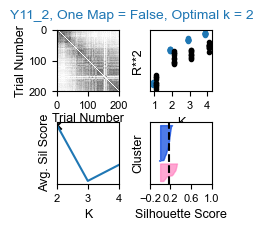

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

[0.00000000e+00 5.77615597e-05 2.22167844e-04]
outperforms shuffle at optimal k = 2
stat = 55.0, p= 0.001


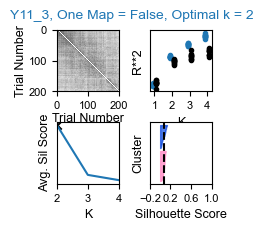

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

[9.25185854e-18 0.00000000e+00 0.00000000e+00]
outperforms shuffle at optimal k = 3
stat = 55.0, p= 0.001


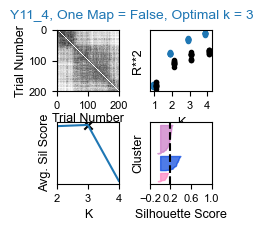

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

[9.25185854e-18 9.25185854e-18 1.13336280e-04]
outperforms shuffle at optimal k = 2
stat = 55.0, p= 0.001


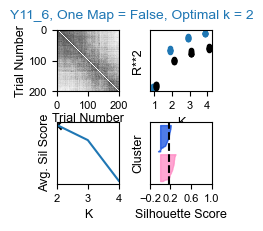

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

[9.25185854e-18 3.90447575e-04 5.34327664e-04]
outperforms shuffle at optimal k = 2
stat = 55.0, p= 0.001


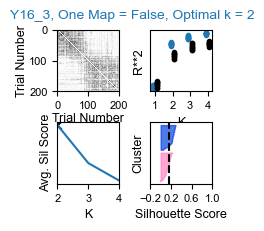

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

[1.85037171e-17 6.49479770e-05 0.00000000e+00]
outperforms shuffle at optimal k = 2
stat = 55.0, p= 0.001


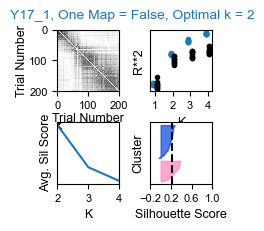

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

[0.00000000e+00 1.85037171e-17 9.25185854e-18]
outperforms shuffle at optimal k = 2
stat = 55.0, p= 0.001


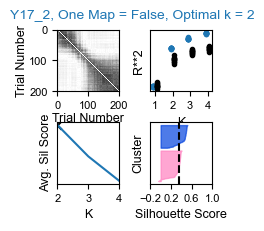

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

[0.00000000e+00 4.76119442e-05 1.52051870e-04]
outperforms shuffle at optimal k = 2
stat = 55.0, p= 0.001


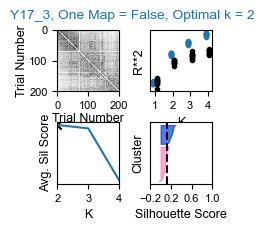

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

[0.00000000e+00 8.39877256e-05 2.45958699e-05]
outperforms shuffle at optimal k = 2
stat = 55.0, p= 0.001


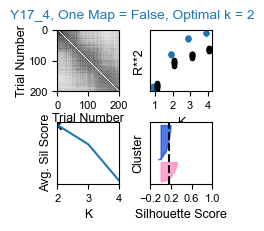

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

[9.25185854e-18 0.00000000e+00 3.84774600e-05]
outperforms shuffle at optimal k = 2
stat = 54.0, p= 0.002


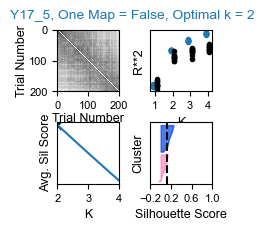

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

[0.00000000e+00 1.37742273e-04 7.98824307e-05]
outperforms shuffle at optimal k = 2
stat = 53.0, p= 0.0029


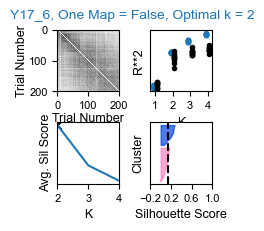

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

[9.25185854e-18 9.25185854e-18 0.00000000e+00]
outperforms shuffle at optimal k = 2
stat = 55.0, p= 0.001


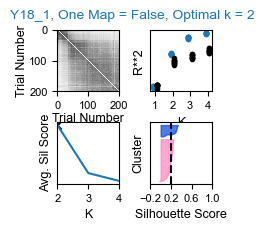

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

[9.25185854e-18 0.00000000e+00 4.20555770e-04]
outperforms shuffle at optimal k = 2
stat = 55.0, p= 0.001


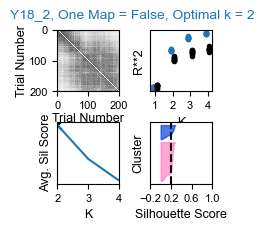

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

[4.62592927e-18 3.81721928e-04 1.40799297e-04]
outperforms shuffle at optimal k = 2
stat = 55.0, p= 0.001


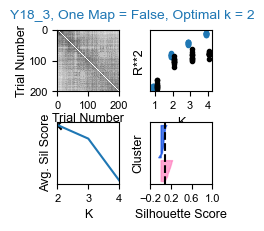

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

[0.00000000e+00 4.62592927e-18 3.53093511e-04]
outperforms shuffle at optimal k = 2
stat = 55.0, p= 0.001


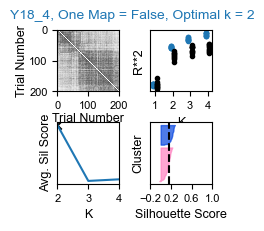

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

[4.62592927e-18 3.17322405e-06 1.61268904e-04]
outperforms shuffle at optimal k = 2
stat = 55.0, p= 0.001


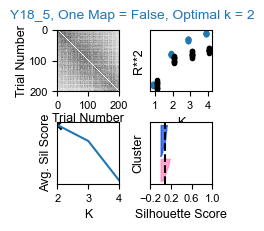

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

[4.62592927e-18 1.17812663e-04 1.06590525e-04]
outperforms shuffle at optimal k = 2
stat = 55.0, p= 0.001


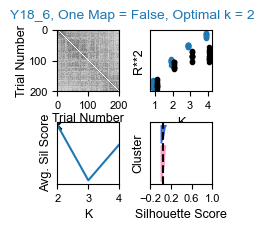

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

[9.25185854e-18 9.25185854e-18 9.25185854e-18]
outperforms shuffle at optimal k = 2
stat = 55.0, p= 0.001


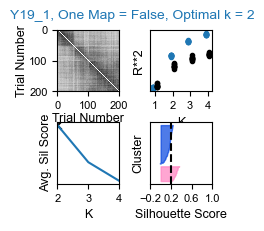

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

[1.85037171e-17 1.85037171e-17 3.92359819e-04]
outperforms shuffle at optimal k = 2
stat = 55.0, p= 0.001


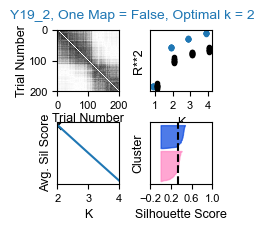

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

[9.25185854e-18 9.25185854e-18 4.85956759e-05]
outperforms shuffle at optimal k = 2
stat = 55.0, p= 0.001


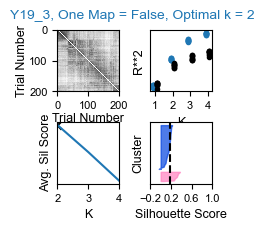

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

[9.25185854e-18 4.62592927e-18 2.33733398e-04]
outperforms shuffle at optimal k = 2
stat = 55.0, p= 0.001


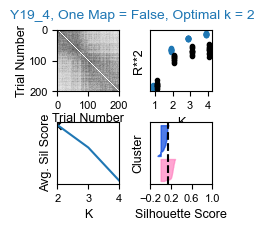

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

[0.         0.00027664 0.00140685]
outperforms shuffle at optimal k = 2
stat = 49.0, p= 0.0137


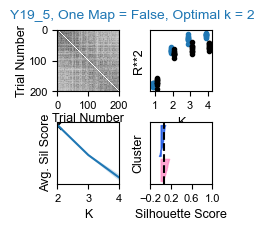

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

[4.13126428e-05 0.00000000e+00 4.15165146e-04]
outperforms shuffle at optimal k = 3
stat = 55.0, p= 0.001


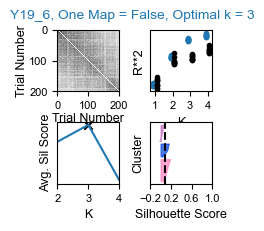

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

[0.00000000e+00 2.33676532e-05 4.62592927e-18]
outperforms shuffle at optimal k = 2
stat = 55.0, p= 0.001


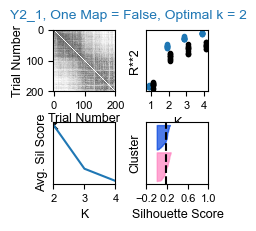

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

[0.00013418 0.00013933 0.00014474]
does not outperform shuffle, probable one map session
stat = 40.0, p= 0.1162


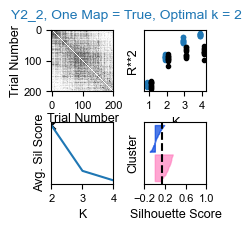

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

[9.25185854e-18 9.25185854e-18 1.47407024e-04]
outperforms shuffle at optimal k = 2
stat = 55.0, p= 0.001


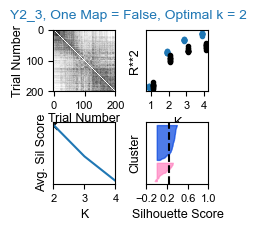

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

[1.85037171e-17 1.85037171e-17 0.00000000e+00]
outperforms shuffle at optimal k = 2
stat = 55.0, p= 0.001


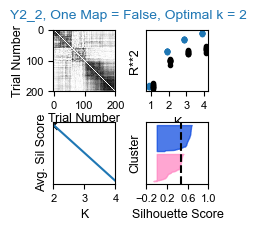

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

[1.85037171e-17 9.25185854e-18 9.25185854e-18]
outperforms shuffle at optimal k = 2
stat = 55.0, p= 0.001


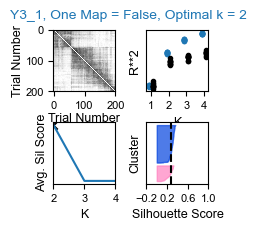

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

[1.85037171e-17 9.25185854e-18 4.78515545e-04]
outperforms shuffle at optimal k = 2
stat = 55.0, p= 0.001


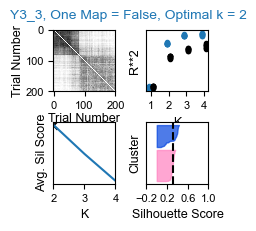

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

[9.25185854e-18 0.00000000e+00 9.25185854e-18]
outperforms shuffle at optimal k = 2
stat = 55.0, p= 0.001


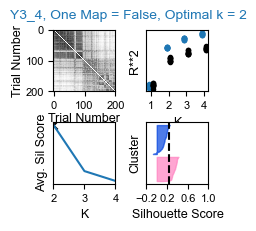

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

[9.25185854e-18 9.25185854e-18 2.70797856e-04]
outperforms shuffle at optimal k = 2
stat = 55.0, p= 0.001


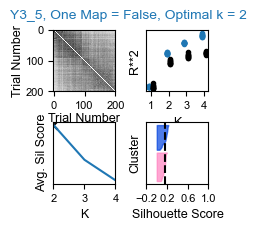

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

[1.85037171e-17 1.85037171e-17 7.34000690e-05]
outperforms shuffle at optimal k = 2
stat = 55.0, p= 0.001


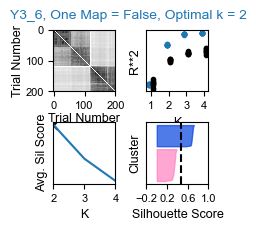

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

[3.13129263e-05 9.25185854e-18 2.09912873e-06]
outperforms shuffle at optimal k = 3
stat = 55.0, p= 0.001


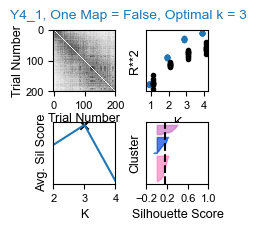

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

[4.87783505e-05 8.03227485e-05 4.62592927e-18]
outperforms shuffle at optimal k = 2
stat = 53.0, p= 0.0029


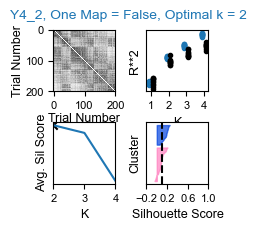

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

[9.25185854e-18 9.25185854e-18 6.69565813e-05]
outperforms shuffle at optimal k = 2
stat = 55.0, p= 0.001


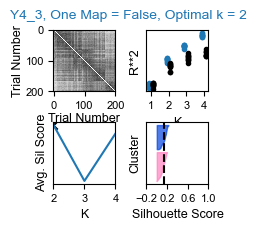

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

[0.00010024 0.00011309 0.00017155]
outperforms shuffle at optimal k = 2
stat = 52.0, p= 0.0049


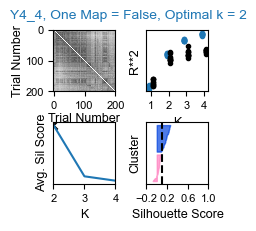

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

[4.62592927e-18 4.39498017e-05 5.83301833e-05]
outperforms shuffle at optimal k = 2
stat = 55.0, p= 0.001


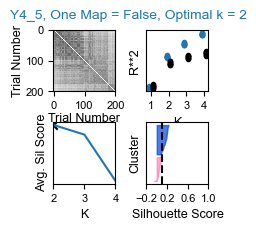

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

[0.00000000e+00 4.65369678e-04 2.57132615e-05]
outperforms shuffle at optimal k = 2
stat = 54.0, p= 0.002


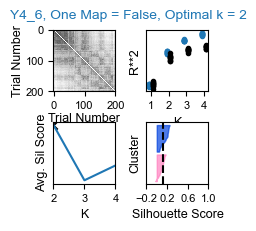

  0%|          | 0/2 [00:00<?, ?it/s]

In [65]:
''' K Hyperparameter Selection (k = 1-4); plot Extended Data Fig. 4D along the way

Y_unwrapped: matrix of shape m, n; m = n_trials & n = (nposbins * ncells)
W: first factor matrix. Has shape (m, rank) or n_trials, n_clusters (i.e. [0, 1] if map 1 and [1, 0] if map 0)
H: second factor matrix. Has shape (rank, n) or n_clusters, n_obs

Run time is about 5 - 15 minutes per session.

'''
possible_k = np.arange(2, 5, 1)
extended_k = np.arange(1,5,1)
colors = ['xkcd:pink','xkcd:blue','xkcd:orchid','xkcd:azure']
n_reps = 10 
alpha = 0.05

# if you want to visualize the quality of k selection for all sessions vs. just the examples in Extended Data Fig. 4D
#example_mice = mice
#example_sessions = sessions

# if you want to visualize the quality of k selection for only the example sessions in Extended Data Fig. 4D
example_mice = ['Y19']
example_sessions = ['070222_record5']

for m, session in zip(mice, sessions):
    for s in tdqm(session):
        d = data[m][s]
                
        rawdata_file = 'RAW_' + m + '_' + s + '.npy'
        raw = np.load(load_folder + rawdata_file, allow_pickle=True)
        cell_IDs = raw.item().get('cellsfil')
        spatialcell99 = d['spatialcell99']
        spatialcells = cell_IDs[spatialcell99]
        
        if len(spatialcells) > 10:
            Y = d['FRtensor'].copy()
            Y = Y.transpose(0, 2, 1)
            Y_unwrapped = np.reshape(Y, (Y.shape[0], -1))
            
            #Run k-means ten times and choose the k that most frequently most often maximizes the average silhouette score 
            silhouette_avgs = np.zeros((n_reps, len(possible_k)))
            for p in range(n_reps):
                sil_avgs = []
                for n in possible_k:     
                    # fit model and get params
                    model_kmeans = lvl_kmeans(n_components = n, n_restarts = 100)
                    model_kmeans.fit(Y_unwrapped)
                    W, _ = model_kmeans.factors
                    labels = []
                    for t in range(W.shape[0]):
                        mapid = np.where(W[t,:] == 1)[0]
                        labels = np.append(labels, mapid)
                    sil_avgs = np.append(sil_avgs, silhouette_score(Y_unwrapped, labels))
                silhouette_avgs[p,:] = sil_avgs
            
            #compare test R^2 vs. shuffle for k = 1-4
            # Run cross-validated k-means with speckled holdout pattern.
            km_train_scores = np.ones((4, n_reps))
            km_test_scores = np.ones((4, n_reps))

            for i, rank in enumerate(tdqm(extended_k)):
                model = lvl_kmeans(n_components=rank, n_restarts=100, maxiter=1000)
                km_train_scores[i], km_test_scores[i] = \
                    speckled_cv_scores(model, Y_unwrapped, n_repeats=n_reps)

            # Run cross-validated k-means on shuffled/resampled dataset.
            shuff_km_train_scores = np.ones((4, n_reps))
            shuff_km_test_scores = np.ones((4, n_reps))

            for i, rank in enumerate(tdqm(extended_k)):
                model = lvl_kmeans(n_components=rank, n_restarts=100, maxiter=1000)
                shuff_km_train_scores[i], shuff_km_test_scores[i] = \
                    speckled_cv_scores(model, Y_unwrapped, n_repeats=n_reps, resampler=RotationResampler())
            
            #Select optimal k, run KMeans with that k & store results, & plot to confirm quality of results
            if m in RF_aged_mice:
                col = 'C1'
            else:
                col = 'C0'
                
            SilN = possible_k[np.argmax(np.mean(silhouette_avgs, axis = 0))]
            print(stats.sem(silhouette_avgs, axis = 0))
            model_kmeans = lvl_kmeans(n_components = SilN, n_restarts = 100)
            model_kmeans.fit(Y_unwrapped)
            W, H = model_kmeans.factors
            Y_hat = model_kmeans.predict()
            score = model_kmeans.score(Y_unwrapped)
            d['kmeans'] = {}
            d['kmeans']['SilN'] = SilN
            d['kmeans']['W'] = W
            d['kmeans']['H'] = H
            d['kmeans']['Y_hat'] = Y_hat 
            d['kmeans']['Y_hat'] = Y_hat 
            d['kmeans']['score'] = score
            
            #save selected SilN (optimal k value)
            SilN_file = 'SilN_' + m + '_' + s + '.npy'
            np.save(save_folder + SilN_file, SilN)
            
            #check & save whether if sig difference in the distribution of test R^2 real vs. shuffle data at optimal k:
            chosenkidx = np.where(extended_k == SilN)[0]
            res = stats.wilcoxon(km_test_scores[chosenkidx,:][0], shuff_km_test_scores[chosenkidx,:][0], alternative = 'greater')
            onemap = []
            if res.pvalue <= alpha:
                print('outperforms shuffle at optimal k = ' + str(SilN))
                print('stat = ' + str(np.round(res.statistic,2)) + ', p= ' + str(np.round(res.pvalue, 4)))
                onemap = np.append(onemap, [False, res.statistic, res.pvalue])
            else:
                print('does not outperform shuffle, probable one map session')
                print('stat = ' + str(np.round(res.statistic,2)) + ', p= ' + str(np.round(res.pvalue, 4)))
                onemap = np.append(onemap, [True, res.statistic, res.pvalue])

            #save boolean of whether the session was fit well by k > 1 (onemap = False)
            d['kmeans']['onemap'] = onemap
            onemapfile = 'onemap' + m + '_' + s + '.npy'
            np.save(save_folder + onemapfile, onemap)
            
            #get map labels & silhouette scores for samples & on average
            labels = []
            for t in range(W.shape[0]):
                mapid = np.where(W[t,:] == 1)[0]
                labels = np.append(labels, mapid)
            silhouette_avg = silhouette_score(Y_unwrapped, labels)
            samp_sil = silhouette_samples(Y_unwrapped, labels)

            ##SHOW GOODNESS OF CHOSEN as in Extended Data Figs. 4A & S4D
            #Plot silhouette averages + SEM over ten reps. 
            fig, ax = plt.subplots(2, 2, figsize = (2,2), sharey = False)
            plt.subplots_adjust(hspace = 0.5, wspace = 0.5)
            fig.suptitle(str(m) + '_S' + str(s[-1]) + ', One Map = ' + str(onemap[0].astype(bool)) + ', Optimal k = ' + str(SilN), color = col, fontsize = 10)

            #plot sparsely labeled sim matrix 
            sim = d['similarity']
            im = ax[0,0].imshow(sim, clim=[0, 1.0], aspect='auto', cmap='Greys', interpolation='none')
            ax[0,0].tick_params(which='major', labelsize=8)
            ax[0,0].set_ylabel('Trial Number', fontsize=9, labelpad=1)
            ax[0,0].set_xlabel('Trial Number', fontsize=9, labelpad=1)
            ax[0,0].set_yticks(ticks = [0,sim.shape[1]//2,sim.shape[1]],labels = [0, 100, 200])
            ax[0,0].set_xticks(ticks = [0,sim.shape[1]//2,sim.shape[1]],labels = [0, 100, 200])
            ax[0,0].tick_params(labelsize = 8)

            #plot test R^2 vs. shuffle
            rax = np.tile(extended_k, (n_reps, 1)).T.ravel()
            ax[0,1].plot(rax-.1, km_test_scores.ravel(), '.', color = col, label = 'Data');
            ax[0,1].plot(rax+.1, shuff_km_test_scores.ravel(), '.k', label = 'Shuffle');
            ax[0,1].set_xticks(extended_k, labels = None)
            ax[0,1].set_ylabel("R**2", fontsize = 9)
            ax[0,1].set_xlabel('K', fontsize=9)
            ax[0,1].set_yticks([])
            #ax[0,1].legend(fontsize = 8)
            ax[0,1].tick_params(labelsize = 8)

            #plot of k selection criteria over n reps
            ax[1,0].plot(possible_k, np.mean(silhouette_avgs, axis = 0), color = col)
            ax[1,0].fill_between(possible_k, np.mean(silhouette_avgs, axis = 0) - stats.sem(silhouette_avgs, axis = 0),
                               np.mean(silhouette_avgs, axis = 0) + stats.sem(silhouette_avgs, axis = 0), facecolor = col, alpha = 0.2)
            ax[1,0].scatter(SilN, np.max(np.mean(silhouette_avgs, axis = 0)), color = 'k', marker = 'x')
            ax[1,0].set_xlim([2,4])
            ax[1,0].set_xticks(possible_k, labels = None)
            ax[1,0].set_yticks([])
            ax[1,0].set_ylabel('Avg. Sil Score', fontsize=9)
            ax[1,0].set_xlabel('K', fontsize=9)
            ax[1,0].tick_params(labelsize = 8)

            #plot of k selection criteria over n reps
            ax[1,1].set_xlim([-0.2, 1.0])
            ax[1,1].set_ylim([0, len(Y_unwrapped) + (SilN + 1) * 10])
            y_lower = 10
            for i in range(SilN):
                ith_cluster_silhouette_values = samp_sil[labels == i]
                ith_cluster_silhouette_values.sort()
                size_cluster_i = ith_cluster_silhouette_values.shape[0]
                y_upper = y_lower + size_cluster_i
                color = colors[i]
                ax[1,1].fill_betweenx(np.arange(y_lower, y_upper),0,
                    ith_cluster_silhouette_values,facecolor=color,edgecolor=color,alpha=0.7)
                #ax[1,1].text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))
                y_lower = y_upper + 10  # 10 for the 0 samples
            ax[1,1].set_xlabel("Silhouette Score", fontsize = 9)
            ax[1,1].set_ylabel("Cluster", fontsize = 9)
            ax[1,1].axvline(x=silhouette_avg, color = "k", linestyle="--")
            ax[1,1].set_yticks([]) 
            ax[1,1].set_xticks([-0.2, 0.2, 0.6, 1.0])
            ax[1,1].tick_params(labelsize = 8)

            #plt.tight_layout()
            if (m in example_mice) and (s in example_sessions):
                plt.savefig(save_folder + m + '_' + s + '_S4D.png', dpi=400, bbox_inches='tight')
                plt.savefig(save_folder + m + '_' + s + '_S4D.svg', dpi=400, bbox_inches='tight')
            else:
                plt.savefig(save_folder + m + '_' + s + '_chosenk.png', dpi=400, bbox_inches='tight')
                plt.savefig(save_folder + m + '_' + s + '_chosenk.svg', dpi=400, bbox_inches='tight')
            plt.show()

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

outperforms shuffle at optimal k = 2
stat = 55.0, p= 0.001


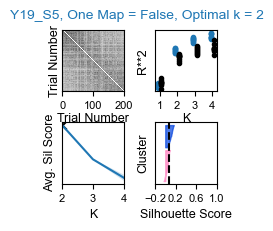

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

In [82]:
''' If you skipped the cell above, only plot Extended Data Fig. 4D. 

Y_unwrapped: matrix of shape m, n; m = n_trials & n = (nposbins * ncells)
W: first factor matrix. Has shape (m, rank) or n_trials, n_clusters (i.e. [0, 1] if map 1 and [1, 0] if map 0)
H: second factor matrix. Has shape (rank, n) or n_clusters, n_obs

Run time is about 5 - 15 minutes per session.

'''
possible_k = np.arange(2, 5, 1)
extended_k = np.arange(1,5,1)
colors = ['xkcd:pink','xkcd:blue','xkcd:orchid','xkcd:azure']
n_reps = 10 
alpha = 0.05

# if you want to visualize the quality of k selection for all sessions vs. just the examples in Extended Data Fig. 4D
#example_mice = mice
#example_sessions = sessions

# if you want to visualize the quality of k selection for only the example sessions in Extended Data Fig. 4D
example_mice = ['Y19']
example_sessions = ['070222_record5']

for m, session in zip(mice, sessions):
    for s in tdqm(session):
        d = data[m][s]
                
        rawdata_file = 'RAW_' + m + '_' + s + '.npy'
        raw = np.load(load_folder + rawdata_file, allow_pickle=True)
        cell_IDs = raw.item().get('cellsfil')
        spatialcell = d['spatialcell99'].astype(bool)
        spatialcells = cell_IDs[spatialcell]     
        
        if (len(spatialcells) > 10) and (m in example_mice) and (s in example_sessions):
            
            Y = d['FRtensor'].copy()
            Y = Y.transpose(0, 2, 1)
            Y_unwrapped = np.reshape(Y, (Y.shape[0], -1))
            
            #Run k-means ten times and choose the k that most frequently most often maximizes the average silhouette score 
            silhouette_avgs = np.zeros((n_reps, len(possible_k)))
            for p in range(n_reps):
                sil_avgs = []
                for n in possible_k:     
                    # fit model and get params
                    model_kmeans = lvl_kmeans(n_components = n, n_restarts = 100)
                    model_kmeans.fit(Y_unwrapped)
                    W, _ = model_kmeans.factors
                    labels = []
                    for t in range(W.shape[0]):
                        mapid = np.where(W[t,:] == 1)[0]
                        labels = np.append(labels, mapid)
                    sil_avgs = np.append(sil_avgs, silhouette_score(Y_unwrapped, labels))
                silhouette_avgs[p,:] = sil_avgs
            
            #compare test R^2 vs. shuffle for k = 1-4
            # Run cross-validated k-means with speckled holdout pattern.
            km_train_scores = np.ones((4, n_reps))
            km_test_scores = np.ones((4, n_reps))

            for i, rank in enumerate(tdqm(extended_k)):
                model = lvl_kmeans(n_components=rank, n_restarts=100, maxiter=1000)
                km_train_scores[i], km_test_scores[i] = \
                    speckled_cv_scores(model, Y_unwrapped, n_repeats=n_reps)

            # Run cross-validated k-means on shuffled/resampled dataset.
            shuff_km_train_scores = np.ones((4, n_reps))
            shuff_km_test_scores = np.ones((4, n_reps))

            for i, rank in enumerate(tdqm(extended_k)):
                model = lvl_kmeans(n_components=rank, n_restarts=100, maxiter=1000)
                shuff_km_train_scores[i], shuff_km_test_scores[i] = \
                    speckled_cv_scores(model, Y_unwrapped, n_repeats=n_reps, resampler=RotationResampler())
            
            #Select optimal k, run KMeans with that k & store results, & plot to confirm quality of results
            if m in RF_aged_mice:
                col = 'C1'
            else:
                col = 'C0'
            
            SilN = possible_k[np.argmax(np.mean(silhouette_avgs, axis = 0))]
            model_kmeans = lvl_kmeans(n_components = SilN, n_restarts = 100)
            model_kmeans.fit(Y_unwrapped)
            W, H = model_kmeans.factors
            Y_hat = model_kmeans.predict()
            score = model_kmeans.score(Y_unwrapped)
            d['kmeans'] = {}
            d['kmeans']['SilN'] = SilN
            d['kmeans']['W'] = W
            d['kmeans']['H'] = H
            d['kmeans']['Y_hat'] = Y_hat 
            d['kmeans']['Y_hat'] = Y_hat 
            d['kmeans']['score'] = score
            
            #check & save whether if sig difference in the distribution of test R^2 real vs. shuffle data at optimal k:
            chosenkidx = np.where(extended_k == SilN)[0]
            res = stats.wilcoxon(km_test_scores[chosenkidx,:][0], shuff_km_test_scores[chosenkidx,:][0], alternative = 'greater')
            onemap = []
            if res.pvalue <= alpha:
                print('outperforms shuffle at optimal k = ' + str(SilN))
                print('stat = ' + str(np.round(res.statistic,2)) + ', p= ' + str(np.round(res.pvalue, 4)))
                onemap = np.append(onemap, [False, res.statistic, res.pvalue])
            else:
                print('does not outperform shuffle, probable one map session')
                print('stat = ' + str(np.round(res.statistic,2)) + ', p= ' + str(np.round(res.pvalue, 4)))
                onemap = np.append(onemap, [True, res.statistic, res.pvalue])

            #save boolean of whether the session was fit well by k > 1 (onemap = False)
            d['kmeans']['onemap'] = onemap
            #onemapfile = 'onemap' + m + '_' + s + '.npy'
            #np.save(save_folder + onemapfile, onemap)
            
            #get map labels & silhouette scores for samples & on average
            labels = []
            for t in range(W.shape[0]):
                mapid = np.where(W[t,:] == 1)[0]
                labels = np.append(labels, mapid)
            silhouette_avg = silhouette_score(Y_unwrapped, labels)
            samp_sil = silhouette_samples(Y_unwrapped, labels)

            ##SHOW GOODNESS OF CHOSEN as in Extended Data Figs. 4A & C
            #Plot silhouette averages + SEM over ten reps. 
            
            fig, ax = plt.subplots(2, 2, figsize = (2,2), sharey = False)
            plt.subplots_adjust(hspace = 0.5, wspace = 0.5)
            fig.suptitle(str(m) + '_S' + str(s[-1]) + ', One Map = ' + str(onemap[0].astype(bool)) + ', Optimal k = ' + str(SilN), color = col, fontsize = 10)

            #plot sparsely labeled sim matrix 
            sim = d['similarity']
            im = ax[0,0].imshow(sim, clim=[0, 1.0], aspect='auto', cmap='Greys', interpolation='none')
            ax[0,0].tick_params(which='major', labelsize=8)
            ax[0,0].set_ylabel('Trial Number', fontsize=9, labelpad=1)
            ax[0,0].set_xlabel('Trial Number', fontsize=9, labelpad=1)
            ax[0,0].set_yticks([])
            ax[0,0].set_xticks([0, 100, 200])
            ax[0,0].tick_params(labelsize = 8)

            #plot test R^2 vs. shuffle
            rax = np.tile(extended_k, (n_reps, 1)).T.ravel()
            ax[0,1].plot(rax-.1, km_test_scores.ravel(), '.', color = col, label = 'Data');
            ax[0,1].plot(rax+.1, shuff_km_test_scores.ravel(), '.k', label = 'Shuffle');
            ax[0,1].set_xticks(extended_k, labels = None)
            ax[0,1].set_ylabel("R**2", fontsize = 9)
            ax[0,1].set_xlabel('K', fontsize=9, labelpad = 1)
            ax[0,1].set_yticks([])
            #ax[0,1].legend(fontsize = 8)
            ax[0,1].tick_params(labelsize = 8)

            #plot of k selection criteria over n reps
            ax[1,0].plot(possible_k, np.mean(silhouette_avgs, axis = 0), color = col)
            ax[1,0].fill_between(possible_k, np.mean(silhouette_avgs, axis = 0) - stats.sem(silhouette_avgs, axis = 0),
                               np.mean(silhouette_avgs, axis = 0) + stats.sem(silhouette_avgs, axis = 0), facecolor = col, alpha = 0.2)
            ax[1,0].scatter(SilN, np.max(np.mean(silhouette_avgs, axis = 0)), color = 'k', marker = 'x')
            ax[1,0].set_xlim([2,4])
            ax[1,0].set_xticks(possible_k, labels = None)
            ax[1,0].set_yticks([])
            ax[1,0].set_ylabel('Avg. Sil Score', fontsize=9)
            ax[1,0].set_xlabel('K', fontsize=9)
            ax[1,0].tick_params(labelsize = 8)

            #plot of k selection criteria over n reps
            ax[1,1].set_xlim([-0.2, 1.0])
            ax[1,1].set_ylim([0, len(Y_unwrapped) + (SilN + 1) * 10])
            y_lower = 10
            for i in range(SilN):
                ith_cluster_silhouette_values = samp_sil[labels == i]
                ith_cluster_silhouette_values.sort()
                size_cluster_i = ith_cluster_silhouette_values.shape[0]
                y_upper = y_lower + size_cluster_i
                color = colors[i]
                ax[1,1].fill_betweenx(np.arange(y_lower, y_upper),0,
                    ith_cluster_silhouette_values,facecolor=color,edgecolor=color,alpha=0.7)
                #ax[1,1].text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))
                y_lower = y_upper + 10  # 10 for the 0 samples
            ax[1,1].set_xlabel("Silhouette Score", fontsize = 9)
            ax[1,1].set_ylabel("Cluster", fontsize = 9)
            ax[1,1].axvline(x=silhouette_avg, color = "k", linestyle="--")
            ax[1,1].set_yticks([]) 
            ax[1,1].set_xticks([-0.2, 0.2, 0.6, 1.0])
            ax[1,1].tick_params(labelsize = 8)

            #plt.tight_layout()
            plt.savefig(save_folder + m + '_' + s + '_S4D.png', dpi=400, bbox_inches='tight')
            plt.savefig(save_folder + m + '_' + s + '_S4D.svg', dpi=400, bbox_inches='tight')
            plt.show()

In [125]:
''' After k optimization, load in results & perform K-means using optimal k. '''

yk = []
ak = []
optimalks = []

for m, session in zip(mice, sessions):    
    for s in session:
        
        d = data[m][s]
        
        rawdata_file = 'RAW_' + m + '_' + s + '.npy'
        behavior_file = 'BEHAVIOR_' + m + '_' + s + '.npy'
        raw = np.load(load_folder + rawdata_file, allow_pickle=True)
        cell_IDs = raw.item().get('cellsfil')
        spatialcell99 = d['spatialcell99']
        spatialcells = cell_IDs[spatialcell99]
        
        if len(spatialcells) > 10:
            
            onemapfile = 'onemap' + m + '_' + s + '.npy'
            onemap = np.load(save_folder + onemapfile)
            
            if onemap[0].astype(bool) == True:
                
                d['kmeans'] = {}
                d['kmeans']['onemap'] = onemap 
                
                optimalks = np.append(optimalks, 1)
                
                if m in RF_aged_mice:
                    ak = np.append(ak, 1)
                else:
                    yk = np.append(yk, 1)
                    
                #Print Source Data of Extended Data Fig. 4e (left)
                #print(str(m) + ',' + str(s[-1]) + ',' + str(1))
            
            else:
        
                d['kmeans'] = {}
                d['kmeans']['onemap'] = onemap 

                #load optimal k
                SilN_file = 'SilN_' + m + '_' + s + '.npy'
                d['kmeans']['SilN'] = np.load(save_folder + SilN_file)
                SilN = d['kmeans']['SilN']
                
                optimalks = np.append(optimalks, SilN)
            
                if m in RF_aged_mice:
                    ak = np.append(ak, SilN)
                else:
                    yk = np.append(yk, SilN)
                
                #load FR tensor
                Y = d['FRtensor'].copy()
                Y = Y.transpose(0, 2, 1)
                Y_unwrapped = np.reshape(Y, (Y.shape[0], -1))
                
                #run k-means
                model_kmeans = lvl_kmeans(n_components = SilN, n_restarts = 100)
                model_kmeans.fit(Y_unwrapped)
                W, H = model_kmeans.factors
                Y_hat = model_kmeans.predict()
                score = model_kmeans.score(Y_unwrapped)
                d['kmeans']['W'] = W
                d['kmeans']['H'] = H
                d['kmeans']['Y_hat'] = Y_hat 
                d['kmeans']['Y_hat'] = Y_hat 
                d['kmeans']['score'] = score
                
                #Print Source Data of Extended Data Fig. 4e (left)
                #print(str(m) + ',' + str(s[-1]) + ',' + str(SilN))

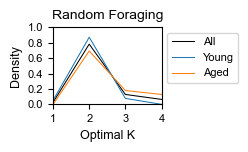


Optimal K KS:
A vs. Y CDF: Stat 0.23076923076923078, p=0.2523132628680452, sign=-1, loc=2.0


In [120]:
''' Plot Extended Data Fig. 4E (left) & Compare Distributions of RF Optimal K'''
kbins = np.arange(1,5,1)
fig, ax = plt.subplots(figsize = (1.4,1))

allk, bin_edges = np.histogram(optimalks, bins = [1,2,3,4,5])
pdf = allk / sum(allk)
ax.plot(kbins, pdf, '-', linewidth = 0.75, alpha = 1, color = 'k', label = 'All')

y, bin_edges = np.histogram(yk, bins = [1,2,3,4,5])
pdf = y / sum(y)
ax.plot(kbins, pdf, '-', linewidth = 0.75, alpha = 1, color = 'C0', label = 'Young')

a, bin_edges = np.histogram(ak, bins = [1,2,3,4,5])
pdf = a / sum(a)
ax.plot(kbins, pdf, '-', linewidth = 0.75, alpha = 1, color = 'C1', label = 'Aged')
ax.tick_params(labelsize = 8)

plt.title('Random Foraging', fontsize = 10)
plt.ylabel('Density', fontsize = 9)
plt.xlabel('Optimal K', fontsize = 9)
plt.xlim([1,4])
plt.xticks([1,2,3,4])
plt.yticks([0,0.2,0.4,0.6,0.8,1.0])
plt.ylim([0,1])

ax.legend(bbox_to_anchor = (1,1), fontsize = 8)
plt.savefig(save_folder + 'S4E.png', dpi=400, bbox_inches='tight')
plt.savefig(save_folder + 'S4E.svg', dpi=400, bbox_inches='tight')
plt.show()

#run KS on optimal k distributions
print('\nOptimal K KS:')
res = stats.ks_2samp(ak,yk, alternative = 'two-sided')
stat = res.statistic; p_value = res.pvalue; loc = res.statistic_location; sign = res.statistic_sign
print('A vs. Y CDF: Stat ' + str(stat) + ', p=' + str(p_value) + ', sign=' + str(sign) + ', loc=' + str(loc))

In [124]:
''' Compare Age Group Remapping Frequency Using Optimal K'''

#get remap indices
MIN_TRIALS = 5 # minimum number of trials for something to be considered a map (should be odd)
near_N = MIN_TRIALS//2
trial_min = 2*near_N + 1

for m, session in zip(mice, sessions):
    for s in session:
        d = data[m][s]
        
        rawdata_file = 'RAW_' + m + '_' + s + '.npy'
        raw = np.load(load_folder + rawdata_file, allow_pickle=True)
        cell_IDs = raw.item().get('cellsfil')
        spatialcell99 = d['spatialcell99']
        spatialcells = cell_IDs[spatialcell99]
        
        if len(spatialcells) > 10: 
            onemap = d['kmeans']['onemap']
            
            if onemap[0].astype(bool) == False:
                W = d['kmeans']['W']
                trials = np.arange(0, W.shape[0]-1)

                # define remaps
                remap_idx = np.where(np.abs(np.diff(W[:, 0])))[0]

                # define stable
                for i in range(near_N):
                    if i == 0:
                        near_remaps = np.append(remap_idx, remap_idx+(i+1))
                    elif i < near_N:
                        near_remaps = np.append(np.append(near_remaps, remap_idx-i), remap_idx+(i+1))
                near_remaps = np.sort(near_remaps)
                stable_idx = np.setdiff1d(trials, near_remaps)

                # keep only remaps at least 5 trials from last remap (stable trials should by definition fit this bill)
                boundary_trials = np.insert(remap_idx, 0, 0)
                remap_idx = np.setdiff1d(remap_idx, remap_idx[np.diff(boundary_trials) < trial_min])

                # save remap vs. stable indices
                d['remap_idx'] = [stable_idx, remap_idx]  
        
#get remap frequency
sfreqremaps = []
ysesh = []
agesesh = []

count = -1

for m, session in zip(mice, sessions):
    for s in session:
        d = data[m][s]
        rawdata_file = 'RAW_' + m + '_' + s + '.npy'
        raw = np.load(load_folder + rawdata_file, allow_pickle=True)
        cell_IDs = raw.item().get('cellsfil')
        spatialcell99 = d['spatialcell99']
        spatialcells = cell_IDs[spatialcell99]
        
        if len(spatialcells) > 10: 
            onemap = d['kmeans']['onemap']
            
            if onemap[0].astype(bool) == False:
                W = d['kmeans']['W']
                trials = np.arange(0, W.shape[0]-1)
                remap_idx = d['remap_idx'][1]
                sfreqremaps = np.append(sfreqremaps, remap_idx.shape[0]/len(trials))

                count +=1
                if m in RF_aged_mice:
                    agesesh = np.append(agesesh, count)
                else:
                    ysesh = np.append(ysesh, count)
                    
                #Print Extended Data Fig. 4h Source Data
                #print(str(m) + ',' + str(s[-1]) + ',' + str(remap_idx.shape[0]/len(trials)))
                
            else:
                sfreqremaps = np.append(sfreqremaps, np.nan)  
        else: 
                sfreqremaps = np.append(sfreqremaps, np.nan)

In [122]:
''' Get corrected indices for plotting'''
nan_idx10 = np.where((np.isnan(sfreqremaps) == True))[0]

# Adjust y_sind, ma_sind, age_sind for subsequent plots
y_sind10 = np.setdiff1d(y_sind, nan_idx10)
age_sind10 = np.setdiff1d(age_sind, nan_idx10)

# Adjust colormaps for grid plots
yidx = []
aidx = []
for i in nan_idx10:
    yidx = np.append(yidx, np.where(y_sind == i)[0].astype(int))
    aidx = np.append(aidx, np.where(age_sind == i)[0].astype(int)) 

col_session_young10 = np.delete(col_session_young, list(yidx.astype(int)), axis = 0)
col_session_old10 = np.delete(col_session_old, list(aidx.astype(int)), axis = 0)
col_session10 = [col_session_young10, col_session_old10] 

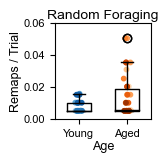

In [78]:
''' Plot Extended Data Fig. 4H '''

fig, ax = plt.subplots(1,1, figsize = (1.25,1.25), sharey = False)
labels = ['Young','Aged']
w = 0.5
#fig.suptitle('Spatial Cell Network Remap Frequency, Pooled by Age Group', fontsize=12)

slocstab5_tog = [sfreqremaps[y_sind10], sfreqremaps[age_sind10]]
ax.boxplot(slocstab5_tog, widths = w, labels = labels, medianprops = dict(color = 'black'))
ax.set_title('Random Foraging', fontsize=10, pad=3)
ax.set_xlabel('Age', fontsize=9, labelpad=1)
ax.set_ylabel('Remaps / Trial', fontsize=9, labelpad=1)
ax.tick_params(labelsize = 8)
ax.set_ylim([0,0.06])

for i in range(len(slocstab5_tog)):
    y = slocstab5_tog[i]
    x = np.random.normal(i + 1, 0.04, len(y))
    ax.scatter(x, y, color = col_session10[i], edgecolors = col_session10[i], alpha = 1, s = 10)

plt.savefig(save_folder + 'S4H.png', dpi=400, bbox_inches='tight')
plt.savefig(save_folder + 'S4H.svg', dpi=400, bbox_inches='tight')
plt.show()

In [79]:
''' Statistics of Remapping Frequency by Age Group during Random Foraging '''

print('Remapping Frequency RESULTS:')
print('freqremapyoung ± SEM; freqremapstab_old ± SEM')
print(str(np.round(np.mean(sfreqremaps[y_sind10]), 4)) + ' ± ' + str(np.round(stats.sem(sfreqremaps[y_sind10]), 4)) + ' ; ' 
      + str(np.round(np.nanmean(sfreqremaps[age_sind10]), 4)) + ' ± ' + str(np.round(stats.sem(sfreqremaps[age_sind10]), 4)))

stat, p_diff = stats.ranksums(sfreqremaps[y_sind10],sfreqremaps[age_sind10])
print('stat ' + str(stat))
print('p_session = ' + str(p_diff))

Remapping Frequency RESULTS:
freqremapyoung ± SEM; freqremapstab_old ± SEM
0.0082 ± 0.0006 ; 0.0137 ± 0.0021
stat -0.8778460772226392
p_session = 0.3800272553505539


# Re-label K-Means maps non-arbitrarily & examine alignment across vs. within map similarity.

In [80]:
''' Re-label RF spatial maps non-arbitrarily (slower map is map 0) '''

#save remap index in correct format
for m, session in zip(mice, sessions):
    for i, s in enumerate(session):
        d = data[m][s]
        
        rawdata_file = 'RAW_' + m + '_' + s + '.npy'
        behavior_file = 'BEHAVIOR_' + m + '_' + s + '.npy'
        raw = np.load(load_folder + rawdata_file, allow_pickle=True)
        cell_IDs = raw.item().get('cellsfil')
        spatialcell99 = d['spatialcell99']
        spatialcells = cell_IDs[spatialcell99]
        
        if len(spatialcells) > 10: 
            
            onemap = d['kmeans']['onemap']
            
            if onemap[0].astype(bool) == False:
                W = d['kmeans']['W']
                trials = np.arange(0, W.shape[0]-1)

                # define remaps
                remap_idx = np.asarray([])
                for w in range(W.shape[1]):
                    remaps = np.where(np.abs(np.diff(W[:, w])))[0]
                    remap_idx = np.append(remap_idx, remaps)
                remap_idx = np.unique(remap_idx)
                d['remap_idx'] = remap_idx.astype(int)

for m, session in zip(mice, sessions):
    
    if m in cohortb_mice:
        max_trials = 240
    else:
        max_trials = 200
    
    for s in tdqm(session):
        d = data[m][s]
        
        rawdata_file = 'RAW_' + m + '_' + s + '.npy'
        behavior_file = 'BEHAVIOR_' + m + '_' + s + '.npy'
        
        raw = np.load(load_folder + rawdata_file, allow_pickle=True)
        behaviorfil = np.load(load_folder + behavior_file, allow_pickle=False)

        cell_IDs = raw.item().get('cellsfil')
        posx = behaviorfil[:,0]
        speed = behaviorfil[:,1]
        trial = behaviorfil[:,2]
        rawtrialfil = raw.item().get('trialfil')
        spatialcell99 = d['spatialcell99']
        spatialcells = cell_IDs[spatialcell99]
        
        #Find any skipped trials
        try:
            _ = raw.item().get('correctedtrial').shape
            skippedtrials = get.find_skipped(trial, max_trial_num = max_trials)
            
        except:
            skippedtrials = []
        
        if np.max(np.unique(trial)) < 160: #handles truncated, shorter sessions 
            alltrial = np.arange(0, np.max(np.unique(trial)) + 1, 1)
        else:
            alltrial = np.arange(0,max_trials,1)
        trials = np.unique(trial)
        
        #count number of skipped dark trials
        ndarkskipped = 0
        for z in skippedtrials:
            if z < 20: 
                ndarkskipped += 1
                
        #adjust trialfil so that trials are skipped instead
        skippedrawtrialfil = get.sortedtrialbyframe(rawtrialfil, trial, skippedtrials)
            
        #define random foraging trials only, excluding dark & gain change periods
        if m == 'Y9':
            start_idx = 0 
            end_idx = len(skippedrawtrialfil) + 1
        elif m in cohortb_mice:
            start_idx = (np.where(skippedrawtrialfil >= 20)[0][0]).astype(int)
            end_idx = (np.where(skippedrawtrialfil >= 200)[0][0]).astype(int)
        else:
            start_idx = 0 
            end_idx = len(skippedrawtrialfil) + 1
        
        if len(spatialcells) > 10: 
            onemap = d['kmeans']['onemap']
            if onemap[0].astype(bool) == False:
                SilN = d['kmeans']['SilN']
                if SilN == 2:
                    W = d['kmeans']['W']
                    H = d['kmeans']['H']

                    # get map indices
                    map_idx = W[:, 0].astype(bool)
                    trials = skippedrawtrialfil[start_idx:end_idx]
                    map0_idx = np.zeros_like(trials)
                    map1_idx = np.zeros_like(trials)
                    for i, t in enumerate(np.unique(trials)):
                        if map_idx[i]:
                            map0_idx[trials == t] = 1
                        else:
                            map1_idx[trials == t] = 1
                    map0_idx = map0_idx.astype(bool)
                    map1_idx = map1_idx.astype(bool)

                    # get running speed in each map and assign map 0 to slower map
                    RFspeed = speed[start_idx:end_idx]
                    speed_0 = np.nanmean(RFspeed[map0_idx])
                    speed_1 = np.nanmean(RFspeed[map1_idx])

                    if speed_1 < speed_0: # swap labels
                        d['map0_idx'] = 1
                    else:
                        d['map0_idx'] = 0

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

mouse A13
session 1, k = 3


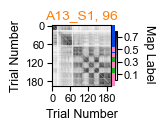

mouse A4
session 5, k = 2


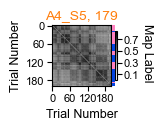

mouse A5
session 5, k = 4


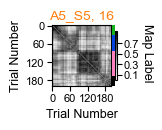

mouse Y11
session 4, k = 3


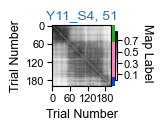

mouse Y16
session 3, k = 2


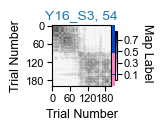

In [81]:
''' Check out how well map labels capture structure in the grid similarity network matrices (Plot Panels of Extended Data Fig. 4F)

Notes:
1. In the figure panel, we retained the left y-axis label and tick labels and the right y-axis label only on the first panel. 
2. In the figure panel, we retained the colorbar only on the last matrix.
3. In the first panel, the right y-axis label was moved closer to the matrix in Illustrator after removing the colorbar. 
4. Plotting is done this way to ensure that all matrices are equally sized.

'''
# if you want to assess map labeling for all sessions and plot all grid network firing similarity as in Extended Data Fig. 4F:
#example_mice = mice
#example_sessions = sessions
#ex_sesh_only = False

# if you want to assess map labeling for & plot only the example sessions in Extended Data Fig. 4F:
example_mice = ['Y16', 'A4', 'Y11','A13','A5']
example_sessions = ['062222_record3','0126_record5','050822_record4','050522_record1','0405_record5']
ex_sesh_only = True
all_colors = ['xkcd:pink','xkcd:blue','xkcd:green','xkcd:black']
CLU_W = 3


for m, session in zip(mice, sessions):
    
    for s in session:
        d = data[m][s]

        rawdata_file = 'RAW_' + m + '_' + s + '.npy'
        behavior_file = 'BEHAVIOR_' + m + '_' + s + '.npy'
        raw = np.load(load_folder + rawdata_file, allow_pickle=True)
        behaviorfil = np.load(load_folder + behavior_file, allow_pickle=False)
        
        cell_IDs = raw.item().get('cellsfil')
        spatialcell99 = d['spatialcell99']
        spatialcells = cell_IDs[spatialcell99]
    
        posx = behaviorfil[:,0]
        trial = behaviorfil[:,2]
        rawtrialfil = raw.item().get('trialfil')  
        
        if m in RF_aged_mice:
            col = 'C1'
        else:
            col = 'C0'
            
        mousename = str(m)

        if len(spatialcells) > 10 and (m in example_mice):
            
            if ((s == example_sessions[np.where(np.array(example_mice) == mousename)[0][0]]) and (ex_sesh_only == True)) | ((s in example_sessions) and (ex_sesh_only == False)):
                SilN = d['kmeans']['SilN']    
                print('mouse ' + m + '\nsession ' + s[-1] + ', k = ' + str(SilN))
            else:
                continue 
                
            if (d['kmeans']['onemap'][0] == False):

                fig = plt.figure(figsize = (1.0,0.83))
                gs = gridspec.GridSpec(21, 21, figure=fig)

                # plot Euclidean similarity score
                ax1 = fig.add_subplot(gs[1:, :-1])
                sim = d['similarity']
                im = ax1.imshow(sim, aspect='auto', cmap='Greys')
                ax1.tick_params(labelleft=True)
                ax1.tick_params(labelbottom=True)
                ax1.set_xticks(ticks = [0,60,120,180])
                ax1.set_yticks(ticks = [0,60,120,180])
                ax1.set_xlabel('Trial Number', labelpad = 3, fontsize = 9)
                ax1.set_ylabel('Trial Number', labelpad = 3, fontsize = 9)
                ax1.set_title(m + '_S' + s[-1] + ', ' + str(len(spatialcells)), fontsize=10, pad=5, color = col) 
                ax1.tick_params('both', which='both', labelsize=8, pad=2)
                ax1.text(300,175,'Map Label', rotation = 270, fontsize = 9)

                #colorbar
                cbar = fig.colorbar(im, shrink=0.8, ticks=np.arange(0.1, 0.8, 0.2))
                cbar.ax.tick_params(labelsize=8, pad=1)

                # k-means cluster labels
                ax2 = fig.add_subplot(gs[1:, 16]) #clu label
                                # k-means cluster labels
                remap_idx = d['remap_idx']
                W = d['kmeans']['W'].copy()
                start_idx = np.append([0], remap_idx)
                end_idx = np.append(remap_idx, W.shape[0])
                map_colors = []
                for i in np.where(W[remap_idx, :])[1]:
                    map_colors.append(all_colors[i])
                map_colors.append(all_colors[np.where(W[-1, :])[0][0]])
                ax2.vlines(np.full(start_idx.shape[0], 1), start_idx, end_idx, 
                           colors=map_colors, lw=np.full(start_idx.shape[0], CLU_W), linestyles=np.full(start_idx.shape[0], 'solid'))
                ax2.set_xlim([0.5, 1.5])
                ax2.set_ylim([W.shape[0], 0])
                plt.axis('off')    

                fig.savefig(save_folder + m + '_' + s + '_S4F.png', dpi=400, bbox_inches='tight')
                fig.savefig(save_folder + m + '_' + s + '_S4F.svg', dpi=400, bbox_inches='tight')
                plt.show()